<a href="https://colab.research.google.com/github/yingzibu/a_inhibitor_design/blob/main/examples/experiments/selfies_dataset_chemVAE_beta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!rm -R 'a_inhibitor_design'
! git clone https://github.com/yingzibu/a_inhibitor_design.git --quiet
!rm -R 'JAK_ML'
! git clone https://github.com/yingzibu/JAK_ML.git --quiet
!rm -R 'JAK-MTATFP'
! git clone https://github.com/Yimeng-Wang/JAK-MTATFP.git --quiet

rm: cannot remove 'a_inhibitor_design': No such file or directory
rm: cannot remove 'JAK_ML': No such file or directory
rm: cannot remove 'JAK-MTATFP': No such file or directory


In [2]:
! pip install pubchempy --quiet
! pip install rdkit --quiet
! pip install selfies --quiet

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.7/29.7 MB 45.5 MB/s eta 0:00:00


In [ ]:
from tqdm import tqdm
import pandas as pd
from os import walk

In [3]:
data_path_CoGT = '/content/JAK_ML/new_data/'


files = next(walk(data_path_CoGT), [None, None, []])[2]
all_smiles_list = []
for f in files:
    data_name = data_path_CoGT + f
    data = pd.read_csv(data_name)
    all_smiles_list.extend(data['Smiles'].values.tolist())
    print(len(all_smiles_list))

data_path_MTATFP = '/content/JAK-MTATFP/Data/'
files = next(walk(data_path_MTATFP), [None, None, []])[2]

for f in files:
    data_name = data_path_MTATFP + f
    if data_name.split('.')[-1] == 'csv':
        data = pd.read_csv(data_name)
        assert 'SMILES' in data.columns
        all_smiles_list.extend(data['SMILES'].values.tolist())
        print(len(all_smiles_list))

smiles_no_repeat = [*set(all_smiles_list)]
print('all smiles no duplicates: ', len(smiles_no_repeat))

7722
10146
17519
27680
27718
27870
38693
40222
40255
41799
all smiles no duplicates:  21219


In [9]:
cd a_inhibitor_design/data/

/content/a_inhibitor_design/data


In [11]:
from tokenizer_selfies import SmilesToSelfies, SelfiesToDataset

selfies_df = SmilesToSelfies(smiles_no_repeat)
print(selfies_df.head())
print(selfies_df.shape)

100%|██████████| 21219/21219 [00:21<00:00, 1004.90it/s]

                                             Selfies
0  [C][C][C][=C][C][=Branch2][Branch1][Branch2][=...
1  [C][P][Branch1][C][C][=Branch1][C][=O][C][=C][...
2  [C][C][N][Branch2][Ring1][#Branch2][C][C][C][R...
3  [O][=C][NH1][C][=C][C][=C][Branch2][Ring1][Bra...
4  [C][=C][Branch1][C][C][C][=Branch1][C][=O][N][...
(21219, 1)


In [ ]:
selfies_df

In [12]:
MAX_LEN = 120
print('define the max len of dataset')
dict_ = SelfiesToDataset(selfies_df, max_len=MAX_LEN, savename='test.pt')
a = selfies_df['Selfies'].tolist()

define the max len of dataset
max len in dataset: 387
current defined max len:  120 < 387
delete long selfies
delete # 11
len alphabet:  66


100%|██████████| 21208/21208 [00:08<00:00, 2476.51it/s]


dataset saved at: /content/a_inhibitor_design/data/test.pt


In [14]:
import pickle
with open('/content/drive/MyDrive/A_MODEL/chemVAE_M1/test.pkl', 'wb') as f:
    pickle.dump(dict_, f)

In [15]:
dict_.keys()

dict_keys(['labels', 'one_hots', 'alphabet'])

In [ ]:
import selfies as sf
# alphabet = sf.get_alphabet_from_selfies(a)
# alphabet.add("[nop]")
# alphabet.add('.')
# len(alphabet)
# alphabet = list(sorted(alphabet))
# print('len alphabet: ', len(alphabet))
with open('/content/drive/MyDrive/A_MODEL/chemVAE_M1/test.pkl', 'rb') as f:
    a = pickle.load(f)

len alphabet:  66


In [ ]:
# lens = [sf.len_selfies(s) for s in selfies_df.values()]

In [ ]:

# import torch
# from tqdm import tqdm
# import os

# dict_ = SelfiesToDataset(selfies_df, max_len=120, savename='test.pt')
# import pickle

In [17]:
a.keys()

dict_keys(['labels', 'one_hots', 'alphabet'])

In [64]:
with open('/content/drive/MyDrive/A_MODEL/chemVAE_M1_8_20/alphabet,pkl', 'wb') as f:
    pickle.dump(a['alphabet'], f)

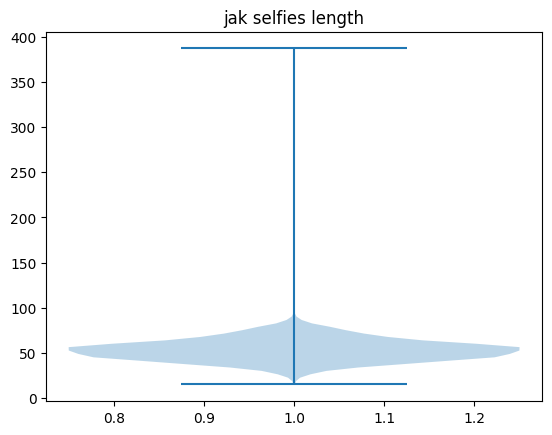

previous chembl total compound:  21219
mean +/- std tokens : 53.276 +/- 12.673


In [25]:
import matplotlib.pyplot as plt
import numpy as np
import selfies as sf
lens = [sf.len_selfies(s) for s in selfies_df['Selfies'].tolist()]


np.random.seed(10)

fig = plt.figure()

bp = plt.violinplot(lens)
plt.title('jak selfies length')
plt.show()

print('previous chembl total compound: ', len(lens))
print(f'mean +/- std tokens : {np.mean(lens):.3f} +/- {np.std(lens):.3f}')

In [ ]:
len(lens)

21219

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import os

class MolecularVAE(nn.Module):
    def __init__(self, in_dim, z_dim=292):
        """
        param: in_dim = [batch_size, max_len, len(alphabet)]
        param: z_dim: z dimension
        """

        super(MolecularVAE, self).__init__()

        (_, max_len, alphabet_len) = in_dim
        # self.in_dim = in_dim
        self.max_len = max_len
        self.alphabet_len = alphabet_len
        self.kld = 0

        self.conv_1 = nn.Conv1d(max_len, 9, kernel_size = 9) #[bs, 9, nchar-8]
        self.conv_2 = nn.Conv1d(9, 9, kernel_size=9) # [bs, 9, nchar-16] -8
        self.conv_3 = nn.Conv1d(9, 10, kernel_size=11) # [bs, 10, nchar-26] -10
        self.linear_0 = nn.Linear(10*(alphabet_len - 26), 435)
        self.mu = nn.Linear(435, z_dim)
        self.logvar = nn.Linear(435, z_dim)

        self.linear_3 = nn.Linear(z_dim, z_dim)
        self.gru = nn.GRU(z_dim, 501, 3, batch_first=True)
        self.linear_4 = nn.Linear(501, alphabet_len)

        self.relu = nn.ReLU()
        self.softmax = nn.Softmax()


    def encode(self, x):

        x = self.relu(self.conv_1(x))
        x = self.relu(self.conv_2(x))
        x = self.relu(self.conv_3(x))
        x = x.view(x.size(0), -1) # (batch_size, size(-2) * size(-1))
        # print('after view', x.shape)
        x = F.selu(self.linear_0(x))

        mu = self.mu(x)
        logvar = F.softplus(self.logvar(x))
        return mu, logvar

    def reparametrize(self, mu, logvar):
        epsilon = Variable(torch.rand(mu.size()), requires_grad=False)
        if mu.is_cuda: epsilon = epsilon.cuda()
        std = logvar.mul(0.5).exp_()
        z = mu.addcmul(std, epsilon)
        return z

    def decode(self, z):
        z = F.selu(self.linear_3(z))
        z = z.view(z.size(0), 1, z.size(-1)).repeat(1, self.max_len, 1)
        output, hn = self.gru(z)
        out_reshape = output.contiguous().view(-1, output.size(-1))
        y0 = F.softmax(self.linear_4(out_reshape), dim=1)
        y = y0.contiguous().view(output.size(0), -1, y0.size(-1))
        return y

    def update_kld(self, mu, logvar):
        self.kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    def get_kld(self):
        return self.kld

    def forward(self, x):
        mu, logvar = self.encode(x)
        self.update_kld(mu, logvar)
        z = self.reparametrize(mu, logvar)
        return self.decode(z)


In [27]:
total = a['one_hots'].shape[0]

data_train = a['one_hots'][:int(total*0.8)]
data_valid = a['one_hots'][int(total*0.8):int(total*0.9)]
data_test = a['one_hots'][int(total*0.9):]
print(data_train.shape, data_valid.shape, data_test.shape)

torch.Size([16966, 120, 66]) torch.Size([2121, 120, 66]) torch.Size([2121, 120, 66])


In [28]:
from torch.utils.data import DataLoader
batch_size = 64
train_loader = DataLoader(data_train, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(data_valid, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(data_test, batch_size=batch_size, shuffle=True)

In [31]:
cd ..

/content/a_inhibitor_design


In [32]:
from model.evaluate_utils import get_min, plot_loss, plot_kld
model_path = 'model_files_beta/'
os.mkdir(model_path)

In [33]:
import torch.optim as optim
assert MAX_LEN == data_train.shape[1]
assert len(a['alphabet']) == data_train.shape[2]

in_dim = [batch_size, data_train.shape[1], data_train.shape[2]]

cuda = torch.cuda.is_available()
if cuda: device = 'cuda'
else: device = 'cpu'

model = MolecularVAE(in_dim).to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-3, betas=(0.9, 0.999))
optimizer = optim.AdamW(params=model.parameters(), lr=1e-3, weight_decay=1e-2)


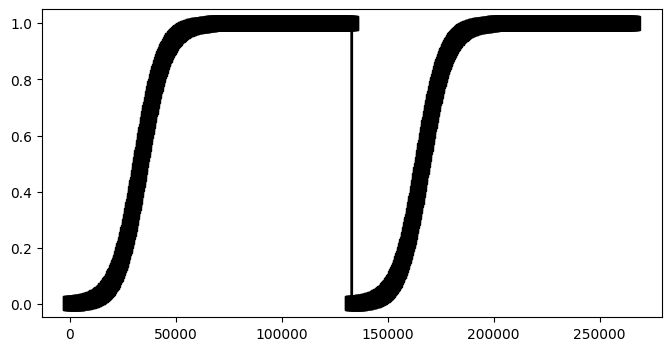

In [40]:
import numpy as np
import math
import matplotlib.pyplot as plt
import os
def frange_cycle_linear(start, stop, n_epoch, n_cycle=4, ratio=0.5):
    L = np.ones(n_epoch)
    period = n_epoch/n_cycle
    step = (stop-start)/(period*ratio) # linear schedule

    for c in range(n_cycle):

        v , i = start , 0
        while v <= stop and (int(i+c*period) < n_epoch):
            L[int(i+c*period)] = v
            v += step
            i += 1
    return L

def frange_cycle_sigmoid(start, stop, n_epoch, n_cycle=4, ratio=0.5):
    L = np.ones(n_epoch)
    period = n_epoch/n_cycle
    step = (stop-start)/(period*ratio) # step is in [0,1]

    # transform into [-6, 6] for plots: v*12.-6.

    for c in range(n_cycle):

        v , i = start , 0
        while v <= stop:
            L[int(i+c*period)] = 1.0/(1.0+ np.exp(- (v*12.-6.)))
            v += step
            i += 1
    return L


batch_size = batch_size
epochs= 1000
n_epoch = int(len(train_loader)*epochs)

# beta_np_cyc = frange_cycle_linear(0.0, 1.0, n_epoch, 1)
beta_np_cyc = frange_cycle_sigmoid(0.0, 1.0, n_epoch, 2)

fig=plt.figure(figsize=(8,4.0))
stride = max(int(n_epoch / epochs), 1)

plt.plot(range(n_epoch), beta_np_cyc, '-',
         label='Cyclical', marker= 's', color='k',
         markevery=stride,lw=2,  mec='k', mew=1 , markersize=10)


True

In [41]:
def train(epoch, beta_kl=1): # beta_kl = BCE/KLD ok?
    model.train()
    train_loss = 0
    BCE_loss = 0
    KLD_loss = 0
    if isinstance(beta_kl, int): beta = beta_kl
    for i, data in tqdm(enumerate(train_loader), total=len(train_loader),
                        desc=f'epoch {epoch}'):
        data = data.to(device).type(torch.float32)

        optimizer.zero_grad()
        output = model(data)

        BCE = F.binary_cross_entropy(output, data, reduction='sum')
        KLD = model.get_kld()
        if isinstance(beta_kl, int) == False:
            beta = beta_kl[i*epoch]

        loss = BCE + beta * KLD

        loss.backward()
        optimizer.step()

        train_loss += loss.data.item()
        BCE_loss += BCE.data.item()
        KLD_loss += KLD.data.item()

    train_loss /= len(train_loader)
    BCE_loss /= len(train_loader)
    KLD_loss /= len(train_loader)
    KLD_percent = KLD_loss/ (KLD_loss + BCE_loss)
    print(f'[train] loss: {train_loss:.3f}, BCE: {BCE_loss:.3f}, '
          f'KLD: {KLD_loss:.3f}, KLD/(KLD+BCE): {KLD_percent*100:.3f}%',
          f'beta:{beta:.2f}')

    return train_loss, BCE_loss, KLD_loss, KLD_percent

def test(epoch, test_loader=test_loader):
    model.eval()
    test_loss = 0
    BCE_loss = 0
    KLD_loss = 0
    for data in test_loader:
        data = data.to(device).type(torch.float32)
        output = model(data)
        BCE = F.binary_cross_entropy(output, data,
                                      reduction='sum').data.item()
        KLD = model.get_kld().data.item()

        test_loss += BCE + KLD
        BCE_loss += BCE
        KLD_loss += KLD
    test_loss /= len(test_loader)
    BCE_loss /= len(test_loader)
    KLD_loss /= len(test_loader)
    KLD_percent = KLD_loss / test_loss
    print(f'[valid] loss: {test_loss:.3f}, BCE: {BCE_loss:.3f}, '
          f'KLD: {KLD_loss:.3f}, KLD/loss: {KLD_percent*100:.3f}%')
    return test_loss, BCE_loss, KLD_loss, KLD_percent



In [42]:
train_dict, valid_dict = {}, {}
train_kld, valid_kld = {}, {}
epochs = 1000
model_path = 'model_files_beta/'
model_saved_names = []
argmin_epoch = -1
optimizer = optim.AdamW(params=model.parameters(), lr=1e-4, weight_decay=1e-3)


epoch 15: 100%|██████████| 266/266 [00:26<00:00,  9.87it/s]


[train] loss: 10995.326, BCE: 10970.227, KLD: 6964.194, KLD/(KLD+BCE): 38.831% beta:0.01
[valid] loss: 17693.220, BCE: 11018.254, KLD: 6674.966, KLD/loss: 37.726%


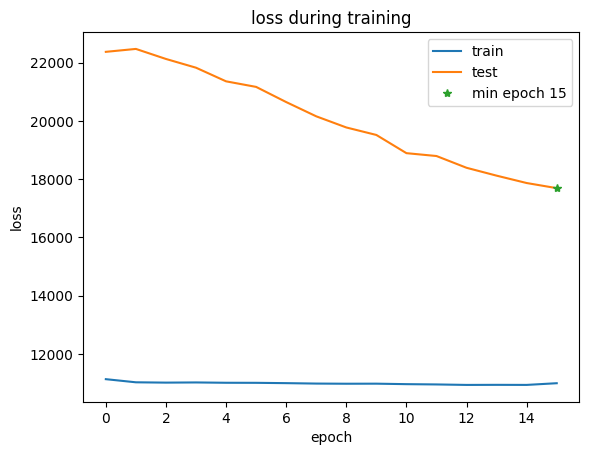

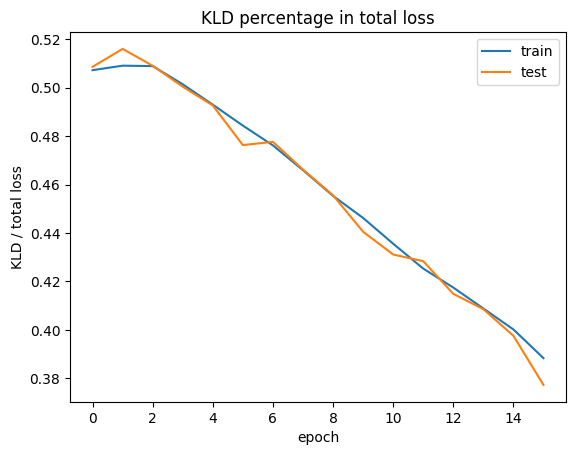

model save at:  model_files_beta/ckpt_15.pt


epoch 16: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10926.194, BCE: 10901.361, KLD: 6712.949, KLD/(KLD+BCE): 38.111% beta:0.01
[valid] loss: 17256.093, BCE: 10723.695, KLD: 6532.398, KLD/loss: 37.856%
model save at:  model_files_beta/ckpt_16.pt


epoch 17: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10910.207, BCE: 10885.451, KLD: 6517.318, KLD/(KLD+BCE): 37.450% beta:0.01
[valid] loss: 17154.762, BCE: 10831.345, KLD: 6323.417, KLD/loss: 36.861%
model save at:  model_files_beta/ckpt_17.pt


epoch 18: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10919.568, BCE: 10894.793, KLD: 6331.638, KLD/(KLD+BCE): 36.755% beta:0.01
[valid] loss: 17379.094, BCE: 11114.132, KLD: 6264.962, KLD/loss: 36.049%


epoch 19: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10922.272, BCE: 10898.271, KLD: 6014.356, KLD/(KLD+BCE): 35.561% beta:0.01
[valid] loss: 16950.166, BCE: 10984.890, KLD: 5965.276, KLD/loss: 35.193%
model save at:  model_files_beta/ckpt_19.pt


epoch 20: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10899.626, BCE: 10875.040, KLD: 5896.918, KLD/(KLD+BCE): 35.159% beta:0.01
[valid] loss: 16535.178, BCE: 10733.563, KLD: 5801.616, KLD/loss: 35.087%


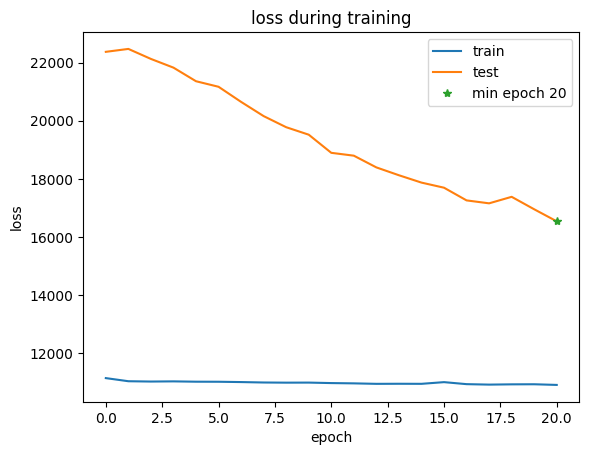

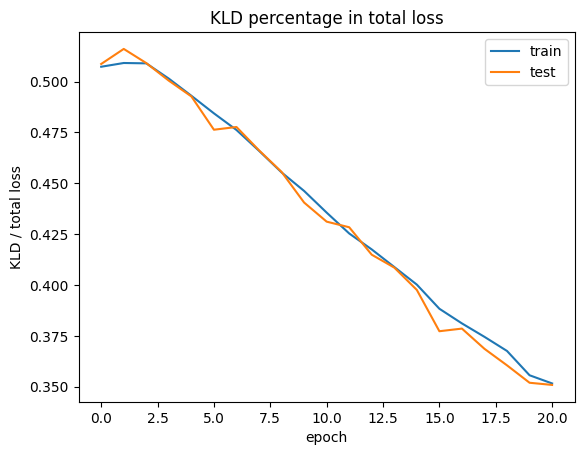

model save at:  model_files_beta/ckpt_20.pt


epoch 21: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10899.368, BCE: 10875.159, KLD: 5717.036, KLD/(KLD+BCE): 34.456% beta:0.01
[valid] loss: 16300.821, BCE: 10697.431, KLD: 5603.390, KLD/loss: 34.375%
model save at:  model_files_beta/ckpt_21.pt


epoch 22: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10902.664, BCE: 10878.791, KLD: 5525.293, KLD/(KLD+BCE): 33.682% beta:0.01
[valid] loss: 16042.416, BCE: 10690.192, KLD: 5352.224, KLD/loss: 33.363%
model save at:  model_files_beta/ckpt_22.pt
remove  model_files_beta/ckpt_11.pt


epoch 23: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10884.565, BCE: 10860.361, KLD: 5387.846, KLD/(KLD+BCE): 33.160% beta:0.01
[valid] loss: 15880.964, BCE: 10699.952, KLD: 5181.012, KLD/loss: 32.624%
model save at:  model_files_beta/ckpt_23.pt
remove  model_files_beta/ckpt_12.pt


epoch 24: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10884.865, BCE: 10860.353, KLD: 5314.270, KLD/(KLD+BCE): 32.856% beta:0.01
[valid] loss: 16457.290, BCE: 11116.045, KLD: 5341.244, KLD/loss: 32.455%


epoch 25: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10890.521, BCE: 10865.667, KLD: 5216.653, KLD/(KLD+BCE): 32.437% beta:0.01
[valid] loss: 15642.818, BCE: 10697.651, KLD: 4945.167, KLD/loss: 31.613%


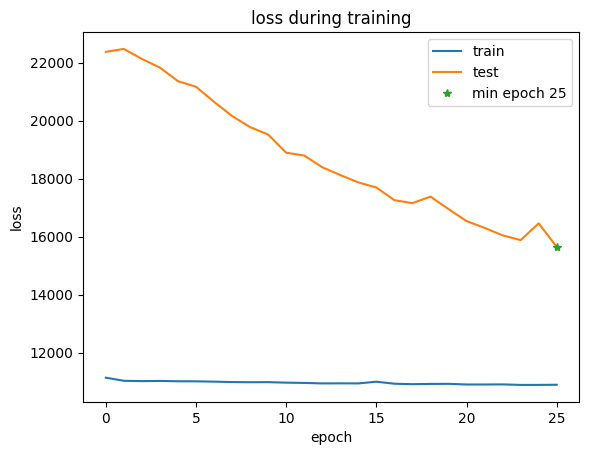

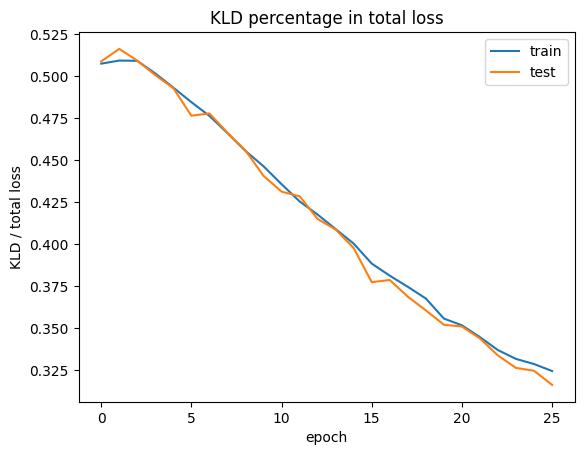

model save at:  model_files_beta/ckpt_25.pt
remove  model_files_beta/ckpt_13.pt


epoch 26: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10879.620, BCE: 10854.969, KLD: 5025.617, KLD/(KLD+BCE): 31.646% beta:0.01
[valid] loss: 15597.495, BCE: 10664.265, KLD: 4933.231, KLD/loss: 31.628%
model save at:  model_files_beta/ckpt_26.pt
remove  model_files_beta/ckpt_14.pt


epoch 27: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10873.586, BCE: 10848.923, KLD: 4925.522, KLD/(KLD+BCE): 31.225% beta:0.01
[valid] loss: 15437.574, BCE: 10669.045, KLD: 4768.529, KLD/loss: 30.889%
model save at:  model_files_beta/ckpt_27.pt
remove  model_files_beta/ckpt_15.pt


epoch 28: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10859.105, BCE: 10833.960, KLD: 4850.261, KLD/(KLD+BCE): 30.924% beta:0.01
[valid] loss: 15431.859, BCE: 10671.506, KLD: 4760.352, KLD/loss: 30.848%
model save at:  model_files_beta/ckpt_28.pt
remove  model_files_beta/ckpt_16.pt


epoch 29: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10861.977, BCE: 10836.248, KLD: 4845.347, KLD/(KLD+BCE): 30.898% beta:0.01
[valid] loss: 15339.012, BCE: 10700.763, KLD: 4638.249, KLD/loss: 30.238%
model save at:  model_files_beta/ckpt_29.pt
remove  model_files_beta/ckpt_17.pt


epoch 30: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10860.448, BCE: 10834.825, KLD: 4719.640, KLD/(KLD+BCE): 30.343% beta:0.01
[valid] loss: 15290.387, BCE: 10791.222, KLD: 4499.165, KLD/loss: 29.425%


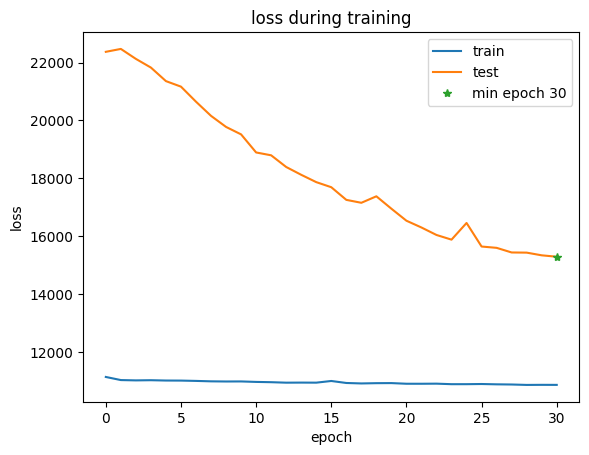

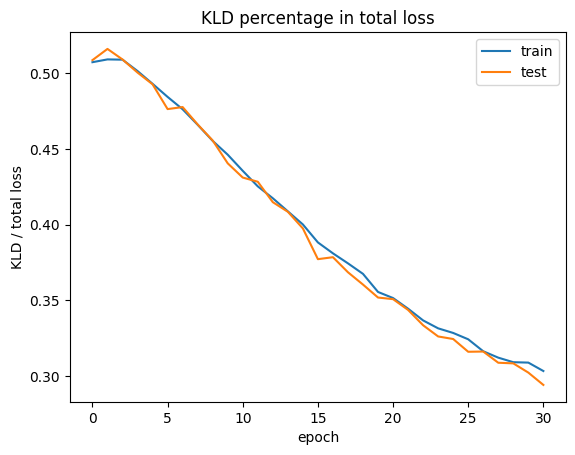

model save at:  model_files_beta/ckpt_30.pt
remove  model_files_beta/ckpt_19.pt


epoch 31: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10865.142, BCE: 10838.833, KLD: 4678.879, KLD/(KLD+BCE): 30.152% beta:0.01
[valid] loss: 15358.098, BCE: 10777.235, KLD: 4580.863, KLD/loss: 29.827%


epoch 32: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10859.054, BCE: 10832.412, KLD: 4597.942, KLD/(KLD+BCE): 29.798% beta:0.01
[valid] loss: 15623.178, BCE: 11065.768, KLD: 4557.410, KLD/loss: 29.171%


epoch 33: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10867.819, BCE: 10841.109, KLD: 4503.702, KLD/(KLD+BCE): 29.350% beta:0.01
[valid] loss: 14954.985, BCE: 10649.705, KLD: 4305.280, KLD/loss: 28.788%
model save at:  model_files_beta/ckpt_33.pt
remove  model_files_beta/ckpt_20.pt


epoch 34: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10850.213, BCE: 10823.315, KLD: 4417.690, KLD/(KLD+BCE): 28.986% beta:0.01
[valid] loss: 15420.698, BCE: 11014.172, KLD: 4406.525, KLD/loss: 28.575%


epoch 35: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10866.032, BCE: 10838.296, KLD: 4367.873, KLD/(KLD+BCE): 28.724% beta:0.01
[valid] loss: 14820.803, BCE: 10680.689, KLD: 4140.114, KLD/loss: 27.934%


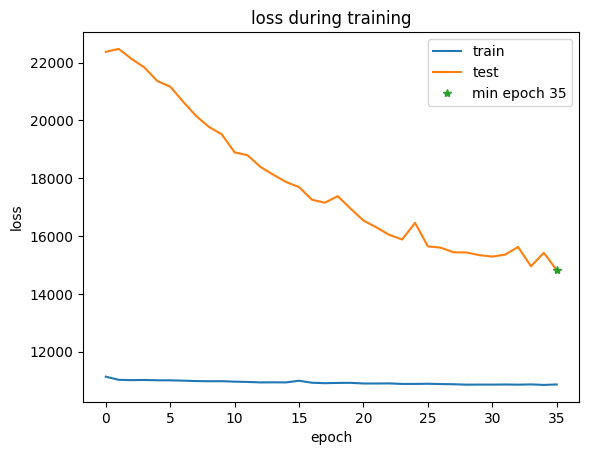

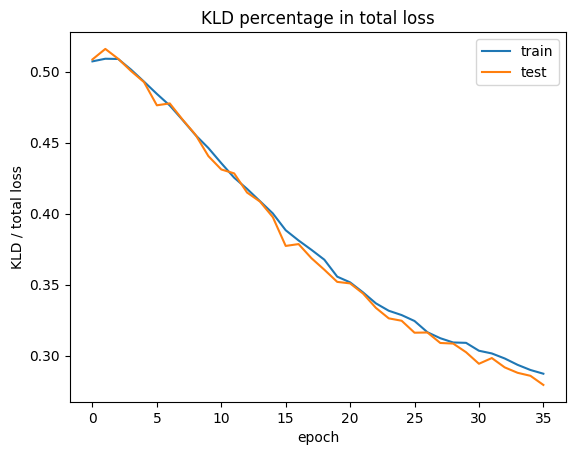

model save at:  model_files_beta/ckpt_35.pt
remove  model_files_beta/ckpt_21.pt


epoch 36: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 10839.422, BCE: 10811.587, KLD: 4266.321, KLD/(KLD+BCE): 28.295% beta:0.01
[valid] loss: 14754.470, BCE: 10690.691, KLD: 4063.779, KLD/loss: 27.543%
model save at:  model_files_beta/ckpt_36.pt
remove  model_files_beta/ckpt_22.pt


epoch 37: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10824.818, BCE: 10796.257, KLD: 4230.950, KLD/(KLD+BCE): 28.155% beta:0.01
[valid] loss: 15120.321, BCE: 10896.509, KLD: 4223.812, KLD/loss: 27.935%


epoch 38: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10783.481, BCE: 10753.861, KLD: 4284.887, KLD/(KLD+BCE): 28.492% beta:0.02
[valid] loss: 14842.178, BCE: 10672.340, KLD: 4169.838, KLD/loss: 28.095%


epoch 39: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 10755.290, BCE: 10724.434, KLD: 4317.837, KLD/(KLD+BCE): 28.705% beta:0.02
[valid] loss: 14748.262, BCE: 10680.235, KLD: 4068.027, KLD/loss: 27.583%
model save at:  model_files_beta/ckpt_39.pt
remove  model_files_beta/ckpt_23.pt


epoch 40: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10716.564, BCE: 10684.654, KLD: 4278.470, KLD/(KLD+BCE): 28.593% beta:0.02
[valid] loss: 14513.721, BCE: 10488.058, KLD: 4025.663, KLD/loss: 27.737%


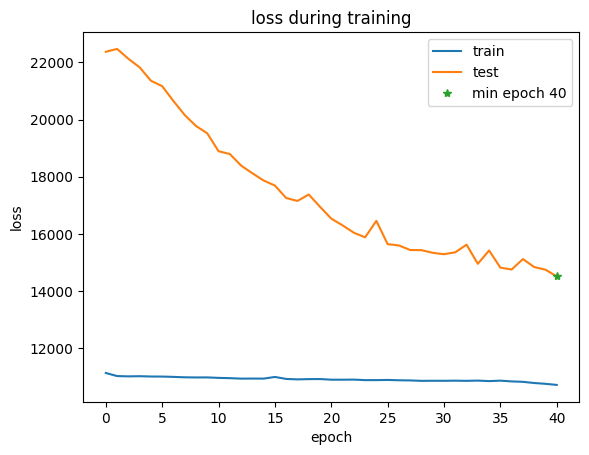

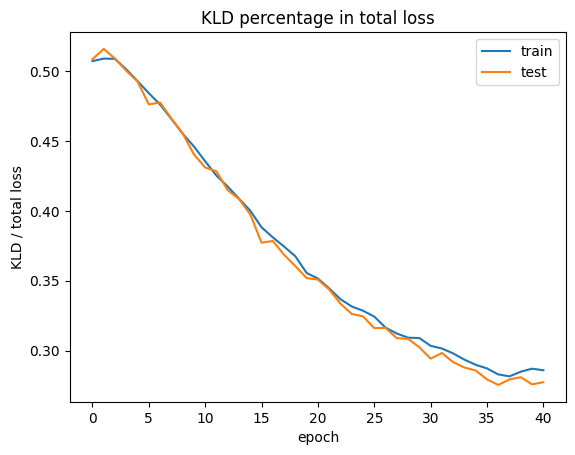

model save at:  model_files_beta/ckpt_40.pt
remove  model_files_beta/ckpt_25.pt


epoch 41: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10713.940, BCE: 10681.385, KLD: 4240.889, KLD/(KLD+BCE): 28.420% beta:0.02
[valid] loss: 14475.588, BCE: 10481.372, KLD: 3994.216, KLD/loss: 27.593%
model save at:  model_files_beta/ckpt_41.pt
remove  model_files_beta/ckpt_26.pt


epoch 42: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10685.196, BCE: 10652.237, KLD: 4231.358, KLD/(KLD+BCE): 28.430% beta:0.02
[valid] loss: 14719.312, BCE: 10757.457, KLD: 3961.855, KLD/loss: 26.916%


epoch 43: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10664.650, BCE: 10630.551, KLD: 4210.926, KLD/(KLD+BCE): 28.373% beta:0.02
[valid] loss: 14536.745, BCE: 10553.003, KLD: 3983.742, KLD/loss: 27.405%


epoch 44: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10674.925, BCE: 10639.281, KLD: 4226.538, KLD/(KLD+BCE): 28.431% beta:0.02
[valid] loss: 14359.314, BCE: 10470.246, KLD: 3889.068, KLD/loss: 27.084%
model save at:  model_files_beta/ckpt_44.pt
remove  model_files_beta/ckpt_27.pt


epoch 45: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10646.995, BCE: 10611.945, KLD: 4113.204, KLD/(KLD+BCE): 27.933% beta:0.02
[valid] loss: 14460.339, BCE: 10537.034, KLD: 3923.305, KLD/loss: 27.131%


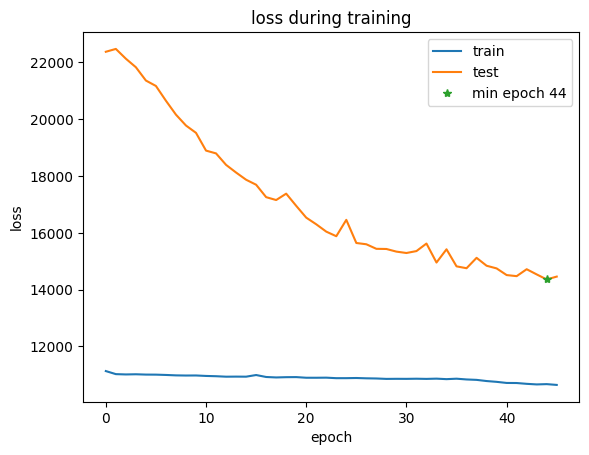

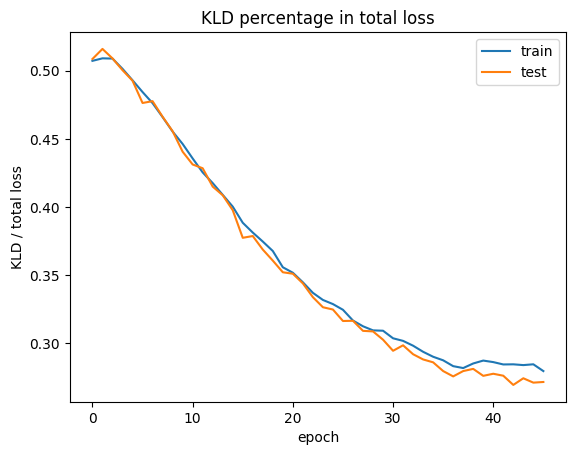

epoch 46: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10625.600, BCE: 10589.105, KLD: 4148.083, KLD/(KLD+BCE): 28.147% beta:0.02
[valid] loss: 14608.607, BCE: 10607.085, KLD: 4001.522, KLD/loss: 27.392%


epoch 47: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10624.941, BCE: 10587.223, KLD: 4122.776, KLD/(KLD+BCE): 28.027% beta:0.02
[valid] loss: 14453.213, BCE: 10652.724, KLD: 3800.489, KLD/loss: 26.295%


epoch 48: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10612.546, BCE: 10574.239, KLD: 4073.684, KLD/(KLD+BCE): 27.811% beta:0.02
[valid] loss: 14720.883, BCE: 10849.772, KLD: 3871.111, KLD/loss: 26.297%


epoch 49: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10626.419, BCE: 10587.538, KLD: 4007.930, KLD/(KLD+BCE): 27.460% beta:0.03
[valid] loss: 14155.994, BCE: 10398.949, KLD: 3757.044, KLD/loss: 26.540%
model save at:  model_files_beta/ckpt_49.pt
remove  model_files_beta/ckpt_28.pt


epoch 50: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10610.440, BCE: 10569.385, KLD: 4021.206, KLD/(KLD+BCE): 27.560% beta:0.03
[valid] loss: 14187.510, BCE: 10408.969, KLD: 3778.541, KLD/loss: 26.633%


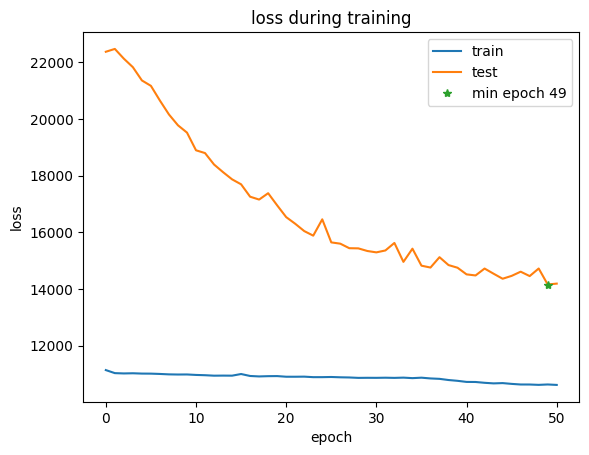

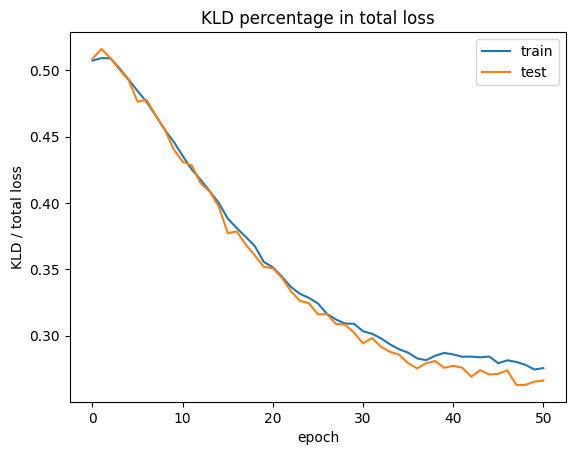

epoch 51: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10583.863, BCE: 10542.975, KLD: 3939.386, KLD/(KLD+BCE): 27.201% beta:0.03
[valid] loss: 14225.642, BCE: 10480.203, KLD: 3745.439, KLD/loss: 26.329%


epoch 52: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10590.832, BCE: 10548.704, KLD: 3917.799, KLD/(KLD+BCE): 27.082% beta:0.03
[valid] loss: 14050.996, BCE: 10414.020, KLD: 3636.976, KLD/loss: 25.884%
model save at:  model_files_beta/ckpt_52.pt
remove  model_files_beta/ckpt_29.pt


epoch 53: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10574.158, BCE: 10531.077, KLD: 3883.218, KLD/(KLD+BCE): 26.940% beta:0.03
[valid] loss: 13967.375, BCE: 10418.338, KLD: 3549.038, KLD/loss: 25.409%
model save at:  model_files_beta/ckpt_53.pt
remove  model_files_beta/ckpt_30.pt


epoch 54: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10583.414, BCE: 10539.086, KLD: 3842.673, KLD/(KLD+BCE): 26.719% beta:0.03
[valid] loss: 14438.734, BCE: 10879.404, KLD: 3559.330, KLD/loss: 24.651%


epoch 55: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10563.726, BCE: 10518.922, KLD: 3752.744, KLD/(KLD+BCE): 26.295% beta:0.03
[valid] loss: 14018.945, BCE: 10529.747, KLD: 3489.198, KLD/loss: 24.889%


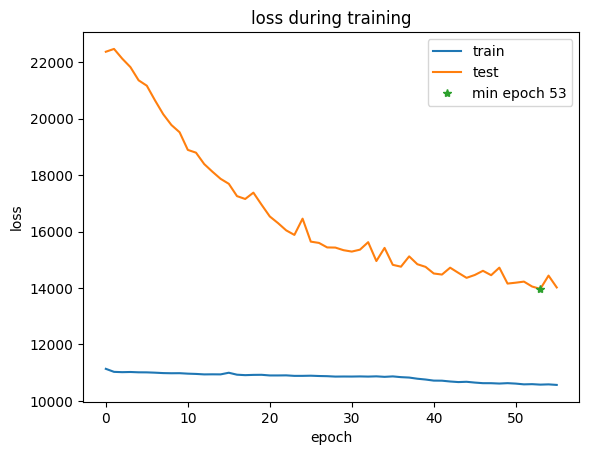

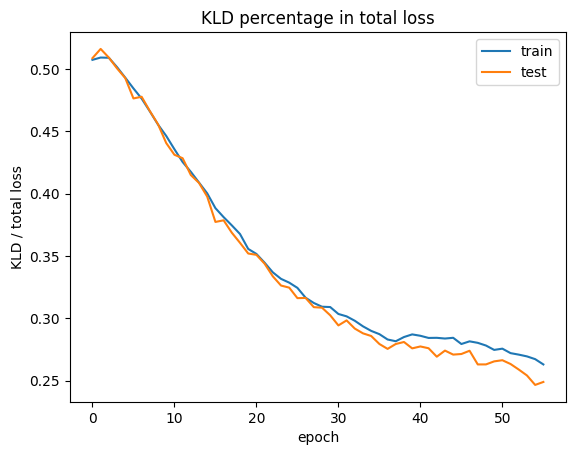

epoch 56: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10565.011, BCE: 10519.391, KLD: 3719.914, KLD/(KLD+BCE): 26.124% beta:0.03
[valid] loss: 13910.614, BCE: 10431.057, KLD: 3479.557, KLD/loss: 25.014%
model save at:  model_files_beta/ckpt_56.pt
remove  model_files_beta/ckpt_33.pt


epoch 57: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10557.402, BCE: 10510.358, KLD: 3712.629, KLD/(KLD+BCE): 26.103% beta:0.04
[valid] loss: 14223.062, BCE: 10827.334, KLD: 3395.728, KLD/loss: 23.875%


epoch 58: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10561.170, BCE: 10513.844, KLD: 3650.448, KLD/(KLD+BCE): 25.772% beta:0.04
[valid] loss: 13696.280, BCE: 10363.134, KLD: 3333.146, KLD/loss: 24.336%
model save at:  model_files_beta/ckpt_58.pt
remove  model_files_beta/ckpt_35.pt


epoch 59: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10524.316, BCE: 10475.791, KLD: 3624.357, KLD/(KLD+BCE): 25.704% beta:0.04
[valid] loss: 13818.022, BCE: 10463.871, KLD: 3354.151, KLD/loss: 24.274%


epoch 60: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10539.825, BCE: 10488.963, KLD: 3635.129, KLD/(KLD+BCE): 25.737% beta:0.04
[valid] loss: 14500.787, BCE: 11065.631, KLD: 3435.157, KLD/loss: 23.689%


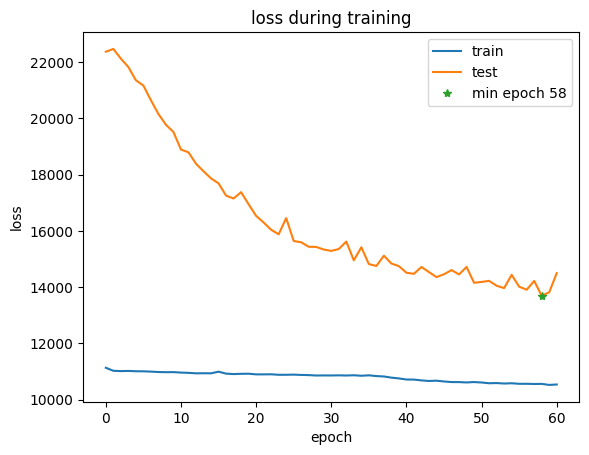

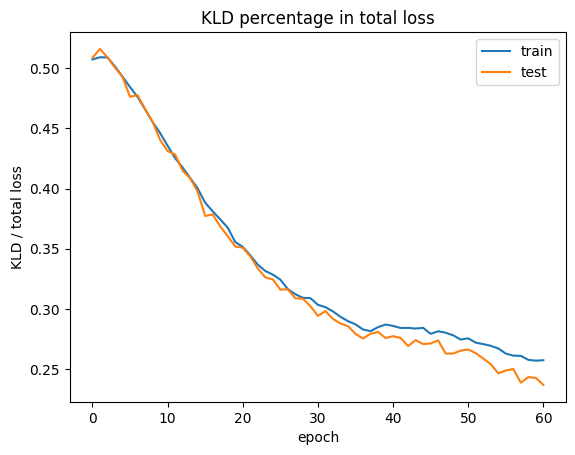

epoch 61: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10531.211, BCE: 10480.120, KLD: 3544.592, KLD/(KLD+BCE): 25.274% beta:0.04
[valid] loss: 13582.823, BCE: 10343.959, KLD: 3238.864, KLD/loss: 23.845%
model save at:  model_files_beta/ckpt_61.pt
remove  model_files_beta/ckpt_36.pt


epoch 62: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10523.770, BCE: 10472.352, KLD: 3484.243, KLD/(KLD+BCE): 24.965% beta:0.05
[valid] loss: 13542.220, BCE: 10309.492, KLD: 3232.728, KLD/loss: 23.871%
model save at:  model_files_beta/ckpt_62.pt
remove  model_files_beta/ckpt_39.pt


epoch 63: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10507.895, BCE: 10454.685, KLD: 3497.863, KLD/(KLD+BCE): 25.070% beta:0.05
[valid] loss: 13610.102, BCE: 10363.209, KLD: 3246.893, KLD/loss: 23.856%


epoch 64: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10532.942, BCE: 10477.293, KLD: 3469.222, KLD/(KLD+BCE): 24.875% beta:0.05
[valid] loss: 13520.730, BCE: 10360.029, KLD: 3160.701, KLD/loss: 23.377%
model save at:  model_files_beta/ckpt_64.pt
remove  model_files_beta/ckpt_40.pt


epoch 65: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10494.452, BCE: 10439.597, KLD: 3333.957, KLD/(KLD+BCE): 24.205% beta:0.05
[valid] loss: 13342.546, BCE: 10288.599, KLD: 3053.947, KLD/loss: 22.889%


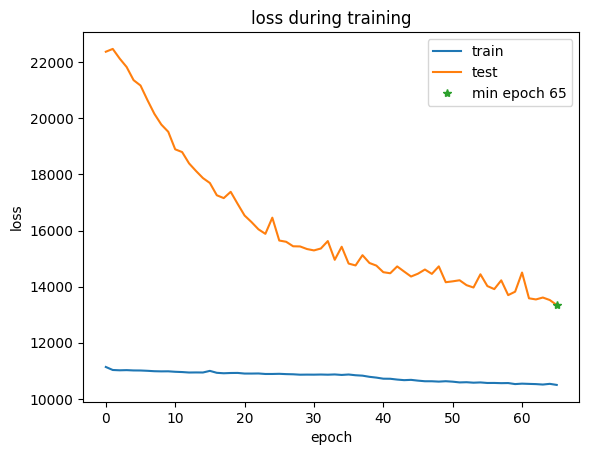

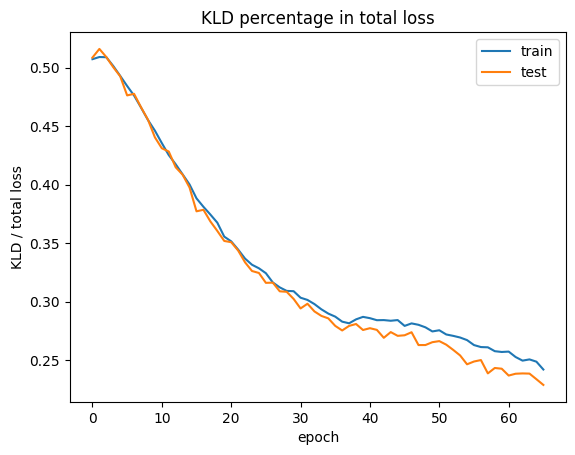

model save at:  model_files_beta/ckpt_65.pt
remove  model_files_beta/ckpt_41.pt


epoch 66: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10492.938, BCE: 10435.977, KLD: 3317.733, KLD/(KLD+BCE): 24.122% beta:0.05
[valid] loss: 13369.991, BCE: 10303.987, KLD: 3066.005, KLD/loss: 22.932%


epoch 67: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10492.276, BCE: 10433.258, KLD: 3320.478, KLD/(KLD+BCE): 24.142% beta:0.06
[valid] loss: 13321.745, BCE: 10314.696, KLD: 3007.049, KLD/loss: 22.572%
model save at:  model_files_beta/ckpt_67.pt
remove  model_files_beta/ckpt_44.pt


epoch 68: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10479.311, BCE: 10419.705, KLD: 3276.631, KLD/(KLD+BCE): 23.923% beta:0.06
[valid] loss: 13243.629, BCE: 10261.670, KLD: 2981.959, KLD/loss: 22.516%
model save at:  model_files_beta/ckpt_68.pt
remove  model_files_beta/ckpt_49.pt


epoch 69: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10489.529, BCE: 10428.895, KLD: 3256.490, KLD/(KLD+BCE): 23.795% beta:0.06
[valid] loss: 13302.519, BCE: 10303.158, KLD: 2999.361, KLD/loss: 22.547%


epoch 70: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10476.015, BCE: 10414.089, KLD: 3219.788, KLD/(KLD+BCE): 23.616% beta:0.07
[valid] loss: 13179.647, BCE: 10240.290, KLD: 2939.357, KLD/loss: 22.302%


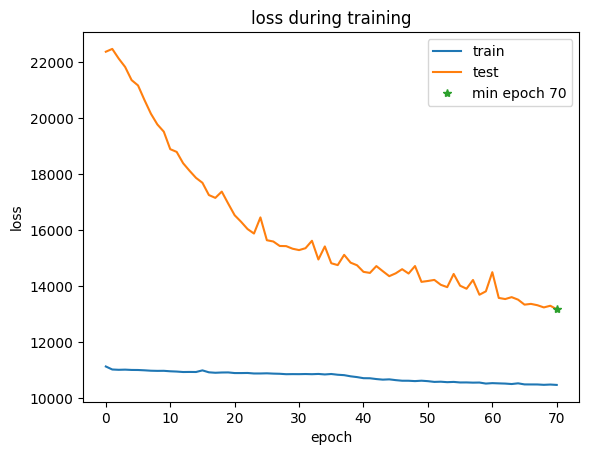

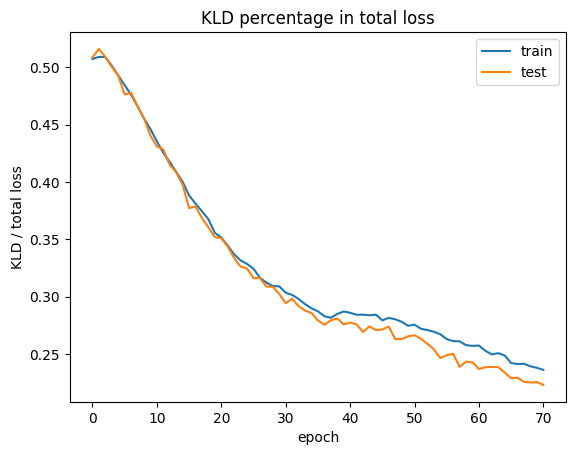

model save at:  model_files_beta/ckpt_70.pt
remove  model_files_beta/ckpt_52.pt


epoch 71: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10472.159, BCE: 10408.598, KLD: 3193.697, KLD/(KLD+BCE): 23.479% beta:0.07
[valid] loss: 13182.235, BCE: 10293.545, KLD: 2888.690, KLD/loss: 21.914%


epoch 72: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10481.865, BCE: 10417.015, KLD: 3136.710, KLD/(KLD+BCE): 23.143% beta:0.07
[valid] loss: 13069.971, BCE: 10243.066, KLD: 2826.905, KLD/loss: 21.629%
model save at:  model_files_beta/ckpt_72.pt
remove  model_files_beta/ckpt_53.pt


epoch 73: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10469.977, BCE: 10404.666, KLD: 3026.665, KLD/(KLD+BCE): 22.534% beta:0.08
[valid] loss: 13290.055, BCE: 10526.471, KLD: 2763.584, KLD/loss: 20.794%


epoch 74: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10470.596, BCE: 10403.474, KLD: 2984.534, KLD/(KLD+BCE): 22.293% beta:0.08
[valid] loss: 12901.333, BCE: 10226.798, KLD: 2674.535, KLD/loss: 20.731%
model save at:  model_files_beta/ckpt_74.pt
remove  model_files_beta/ckpt_56.pt


epoch 75: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10445.527, BCE: 10378.211, KLD: 2921.796, KLD/(KLD+BCE): 21.968% beta:0.08
[valid] loss: 12938.363, BCE: 10265.597, KLD: 2672.766, KLD/loss: 20.658%


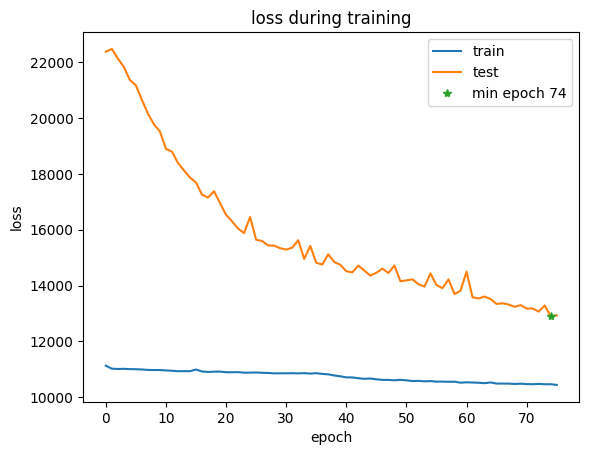

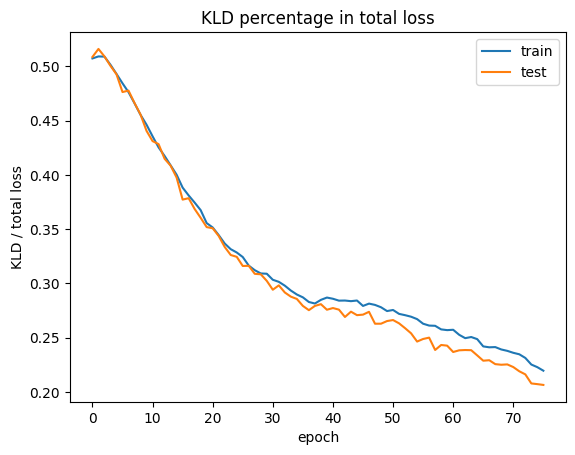

epoch 76: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10467.029, BCE: 10398.006, KLD: 2898.331, KLD/(KLD+BCE): 21.798% beta:0.09
[valid] loss: 12918.062, BCE: 10350.497, KLD: 2567.565, KLD/loss: 19.876%


epoch 77: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10440.435, BCE: 10371.245, KLD: 2836.300, KLD/(KLD+BCE): 21.475% beta:0.09
[valid] loss: 12862.245, BCE: 10307.850, KLD: 2554.395, KLD/loss: 19.860%
model save at:  model_files_beta/ckpt_77.pt
remove  model_files_beta/ckpt_58.pt


epoch 78: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10458.532, BCE: 10388.890, KLD: 2812.885, KLD/(KLD+BCE): 21.307% beta:0.09
[valid] loss: 12703.833, BCE: 10214.289, KLD: 2489.544, KLD/loss: 19.597%
model save at:  model_files_beta/ckpt_78.pt
remove  model_files_beta/ckpt_61.pt


epoch 79: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10428.787, BCE: 10355.931, KLD: 2764.396, KLD/(KLD+BCE): 21.070% beta:0.10
[valid] loss: 12689.585, BCE: 10214.868, KLD: 2474.717, KLD/loss: 19.502%
model save at:  model_files_beta/ckpt_79.pt
remove  model_files_beta/ckpt_62.pt


epoch 80: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10420.070, BCE: 10345.379, KLD: 2720.513, KLD/(KLD+BCE): 20.821% beta:0.10
[valid] loss: 12737.686, BCE: 10330.616, KLD: 2407.071, KLD/loss: 18.897%


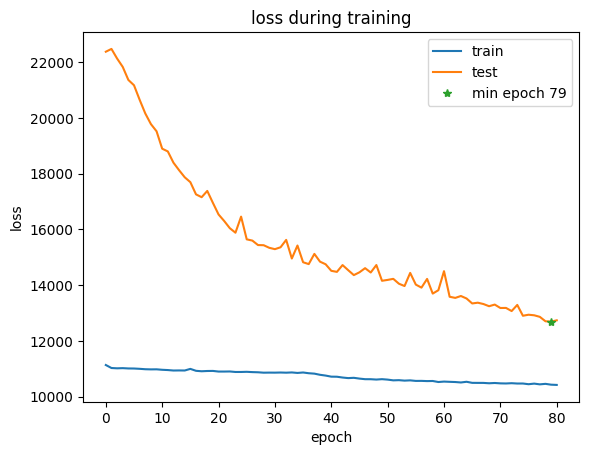

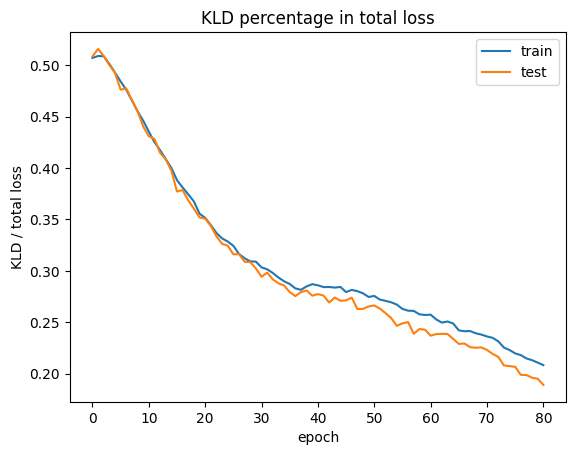

epoch 81: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10403.933, BCE: 10327.265, KLD: 2693.265, KLD/(KLD+BCE): 20.685% beta:0.11
[valid] loss: 12600.274, BCE: 10231.856, KLD: 2368.419, KLD/loss: 18.797%
model save at:  model_files_beta/ckpt_81.pt
remove  model_files_beta/ckpt_64.pt


epoch 82: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10418.278, BCE: 10342.571, KLD: 2612.806, KLD/(KLD+BCE): 20.168% beta:0.11
[valid] loss: 12491.079, BCE: 10190.788, KLD: 2300.291, KLD/loss: 18.415%
model save at:  model_files_beta/ckpt_82.pt
remove  model_files_beta/ckpt_65.pt


epoch 83: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10390.154, BCE: 10312.889, KLD: 2567.695, KLD/(KLD+BCE): 19.935% beta:0.12
[valid] loss: 12437.276, BCE: 10158.846, KLD: 2278.430, KLD/loss: 18.319%
model save at:  model_files_beta/ckpt_83.pt
remove  model_files_beta/ckpt_67.pt


epoch 84: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10377.157, BCE: 10296.681, KLD: 2573.324, KLD/(KLD+BCE): 19.995% beta:0.12
[valid] loss: 12652.730, BCE: 10377.343, KLD: 2275.387, KLD/loss: 17.983%


epoch 85: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10388.175, BCE: 10308.673, KLD: 2466.235, KLD/(KLD+BCE): 19.305% beta:0.13
[valid] loss: 12499.166, BCE: 10306.907, KLD: 2192.259, KLD/loss: 17.539%


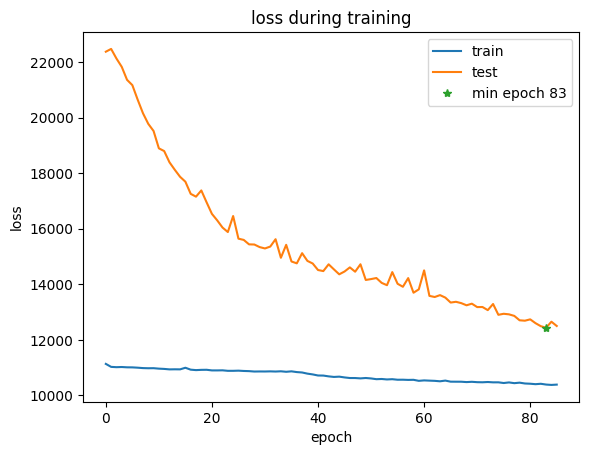

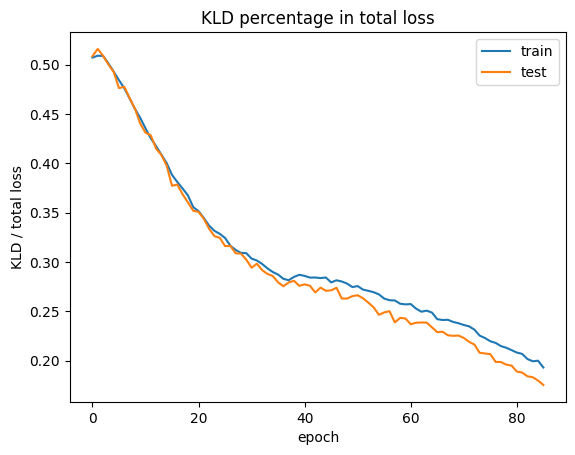

epoch 86: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10345.743, BCE: 10265.520, KLD: 2444.493, KLD/(KLD+BCE): 19.233% beta:0.13
[valid] loss: 12347.248, BCE: 10160.164, KLD: 2187.084, KLD/loss: 17.713%
model save at:  model_files_beta/ckpt_86.pt
remove  model_files_beta/ckpt_68.pt


epoch 87: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10353.980, BCE: 10270.091, KLD: 2442.679, KLD/(KLD+BCE): 19.214% beta:0.14
[valid] loss: 12481.056, BCE: 10370.147, KLD: 2110.909, KLD/loss: 16.913%


epoch 88: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10350.588, BCE: 10265.885, KLD: 2366.105, KLD/(KLD+BCE): 18.731% beta:0.14
[valid] loss: 12234.953, BCE: 10127.993, KLD: 2106.960, KLD/loss: 17.221%
model save at:  model_files_beta/ckpt_88.pt
remove  model_files_beta/ckpt_70.pt


epoch 89: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10337.191, BCE: 10251.563, KLD: 2338.128, KLD/(KLD+BCE): 18.572% beta:0.15
[valid] loss: 12184.378, BCE: 10113.985, KLD: 2070.394, KLD/loss: 16.992%
model save at:  model_files_beta/ckpt_89.pt
remove  model_files_beta/ckpt_72.pt


epoch 90: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10319.710, BCE: 10230.698, KLD: 2327.486, KLD/(KLD+BCE): 18.534% beta:0.15
[valid] loss: 12416.562, BCE: 10383.190, KLD: 2033.372, KLD/loss: 16.376%


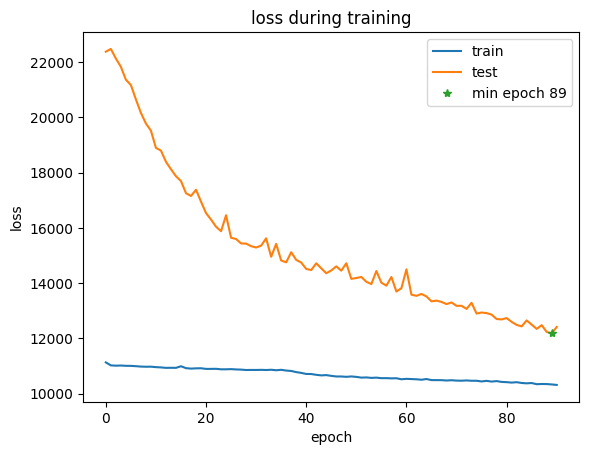

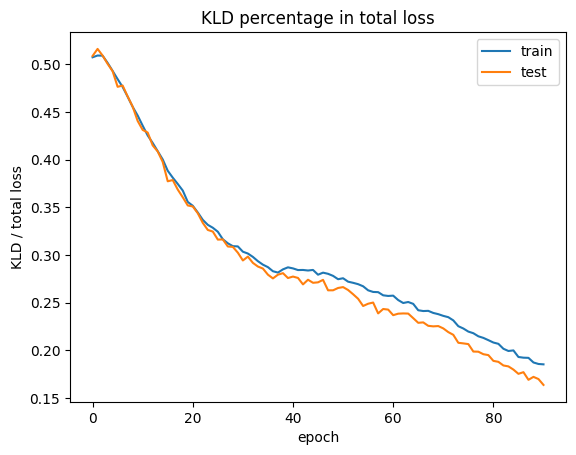

epoch 91: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10324.629, BCE: 10233.934, KLD: 2273.512, KLD/(KLD+BCE): 18.177% beta:0.16
[valid] loss: 12231.989, BCE: 10231.795, KLD: 2000.194, KLD/loss: 16.352%


epoch 92: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10310.979, BCE: 10221.001, KLD: 2216.958, KLD/(KLD+BCE): 17.824% beta:0.17
[valid] loss: 12090.667, BCE: 10100.862, KLD: 1989.805, KLD/loss: 16.457%
model save at:  model_files_beta/ckpt_92.pt
remove  model_files_beta/ckpt_74.pt


epoch 93: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10296.797, BCE: 10203.587, KLD: 2223.380, KLD/(KLD+BCE): 17.892% beta:0.17
[valid] loss: 12045.703, BCE: 10068.304, KLD: 1977.399, KLD/loss: 16.416%
model save at:  model_files_beta/ckpt_93.pt
remove  model_files_beta/ckpt_77.pt


epoch 94: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10278.671, BCE: 10183.309, KLD: 2180.424, KLD/(KLD+BCE): 17.636% beta:0.18
[valid] loss: 11956.027, BCE: 10085.124, KLD: 1870.903, KLD/loss: 15.648%
model save at:  model_files_beta/ckpt_94.pt
remove  model_files_beta/ckpt_78.pt


epoch 95: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10278.895, BCE: 10183.024, KLD: 2133.708, KLD/(KLD+BCE): 17.324% beta:0.19
[valid] loss: 11977.503, BCE: 10108.747, KLD: 1868.757, KLD/loss: 15.602%


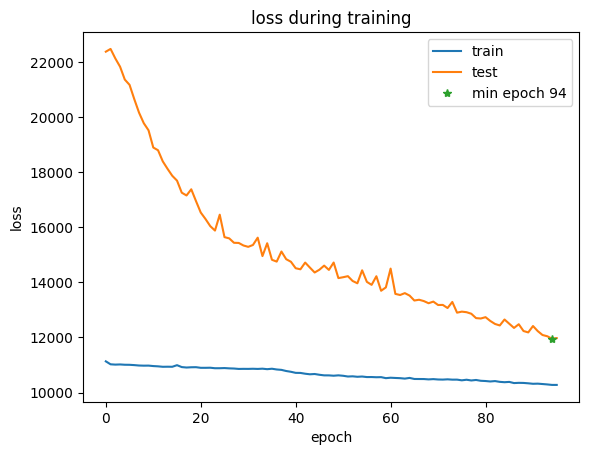

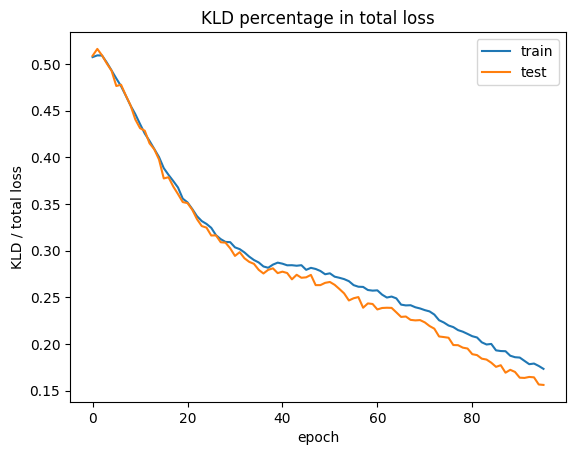

epoch 96: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10284.960, BCE: 10186.694, KLD: 2102.060, KLD/(KLD+BCE): 17.106% beta:0.20
[valid] loss: 11927.442, BCE: 10110.494, KLD: 1816.948, KLD/loss: 15.233%
model save at:  model_files_beta/ckpt_96.pt
remove  model_files_beta/ckpt_79.pt


epoch 97: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10273.190, BCE: 10173.635, KLD: 2060.326, KLD/(KLD+BCE): 16.841% beta:0.20
[valid] loss: 11915.307, BCE: 10118.979, KLD: 1796.328, KLD/loss: 15.076%
model save at:  model_files_beta/ckpt_97.pt
remove  model_files_beta/ckpt_81.pt


epoch 98: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10257.443, BCE: 10156.108, KLD: 2033.661, KLD/(KLD+BCE): 16.683% beta:0.21
[valid] loss: 12278.241, BCE: 10525.466, KLD: 1752.775, KLD/loss: 14.275%


epoch 99: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10252.629, BCE: 10149.840, KLD: 1973.555, KLD/(KLD+BCE): 16.279% beta:0.22
[valid] loss: 12106.547, BCE: 10401.621, KLD: 1704.926, KLD/loss: 14.083%


epoch 100: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10250.219, BCE: 10145.251, KLD: 1945.934, KLD/(KLD+BCE): 16.094% beta:0.23
[valid] loss: 11859.415, BCE: 10169.993, KLD: 1689.422, KLD/loss: 14.245%


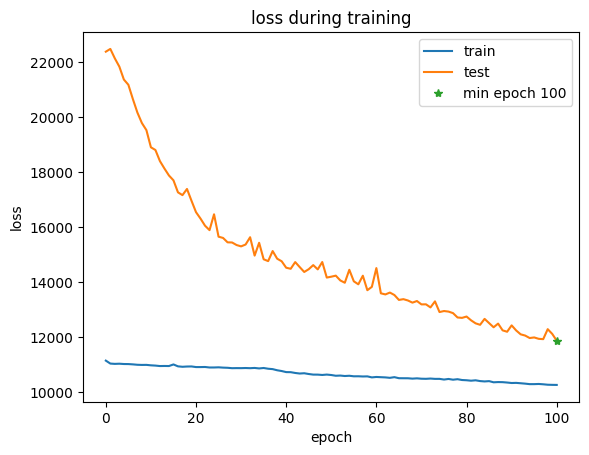

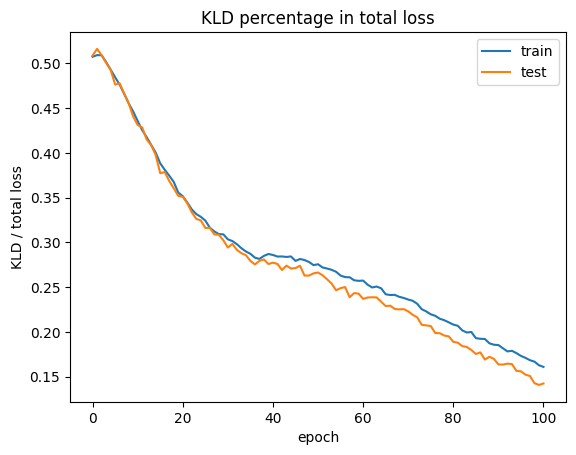

model save at:  model_files_beta/ckpt_100.pt
remove  model_files_beta/ckpt_82.pt


epoch 101: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10226.317, BCE: 10121.189, KLD: 1937.716, KLD/(KLD+BCE): 16.069% beta:0.24
[valid] loss: 11692.642, BCE: 10010.252, KLD: 1682.390, KLD/loss: 14.388%
model save at:  model_files_beta/ckpt_101.pt
remove  model_files_beta/ckpt_83.pt


epoch 102: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10235.880, BCE: 10127.336, KLD: 1908.625, KLD/(KLD+BCE): 15.858% beta:0.25
[valid] loss: 11843.888, BCE: 10210.577, KLD: 1633.311, KLD/loss: 13.790%


epoch 103: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10229.042, BCE: 10122.780, KLD: 1849.569, KLD/(KLD+BCE): 15.449% beta:0.25
[valid] loss: 11742.577, BCE: 10146.214, KLD: 1596.362, KLD/loss: 13.595%


epoch 104: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10213.940, BCE: 10103.274, KLD: 1841.797, KLD/(KLD+BCE): 15.419% beta:0.26
[valid] loss: 11728.383, BCE: 10163.460, KLD: 1564.923, KLD/loss: 13.343%


epoch 105: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10203.971, BCE: 10090.449, KLD: 1803.923, KLD/(KLD+BCE): 15.166% beta:0.27
[valid] loss: 11543.916, BCE: 10013.399, KLD: 1530.516, KLD/loss: 13.258%


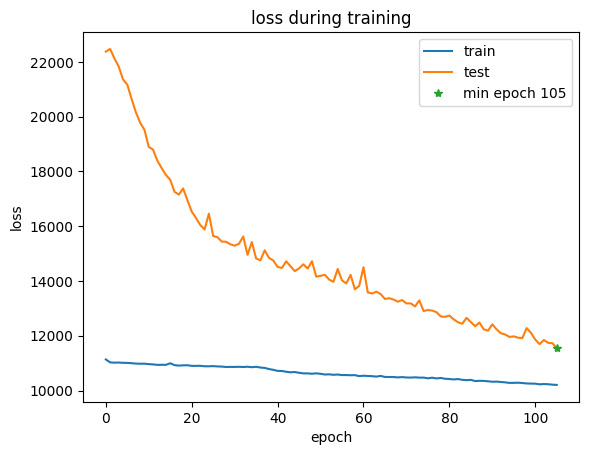

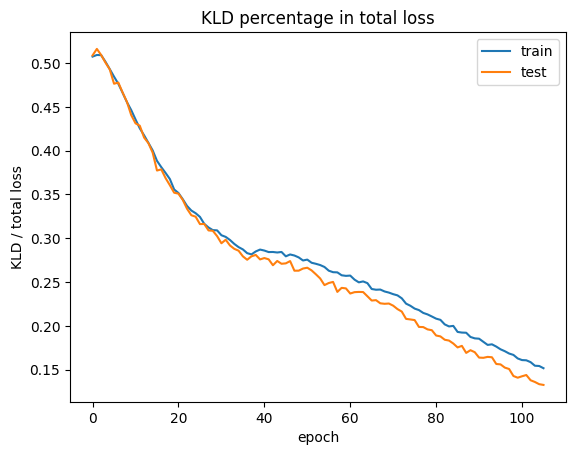

model save at:  model_files_beta/ckpt_105.pt
remove  model_files_beta/ckpt_86.pt


epoch 106: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10209.088, BCE: 10095.970, KLD: 1739.968, KLD/(KLD+BCE): 14.701% beta:0.28
[valid] loss: 11668.268, BCE: 10168.001, KLD: 1500.267, KLD/loss: 12.858%


epoch 107: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10199.310, BCE: 10086.148, KLD: 1699.677, KLD/(KLD+BCE): 14.421% beta:0.29
[valid] loss: 11457.396, BCE: 9979.475, KLD: 1477.922, KLD/loss: 12.899%
model save at:  model_files_beta/ckpt_107.pt
remove  model_files_beta/ckpt_88.pt


epoch 108: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10169.137, BCE: 10053.397, KLD: 1690.247, KLD/(KLD+BCE): 14.393% beta:0.30
[valid] loss: 11611.177, BCE: 10145.079, KLD: 1466.097, KLD/loss: 12.627%


epoch 109: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10189.052, BCE: 10072.518, KLD: 1652.085, KLD/(KLD+BCE): 14.091% beta:0.31
[valid] loss: 11603.367, BCE: 10214.528, KLD: 1388.839, KLD/loss: 11.969%


epoch 110: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10184.881, BCE: 10068.249, KLD: 1591.067, KLD/(KLD+BCE): 13.646% beta:0.32
[valid] loss: 11279.992, BCE: 9932.333, KLD: 1347.658, KLD/loss: 11.947%


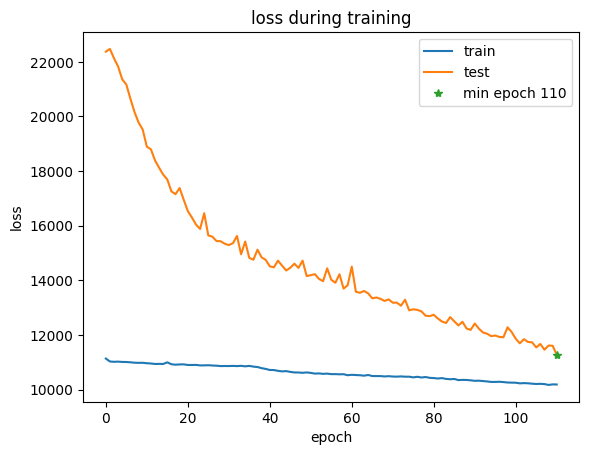

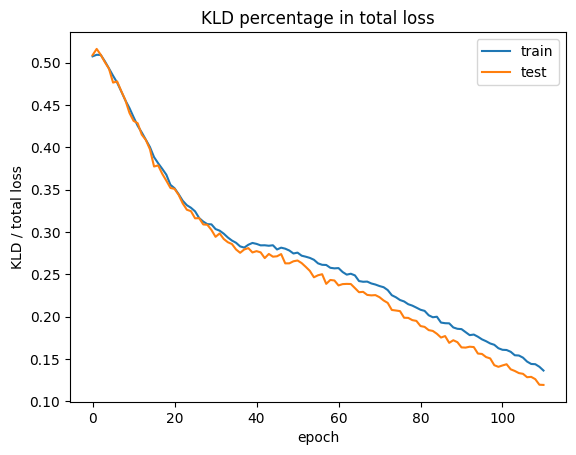

model save at:  model_files_beta/ckpt_110.pt
remove  model_files_beta/ckpt_89.pt


epoch 111: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10146.606, BCE: 10029.351, KLD: 1555.824, KLD/(KLD+BCE): 13.429% beta:0.33
[valid] loss: 11413.308, BCE: 10082.063, KLD: 1331.245, KLD/loss: 11.664%


epoch 112: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10141.021, BCE: 10019.814, KLD: 1563.567, KLD/(KLD+BCE): 13.498% beta:0.34
[valid] loss: 11247.430, BCE: 9916.711, KLD: 1330.719, KLD/loss: 11.831%
model save at:  model_files_beta/ckpt_112.pt
remove  model_files_beta/ckpt_92.pt


epoch 113: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10126.449, BCE: 10001.642, KLD: 1573.793, KLD/(KLD+BCE): 13.596% beta:0.36
[valid] loss: 11353.936, BCE: 10024.592, KLD: 1329.344, KLD/loss: 11.708%


epoch 114: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10136.955, BCE: 10009.370, KLD: 1559.002, KLD/(KLD+BCE): 13.476% beta:0.37
[valid] loss: 11240.351, BCE: 9954.434, KLD: 1285.917, KLD/loss: 11.440%
model save at:  model_files_beta/ckpt_114.pt
remove  model_files_beta/ckpt_93.pt


epoch 115: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10123.955, BCE: 9996.924, KLD: 1511.521, KLD/(KLD+BCE): 13.134% beta:0.38
[valid] loss: 11165.581, BCE: 9927.153, KLD: 1238.428, KLD/loss: 11.091%


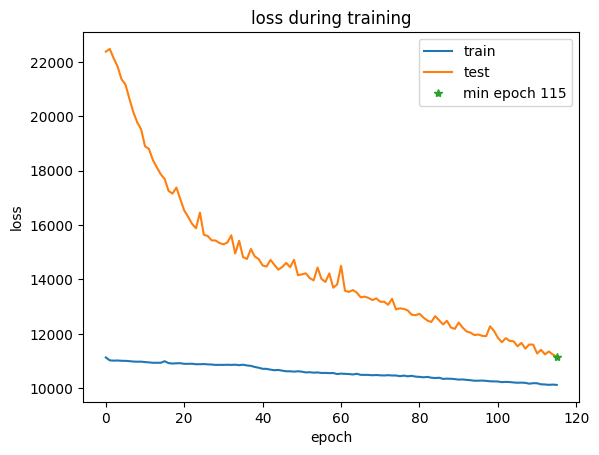

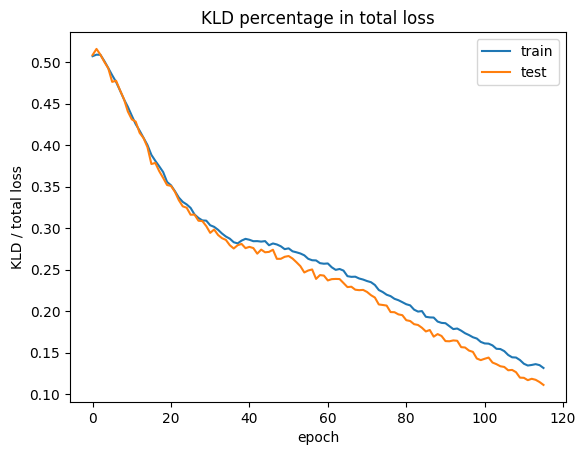

model save at:  model_files_beta/ckpt_115.pt
remove  model_files_beta/ckpt_94.pt


epoch 116: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10119.848, BCE: 9991.876, KLD: 1474.446, KLD/(KLD+BCE): 12.859% beta:0.39
[valid] loss: 11191.687, BCE: 9950.181, KLD: 1241.507, KLD/loss: 11.093%


epoch 117: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10119.552, BCE: 9989.386, KLD: 1440.494, KLD/(KLD+BCE): 12.603% beta:0.40
[valid] loss: 11117.384, BCE: 9926.587, KLD: 1190.797, KLD/loss: 10.711%
model save at:  model_files_beta/ckpt_117.pt
remove  model_files_beta/ckpt_96.pt


epoch 118: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10098.956, BCE: 9968.830, KLD: 1408.673, KLD/(KLD+BCE): 12.381% beta:0.41
[valid] loss: 11145.844, BCE: 9981.573, KLD: 1164.271, KLD/loss: 10.446%


epoch 119: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10109.308, BCE: 9978.434, KLD: 1376.658, KLD/(KLD+BCE): 12.124% beta:0.42
[valid] loss: 11023.101, BCE: 9858.603, KLD: 1164.498, KLD/loss: 10.564%
model save at:  model_files_beta/ckpt_119.pt
remove  model_files_beta/ckpt_97.pt


epoch 120: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10079.062, BCE: 9947.166, KLD: 1372.476, KLD/(KLD+BCE): 12.125% beta:0.43
[valid] loss: 11075.708, BCE: 9949.894, KLD: 1125.814, KLD/loss: 10.165%


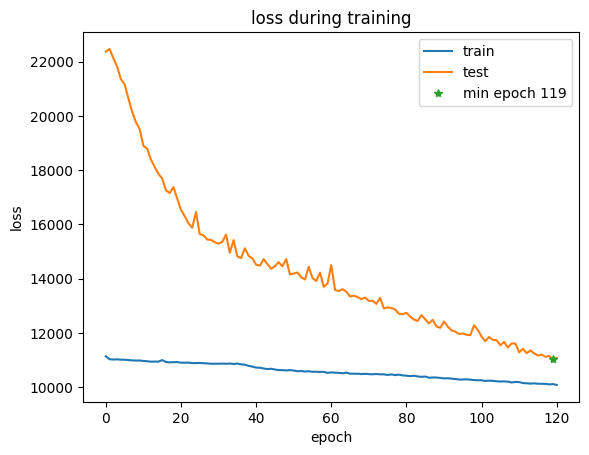

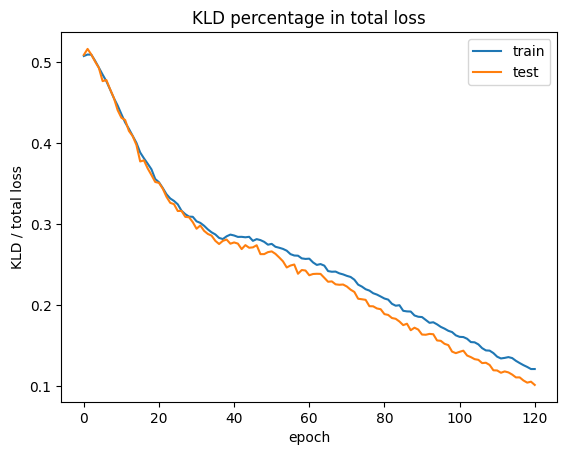

epoch 121: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10079.377, BCE: 9944.394, KLD: 1342.819, KLD/(KLD+BCE): 11.897% beta:0.45
[valid] loss: 11034.556, BCE: 9936.043, KLD: 1098.512, KLD/loss: 9.955%


epoch 122: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10074.601, BCE: 9936.843, KLD: 1316.272, KLD/(KLD+BCE): 11.697% beta:0.46
[valid] loss: 10954.337, BCE: 9866.770, KLD: 1087.567, KLD/loss: 9.928%
model save at:  model_files_beta/ckpt_122.pt
remove  model_files_beta/ckpt_100.pt


epoch 123: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10079.961, BCE: 9943.381, KLD: 1299.554, KLD/(KLD+BCE): 11.559% beta:0.47
[valid] loss: 10899.874, BCE: 9829.355, KLD: 1070.519, KLD/loss: 9.821%
model save at:  model_files_beta/ckpt_123.pt
remove  model_files_beta/ckpt_101.pt


epoch 124: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10063.029, BCE: 9923.327, KLD: 1283.171, KLD/(KLD+BCE): 11.450% beta:0.48
[valid] loss: 10918.677, BCE: 9873.051, KLD: 1045.626, KLD/loss: 9.576%


epoch 125: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10048.240, BCE: 9906.647, KLD: 1263.044, KLD/(KLD+BCE): 11.308% beta:0.49
[valid] loss: 10881.786, BCE: 9861.425, KLD: 1020.362, KLD/loss: 9.377%


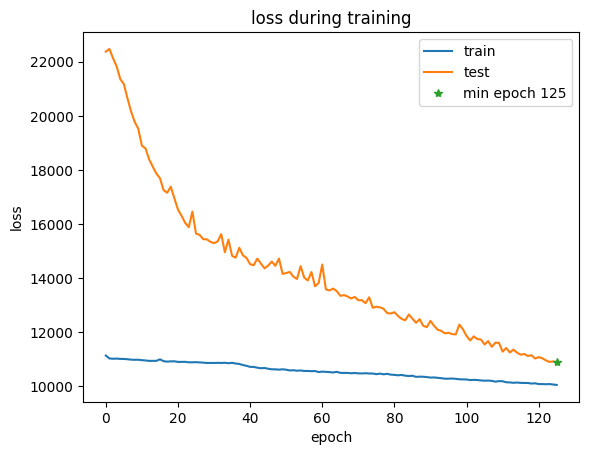

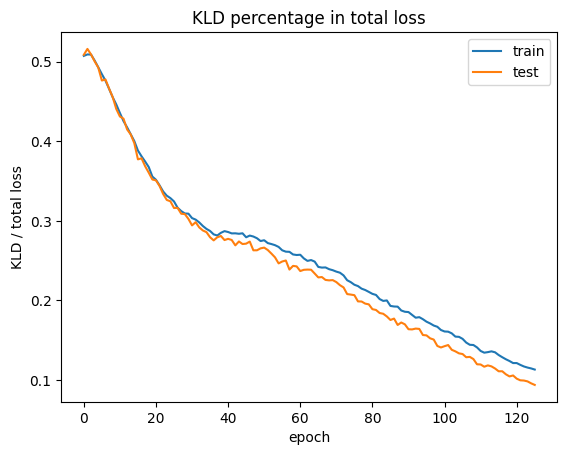

model save at:  model_files_beta/ckpt_125.pt
remove  model_files_beta/ckpt_105.pt


epoch 126: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10042.249, BCE: 9903.726, KLD: 1250.792, KLD/(KLD+BCE): 11.213% beta:0.51
[valid] loss: 10844.364, BCE: 9828.150, KLD: 1016.214, KLD/loss: 9.371%
model save at:  model_files_beta/ckpt_126.pt
remove  model_files_beta/ckpt_107.pt


epoch 127: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10033.080, BCE: 9888.471, KLD: 1238.613, KLD/(KLD+BCE): 11.132% beta:0.52
[valid] loss: 10928.331, BCE: 9916.824, KLD: 1011.507, KLD/loss: 9.256%


epoch 128: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10047.936, BCE: 9902.349, KLD: 1219.073, KLD/(KLD+BCE): 10.961% beta:0.53
[valid] loss: 10760.744, BCE: 9785.056, KLD: 975.688, KLD/loss: 9.067%
model save at:  model_files_beta/ckpt_128.pt
remove  model_files_beta/ckpt_110.pt


epoch 129: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10033.040, BCE: 9886.421, KLD: 1189.022, KLD/(KLD+BCE): 10.736% beta:0.54
[valid] loss: 10817.687, BCE: 9864.296, KLD: 953.391, KLD/loss: 8.813%


epoch 130: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10024.618, BCE: 9875.813, KLD: 1165.207, KLD/(KLD+BCE): 10.553% beta:0.55
[valid] loss: 11006.182, BCE: 10064.458, KLD: 941.724, KLD/loss: 8.556%


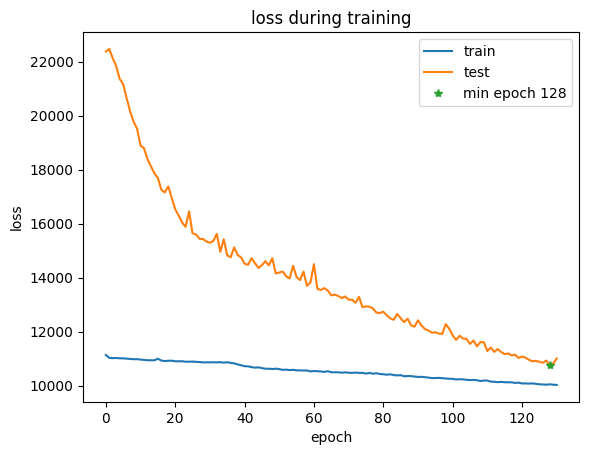

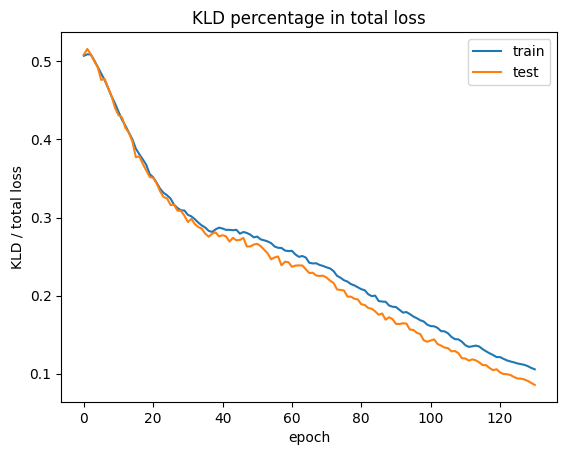

epoch 131: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10032.874, BCE: 9884.575, KLD: 1149.891, KLD/(KLD+BCE): 10.421% beta:0.57
[valid] loss: 11018.512, BCE: 10099.500, KLD: 919.011, KLD/loss: 8.341%


epoch 132: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10013.910, BCE: 9862.284, KLD: 1138.097, KLD/(KLD+BCE): 10.346% beta:0.58
[valid] loss: 10692.662, BCE: 9780.632, KLD: 912.029, KLD/loss: 8.529%
model save at:  model_files_beta/ckpt_132.pt
remove  model_files_beta/ckpt_112.pt


epoch 133: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9995.340, BCE: 9841.378, KLD: 1117.976, KLD/(KLD+BCE): 10.201% beta:0.59
[valid] loss: 10652.352, BCE: 9758.137, KLD: 894.215, KLD/loss: 8.395%
model save at:  model_files_beta/ckpt_133.pt
remove  model_files_beta/ckpt_114.pt


epoch 134: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10003.743, BCE: 9846.308, KLD: 1113.251, KLD/(KLD+BCE): 10.158% beta:0.60
[valid] loss: 10633.839, BCE: 9737.544, KLD: 896.295, KLD/loss: 8.429%
model save at:  model_files_beta/ckpt_134.pt
remove  model_files_beta/ckpt_115.pt


epoch 135: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9985.122, BCE: 9828.247, KLD: 1092.792, KLD/(KLD+BCE): 10.006% beta:0.61
[valid] loss: 10753.276, BCE: 9875.444, KLD: 877.833, KLD/loss: 8.163%


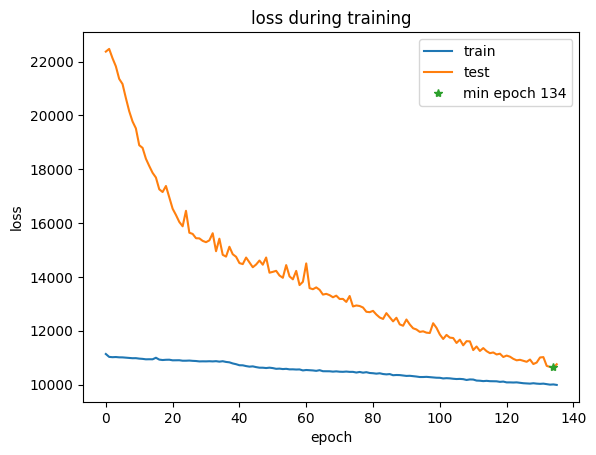

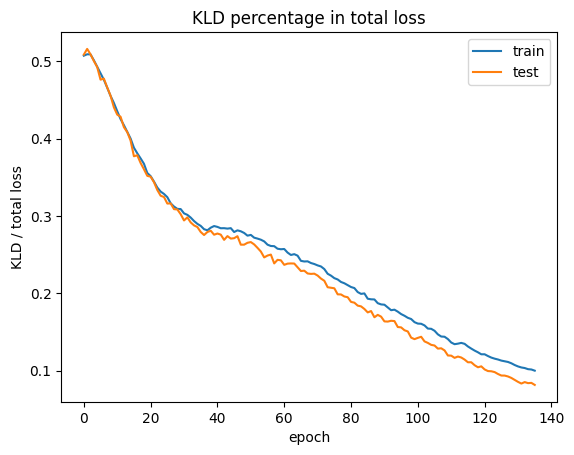

epoch 136: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9974.777, BCE: 9815.108, KLD: 1084.405, KLD/(KLD+BCE): 9.949% beta:0.62
[valid] loss: 10623.116, BCE: 9739.492, KLD: 883.625, KLD/loss: 8.318%
model save at:  model_files_beta/ckpt_136.pt
remove  model_files_beta/ckpt_117.pt


epoch 137: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9970.438, BCE: 9810.283, KLD: 1071.872, KLD/(KLD+BCE): 9.850% beta:0.63
[valid] loss: 10629.942, BCE: 9772.430, KLD: 857.512, KLD/loss: 8.067%


epoch 138: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9954.033, BCE: 9791.962, KLD: 1074.249, KLD/(KLD+BCE): 9.886% beta:0.65
[valid] loss: 10613.994, BCE: 9739.325, KLD: 874.668, KLD/loss: 8.241%
model save at:  model_files_beta/ckpt_138.pt
remove  model_files_beta/ckpt_119.pt


epoch 139: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9951.999, BCE: 9786.443, KLD: 1066.979, KLD/(KLD+BCE): 9.831% beta:0.66
[valid] loss: 10773.753, BCE: 9914.296, KLD: 859.457, KLD/loss: 7.977%


epoch 140: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9956.173, BCE: 9788.127, KLD: 1049.427, KLD/(KLD+BCE): 9.683% beta:0.67
[valid] loss: 10568.572, BCE: 9735.724, KLD: 832.849, KLD/loss: 7.880%


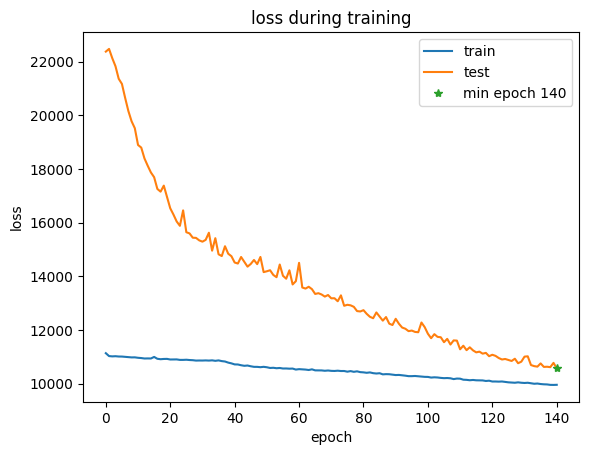

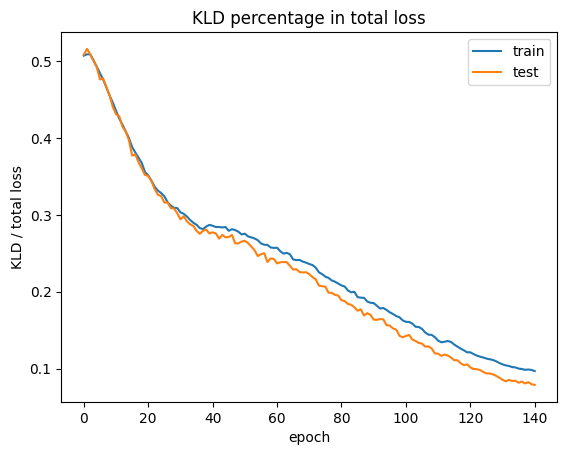

model save at:  model_files_beta/ckpt_140.pt
remove  model_files_beta/ckpt_122.pt


epoch 141: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9929.559, BCE: 9762.012, KLD: 1034.242, KLD/(KLD+BCE): 9.580% beta:0.68
[valid] loss: 10526.834, BCE: 9701.053, KLD: 825.781, KLD/loss: 7.845%
model save at:  model_files_beta/ckpt_141.pt
remove  model_files_beta/ckpt_123.pt


epoch 142: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9925.101, BCE: 9756.333, KLD: 1014.351, KLD/(KLD+BCE): 9.418% beta:0.69
[valid] loss: 10600.269, BCE: 9799.366, KLD: 800.903, KLD/loss: 7.555%


epoch 143: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9920.009, BCE: 9747.390, KLD: 1011.569, KLD/(KLD+BCE): 9.402% beta:0.70
[valid] loss: 10613.026, BCE: 9820.822, KLD: 792.203, KLD/loss: 7.464%


epoch 144: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9902.370, BCE: 9728.009, KLD: 994.517, KLD/(KLD+BCE): 9.275% beta:0.71
[valid] loss: 10459.650, BCE: 9676.141, KLD: 783.509, KLD/loss: 7.491%
model save at:  model_files_beta/ckpt_144.pt
remove  model_files_beta/ckpt_125.pt


epoch 145: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9893.788, BCE: 9718.272, KLD: 987.442, KLD/(KLD+BCE): 9.224% beta:0.72
[valid] loss: 10470.561, BCE: 9680.195, KLD: 790.365, KLD/loss: 7.548%


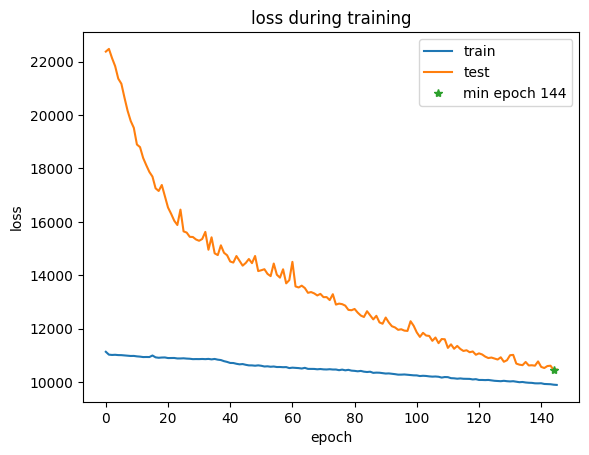

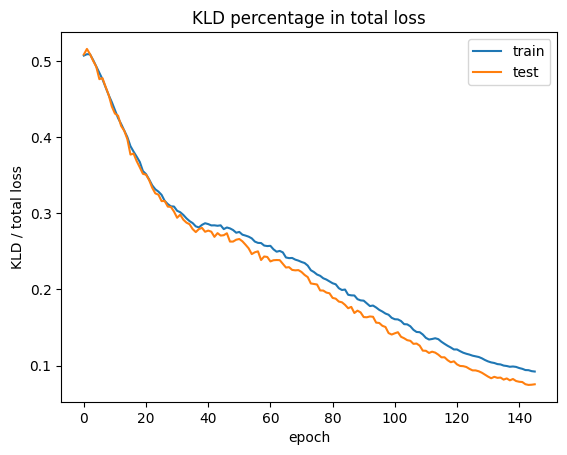

epoch 146: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9899.875, BCE: 9723.470, KLD: 977.463, KLD/(KLD+BCE): 9.134% beta:0.73
[valid] loss: 10632.002, BCE: 9844.291, KLD: 787.711, KLD/loss: 7.409%


epoch 147: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9900.306, BCE: 9721.010, KLD: 965.756, KLD/(KLD+BCE): 9.037% beta:0.74
[valid] loss: 10756.193, BCE: 9983.819, KLD: 772.374, KLD/loss: 7.181%


epoch 148: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9882.101, BCE: 9702.403, KLD: 957.406, KLD/(KLD+BCE): 8.981% beta:0.75
[valid] loss: 10417.501, BCE: 9649.176, KLD: 768.325, KLD/loss: 7.375%
model save at:  model_files_beta/ckpt_148.pt
remove  model_files_beta/ckpt_126.pt


epoch 149: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9873.209, BCE: 9688.000, KLD: 959.805, KLD/(KLD+BCE): 9.014% beta:0.75
[valid] loss: 10644.255, BCE: 9882.178, KLD: 762.077, KLD/loss: 7.160%


epoch 150: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9878.251, BCE: 9695.867, KLD: 939.018, KLD/(KLD+BCE): 8.830% beta:0.76
[valid] loss: 10523.509, BCE: 9791.058, KLD: 732.451, KLD/loss: 6.960%


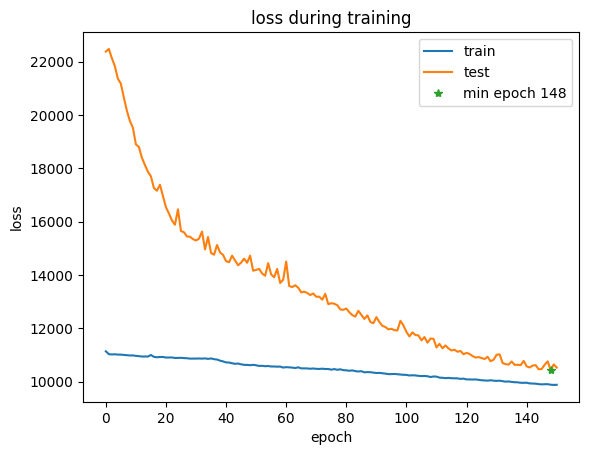

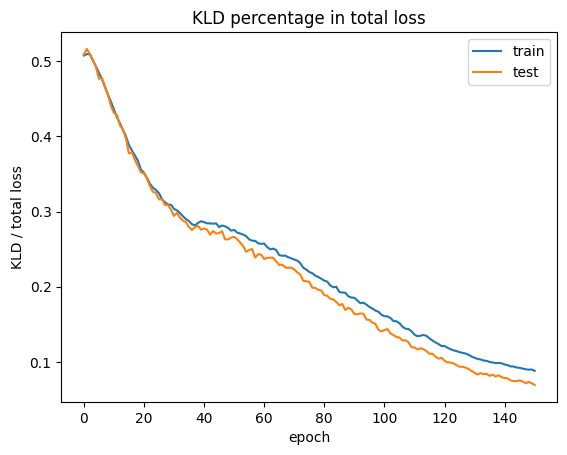

epoch 151: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9865.884, BCE: 9679.985, KLD: 931.357, KLD/(KLD+BCE): 8.777% beta:0.77
[valid] loss: 10457.210, BCE: 9701.308, KLD: 755.902, KLD/loss: 7.229%


epoch 152: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9822.259, BCE: 9634.261, KLD: 936.261, KLD/(KLD+BCE): 8.857% beta:0.78
[valid] loss: 10345.432, BCE: 9601.093, KLD: 744.339, KLD/loss: 7.195%
model save at:  model_files_beta/ckpt_152.pt
remove  model_files_beta/ckpt_128.pt


epoch 153: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9829.383, BCE: 9637.320, KLD: 930.057, KLD/(KLD+BCE): 8.801% beta:0.79
[valid] loss: 10361.573, BCE: 9630.153, KLD: 731.420, KLD/loss: 7.059%


epoch 154: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9839.232, BCE: 9643.783, KLD: 922.582, KLD/(KLD+BCE): 8.731% beta:0.80
[valid] loss: 10301.343, BCE: 9586.861, KLD: 714.482, KLD/loss: 6.936%
model save at:  model_files_beta/ckpt_154.pt
remove  model_files_beta/ckpt_132.pt


epoch 155: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9828.109, BCE: 9634.060, KLD: 902.794, KLD/(KLD+BCE): 8.568% beta:0.80
[valid] loss: 10417.889, BCE: 9703.933, KLD: 713.956, KLD/loss: 6.853%


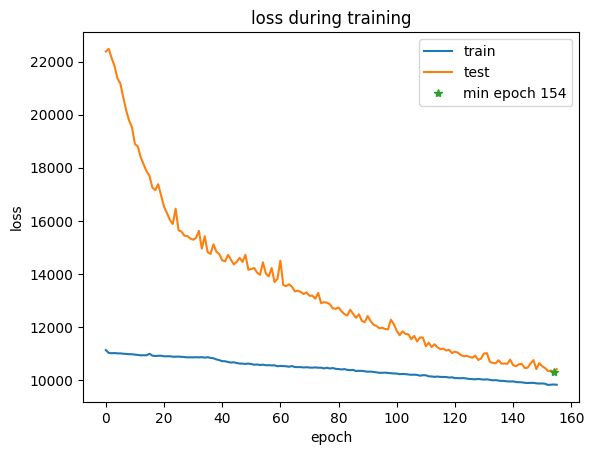

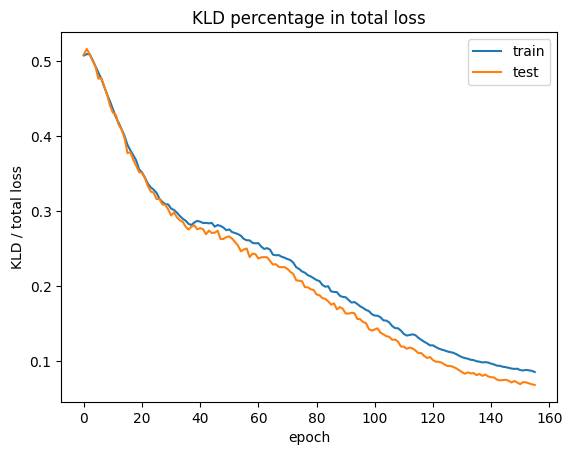

epoch 156: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9807.560, BCE: 9611.501, KLD: 900.493, KLD/(KLD+BCE): 8.566% beta:0.81
[valid] loss: 10284.761, BCE: 9566.362, KLD: 718.399, KLD/loss: 6.985%
model save at:  model_files_beta/ckpt_156.pt
remove  model_files_beta/ckpt_133.pt


epoch 157: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9813.485, BCE: 9617.241, KLD: 890.718, KLD/(KLD+BCE): 8.477% beta:0.82
[valid] loss: 10411.423, BCE: 9704.305, KLD: 707.118, KLD/loss: 6.792%


epoch 158: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9812.247, BCE: 9613.400, KLD: 881.256, KLD/(KLD+BCE): 8.397% beta:0.83
[valid] loss: 10259.920, BCE: 9565.565, KLD: 694.355, KLD/loss: 6.768%
model save at:  model_files_beta/ckpt_158.pt
remove  model_files_beta/ckpt_134.pt


epoch 159: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9777.839, BCE: 9580.143, KLD: 876.255, KLD/(KLD+BCE): 8.380% beta:0.83
[valid] loss: 10447.363, BCE: 9749.770, KLD: 697.593, KLD/loss: 6.677%


epoch 160: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9792.500, BCE: 9588.826, KLD: 876.202, KLD/(KLD+BCE): 8.373% beta:0.84
[valid] loss: 10232.114, BCE: 9538.612, KLD: 693.501, KLD/loss: 6.778%


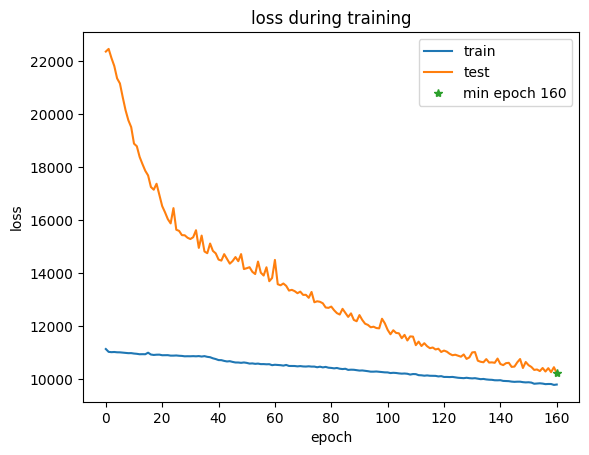

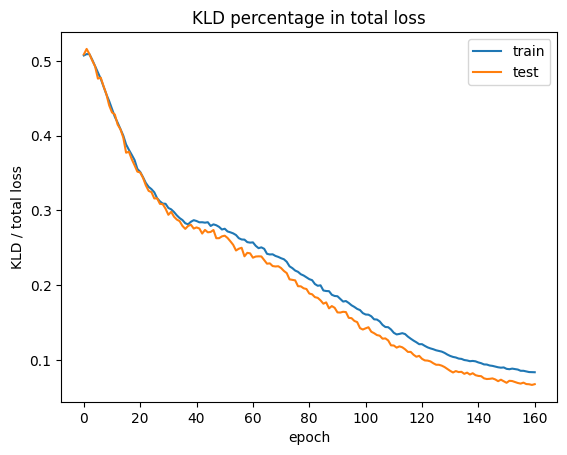

model save at:  model_files_beta/ckpt_160.pt
remove  model_files_beta/ckpt_136.pt


epoch 161: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9779.040, BCE: 9572.512, KLD: 867.788, KLD/(KLD+BCE): 8.312% beta:0.85
[valid] loss: 10255.167, BCE: 9568.078, KLD: 687.090, KLD/loss: 6.700%


epoch 162: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9761.161, BCE: 9555.523, KLD: 857.864, KLD/(KLD+BCE): 8.238% beta:0.85
[valid] loss: 10355.033, BCE: 9683.813, KLD: 671.219, KLD/loss: 6.482%


epoch 163: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9769.296, BCE: 9563.021, KLD: 855.042, KLD/(KLD+BCE): 8.207% beta:0.86
[valid] loss: 10279.845, BCE: 9606.556, KLD: 673.289, KLD/loss: 6.550%


epoch 164: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9756.000, BCE: 9544.779, KLD: 846.802, KLD/(KLD+BCE): 8.149% beta:0.86
[valid] loss: 10350.607, BCE: 9682.560, KLD: 668.047, KLD/loss: 6.454%


epoch 165: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9733.366, BCE: 9521.864, KLD: 840.950, KLD/(KLD+BCE): 8.115% beta:0.87
[valid] loss: 10612.870, BCE: 9960.193, KLD: 652.678, KLD/loss: 6.150%


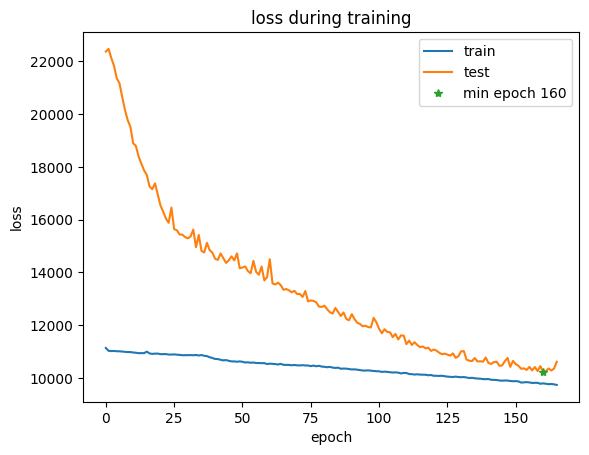

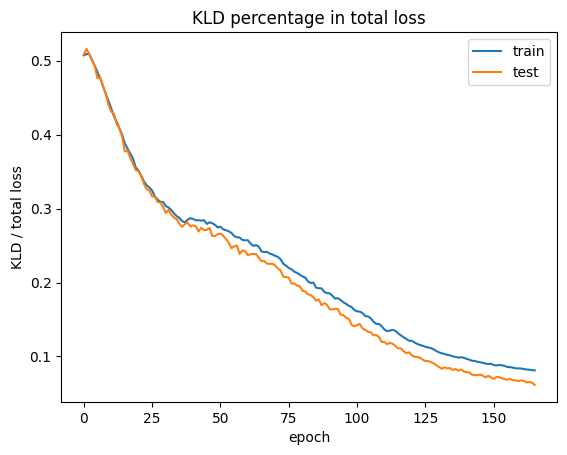

epoch 166: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9748.072, BCE: 9538.356, KLD: 838.297, KLD/(KLD+BCE): 8.079% beta:0.87
[valid] loss: 10160.582, BCE: 9497.983, KLD: 662.599, KLD/loss: 6.521%
model save at:  model_files_beta/ckpt_166.pt
remove  model_files_beta/ckpt_138.pt


epoch 167: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9726.327, BCE: 9514.287, KLD: 833.011, KLD/(KLD+BCE): 8.051% beta:0.88
[valid] loss: 10247.599, BCE: 9581.218, KLD: 666.381, KLD/loss: 6.503%


epoch 168: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9727.821, BCE: 9511.461, KLD: 836.134, KLD/(KLD+BCE): 8.080% beta:0.88
[valid] loss: 10160.574, BCE: 9514.756, KLD: 645.818, KLD/loss: 6.356%
model save at:  model_files_beta/ckpt_168.pt
remove  model_files_beta/ckpt_140.pt


epoch 169: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9700.049, BCE: 9486.727, KLD: 825.180, KLD/(KLD+BCE): 8.002% beta:0.89
[valid] loss: 10307.037, BCE: 9660.760, KLD: 646.277, KLD/loss: 6.270%


epoch 170: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9729.869, BCE: 9513.984, KLD: 811.130, KLD/(KLD+BCE): 7.856% beta:0.89
[valid] loss: 10091.669, BCE: 9451.327, KLD: 640.342, KLD/loss: 6.345%


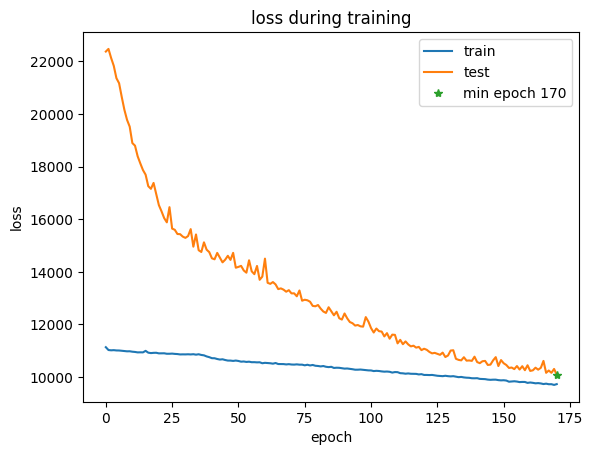

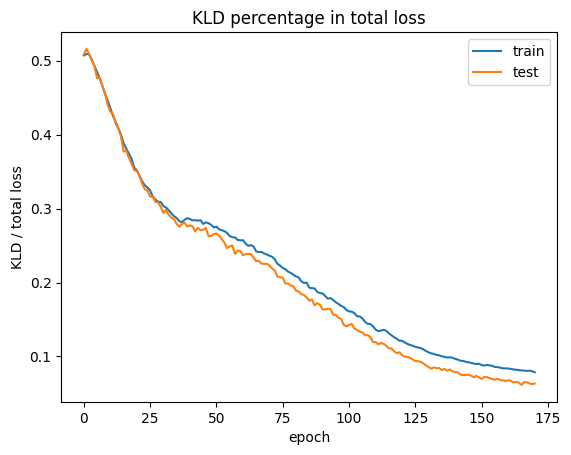

model save at:  model_files_beta/ckpt_170.pt
remove  model_files_beta/ckpt_141.pt


epoch 171: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9689.858, BCE: 9468.323, KLD: 820.708, KLD/(KLD+BCE): 7.977% beta:0.90
[valid] loss: 10134.756, BCE: 9494.250, KLD: 640.506, KLD/loss: 6.320%


epoch 172: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9694.910, BCE: 9474.471, KLD: 807.112, KLD/(KLD+BCE): 7.850% beta:0.90
[valid] loss: 10490.451, BCE: 9862.705, KLD: 627.746, KLD/loss: 5.984%


epoch 173: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9723.823, BCE: 9500.442, KLD: 791.624, KLD/(KLD+BCE): 7.692% beta:0.91
[valid] loss: 10266.647, BCE: 9632.100, KLD: 634.547, KLD/loss: 6.181%


epoch 174: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9690.028, BCE: 9465.498, KLD: 793.872, KLD/(KLD+BCE): 7.738% beta:0.91
[valid] loss: 10294.060, BCE: 9667.608, KLD: 626.452, KLD/loss: 6.086%


epoch 175: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9670.697, BCE: 9447.890, KLD: 790.669, KLD/(KLD+BCE): 7.722% beta:0.91
[valid] loss: 10068.717, BCE: 9434.685, KLD: 634.032, KLD/loss: 6.297%


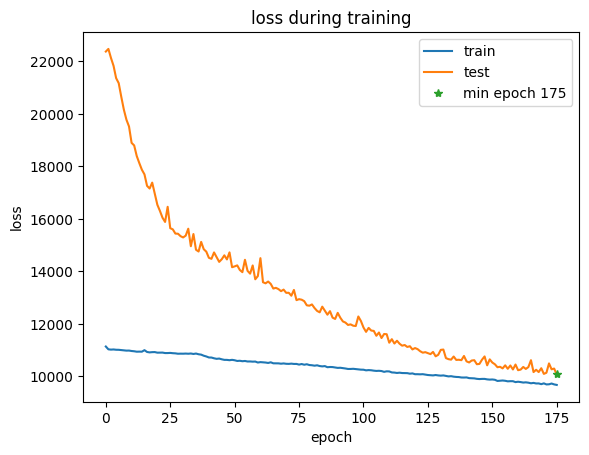

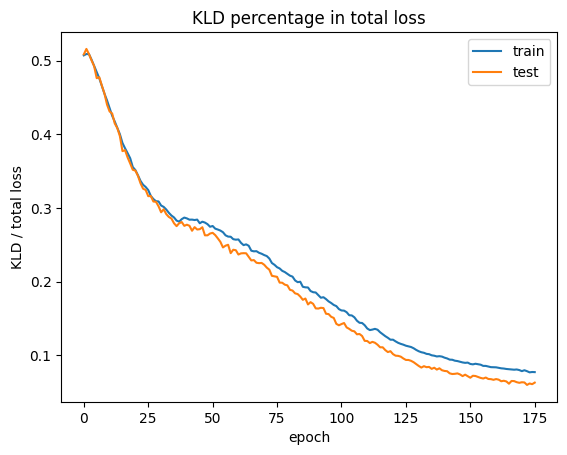

model save at:  model_files_beta/ckpt_175.pt
remove  model_files_beta/ckpt_144.pt


epoch 176: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9656.777, BCE: 9428.557, KLD: 794.363, KLD/(KLD+BCE): 7.770% beta:0.92
[valid] loss: 10143.857, BCE: 9517.409, KLD: 626.449, KLD/loss: 6.176%


epoch 177: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9651.187, BCE: 9420.827, KLD: 782.574, KLD/(KLD+BCE): 7.670% beta:0.92
[valid] loss: 10049.358, BCE: 9435.296, KLD: 614.062, KLD/loss: 6.110%
model save at:  model_files_beta/ckpt_177.pt
remove  model_files_beta/ckpt_148.pt


epoch 178: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9672.040, BCE: 9439.941, KLD: 784.979, KLD/(KLD+BCE): 7.677% beta:0.92
[valid] loss: 10079.786, BCE: 9465.045, KLD: 614.740, KLD/loss: 6.099%


epoch 179: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9645.998, BCE: 9413.540, KLD: 777.802, KLD/(KLD+BCE): 7.632% beta:0.93
[valid] loss: 10124.664, BCE: 9510.039, KLD: 614.625, KLD/loss: 6.071%


epoch 180: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9642.663, BCE: 9408.367, KLD: 777.744, KLD/(KLD+BCE): 7.635% beta:0.93
[valid] loss: 10004.393, BCE: 9393.508, KLD: 610.884, KLD/loss: 6.106%


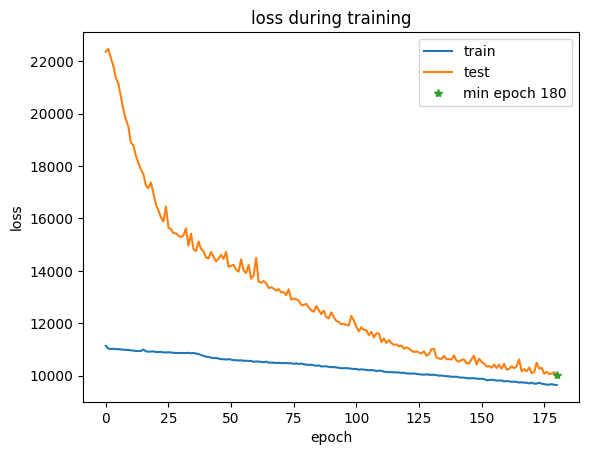

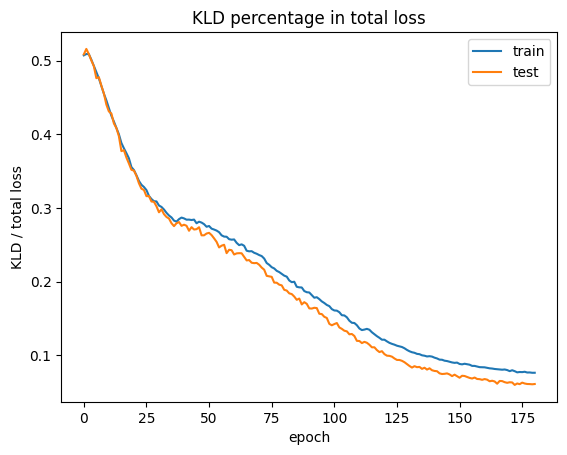

model save at:  model_files_beta/ckpt_180.pt
remove  model_files_beta/ckpt_152.pt


epoch 181: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9621.662, BCE: 9386.862, KLD: 772.203, KLD/(KLD+BCE): 7.601% beta:0.93
[valid] loss: 9987.478, BCE: 9377.180, KLD: 610.298, KLD/loss: 6.111%
model save at:  model_files_beta/ckpt_181.pt
remove  model_files_beta/ckpt_154.pt


epoch 182: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9653.121, BCE: 9413.385, KLD: 773.602, KLD/(KLD+BCE): 7.594% beta:0.94
[valid] loss: 10038.020, BCE: 9410.154, KLD: 627.866, KLD/loss: 6.255%


epoch 183: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9617.188, BCE: 9376.098, KLD: 777.752, KLD/(KLD+BCE): 7.660% beta:0.94
[valid] loss: 10189.034, BCE: 9565.433, KLD: 623.601, KLD/loss: 6.120%


epoch 184: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9597.805, BCE: 9355.710, KLD: 772.445, KLD/(KLD+BCE): 7.627% beta:0.94
[valid] loss: 10073.895, BCE: 9460.667, KLD: 613.229, KLD/loss: 6.087%


epoch 185: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9594.428, BCE: 9353.466, KLD: 768.756, KLD/(KLD+BCE): 7.595% beta:0.95
[valid] loss: 10198.564, BCE: 9583.564, KLD: 615.000, KLD/loss: 6.030%


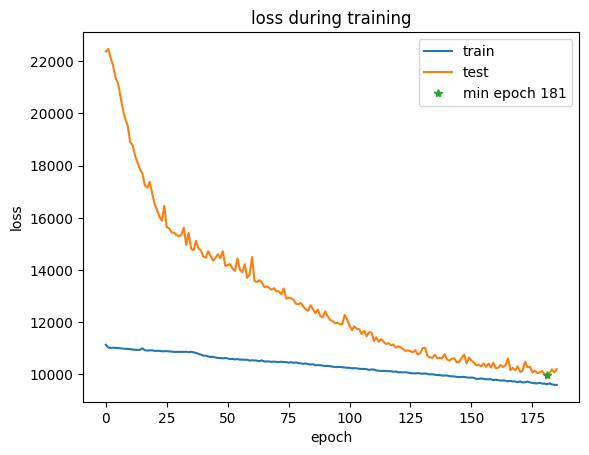

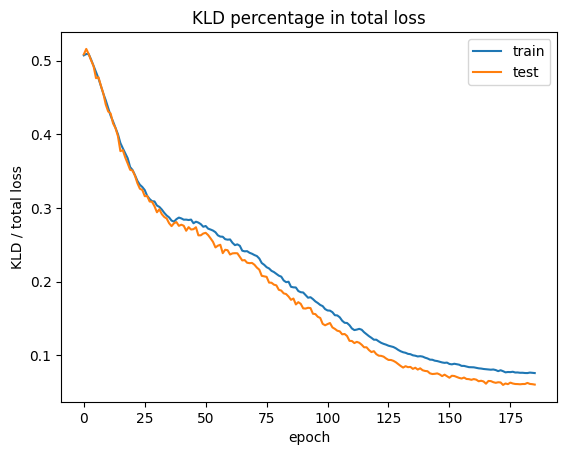

epoch 186: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9611.607, BCE: 9369.574, KLD: 766.698, KLD/(KLD+BCE): 7.564% beta:0.95
[valid] loss: 9957.804, BCE: 9356.546, KLD: 601.259, KLD/loss: 6.038%
model save at:  model_files_beta/ckpt_186.pt
remove  model_files_beta/ckpt_156.pt


epoch 187: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9602.023, BCE: 9352.492, KLD: 766.716, KLD/(KLD+BCE): 7.577% beta:0.95
[valid] loss: 10042.006, BCE: 9443.843, KLD: 598.163, KLD/loss: 5.957%


epoch 188: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9580.097, BCE: 9333.516, KLD: 752.191, KLD/(KLD+BCE): 7.458% beta:0.95
[valid] loss: 10021.339, BCE: 9418.713, KLD: 602.626, KLD/loss: 6.013%


epoch 189: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9588.010, BCE: 9338.864, KLD: 754.083, KLD/(KLD+BCE): 7.471% beta:0.95
[valid] loss: 9998.747, BCE: 9395.536, KLD: 603.211, KLD/loss: 6.033%


epoch 190: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9572.395, BCE: 9322.590, KLD: 748.214, KLD/(KLD+BCE): 7.430% beta:0.96
[valid] loss: 10032.158, BCE: 9425.755, KLD: 606.403, KLD/loss: 6.045%


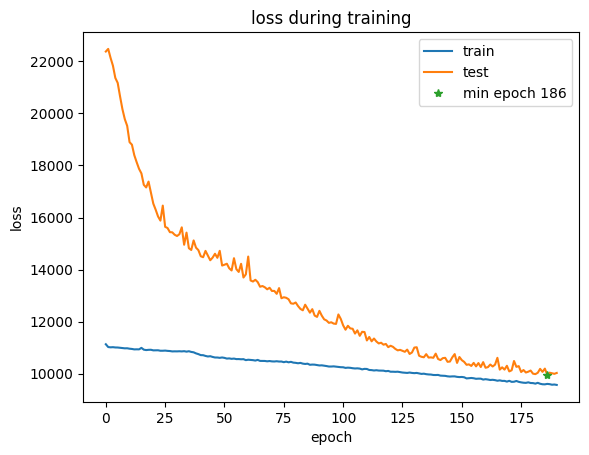

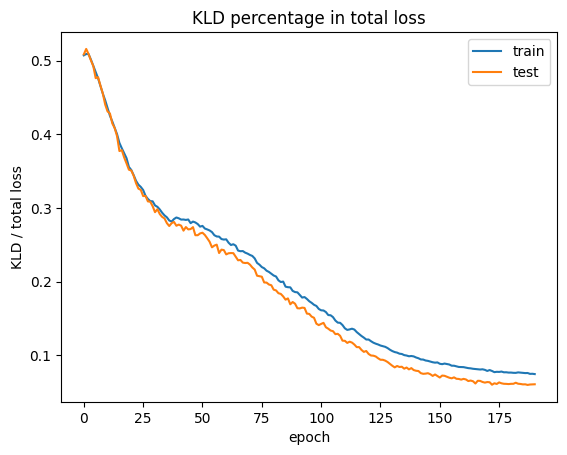

epoch 191: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9561.774, BCE: 9310.083, KLD: 748.022, KLD/(KLD+BCE): 7.437% beta:0.96
[valid] loss: 10026.984, BCE: 9426.036, KLD: 600.949, KLD/loss: 5.993%


epoch 192: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9579.934, BCE: 9326.228, KLD: 746.244, KLD/(KLD+BCE): 7.409% beta:0.96
[valid] loss: 9891.487, BCE: 9310.949, KLD: 580.538, KLD/loss: 5.869%
model save at:  model_files_beta/ckpt_192.pt
remove  model_files_beta/ckpt_158.pt


epoch 193: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9568.277, BCE: 9315.412, KLD: 738.666, KLD/(KLD+BCE): 7.347% beta:0.96
[valid] loss: 10100.381, BCE: 9502.906, KLD: 597.475, KLD/loss: 5.915%


epoch 194: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9570.542, BCE: 9314.461, KLD: 740.027, KLD/(KLD+BCE): 7.360% beta:0.96
[valid] loss: 9900.939, BCE: 9314.397, KLD: 586.543, KLD/loss: 5.924%


epoch 195: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9559.097, BCE: 9303.376, KLD: 732.559, KLD/(KLD+BCE): 7.299% beta:0.97
[valid] loss: 9929.830, BCE: 9348.575, KLD: 581.255, KLD/loss: 5.854%


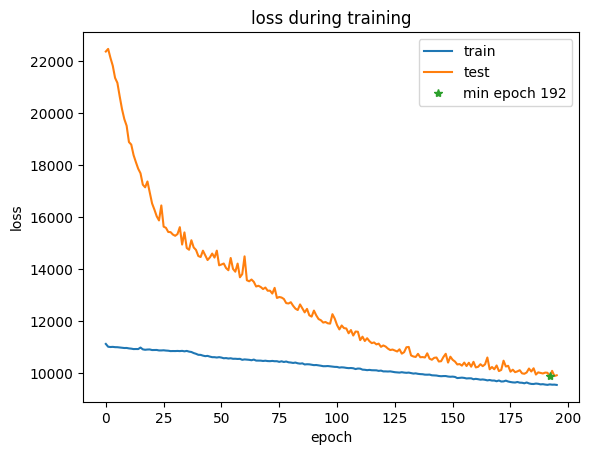

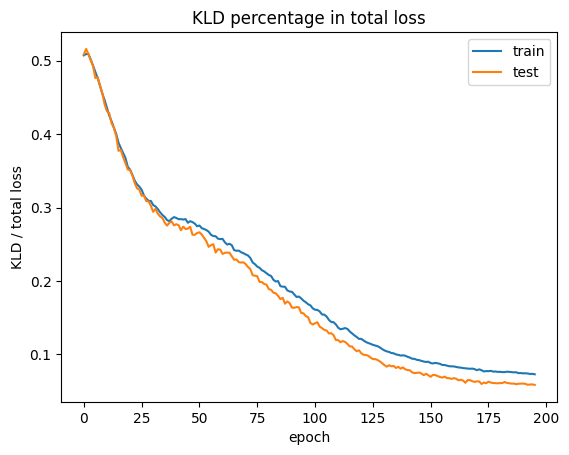

epoch 196: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9622.833, BCE: 9361.459, KLD: 732.432, KLD/(KLD+BCE): 7.256% beta:0.97
[valid] loss: 9858.869, BCE: 9271.605, KLD: 587.264, KLD/loss: 5.957%
model save at:  model_files_beta/ckpt_196.pt
remove  model_files_beta/ckpt_160.pt


epoch 197: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9522.974, BCE: 9262.898, KLD: 728.537, KLD/(KLD+BCE): 7.292% beta:0.97
[valid] loss: 9889.859, BCE: 9302.751, KLD: 587.108, KLD/loss: 5.936%


epoch 198: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9525.725, BCE: 9265.976, KLD: 721.328, KLD/(KLD+BCE): 7.222% beta:0.97
[valid] loss: 9967.044, BCE: 9388.169, KLD: 578.875, KLD/loss: 5.808%


epoch 199: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9516.649, BCE: 9252.825, KLD: 721.479, KLD/(KLD+BCE): 7.233% beta:0.97
[valid] loss: 9862.925, BCE: 9282.750, KLD: 580.175, KLD/loss: 5.882%


epoch 200: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9496.722, BCE: 9233.952, KLD: 722.822, KLD/(KLD+BCE): 7.260% beta:0.97
[valid] loss: 9894.353, BCE: 9324.293, KLD: 570.060, KLD/loss: 5.761%


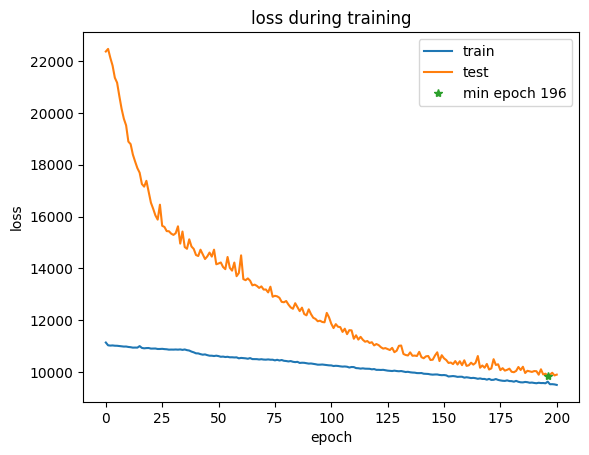

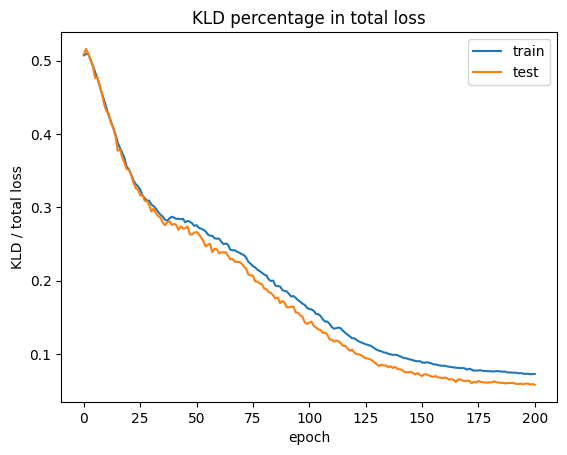

epoch 201: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9499.149, BCE: 9235.314, KLD: 723.079, KLD/(KLD+BCE): 7.261% beta:0.97
[valid] loss: 9784.972, BCE: 9206.220, KLD: 578.752, KLD/loss: 5.915%
model save at:  model_files_beta/ckpt_201.pt
remove  model_files_beta/ckpt_166.pt


epoch 202: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9480.919, BCE: 9216.691, KLD: 721.514, KLD/(KLD+BCE): 7.260% beta:0.97
[valid] loss: 9786.770, BCE: 9211.759, KLD: 575.011, KLD/loss: 5.875%


epoch 203: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9489.889, BCE: 9219.510, KLD: 719.527, KLD/(KLD+BCE): 7.239% beta:0.98
[valid] loss: 9862.899, BCE: 9298.491, KLD: 564.408, KLD/loss: 5.723%


epoch 204: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9484.332, BCE: 9214.127, KLD: 713.036, KLD/(KLD+BCE): 7.183% beta:0.98
[valid] loss: 9894.665, BCE: 9322.751, KLD: 571.914, KLD/loss: 5.780%


epoch 205: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9474.347, BCE: 9202.208, KLD: 714.818, KLD/(KLD+BCE): 7.208% beta:0.98
[valid] loss: 9808.263, BCE: 9242.320, KLD: 565.942, KLD/loss: 5.770%


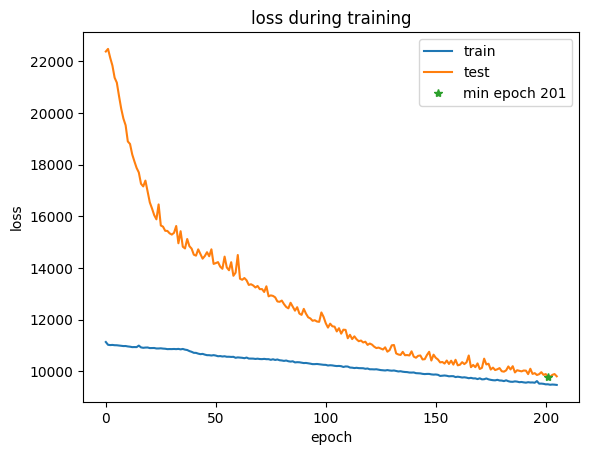

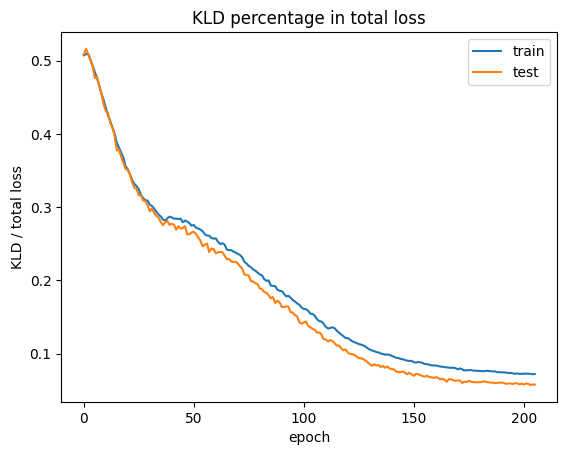

epoch 206: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9460.980, BCE: 9188.679, KLD: 711.627, KLD/(KLD+BCE): 7.188% beta:0.98
[valid] loss: 9839.211, BCE: 9279.504, KLD: 559.707, KLD/loss: 5.689%


epoch 207: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9499.070, BCE: 9225.157, KLD: 709.847, KLD/(KLD+BCE): 7.145% beta:0.98
[valid] loss: 10053.622, BCE: 9484.665, KLD: 568.957, KLD/loss: 5.659%


epoch 208: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9465.387, BCE: 9189.256, KLD: 711.000, KLD/(KLD+BCE): 7.182% beta:0.98
[valid] loss: 9780.318, BCE: 9208.052, KLD: 572.266, KLD/loss: 5.851%
model save at:  model_files_beta/ckpt_208.pt
remove  model_files_beta/ckpt_168.pt


epoch 209: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9438.031, BCE: 9163.341, KLD: 708.982, KLD/(KLD+BCE): 7.182% beta:0.98
[valid] loss: 9817.128, BCE: 9256.174, KLD: 560.954, KLD/loss: 5.714%


epoch 210: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9445.864, BCE: 9167.348, KLD: 707.935, KLD/(KLD+BCE): 7.169% beta:0.98
[valid] loss: 9869.427, BCE: 9297.764, KLD: 571.663, KLD/loss: 5.792%


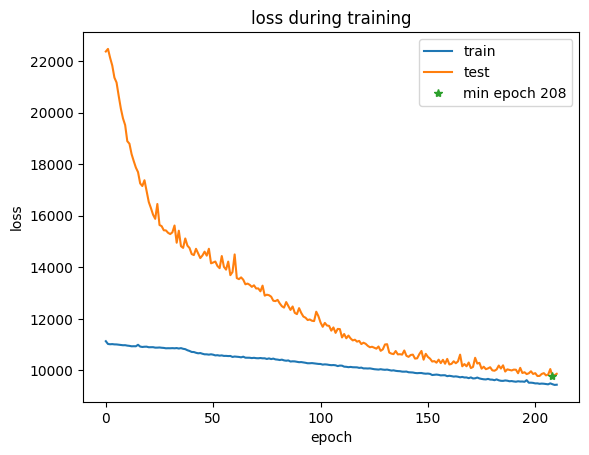

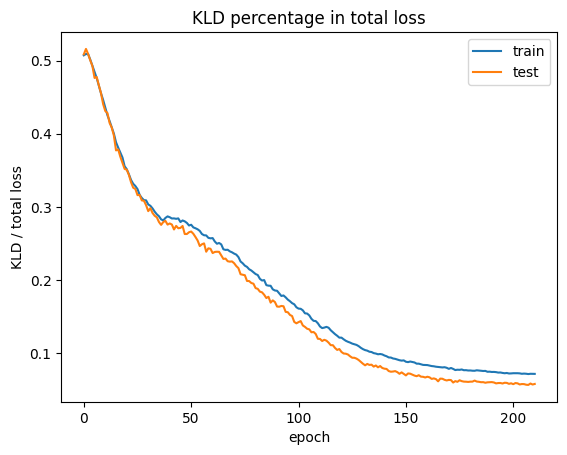

epoch 211: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9614.176, BCE: 9336.096, KLD: 723.166, KLD/(KLD+BCE): 7.189% beta:0.98
[valid] loss: 9914.262, BCE: 9348.275, KLD: 565.987, KLD/loss: 5.709%


epoch 212: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9465.830, BCE: 9188.667, KLD: 691.687, KLD/(KLD+BCE): 7.001% beta:0.98
[valid] loss: 9837.688, BCE: 9270.124, KLD: 567.564, KLD/loss: 5.769%


epoch 213: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9414.739, BCE: 9135.606, KLD: 692.827, KLD/(KLD+BCE): 7.049% beta:0.99
[valid] loss: 9719.364, BCE: 9159.238, KLD: 560.126, KLD/loss: 5.763%
model save at:  model_files_beta/ckpt_213.pt
remove  model_files_beta/ckpt_170.pt


epoch 214: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9395.098, BCE: 9114.294, KLD: 686.277, KLD/(KLD+BCE): 7.002% beta:0.99
[valid] loss: 9784.553, BCE: 9235.028, KLD: 549.525, KLD/loss: 5.616%


epoch 215: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9395.540, BCE: 9114.710, KLD: 689.931, KLD/(KLD+BCE): 7.037% beta:0.99
[valid] loss: 9790.368, BCE: 9217.717, KLD: 572.651, KLD/loss: 5.849%


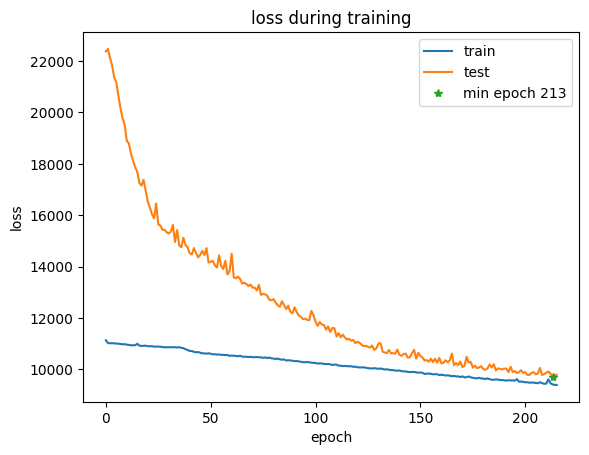

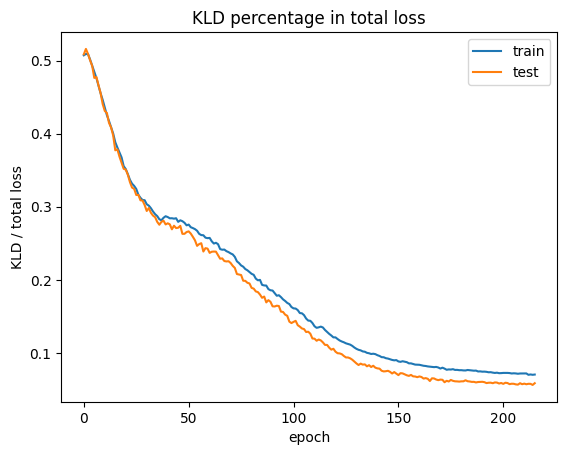

epoch 216: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9376.303, BCE: 9091.635, KLD: 697.943, KLD/(KLD+BCE): 7.129% beta:0.99
[valid] loss: 9931.192, BCE: 9358.441, KLD: 572.751, KLD/loss: 5.767%


epoch 217: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9392.020, BCE: 9109.618, KLD: 692.620, KLD/(KLD+BCE): 7.066% beta:0.99
[valid] loss: 9729.566, BCE: 9158.417, KLD: 571.149, KLD/loss: 5.870%


epoch 218: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9358.564, BCE: 9070.142, KLD: 699.913, KLD/(KLD+BCE): 7.164% beta:0.99
[valid] loss: 9669.587, BCE: 9103.903, KLD: 565.684, KLD/loss: 5.850%
model save at:  model_files_beta/ckpt_218.pt
remove  model_files_beta/ckpt_175.pt


epoch 219: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9350.902, BCE: 9060.264, KLD: 696.826, KLD/(KLD+BCE): 7.142% beta:0.99
[valid] loss: 9685.780, BCE: 9132.111, KLD: 553.669, KLD/loss: 5.716%


epoch 220: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9380.322, BCE: 9088.803, KLD: 700.680, KLD/(KLD+BCE): 7.157% beta:0.99
[valid] loss: 9771.362, BCE: 9213.765, KLD: 557.598, KLD/loss: 5.706%


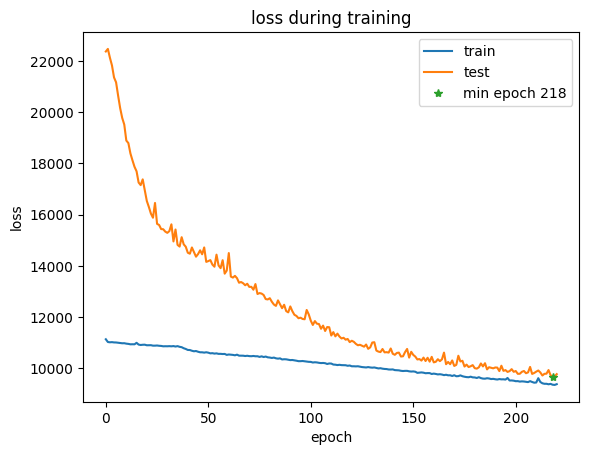

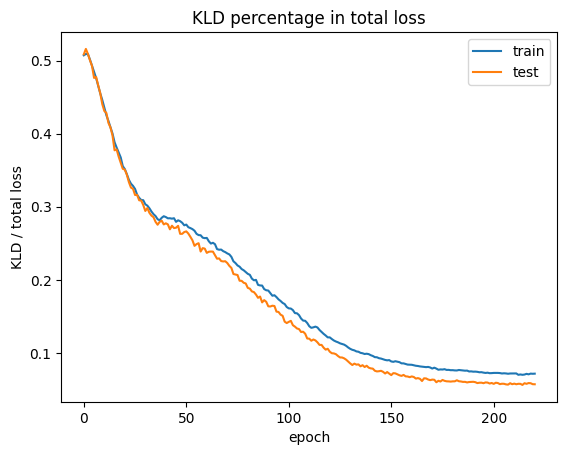

epoch 221: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9352.274, BCE: 9057.034, KLD: 696.000, KLD/(KLD+BCE): 7.136% beta:0.99
[valid] loss: 9781.041, BCE: 9209.102, KLD: 571.939, KLD/loss: 5.847%


epoch 222: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9347.820, BCE: 9053.894, KLD: 692.473, KLD/(KLD+BCE): 7.105% beta:0.99
[valid] loss: 9788.026, BCE: 9225.248, KLD: 562.778, KLD/loss: 5.750%


epoch 223: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 9316.189, BCE: 9022.958, KLD: 690.197, KLD/(KLD+BCE): 7.106% beta:0.99
[valid] loss: 9658.036, BCE: 9107.424, KLD: 550.613, KLD/loss: 5.701%
model save at:  model_files_beta/ckpt_223.pt
remove  model_files_beta/ckpt_177.pt


epoch 224: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9314.628, BCE: 9016.254, KLD: 695.431, KLD/(KLD+BCE): 7.161% beta:0.99
[valid] loss: 9633.542, BCE: 9074.275, KLD: 559.267, KLD/loss: 5.805%
model save at:  model_files_beta/ckpt_224.pt
remove  model_files_beta/ckpt_180.pt


epoch 225: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9305.419, BCE: 9005.134, KLD: 696.711, KLD/(KLD+BCE): 7.181% beta:0.99
[valid] loss: 9662.734, BCE: 9107.343, KLD: 555.391, KLD/loss: 5.748%


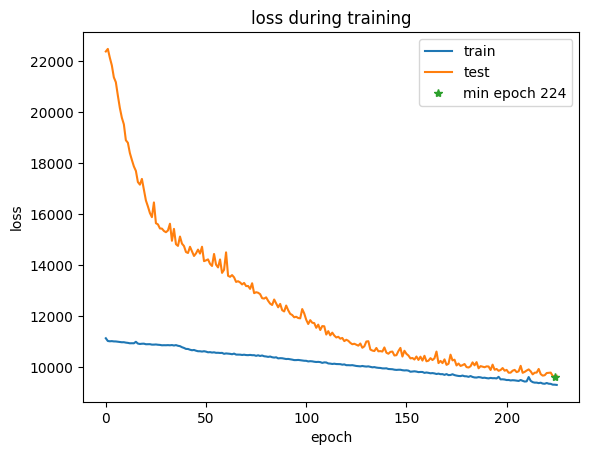

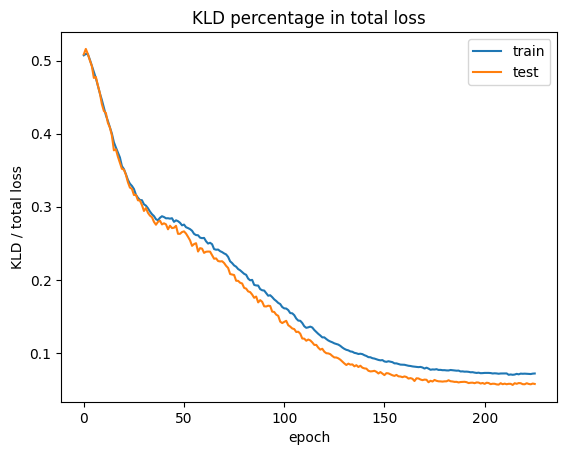

epoch 226: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9299.836, BCE: 8997.311, KLD: 701.357, KLD/(KLD+BCE): 7.231% beta:0.99
[valid] loss: 9629.382, BCE: 9070.217, KLD: 559.165, KLD/loss: 5.807%
model save at:  model_files_beta/ckpt_226.pt
remove  model_files_beta/ckpt_181.pt


epoch 227: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9332.208, BCE: 9032.183, KLD: 698.225, KLD/(KLD+BCE): 7.176% beta:0.99
[valid] loss: 9751.631, BCE: 9198.800, KLD: 552.831, KLD/loss: 5.669%


epoch 228: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9294.837, BCE: 8993.586, KLD: 684.883, KLD/(KLD+BCE): 7.076% beta:0.99
[valid] loss: 9613.050, BCE: 9049.989, KLD: 563.061, KLD/loss: 5.857%
model save at:  model_files_beta/ckpt_228.pt
remove  model_files_beta/ckpt_186.pt


epoch 229: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9297.031, BCE: 8987.864, KLD: 702.934, KLD/(KLD+BCE): 7.254% beta:0.99
[valid] loss: 9696.747, BCE: 9124.690, KLD: 572.057, KLD/loss: 5.899%


epoch 230: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9268.588, BCE: 8961.846, KLD: 695.883, KLD/(KLD+BCE): 7.205% beta:0.99
[valid] loss: 9602.921, BCE: 9035.815, KLD: 567.106, KLD/loss: 5.906%


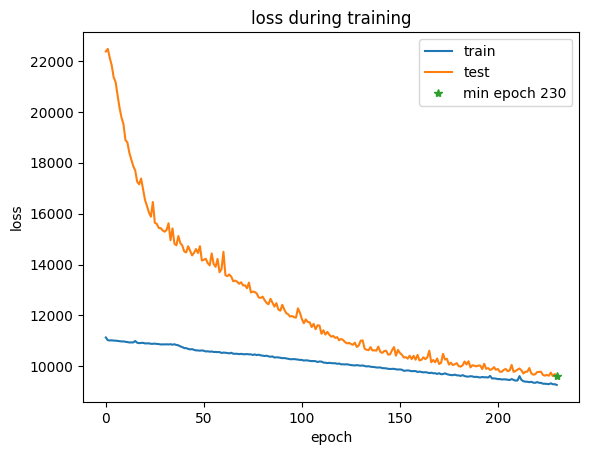

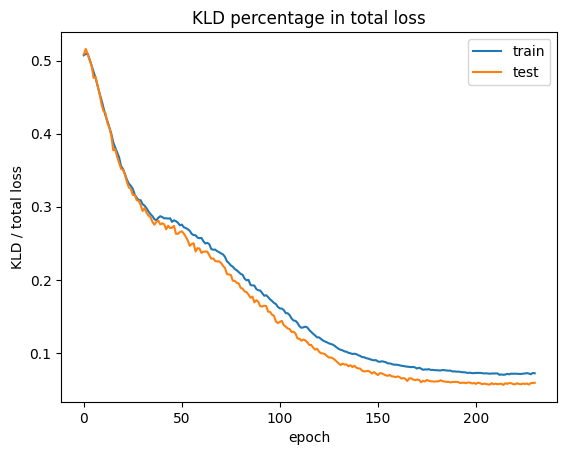

model save at:  model_files_beta/ckpt_230.pt
remove  model_files_beta/ckpt_192.pt


epoch 231: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 9229.011, BCE: 8922.131, KLD: 696.674, KLD/(KLD+BCE): 7.243% beta:0.99
[valid] loss: 9899.426, BCE: 9334.056, KLD: 565.370, KLD/loss: 5.711%


epoch 232: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9246.539, BCE: 8934.943, KLD: 696.966, KLD/(KLD+BCE): 7.236% beta:0.99
[valid] loss: 9557.789, BCE: 8999.906, KLD: 557.883, KLD/loss: 5.837%
model save at:  model_files_beta/ckpt_232.pt
remove  model_files_beta/ckpt_196.pt


epoch 233: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9231.822, BCE: 8918.706, KLD: 694.393, KLD/(KLD+BCE): 7.223% beta:0.99
[valid] loss: 9644.574, BCE: 9089.690, KLD: 554.884, KLD/loss: 5.753%


epoch 234: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9227.691, BCE: 8913.982, KLD: 692.485, KLD/(KLD+BCE): 7.209% beta:0.99
[valid] loss: 9536.325, BCE: 8974.424, KLD: 561.901, KLD/loss: 5.892%
model save at:  model_files_beta/ckpt_234.pt
remove  model_files_beta/ckpt_201.pt


epoch 235: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9224.173, BCE: 8913.362, KLD: 691.269, KLD/(KLD+BCE): 7.197% beta:0.99
[valid] loss: 9586.555, BCE: 9006.666, KLD: 579.889, KLD/loss: 6.049%


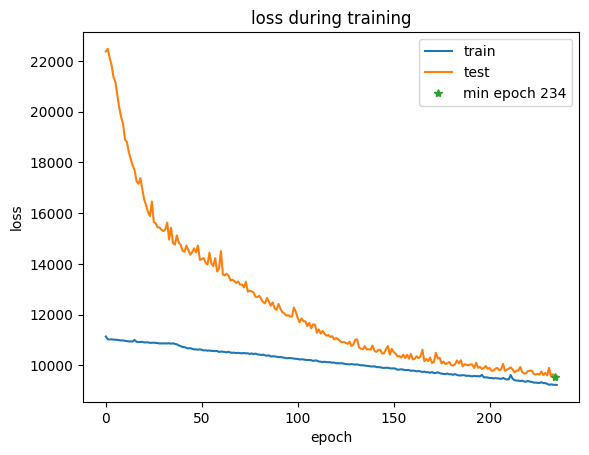

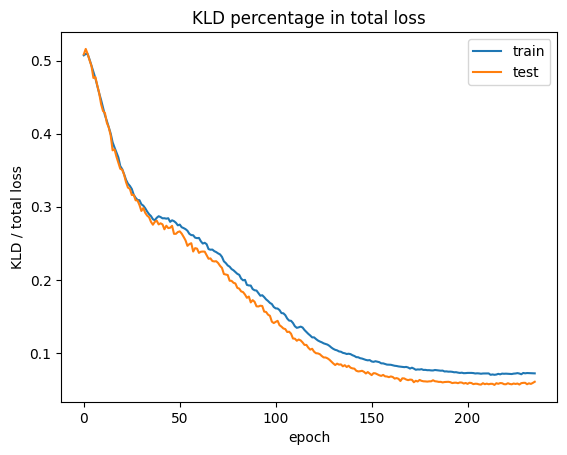

epoch 236: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 9206.273, BCE: 8889.421, KLD: 695.074, KLD/(KLD+BCE): 7.252% beta:0.99
[valid] loss: 9508.832, BCE: 8952.676, KLD: 556.156, KLD/loss: 5.849%
model save at:  model_files_beta/ckpt_236.pt
remove  model_files_beta/ckpt_208.pt


epoch 237: 100%|██████████| 266/266 [00:26<00:00,  9.93it/s]


[train] loss: 9213.945, BCE: 8896.704, KLD: 690.606, KLD/(KLD+BCE): 7.203% beta:1.00
[valid] loss: 9805.598, BCE: 9231.538, KLD: 574.060, KLD/loss: 5.854%


epoch 238: 100%|██████████| 266/266 [00:26<00:00, 10.01it/s]


[train] loss: 9198.536, BCE: 8878.039, KLD: 695.654, KLD/(KLD+BCE): 7.266% beta:1.00
[valid] loss: 9491.726, BCE: 8922.971, KLD: 568.755, KLD/loss: 5.992%
model save at:  model_files_beta/ckpt_238.pt
remove  model_files_beta/ckpt_213.pt


epoch 239: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 9208.301, BCE: 8886.029, KLD: 700.871, KLD/(KLD+BCE): 7.311% beta:1.00
[valid] loss: 9550.844, BCE: 8977.826, KLD: 573.018, KLD/loss: 6.000%


epoch 240: 100%|██████████| 266/266 [00:26<00:00, 10.08it/s]


[train] loss: 9182.847, BCE: 8860.408, KLD: 699.433, KLD/(KLD+BCE): 7.316% beta:1.00
[valid] loss: 9581.378, BCE: 9008.123, KLD: 573.254, KLD/loss: 5.983%


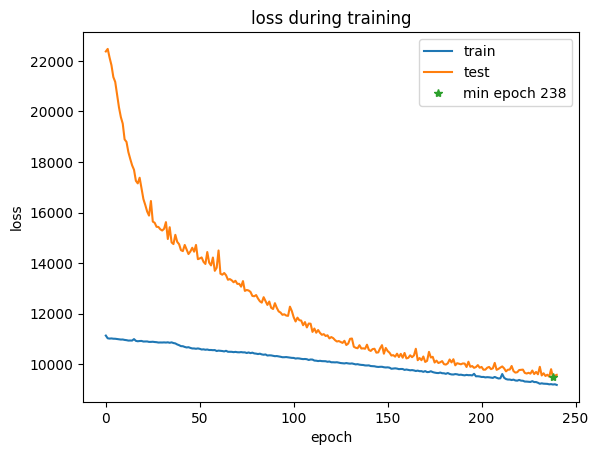

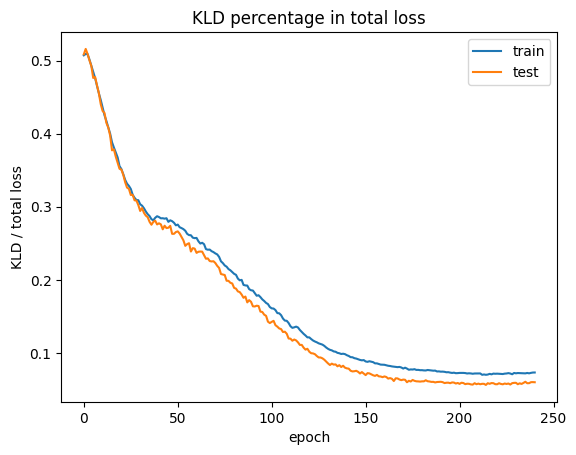

epoch 241: 100%|██████████| 266/266 [00:26<00:00, 10.10it/s]


[train] loss: 9174.515, BCE: 8850.163, KLD: 692.905, KLD/(KLD+BCE): 7.261% beta:1.00
[valid] loss: 9562.374, BCE: 8990.170, KLD: 572.204, KLD/loss: 5.984%


epoch 242: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 9178.913, BCE: 8854.038, KLD: 694.644, KLD/(KLD+BCE): 7.275% beta:1.00
[valid] loss: 9571.700, BCE: 9008.943, KLD: 562.757, KLD/loss: 5.879%


epoch 243: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9143.506, BCE: 8821.161, KLD: 684.826, KLD/(KLD+BCE): 7.204% beta:1.00
[valid] loss: 9549.289, BCE: 8980.569, KLD: 568.721, KLD/loss: 5.956%


epoch 244: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9156.295, BCE: 8831.116, KLD: 691.846, KLD/(KLD+BCE): 7.265% beta:1.00
[valid] loss: 9430.617, BCE: 8865.554, KLD: 565.064, KLD/loss: 5.992%
model save at:  model_files_beta/ckpt_244.pt
remove  model_files_beta/ckpt_218.pt


epoch 245: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9150.521, BCE: 8822.761, KLD: 690.609, KLD/(KLD+BCE): 7.259% beta:1.00
[valid] loss: 9477.344, BCE: 8908.895, KLD: 568.449, KLD/loss: 5.998%


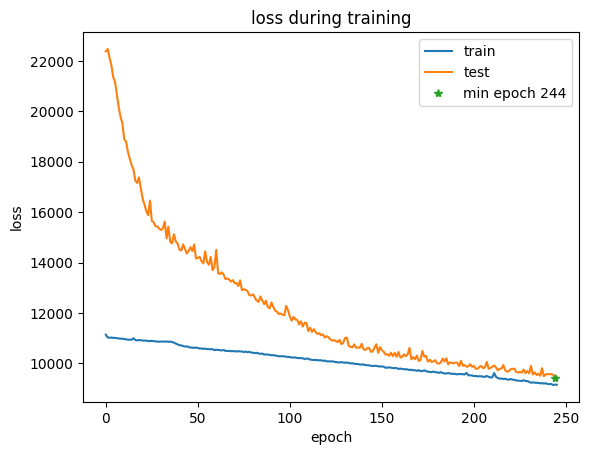

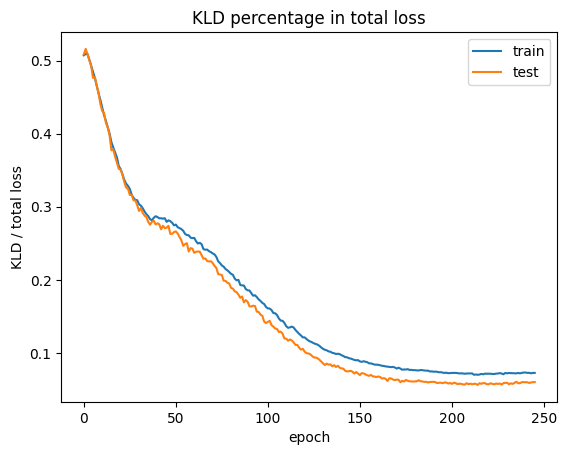

epoch 246: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9146.802, BCE: 8812.147, KLD: 696.050, KLD/(KLD+BCE): 7.321% beta:1.00
[valid] loss: 9443.709, BCE: 8862.125, KLD: 581.584, KLD/loss: 6.158%


epoch 247: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9185.237, BCE: 8848.932, KLD: 700.733, KLD/(KLD+BCE): 7.338% beta:1.00
[valid] loss: 9451.874, BCE: 8873.254, KLD: 578.620, KLD/loss: 6.122%


epoch 248: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9123.453, BCE: 8791.346, KLD: 691.846, KLD/(KLD+BCE): 7.296% beta:1.00
[valid] loss: 9502.393, BCE: 8926.643, KLD: 575.749, KLD/loss: 6.059%


epoch 249: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9109.877, BCE: 8775.824, KLD: 693.887, KLD/(KLD+BCE): 7.327% beta:1.00
[valid] loss: 9673.982, BCE: 9089.765, KLD: 584.217, KLD/loss: 6.039%


epoch 250: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9123.634, BCE: 8784.364, KLD: 696.507, KLD/(KLD+BCE): 7.346% beta:1.00
[valid] loss: 9431.809, BCE: 8842.943, KLD: 588.866, KLD/loss: 6.243%


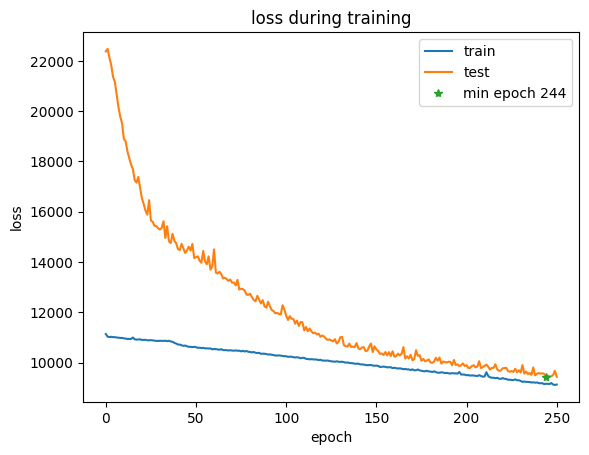

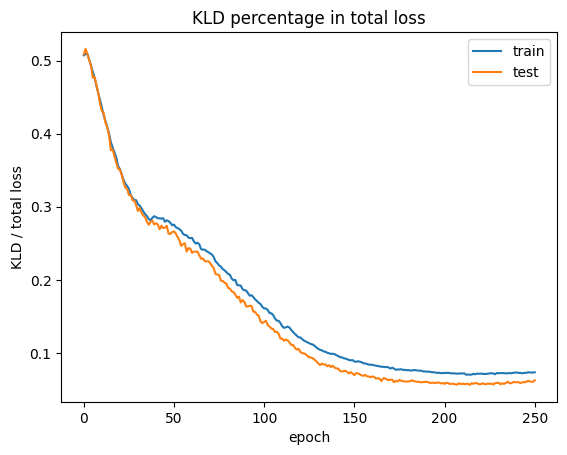

epoch 251: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9105.646, BCE: 8764.951, KLD: 697.850, KLD/(KLD+BCE): 7.375% beta:1.00
[valid] loss: 9438.759, BCE: 8870.637, KLD: 568.122, KLD/loss: 6.019%


epoch 252: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9096.180, BCE: 8759.034, KLD: 688.479, KLD/(KLD+BCE): 7.287% beta:1.00
[valid] loss: 9419.980, BCE: 8837.613, KLD: 582.367, KLD/loss: 6.182%
model save at:  model_files_beta/ckpt_252.pt
remove  model_files_beta/ckpt_223.pt


epoch 253: 100%|██████████| 266/266 [00:26<00:00, 10.19it/s]


[train] loss: 9399.728, BCE: 9068.497, KLD: 702.266, KLD/(KLD+BCE): 7.187% beta:1.00
[valid] loss: 9535.782, BCE: 8972.760, KLD: 563.022, KLD/loss: 5.904%


epoch 254: 100%|██████████| 266/266 [00:26<00:00, 10.17it/s]


[train] loss: 9172.465, BCE: 8837.551, KLD: 674.974, KLD/(KLD+BCE): 7.096% beta:1.00
[valid] loss: 9495.978, BCE: 8931.177, KLD: 564.801, KLD/loss: 5.948%


epoch 255: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9111.949, BCE: 8770.951, KLD: 685.950, KLD/(KLD+BCE): 7.253% beta:1.00
[valid] loss: 9481.439, BCE: 8900.148, KLD: 581.291, KLD/loss: 6.131%


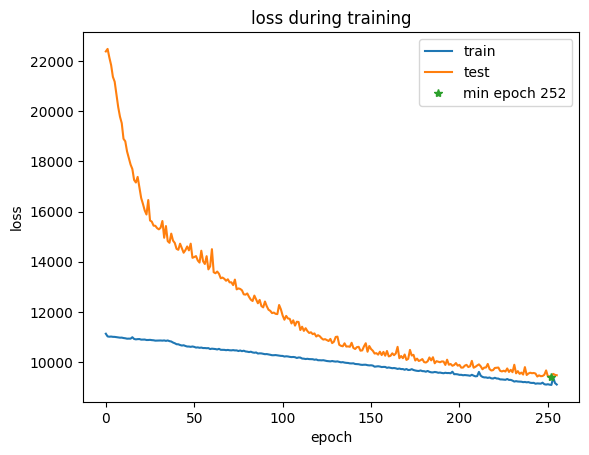

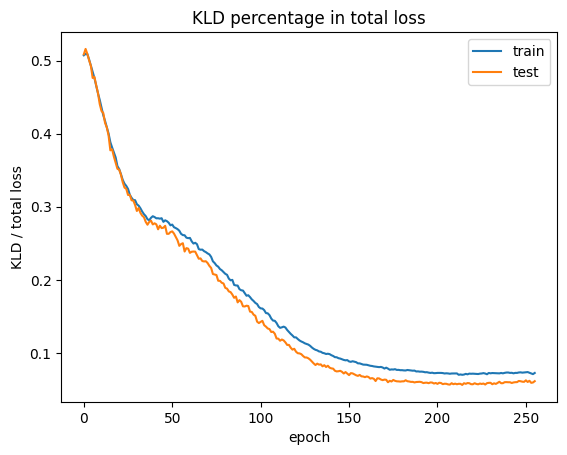

epoch 256: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9195.043, BCE: 8850.072, KLD: 692.609, KLD/(KLD+BCE): 7.258% beta:1.00
[valid] loss: 9533.491, BCE: 8953.033, KLD: 580.458, KLD/loss: 6.089%


epoch 257: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9202.530, BCE: 8856.860, KLD: 690.161, KLD/(KLD+BCE): 7.229% beta:1.00
[valid] loss: 9470.874, BCE: 8901.192, KLD: 569.681, KLD/loss: 6.015%


epoch 258: 100%|██████████| 266/266 [00:26<00:00, 10.16it/s]


[train] loss: 9182.212, BCE: 8842.770, KLD: 680.176, KLD/(KLD+BCE): 7.142% beta:1.00
[valid] loss: 9528.311, BCE: 8950.719, KLD: 577.592, KLD/loss: 6.062%


epoch 259: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9136.740, BCE: 8790.946, KLD: 684.981, KLD/(KLD+BCE): 7.229% beta:1.00
[valid] loss: 9464.093, BCE: 8889.753, KLD: 574.340, KLD/loss: 6.069%


epoch 260: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9098.190, BCE: 8749.247, KLD: 686.390, KLD/(KLD+BCE): 7.274% beta:1.00
[valid] loss: 9457.027, BCE: 8875.137, KLD: 581.890, KLD/loss: 6.153%


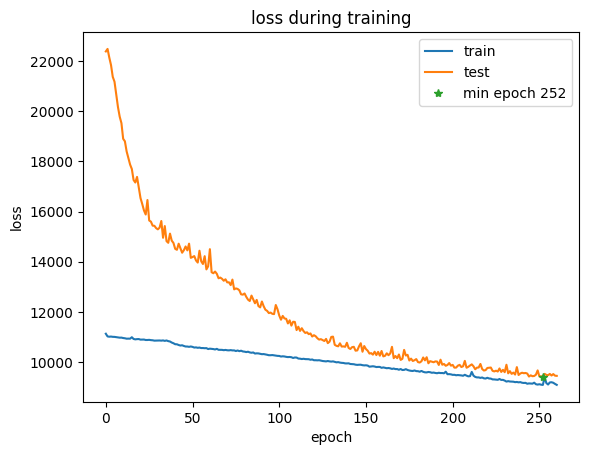

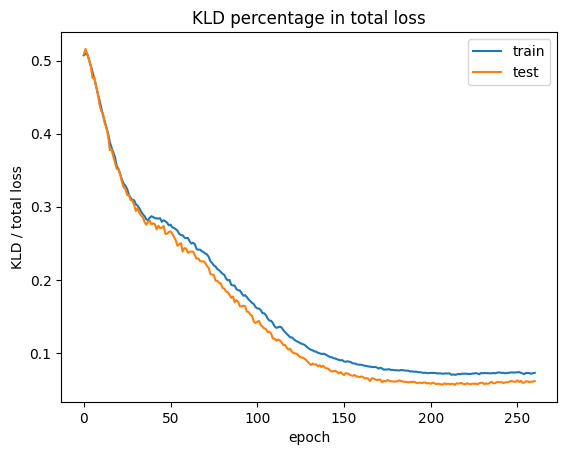

epoch 261: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9050.657, BCE: 8701.562, KLD: 689.337, KLD/(KLD+BCE): 7.340% beta:1.00
[valid] loss: 9491.000, BCE: 8910.527, KLD: 580.473, KLD/loss: 6.116%


epoch 262: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9019.918, BCE: 8673.202, KLD: 688.259, KLD/(KLD+BCE): 7.352% beta:1.00
[valid] loss: 9430.905, BCE: 8844.462, KLD: 586.443, KLD/loss: 6.218%


epoch 263: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9021.980, BCE: 8673.788, KLD: 691.344, KLD/(KLD+BCE): 7.382% beta:1.00
[valid] loss: 9415.651, BCE: 8842.962, KLD: 572.689, KLD/loss: 6.082%
model save at:  model_files_beta/ckpt_263.pt
remove  model_files_beta/ckpt_224.pt


epoch 264: 100%|██████████| 266/266 [00:26<00:00, 10.15it/s]


[train] loss: 9036.232, BCE: 8685.511, KLD: 691.960, KLD/(KLD+BCE): 7.379% beta:1.00
[valid] loss: 9317.586, BCE: 8739.339, KLD: 578.247, KLD/loss: 6.206%
model save at:  model_files_beta/ckpt_264.pt
remove  model_files_beta/ckpt_226.pt


epoch 265: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9024.647, BCE: 8669.339, KLD: 688.779, KLD/(KLD+BCE): 7.360% beta:1.00
[valid] loss: 9442.905, BCE: 8877.305, KLD: 565.600, KLD/loss: 5.990%


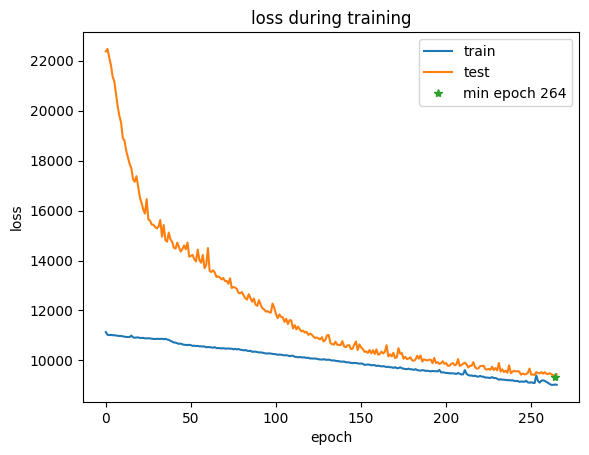

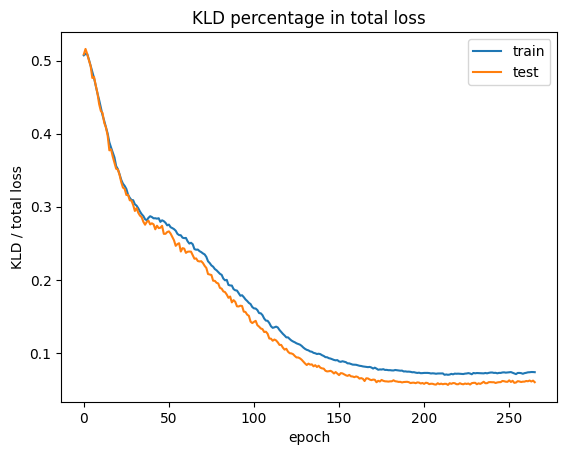

epoch 266: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9014.283, BCE: 8659.713, KLD: 685.616, KLD/(KLD+BCE): 7.336% beta:1.00
[valid] loss: 9280.525, BCE: 8703.165, KLD: 577.360, KLD/loss: 6.221%
model save at:  model_files_beta/ckpt_266.pt
remove  model_files_beta/ckpt_228.pt


epoch 267: 100%|██████████| 266/266 [00:26<00:00, 10.16it/s]


[train] loss: 9021.597, BCE: 8663.805, KLD: 689.539, KLD/(KLD+BCE): 7.372% beta:1.00
[valid] loss: 9321.403, BCE: 8744.805, KLD: 576.598, KLD/loss: 6.186%


epoch 268: 100%|██████████| 266/266 [00:26<00:00, 10.17it/s]


[train] loss: 9006.398, BCE: 8646.669, KLD: 695.374, KLD/(KLD+BCE): 7.443% beta:1.00
[valid] loss: 9414.979, BCE: 8831.503, KLD: 583.476, KLD/loss: 6.197%


epoch 269: 100%|██████████| 266/266 [00:26<00:00, 10.16it/s]


[train] loss: 9015.607, BCE: 8654.731, KLD: 690.711, KLD/(KLD+BCE): 7.391% beta:1.00
[valid] loss: 9549.091, BCE: 8978.196, KLD: 570.896, KLD/loss: 5.979%


epoch 270: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 9025.351, BCE: 8668.568, KLD: 683.564, KLD/(KLD+BCE): 7.309% beta:1.00
[valid] loss: 9356.760, BCE: 8788.460, KLD: 568.299, KLD/loss: 6.074%


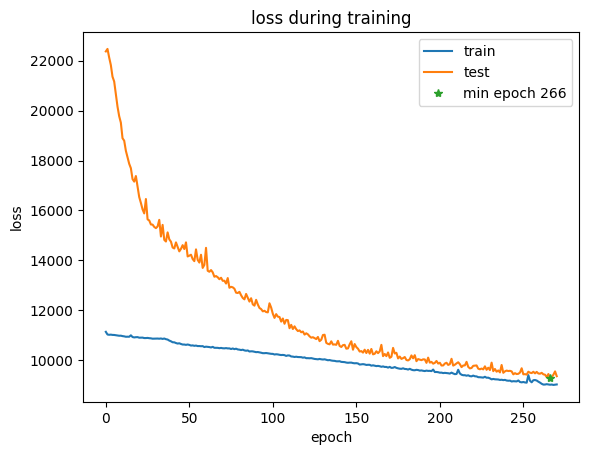

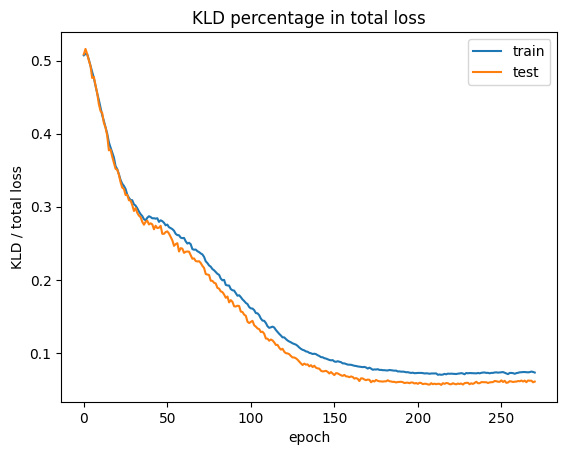

epoch 271: 100%|██████████| 266/266 [00:26<00:00, 10.14it/s]


[train] loss: 9046.298, BCE: 8692.389, KLD: 670.058, KLD/(KLD+BCE): 7.157% beta:1.00
[valid] loss: 9327.812, BCE: 8751.111, KLD: 576.701, KLD/loss: 6.183%


epoch 272: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8964.215, BCE: 8601.805, KLD: 690.874, KLD/(KLD+BCE): 7.435% beta:1.00
[valid] loss: 9329.580, BCE: 8740.227, KLD: 589.352, KLD/loss: 6.317%


epoch 273: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9005.696, BCE: 8643.766, KLD: 687.461, KLD/(KLD+BCE): 7.367% beta:1.00
[valid] loss: 9532.340, BCE: 8956.426, KLD: 575.914, KLD/loss: 6.042%


epoch 274: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 8961.120, BCE: 8599.430, KLD: 680.983, KLD/(KLD+BCE): 7.338% beta:1.00
[valid] loss: 9458.977, BCE: 8882.094, KLD: 576.883, KLD/loss: 6.099%


epoch 275: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8961.322, BCE: 8593.402, KLD: 690.146, KLD/(KLD+BCE): 7.434% beta:1.00
[valid] loss: 9414.014, BCE: 8829.694, KLD: 584.320, KLD/loss: 6.207%


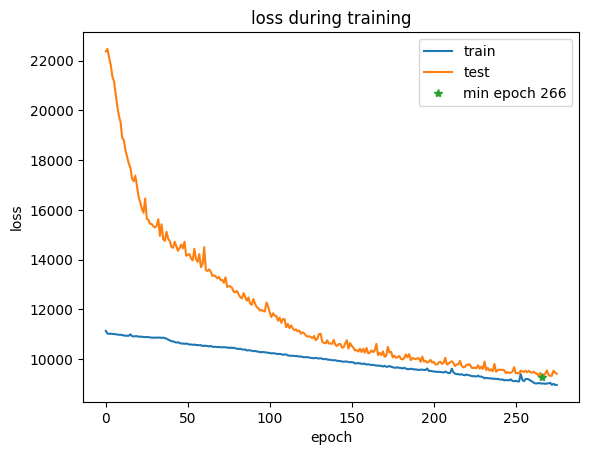

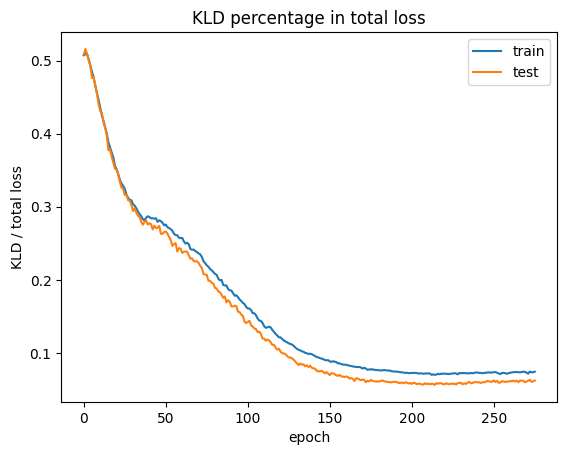

epoch 276: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8923.093, BCE: 8551.209, KLD: 695.322, KLD/(KLD+BCE): 7.520% beta:1.00
[valid] loss: 9293.339, BCE: 8704.772, KLD: 588.567, KLD/loss: 6.333%


epoch 277: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8978.029, BCE: 8607.613, KLD: 694.106, KLD/(KLD+BCE): 7.462% beta:1.00
[valid] loss: 9290.372, BCE: 8705.422, KLD: 584.949, KLD/loss: 6.296%


epoch 278: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8941.046, BCE: 8571.660, KLD: 689.429, KLD/(KLD+BCE): 7.444% beta:1.00
[valid] loss: 9258.346, BCE: 8677.783, KLD: 580.562, KLD/loss: 6.271%
model save at:  model_files_beta/ckpt_278.pt
remove  model_files_beta/ckpt_230.pt


epoch 279: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8958.701, BCE: 8587.032, KLD: 688.068, KLD/(KLD+BCE): 7.418% beta:1.00
[valid] loss: 9293.953, BCE: 8709.858, KLD: 584.095, KLD/loss: 6.285%


epoch 280: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8916.953, BCE: 8544.505, KLD: 688.349, KLD/(KLD+BCE): 7.455% beta:1.00
[valid] loss: 9299.565, BCE: 8711.762, KLD: 587.802, KLD/loss: 6.321%


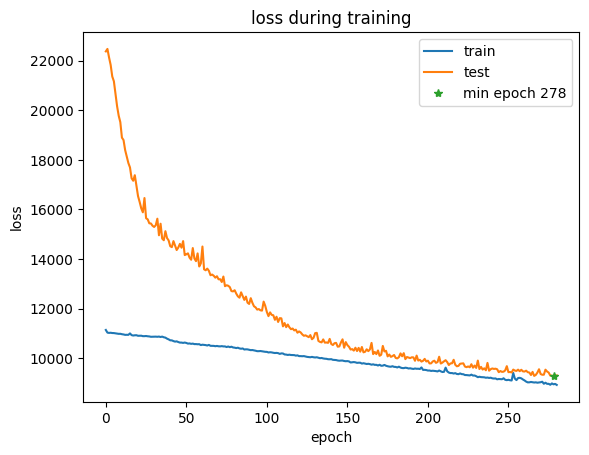

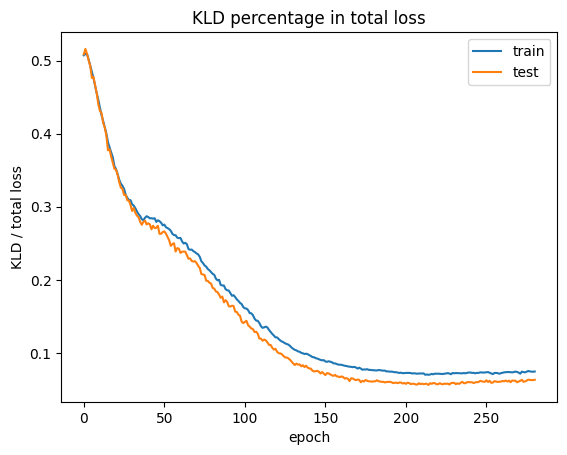

epoch 281: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8943.002, BCE: 8568.023, KLD: 687.670, KLD/(KLD+BCE): 7.430% beta:1.00
[valid] loss: 9478.157, BCE: 8887.832, KLD: 590.324, KLD/loss: 6.228%


epoch 282: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8899.893, BCE: 8525.470, KLD: 687.137, KLD/(KLD+BCE): 7.459% beta:1.00
[valid] loss: 9223.540, BCE: 8637.236, KLD: 586.304, KLD/loss: 6.357%
model save at:  model_files_beta/ckpt_282.pt
remove  model_files_beta/ckpt_232.pt


epoch 283: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8925.596, BCE: 8547.293, KLD: 691.830, KLD/(KLD+BCE): 7.488% beta:1.00
[valid] loss: 9288.557, BCE: 8699.915, KLD: 588.642, KLD/loss: 6.337%


epoch 284: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8897.567, BCE: 8520.058, KLD: 692.495, KLD/(KLD+BCE): 7.517% beta:1.00
[valid] loss: 9241.234, BCE: 8653.393, KLD: 587.841, KLD/loss: 6.361%


epoch 285: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8902.522, BCE: 8523.263, KLD: 689.446, KLD/(KLD+BCE): 7.484% beta:1.00
[valid] loss: 9341.091, BCE: 8747.044, KLD: 594.047, KLD/loss: 6.360%


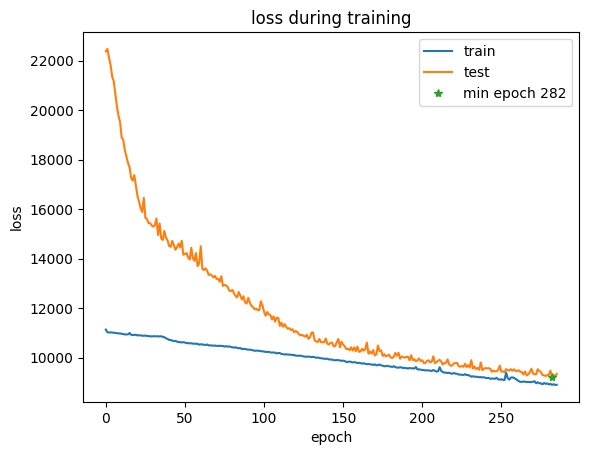

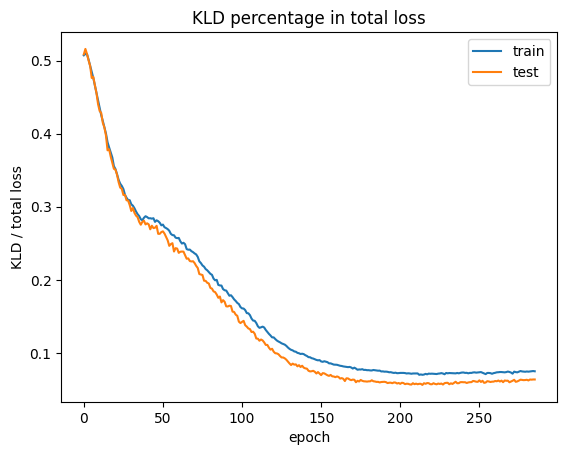

epoch 286: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8873.521, BCE: 8494.637, KLD: 688.812, KLD/(KLD+BCE): 7.501% beta:1.00
[valid] loss: 9198.753, BCE: 8617.492, KLD: 581.261, KLD/loss: 6.319%
model save at:  model_files_beta/ckpt_286.pt
remove  model_files_beta/ckpt_234.pt


epoch 287: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8892.880, BCE: 8516.972, KLD: 686.007, KLD/(KLD+BCE): 7.454% beta:1.00
[valid] loss: 9241.490, BCE: 8654.409, KLD: 587.081, KLD/loss: 6.353%


epoch 288: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8905.392, BCE: 8522.550, KLD: 696.144, KLD/(KLD+BCE): 7.551% beta:1.00
[valid] loss: 9472.303, BCE: 8862.319, KLD: 609.984, KLD/loss: 6.440%


epoch 289: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8854.476, BCE: 8471.207, KLD: 694.483, KLD/(KLD+BCE): 7.577% beta:1.00
[valid] loss: 9233.188, BCE: 8643.059, KLD: 590.129, KLD/loss: 6.391%


epoch 290: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8923.981, BCE: 8547.050, KLD: 682.393, KLD/(KLD+BCE): 7.394% beta:1.00
[valid] loss: 9452.248, BCE: 8868.811, KLD: 583.436, KLD/loss: 6.172%


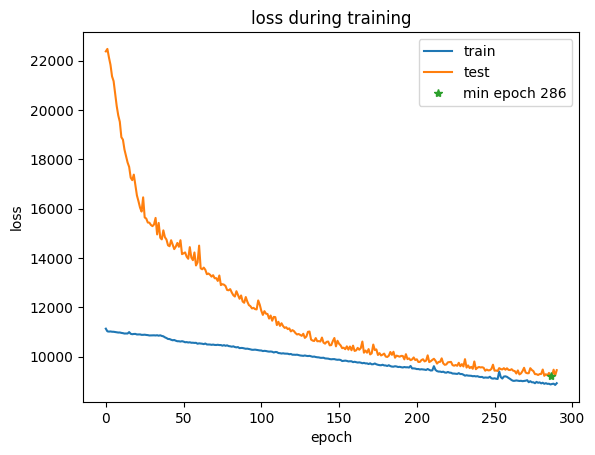

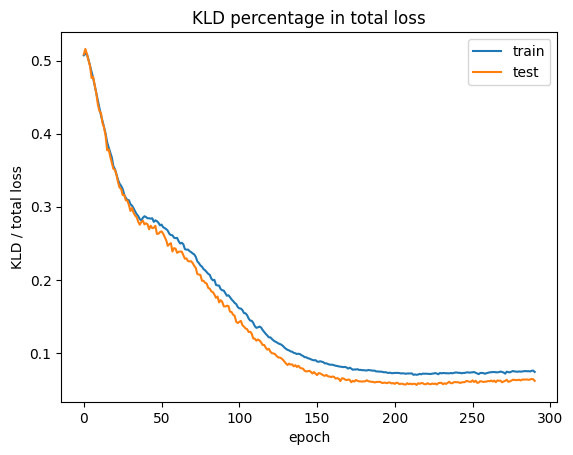

epoch 291: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8870.901, BCE: 8485.734, KLD: 689.119, KLD/(KLD+BCE): 7.511% beta:1.00
[valid] loss: 9200.855, BCE: 8603.527, KLD: 597.328, KLD/loss: 6.492%


epoch 292: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9041.090, BCE: 8654.036, KLD: 692.611, KLD/(KLD+BCE): 7.410% beta:1.00
[valid] loss: 9465.649, BCE: 8886.145, KLD: 579.504, KLD/loss: 6.122%


epoch 293: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8916.675, BCE: 8535.388, KLD: 678.739, KLD/(KLD+BCE): 7.366% beta:1.00
[valid] loss: 9277.550, BCE: 8686.172, KLD: 591.377, KLD/loss: 6.374%


epoch 294: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8929.461, BCE: 8542.107, KLD: 691.838, KLD/(KLD+BCE): 7.492% beta:1.00
[valid] loss: 9183.904, BCE: 8581.241, KLD: 602.662, KLD/loss: 6.562%
model save at:  model_files_beta/ckpt_294.pt
remove  model_files_beta/ckpt_236.pt


epoch 295: 100%|██████████| 266/266 [00:26<00:00,  9.93it/s]


[train] loss: 8817.498, BCE: 8430.091, KLD: 688.336, KLD/(KLD+BCE): 7.549% beta:1.00
[valid] loss: 9157.677, BCE: 8553.159, KLD: 604.518, KLD/loss: 6.601%


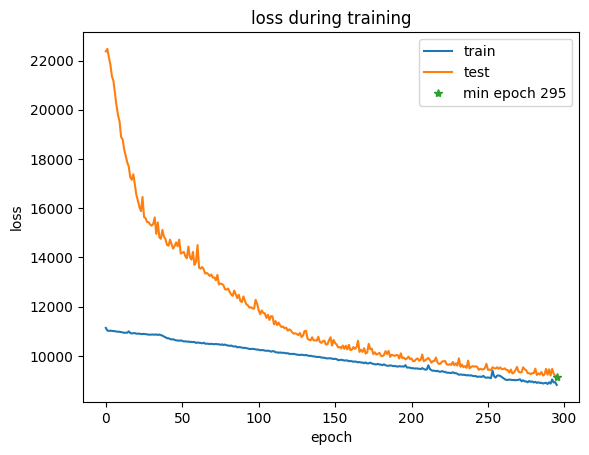

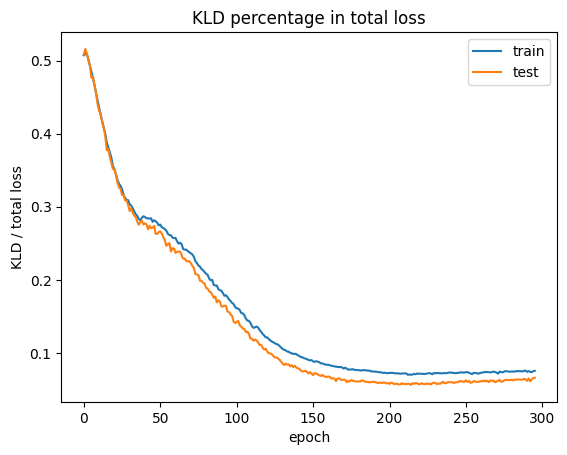

model save at:  model_files_beta/ckpt_295.pt
remove  model_files_beta/ckpt_238.pt


epoch 296: 100%|██████████| 266/266 [00:26<00:00,  9.95it/s]


[train] loss: 8837.440, BCE: 8448.842, KLD: 687.494, KLD/(KLD+BCE): 7.525% beta:1.00
[valid] loss: 9231.656, BCE: 8626.420, KLD: 605.235, KLD/loss: 6.556%


epoch 297: 100%|██████████| 266/266 [00:26<00:00,  9.95it/s]


[train] loss: 8822.630, BCE: 8432.398, KLD: 690.144, KLD/(KLD+BCE): 7.565% beta:1.00
[valid] loss: 9108.417, BCE: 8519.579, KLD: 588.838, KLD/loss: 6.465%
model save at:  model_files_beta/ckpt_297.pt
remove  model_files_beta/ckpt_244.pt


epoch 298: 100%|██████████| 266/266 [00:26<00:00, 10.02it/s]


[train] loss: 8823.738, BCE: 8433.831, KLD: 689.637, KLD/(KLD+BCE): 7.559% beta:1.00
[valid] loss: 9122.085, BCE: 8528.167, KLD: 593.918, KLD/loss: 6.511%


epoch 299: 100%|██████████| 266/266 [00:26<00:00, 10.03it/s]


[train] loss: 8783.086, BCE: 8389.576, KLD: 691.803, KLD/(KLD+BCE): 7.618% beta:1.00
[valid] loss: 9133.215, BCE: 8537.645, KLD: 595.570, KLD/loss: 6.521%


epoch 300: 100%|██████████| 266/266 [00:26<00:00, 10.02it/s]


[train] loss: 8803.945, BCE: 8409.409, KLD: 688.575, KLD/(KLD+BCE): 7.568% beta:1.00
[valid] loss: 9264.318, BCE: 8660.809, KLD: 603.509, KLD/loss: 6.514%


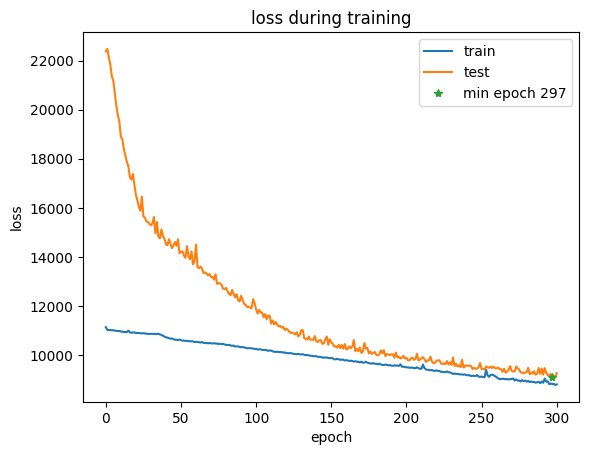

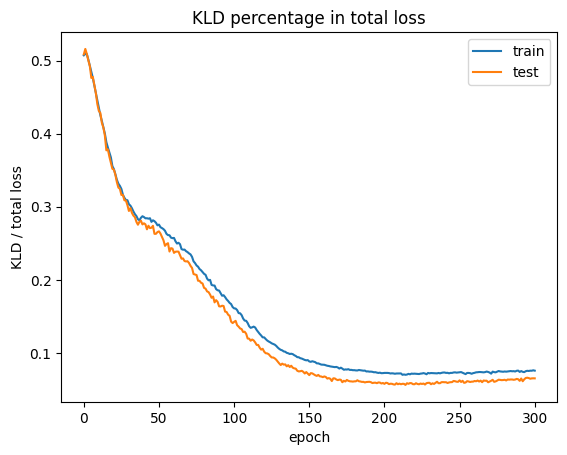

epoch 301: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8846.696, BCE: 8451.336, KLD: 694.067, KLD/(KLD+BCE): 7.589% beta:1.00
[valid] loss: 9170.965, BCE: 8577.434, KLD: 593.531, KLD/loss: 6.472%


epoch 302: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8946.138, BCE: 8550.070, KLD: 693.424, KLD/(KLD+BCE): 7.502% beta:1.00
[valid] loss: 11064.495, BCE: 10429.337, KLD: 635.158, KLD/loss: 5.741%


epoch 303: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 9419.581, BCE: 9036.595, KLD: 668.930, KLD/(KLD+BCE): 6.892% beta:1.00
[valid] loss: 9264.149, BCE: 8681.587, KLD: 582.562, KLD/loss: 6.288%


epoch 304: 100%|██████████| 266/266 [00:26<00:00, 10.05it/s]


[train] loss: 8881.744, BCE: 8496.030, KLD: 667.779, KLD/(KLD+BCE): 7.287% beta:1.00
[valid] loss: 9214.387, BCE: 8634.930, KLD: 579.457, KLD/loss: 6.289%


epoch 305: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8813.032, BCE: 8423.365, KLD: 674.990, KLD/(KLD+BCE): 7.419% beta:1.00
[valid] loss: 9294.753, BCE: 8706.777, KLD: 587.976, KLD/loss: 6.326%


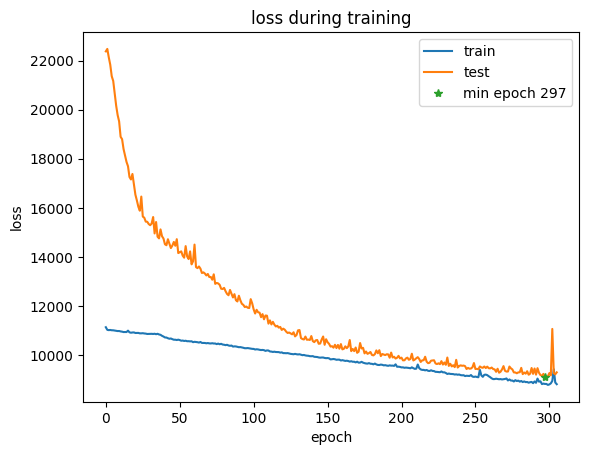

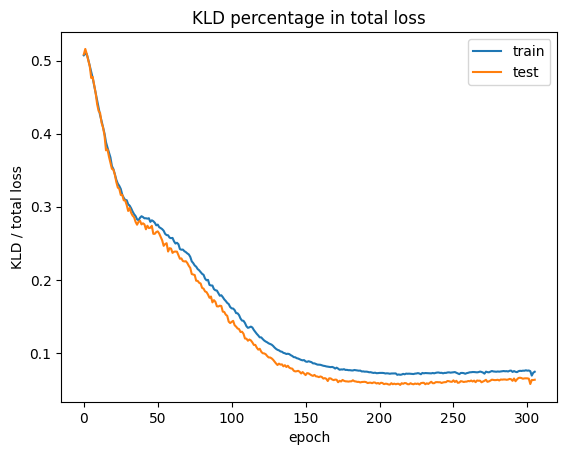

epoch 306: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8782.125, BCE: 8383.792, KLD: 686.773, KLD/(KLD+BCE): 7.571% beta:1.00
[valid] loss: 9143.100, BCE: 8548.470, KLD: 594.630, KLD/loss: 6.504%


epoch 307: 100%|██████████| 266/266 [00:26<00:00, 10.10it/s]


[train] loss: 8790.121, BCE: 8388.351, KLD: 690.522, KLD/(KLD+BCE): 7.606% beta:1.00
[valid] loss: 9220.533, BCE: 8624.493, KLD: 596.040, KLD/loss: 6.464%


epoch 308: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8751.516, BCE: 8355.955, KLD: 684.317, KLD/(KLD+BCE): 7.570% beta:1.00
[valid] loss: 9123.347, BCE: 8511.754, KLD: 611.594, KLD/loss: 6.704%


epoch 309: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8739.062, BCE: 8338.932, KLD: 692.768, KLD/(KLD+BCE): 7.670% beta:1.00
[valid] loss: 9135.817, BCE: 8524.515, KLD: 611.302, KLD/loss: 6.691%


epoch 310: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8758.521, BCE: 8355.944, KLD: 695.398, KLD/(KLD+BCE): 7.683% beta:1.00
[valid] loss: 9193.004, BCE: 8587.242, KLD: 605.762, KLD/loss: 6.589%


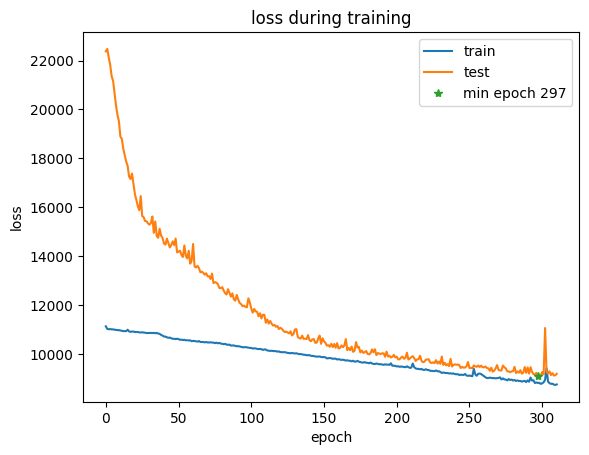

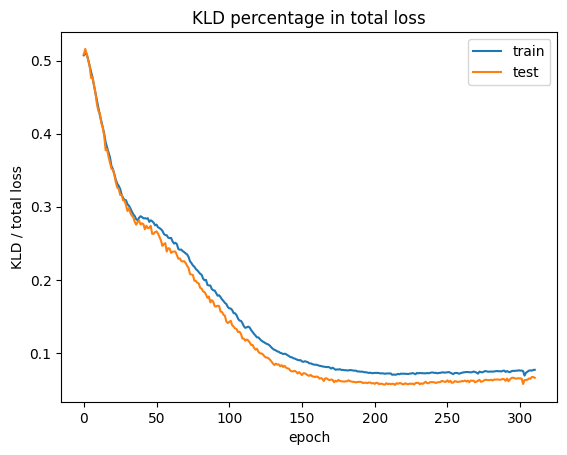

epoch 311: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8736.458, BCE: 8329.260, KLD: 694.213, KLD/(KLD+BCE): 7.693% beta:1.00
[valid] loss: 9086.422, BCE: 8483.306, KLD: 603.116, KLD/loss: 6.638%
model save at:  model_files_beta/ckpt_311.pt
remove  model_files_beta/ckpt_252.pt


epoch 312: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8799.432, BCE: 8389.234, KLD: 693.528, KLD/(KLD+BCE): 7.636% beta:1.00
[valid] loss: 9835.295, BCE: 9223.355, KLD: 611.940, KLD/loss: 6.222%


epoch 313: 100%|██████████| 266/266 [00:26<00:00, 10.10it/s]


[train] loss: 8826.757, BCE: 8425.724, KLD: 686.492, KLD/(KLD+BCE): 7.534% beta:1.00
[valid] loss: 9186.958, BCE: 8590.091, KLD: 596.867, KLD/loss: 6.497%


epoch 314: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8752.382, BCE: 8348.107, KLD: 681.175, KLD/(KLD+BCE): 7.544% beta:1.00
[valid] loss: 9090.688, BCE: 8500.371, KLD: 590.317, KLD/loss: 6.494%


epoch 315: 100%|██████████| 266/266 [00:26<00:00, 10.12it/s]


[train] loss: 8723.428, BCE: 8321.201, KLD: 680.499, KLD/(KLD+BCE): 7.560% beta:1.00
[valid] loss: 9187.175, BCE: 8598.223, KLD: 588.952, KLD/loss: 6.411%


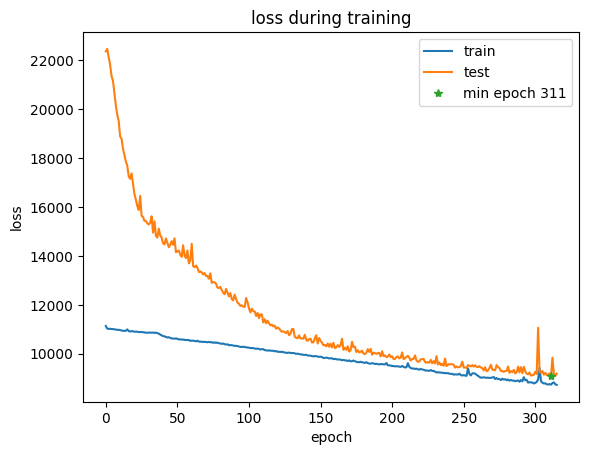

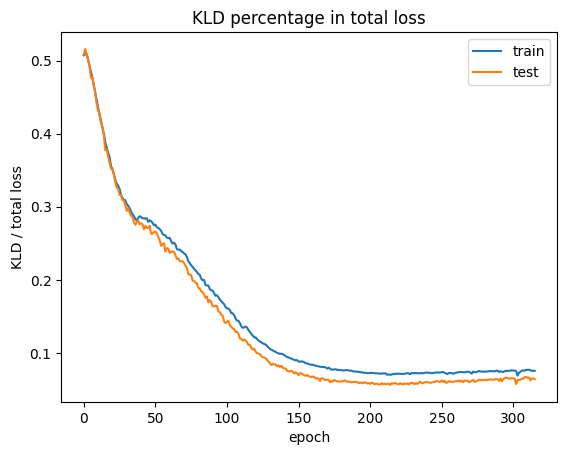

epoch 316: 100%|██████████| 266/266 [00:26<00:00, 10.05it/s]


[train] loss: 8714.660, BCE: 8311.131, KLD: 680.171, KLD/(KLD+BCE): 7.565% beta:1.00
[valid] loss: 9031.778, BCE: 8444.905, KLD: 586.873, KLD/loss: 6.498%
model save at:  model_files_beta/ckpt_316.pt
remove  model_files_beta/ckpt_263.pt


epoch 317: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8713.114, BCE: 8304.160, KLD: 685.876, KLD/(KLD+BCE): 7.629% beta:1.00
[valid] loss: 9032.611, BCE: 8440.087, KLD: 592.525, KLD/loss: 6.560%


epoch 318: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8749.055, BCE: 8343.373, KLD: 683.456, KLD/(KLD+BCE): 7.571% beta:1.00
[valid] loss: 9953.521, BCE: 9295.184, KLD: 658.337, KLD/loss: 6.614%


epoch 319: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8780.327, BCE: 8367.043, KLD: 698.007, KLD/(KLD+BCE): 7.700% beta:1.00
[valid] loss: 9140.807, BCE: 8531.559, KLD: 609.248, KLD/loss: 6.665%


epoch 320: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8691.358, BCE: 8280.263, KLD: 694.244, KLD/(KLD+BCE): 7.736% beta:1.00
[valid] loss: 9063.089, BCE: 8463.927, KLD: 599.162, KLD/loss: 6.611%


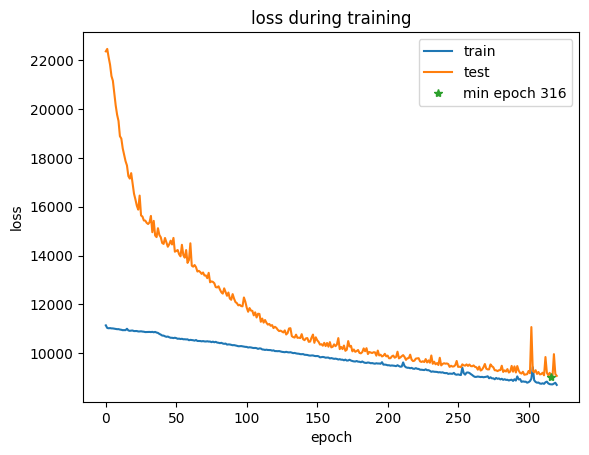

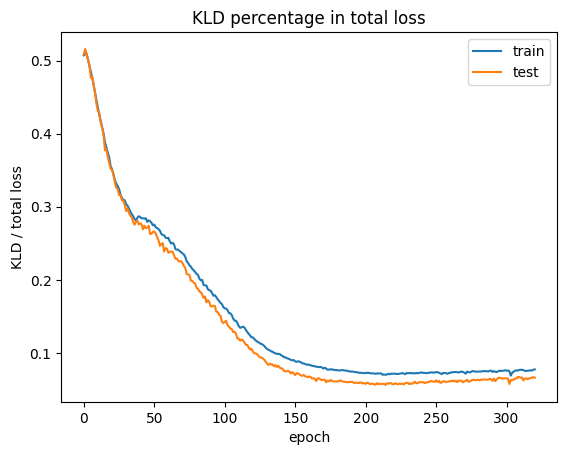

epoch 321: 100%|██████████| 266/266 [00:26<00:00, 10.11it/s]


[train] loss: 8745.002, BCE: 8329.969, KLD: 692.552, KLD/(KLD+BCE): 7.676% beta:1.00
[valid] loss: 9061.196, BCE: 8455.298, KLD: 605.898, KLD/loss: 6.687%


epoch 322: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8696.794, BCE: 8283.786, KLD: 690.864, KLD/(KLD+BCE): 7.698% beta:1.00
[valid] loss: 9049.837, BCE: 8453.789, KLD: 596.048, KLD/loss: 6.586%


epoch 323: 100%|██████████| 266/266 [00:26<00:00, 10.13it/s]


[train] loss: 8685.426, BCE: 8266.851, KLD: 693.596, KLD/(KLD+BCE): 7.741% beta:1.00
[valid] loss: 9017.924, BCE: 8411.803, KLD: 606.121, KLD/loss: 6.721%
model save at:  model_files_beta/ckpt_323.pt
remove  model_files_beta/ckpt_264.pt


epoch 324: 100%|██████████| 266/266 [00:26<00:00, 10.11it/s]


[train] loss: 8694.209, BCE: 8275.504, KLD: 693.528, KLD/(KLD+BCE): 7.732% beta:1.00
[valid] loss: 9097.557, BCE: 8483.050, KLD: 614.506, KLD/loss: 6.755%


epoch 325: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8754.082, BCE: 8331.391, KLD: 701.585, KLD/(KLD+BCE): 7.767% beta:1.00
[valid] loss: 9051.175, BCE: 8437.571, KLD: 613.604, KLD/loss: 6.779%


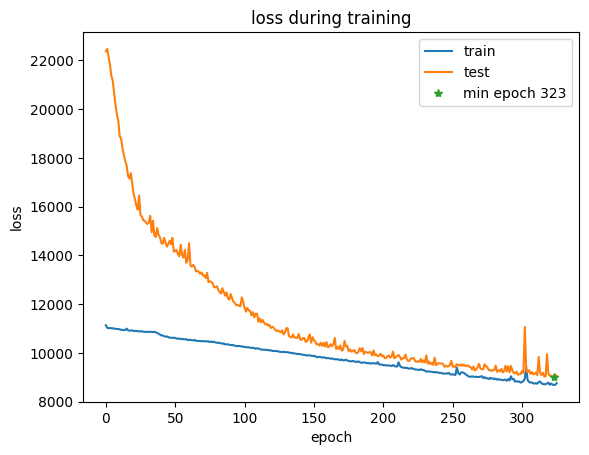

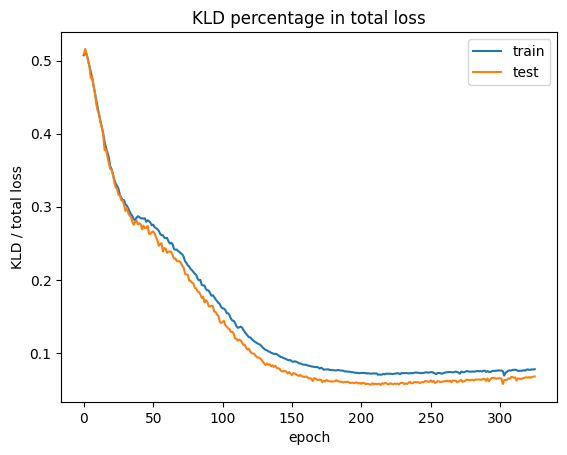

epoch 326: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8682.112, BCE: 8258.792, KLD: 698.841, KLD/(KLD+BCE): 7.802% beta:1.00
[valid] loss: 9126.717, BCE: 8539.667, KLD: 587.050, KLD/loss: 6.432%


epoch 327: 100%|██████████| 266/266 [00:26<00:00, 10.07it/s]


[train] loss: 8676.190, BCE: 8252.960, KLD: 694.945, KLD/(KLD+BCE): 7.767% beta:1.00
[valid] loss: 9149.422, BCE: 8534.804, KLD: 614.618, KLD/loss: 6.718%


epoch 328: 100%|██████████| 266/266 [00:26<00:00, 10.08it/s]


[train] loss: 8714.998, BCE: 8294.248, KLD: 692.961, KLD/(KLD+BCE): 7.711% beta:1.00
[valid] loss: 9042.673, BCE: 8427.400, KLD: 615.272, KLD/loss: 6.804%


epoch 329: 100%|██████████| 266/266 [00:26<00:00, 10.06it/s]


[train] loss: 8634.936, BCE: 8211.046, KLD: 697.169, KLD/(KLD+BCE): 7.826% beta:1.00
[valid] loss: 9129.659, BCE: 8503.231, KLD: 626.428, KLD/loss: 6.861%


epoch 330: 100%|██████████| 266/266 [00:26<00:00, 10.00it/s]


[train] loss: 8665.248, BCE: 8241.052, KLD: 700.732, KLD/(KLD+BCE): 7.837% beta:1.00
[valid] loss: 9020.757, BCE: 8407.606, KLD: 613.151, KLD/loss: 6.797%


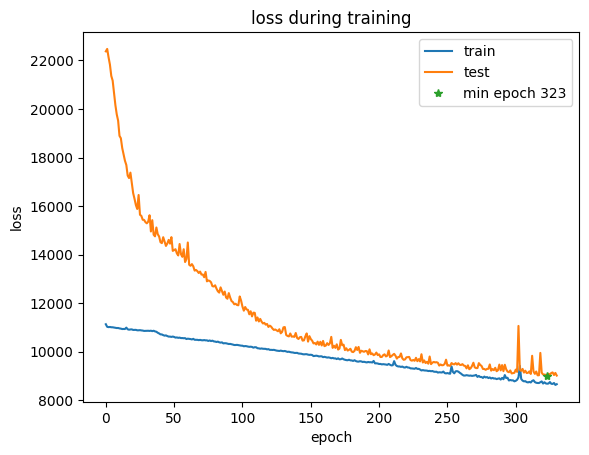

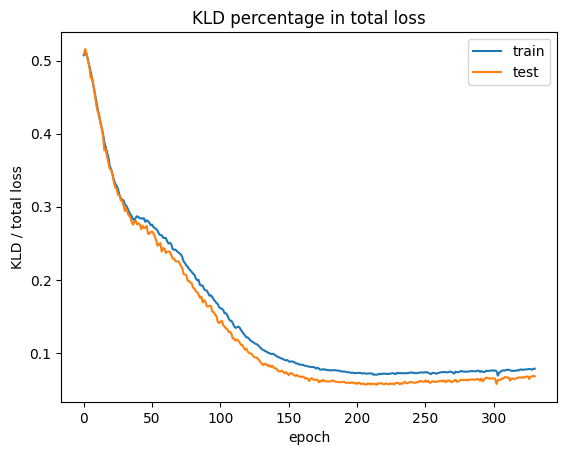

epoch 331: 100%|██████████| 266/266 [00:26<00:00, 10.09it/s]


[train] loss: 8702.553, BCE: 8276.659, KLD: 701.436, KLD/(KLD+BCE): 7.813% beta:1.00
[valid] loss: 9070.583, BCE: 8454.118, KLD: 616.465, KLD/loss: 6.796%


epoch 332: 100%|██████████| 266/266 [00:26<00:00, 10.10it/s]


[train] loss: 8620.761, BCE: 8196.870, KLD: 695.810, KLD/(KLD+BCE): 7.825% beta:1.00
[valid] loss: 9007.299, BCE: 8388.601, KLD: 618.698, KLD/loss: 6.869%
model save at:  model_files_beta/ckpt_332.pt
remove  model_files_beta/ckpt_266.pt


epoch 333: 100%|██████████| 266/266 [00:26<00:00,  9.95it/s]


[train] loss: 8702.845, BCE: 8284.791, KLD: 687.554, KLD/(KLD+BCE): 7.663% beta:1.00
[valid] loss: 9282.414, BCE: 8663.414, KLD: 619.000, KLD/loss: 6.669%


epoch 334: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8668.106, BCE: 8246.894, KLD: 687.801, KLD/(KLD+BCE): 7.698% beta:1.00
[valid] loss: 9138.204, BCE: 8528.093, KLD: 610.111, KLD/loss: 6.676%


epoch 335: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8601.242, BCE: 8172.069, KLD: 701.861, KLD/(KLD+BCE): 7.909% beta:1.00
[valid] loss: 9193.128, BCE: 8562.533, KLD: 630.596, KLD/loss: 6.859%


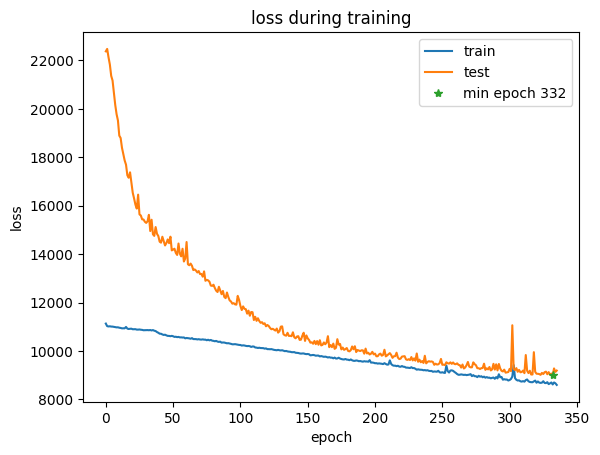

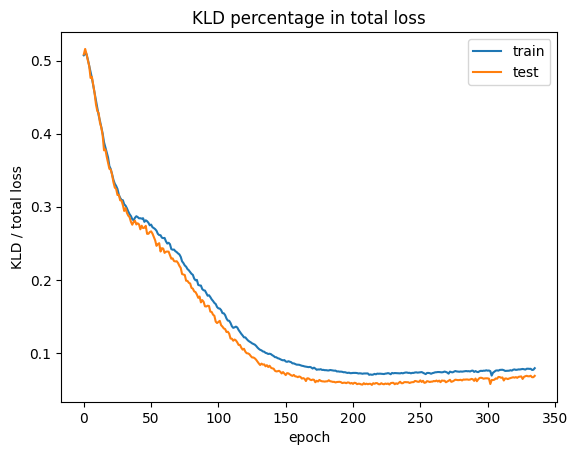

epoch 336: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8603.634, BCE: 8174.594, KLD: 700.270, KLD/(KLD+BCE): 7.890% beta:1.00
[valid] loss: 9079.765, BCE: 8458.310, KLD: 621.454, KLD/loss: 6.844%


epoch 337: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8590.603, BCE: 8160.309, KLD: 695.692, KLD/(KLD+BCE): 7.856% beta:1.00
[valid] loss: 9123.046, BCE: 8501.828, KLD: 621.218, KLD/loss: 6.809%


epoch 338: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8618.736, BCE: 8187.479, KLD: 699.267, KLD/(KLD+BCE): 7.869% beta:1.00
[valid] loss: 9051.528, BCE: 8423.948, KLD: 627.580, KLD/loss: 6.933%


epoch 339: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8562.616, BCE: 8136.044, KLD: 696.721, KLD/(KLD+BCE): 7.888% beta:1.00
[valid] loss: 8937.982, BCE: 8329.041, KLD: 608.942, KLD/loss: 6.813%
model save at:  model_files_beta/ckpt_339.pt
remove  model_files_beta/ckpt_278.pt


epoch 340: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8566.699, BCE: 8134.288, KLD: 694.642, KLD/(KLD+BCE): 7.868% beta:1.00
[valid] loss: 8921.008, BCE: 8303.219, KLD: 617.789, KLD/loss: 6.925%


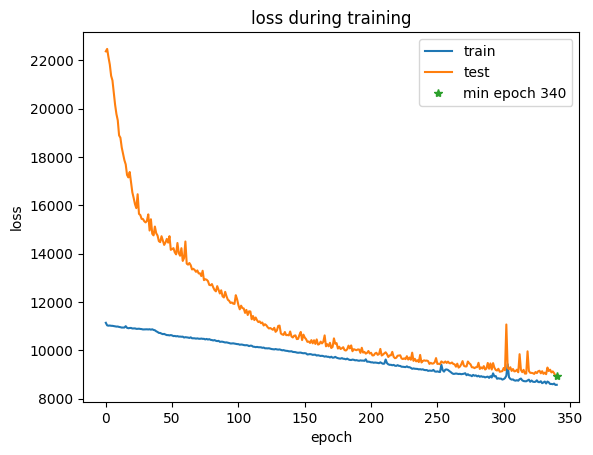

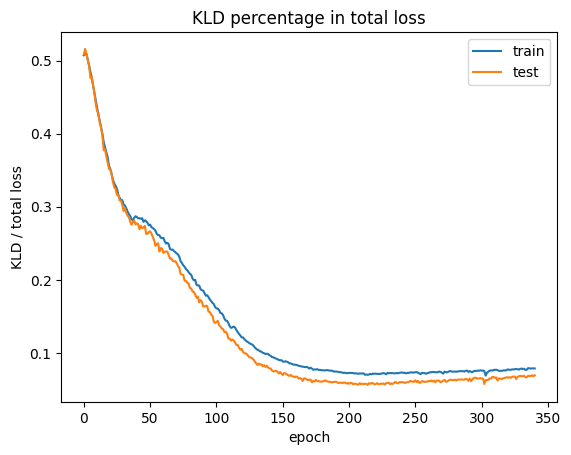

model save at:  model_files_beta/ckpt_340.pt
remove  model_files_beta/ckpt_282.pt


epoch 341: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8713.372, BCE: 8277.170, KLD: 704.575, KLD/(KLD+BCE): 7.845% beta:1.00
[valid] loss: 9151.194, BCE: 8541.996, KLD: 609.198, KLD/loss: 6.657%


epoch 342: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8618.763, BCE: 8183.349, KLD: 699.905, KLD/(KLD+BCE): 7.879% beta:1.00
[valid] loss: 9380.462, BCE: 8755.572, KLD: 624.889, KLD/loss: 6.662%


epoch 343: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8633.445, BCE: 8196.681, KLD: 698.670, KLD/(KLD+BCE): 7.854% beta:1.00
[valid] loss: 9000.968, BCE: 8382.752, KLD: 618.216, KLD/loss: 6.868%


epoch 344: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8763.210, BCE: 8325.737, KLD: 700.257, KLD/(KLD+BCE): 7.758% beta:1.00
[valid] loss: 9169.063, BCE: 8554.023, KLD: 615.040, KLD/loss: 6.708%


epoch 345: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8641.372, BCE: 8207.951, KLD: 689.744, KLD/(KLD+BCE): 7.752% beta:1.00
[valid] loss: 9032.645, BCE: 8417.080, KLD: 615.565, KLD/loss: 6.815%


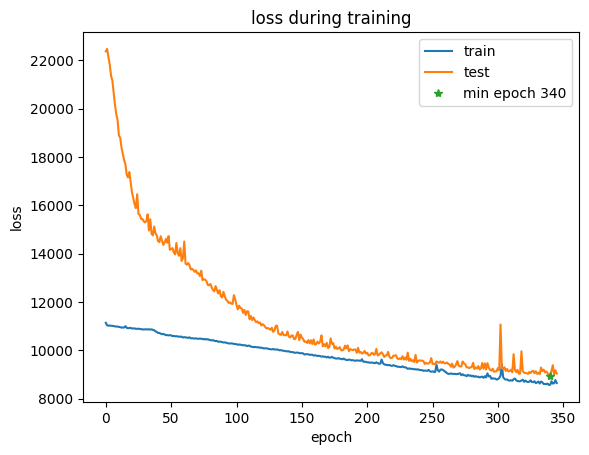

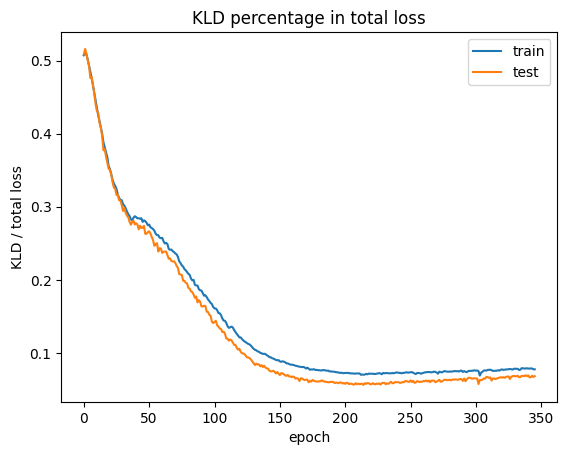

epoch 346: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8556.781, BCE: 8124.815, KLD: 687.528, KLD/(KLD+BCE): 7.802% beta:1.00
[valid] loss: 8985.252, BCE: 8366.450, KLD: 618.802, KLD/loss: 6.887%


epoch 347: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8596.057, BCE: 8158.271, KLD: 697.790, KLD/(KLD+BCE): 7.879% beta:1.00
[valid] loss: 8989.675, BCE: 8357.502, KLD: 632.173, KLD/loss: 7.032%


epoch 348: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8536.114, BCE: 8096.470, KLD: 698.611, KLD/(KLD+BCE): 7.943% beta:1.00
[valid] loss: 9014.880, BCE: 8374.410, KLD: 640.469, KLD/loss: 7.105%


epoch 349: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8576.210, BCE: 8128.790, KLD: 704.880, KLD/(KLD+BCE): 7.979% beta:1.00
[valid] loss: 9276.226, BCE: 8650.498, KLD: 625.727, KLD/loss: 6.745%


epoch 350: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8556.812, BCE: 8113.615, KLD: 696.567, KLD/(KLD+BCE): 7.906% beta:1.00
[valid] loss: 8934.786, BCE: 8307.752, KLD: 627.035, KLD/loss: 7.018%


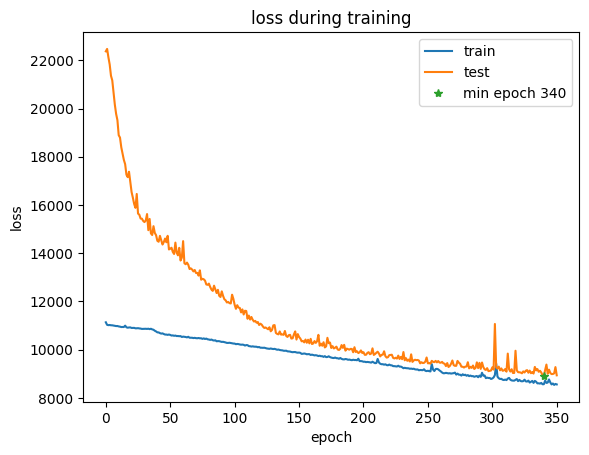

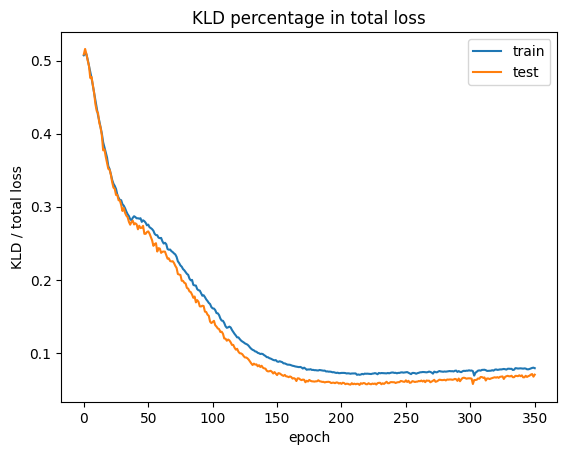

epoch 351: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8579.886, BCE: 8136.669, KLD: 707.640, KLD/(KLD+BCE): 8.001% beta:1.00
[valid] loss: 9025.068, BCE: 8398.657, KLD: 626.411, KLD/loss: 6.941%


epoch 352: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8550.758, BCE: 8107.850, KLD: 700.315, KLD/(KLD+BCE): 7.951% beta:1.00
[valid] loss: 9014.850, BCE: 8391.796, KLD: 623.053, KLD/loss: 6.911%


epoch 353: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8543.521, BCE: 8099.949, KLD: 700.376, KLD/(KLD+BCE): 7.959% beta:1.00
[valid] loss: 8932.256, BCE: 8311.464, KLD: 620.793, KLD/loss: 6.950%


epoch 354: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8522.312, BCE: 8076.221, KLD: 698.440, KLD/(KLD+BCE): 7.960% beta:1.00
[valid] loss: 9118.901, BCE: 8482.547, KLD: 636.354, KLD/loss: 6.978%


epoch 355: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8512.268, BCE: 8070.517, KLD: 694.351, KLD/(KLD+BCE): 7.922% beta:1.00
[valid] loss: 9093.456, BCE: 8467.173, KLD: 626.283, KLD/loss: 6.887%


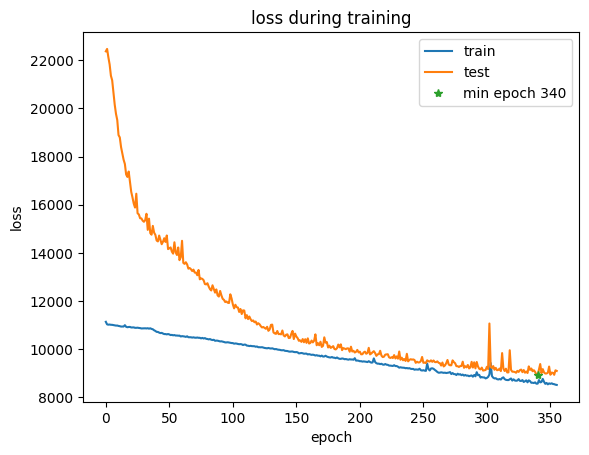

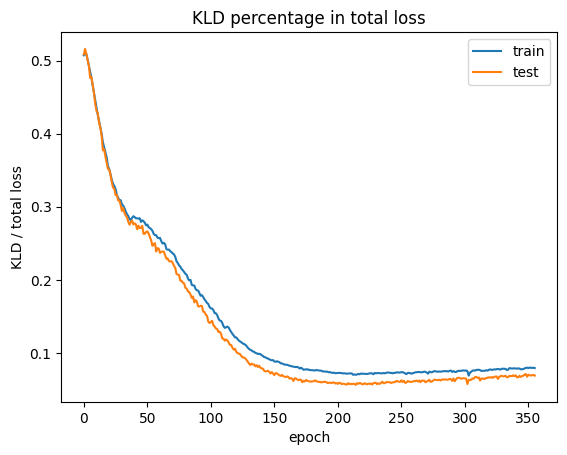

epoch 356: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8499.346, BCE: 8052.385, KLD: 704.026, KLD/(KLD+BCE): 8.040% beta:1.00
[valid] loss: 9073.847, BCE: 8450.778, KLD: 623.069, KLD/loss: 6.867%


epoch 357: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8547.012, BCE: 8099.928, KLD: 703.458, KLD/(KLD+BCE): 7.991% beta:1.00
[valid] loss: 8987.637, BCE: 8358.192, KLD: 629.445, KLD/loss: 7.003%


epoch 358: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8483.877, BCE: 8035.648, KLD: 699.642, KLD/(KLD+BCE): 8.009% beta:1.00
[valid] loss: 8902.859, BCE: 8285.163, KLD: 617.695, KLD/loss: 6.938%
model save at:  model_files_beta/ckpt_358.pt
remove  model_files_beta/ckpt_286.pt


epoch 359: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8494.764, BCE: 8051.439, KLD: 698.430, KLD/(KLD+BCE): 7.982% beta:1.00
[valid] loss: 8878.215, BCE: 8265.503, KLD: 612.711, KLD/loss: 6.901%
model save at:  model_files_beta/ckpt_359.pt
remove  model_files_beta/ckpt_294.pt


epoch 360: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8479.150, BCE: 8030.830, KLD: 696.740, KLD/(KLD+BCE): 7.983% beta:1.00
[valid] loss: 8949.703, BCE: 8324.895, KLD: 624.809, KLD/loss: 6.981%


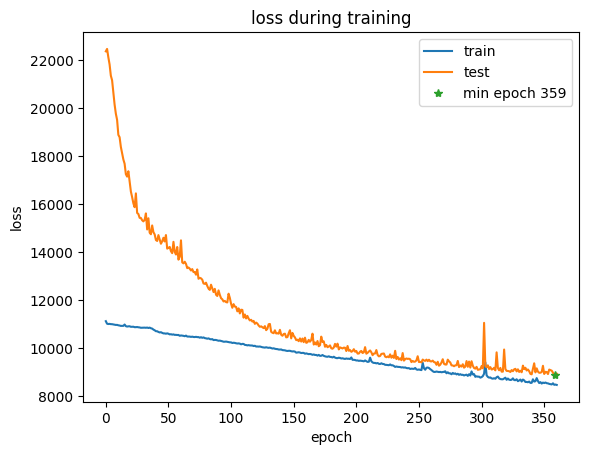

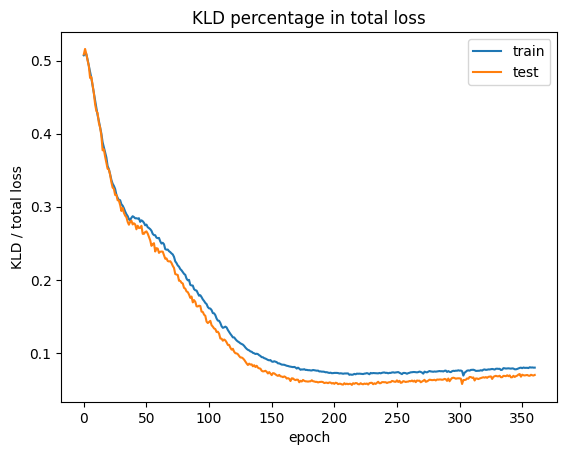

epoch 361: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8651.635, BCE: 8198.994, KLD: 702.365, KLD/(KLD+BCE): 7.891% beta:1.00
[valid] loss: 8923.502, BCE: 8281.073, KLD: 642.429, KLD/loss: 7.199%


epoch 362: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8504.429, BCE: 8054.309, KLD: 701.653, KLD/(KLD+BCE): 8.013% beta:1.00
[valid] loss: 8894.399, BCE: 8270.665, KLD: 623.734, KLD/loss: 7.013%


epoch 363: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8478.622, BCE: 8027.602, KLD: 697.900, KLD/(KLD+BCE): 7.998% beta:1.00
[valid] loss: 9152.127, BCE: 8525.328, KLD: 626.799, KLD/loss: 6.849%


epoch 364: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8527.901, BCE: 8077.540, KLD: 698.979, KLD/(KLD+BCE): 7.964% beta:1.00
[valid] loss: 8908.046, BCE: 8276.155, KLD: 631.891, KLD/loss: 7.093%


epoch 365: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8462.439, BCE: 8010.023, KLD: 701.127, KLD/(KLD+BCE): 8.049% beta:1.00
[valid] loss: 8894.524, BCE: 8271.513, KLD: 623.011, KLD/loss: 7.004%


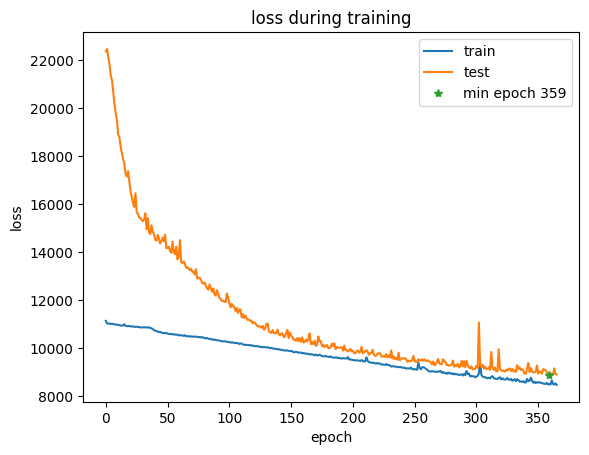

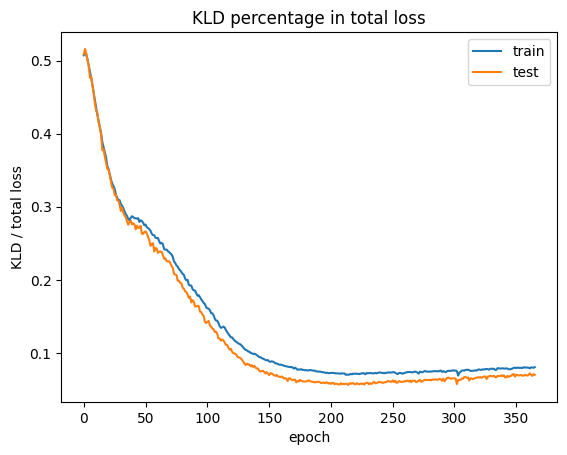

epoch 366: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8412.110, BCE: 7959.216, KLD: 700.098, KLD/(KLD+BCE): 8.085% beta:1.00
[valid] loss: 8927.177, BCE: 8300.288, KLD: 626.888, KLD/loss: 7.022%


epoch 367: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8441.985, BCE: 7987.425, KLD: 704.360, KLD/(KLD+BCE): 8.104% beta:1.00
[valid] loss: 8843.394, BCE: 8219.065, KLD: 624.330, KLD/loss: 7.060%
model save at:  model_files_beta/ckpt_367.pt
remove  model_files_beta/ckpt_295.pt


epoch 368: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8560.349, BCE: 8098.900, KLD: 714.451, KLD/(KLD+BCE): 8.106% beta:1.00
[valid] loss: 9090.843, BCE: 8456.615, KLD: 634.229, KLD/loss: 6.977%


epoch 369: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8480.987, BCE: 8024.069, KLD: 700.314, KLD/(KLD+BCE): 8.027% beta:1.00
[valid] loss: 9271.584, BCE: 8636.418, KLD: 635.166, KLD/loss: 6.851%


epoch 370: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 8455.951, BCE: 8005.425, KLD: 698.250, KLD/(KLD+BCE): 8.022% beta:1.00
[valid] loss: 8966.637, BCE: 8334.228, KLD: 632.409, KLD/loss: 7.053%


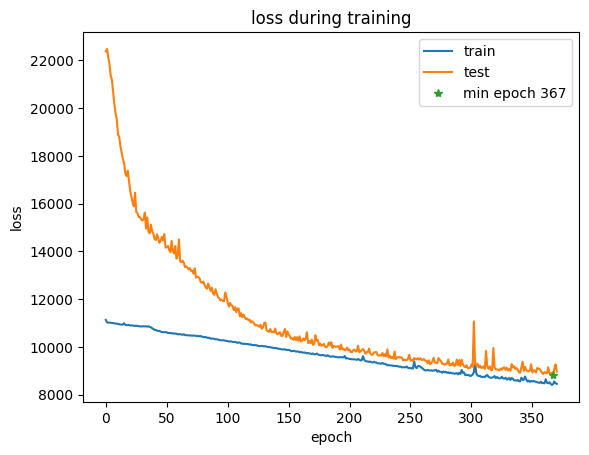

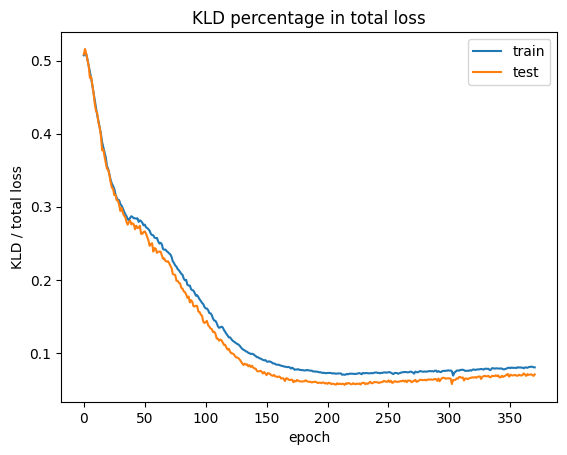

epoch 371: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8421.358, BCE: 7963.740, KLD: 702.066, KLD/(KLD+BCE): 8.102% beta:1.00
[valid] loss: 8785.704, BCE: 8153.220, KLD: 632.484, KLD/loss: 7.199%
model save at:  model_files_beta/ckpt_371.pt
remove  model_files_beta/ckpt_297.pt


epoch 372: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8477.580, BCE: 8018.265, KLD: 702.548, KLD/(KLD+BCE): 8.056% beta:1.00
[valid] loss: 8849.840, BCE: 8226.793, KLD: 623.047, KLD/loss: 7.040%


epoch 373: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8443.947, BCE: 7986.445, KLD: 699.996, KLD/(KLD+BCE): 8.058% beta:1.00
[valid] loss: 8963.872, BCE: 8339.760, KLD: 624.112, KLD/loss: 6.963%


epoch 374: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8432.364, BCE: 7978.496, KLD: 697.431, KLD/(KLD+BCE): 8.039% beta:1.00
[valid] loss: 8823.246, BCE: 8198.144, KLD: 625.102, KLD/loss: 7.085%


epoch 375: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8387.294, BCE: 7932.270, KLD: 696.903, KLD/(KLD+BCE): 8.076% beta:1.00
[valid] loss: 8776.929, BCE: 8150.497, KLD: 626.432, KLD/loss: 7.137%


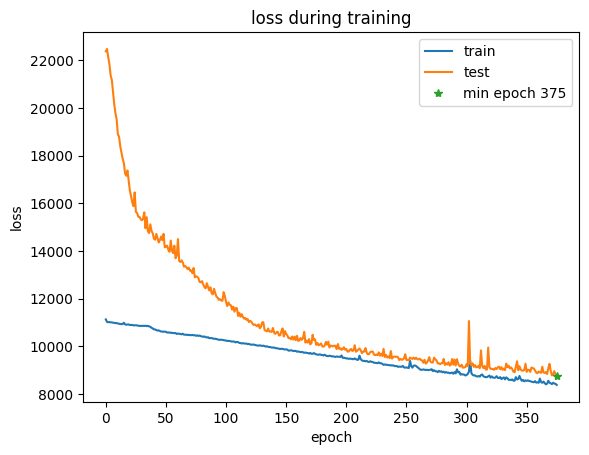

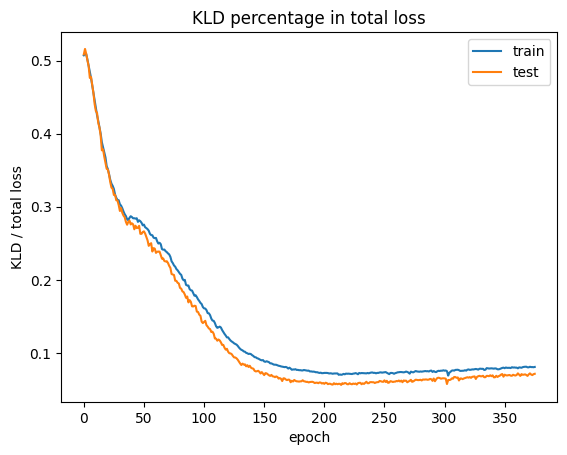

model save at:  model_files_beta/ckpt_375.pt
remove  model_files_beta/ckpt_311.pt


epoch 376: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8387.242, BCE: 7929.899, KLD: 701.196, KLD/(KLD+BCE): 8.124% beta:1.00
[valid] loss: 8802.089, BCE: 8166.734, KLD: 635.355, KLD/loss: 7.218%


epoch 377: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8459.329, BCE: 7991.162, KLD: 710.493, KLD/(KLD+BCE): 8.165% beta:1.00
[valid] loss: 9003.282, BCE: 8346.453, KLD: 656.829, KLD/loss: 7.295%


epoch 378: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8426.952, BCE: 7959.800, KLD: 714.551, KLD/(KLD+BCE): 8.238% beta:1.00
[valid] loss: 9156.838, BCE: 8513.827, KLD: 643.011, KLD/loss: 7.022%


epoch 379: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8434.235, BCE: 7972.734, KLD: 701.263, KLD/(KLD+BCE): 8.085% beta:1.00
[valid] loss: 8913.162, BCE: 8291.288, KLD: 621.874, KLD/loss: 6.977%


epoch 380: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8453.843, BCE: 7985.439, KLD: 702.895, KLD/(KLD+BCE): 8.090% beta:1.00
[valid] loss: 8815.287, BCE: 8185.153, KLD: 630.134, KLD/loss: 7.148%


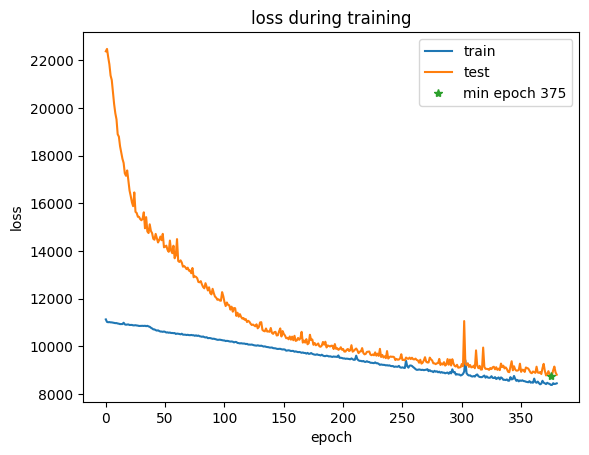

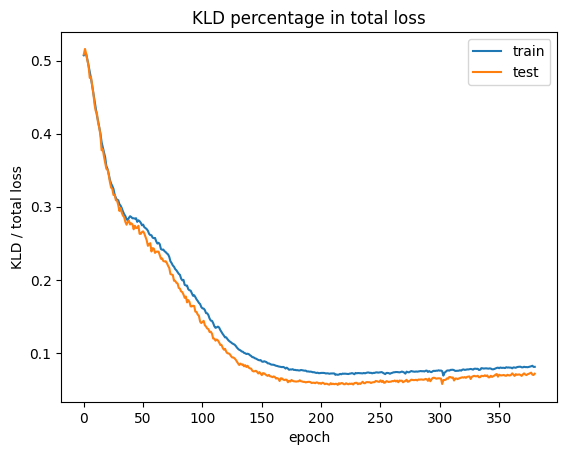

epoch 381: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8371.613, BCE: 7908.252, KLD: 700.937, KLD/(KLD+BCE): 8.142% beta:1.00
[valid] loss: 8985.025, BCE: 8346.902, KLD: 638.123, KLD/loss: 7.102%


epoch 382: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8414.848, BCE: 7952.200, KLD: 700.150, KLD/(KLD+BCE): 8.092% beta:1.00
[valid] loss: 8944.649, BCE: 8307.660, KLD: 636.989, KLD/loss: 7.121%


epoch 383: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8386.489, BCE: 7915.982, KLD: 708.133, KLD/(KLD+BCE): 8.211% beta:1.00
[valid] loss: 8765.516, BCE: 8131.352, KLD: 634.164, KLD/loss: 7.235%
model save at:  model_files_beta/ckpt_383.pt
remove  model_files_beta/ckpt_316.pt


epoch 384: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8361.979, BCE: 7890.785, KLD: 703.671, KLD/(KLD+BCE): 8.187% beta:1.00
[valid] loss: 9340.119, BCE: 8701.266, KLD: 638.853, KLD/loss: 6.840%


epoch 385: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8379.381, BCE: 7912.771, KLD: 702.160, KLD/(KLD+BCE): 8.150% beta:1.00
[valid] loss: 8868.312, BCE: 8228.966, KLD: 639.346, KLD/loss: 7.209%


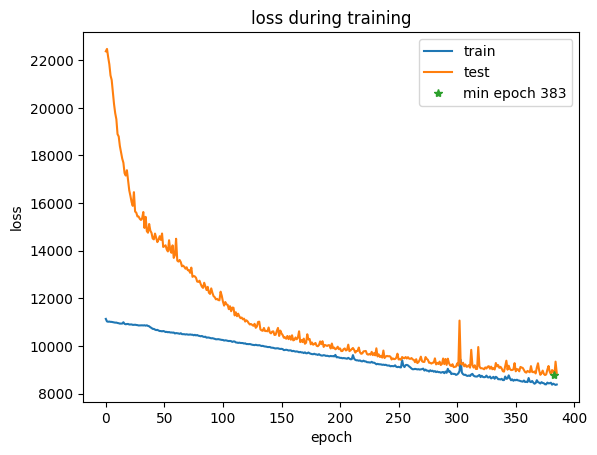

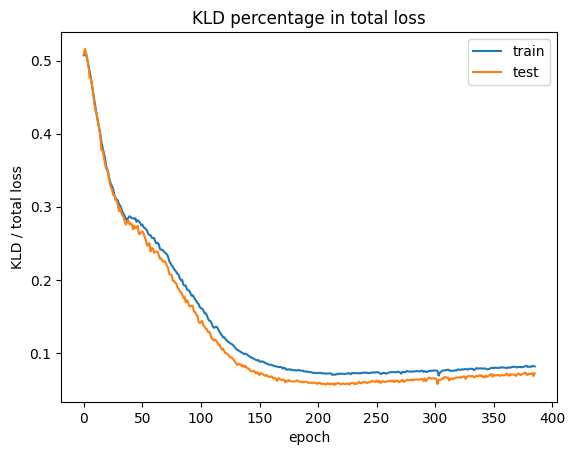

epoch 386: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8368.979, BCE: 7899.444, KLD: 706.215, KLD/(KLD+BCE): 8.206% beta:1.00
[valid] loss: 8818.422, BCE: 8167.935, KLD: 650.487, KLD/loss: 7.376%


epoch 387: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8366.018, BCE: 7896.066, KLD: 705.593, KLD/(KLD+BCE): 8.203% beta:1.00
[valid] loss: 8774.402, BCE: 8143.473, KLD: 630.929, KLD/loss: 7.191%


epoch 388: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8386.337, BCE: 7916.921, KLD: 704.907, KLD/(KLD+BCE): 8.176% beta:1.00
[valid] loss: 8889.194, BCE: 8265.816, KLD: 623.377, KLD/loss: 7.013%


epoch 389: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8366.878, BCE: 7897.540, KLD: 701.484, KLD/(KLD+BCE): 8.158% beta:1.00
[valid] loss: 8931.638, BCE: 8275.386, KLD: 656.252, KLD/loss: 7.347%


epoch 390: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8427.061, BCE: 7946.770, KLD: 716.850, KLD/(KLD+BCE): 8.274% beta:1.00
[valid] loss: 8760.798, BCE: 8110.439, KLD: 650.358, KLD/loss: 7.424%


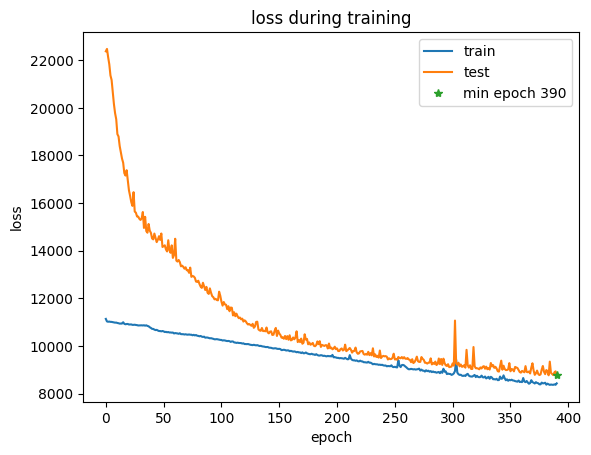

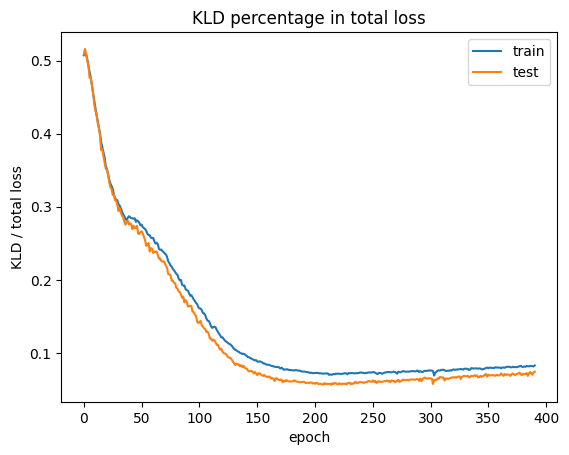

model save at:  model_files_beta/ckpt_390.pt
remove  model_files_beta/ckpt_323.pt


epoch 391: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8309.620, BCE: 7835.130, KLD: 708.700, KLD/(KLD+BCE): 8.295% beta:1.00
[valid] loss: 8792.959, BCE: 8159.373, KLD: 633.586, KLD/loss: 7.206%


epoch 392: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8319.428, BCE: 7847.205, KLD: 703.495, KLD/(KLD+BCE): 8.227% beta:1.00
[valid] loss: 8945.538, BCE: 8316.834, KLD: 628.704, KLD/loss: 7.028%


epoch 393: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8360.270, BCE: 7881.343, KLD: 714.040, KLD/(KLD+BCE): 8.307% beta:1.00
[valid] loss: 8822.386, BCE: 8180.399, KLD: 641.986, KLD/loss: 7.277%


epoch 394: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8335.488, BCE: 7857.266, KLD: 710.857, KLD/(KLD+BCE): 8.297% beta:1.00
[valid] loss: 8833.572, BCE: 8189.244, KLD: 644.328, KLD/loss: 7.294%


epoch 395: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 8325.465, BCE: 7848.384, KLD: 712.181, KLD/(KLD+BCE): 8.319% beta:1.00
[valid] loss: 8759.655, BCE: 8119.666, KLD: 639.989, KLD/loss: 7.306%


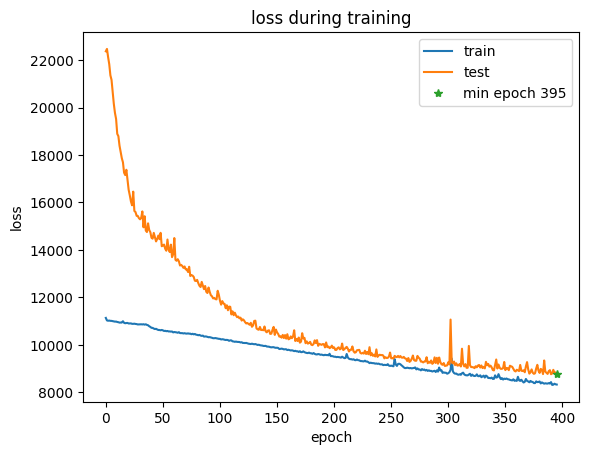

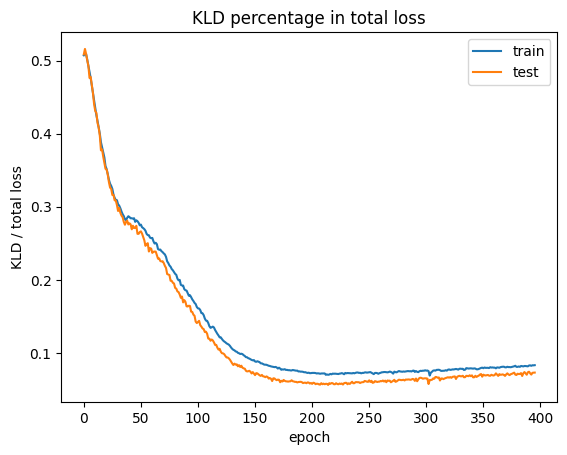

model save at:  model_files_beta/ckpt_395.pt
remove  model_files_beta/ckpt_332.pt


epoch 396: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8262.289, BCE: 7791.352, KLD: 703.036, KLD/(KLD+BCE): 8.276% beta:1.00
[valid] loss: 8881.238, BCE: 8240.233, KLD: 641.005, KLD/loss: 7.218%


epoch 397: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8328.601, BCE: 7856.628, KLD: 701.298, KLD/(KLD+BCE): 8.195% beta:1.00
[valid] loss: 8824.630, BCE: 8189.342, KLD: 635.288, KLD/loss: 7.199%


epoch 398: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8363.449, BCE: 7882.021, KLD: 712.205, KLD/(KLD+BCE): 8.287% beta:1.00
[valid] loss: 8995.788, BCE: 8349.056, KLD: 646.732, KLD/loss: 7.189%


epoch 399: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8300.223, BCE: 7825.867, KLD: 702.478, KLD/(KLD+BCE): 8.237% beta:1.00
[valid] loss: 8746.999, BCE: 8111.382, KLD: 635.617, KLD/loss: 7.267%
model save at:  model_files_beta/ckpt_399.pt
remove  model_files_beta/ckpt_339.pt


epoch 400: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8309.341, BCE: 7828.535, KLD: 712.260, KLD/(KLD+BCE): 8.340% beta:1.00
[valid] loss: 8742.327, BCE: 8095.994, KLD: 646.332, KLD/loss: 7.393%


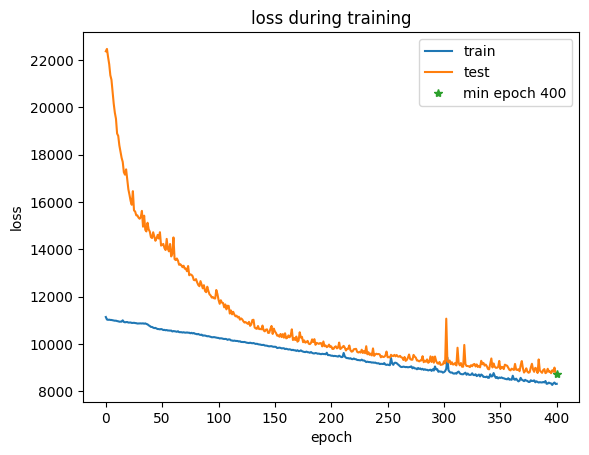

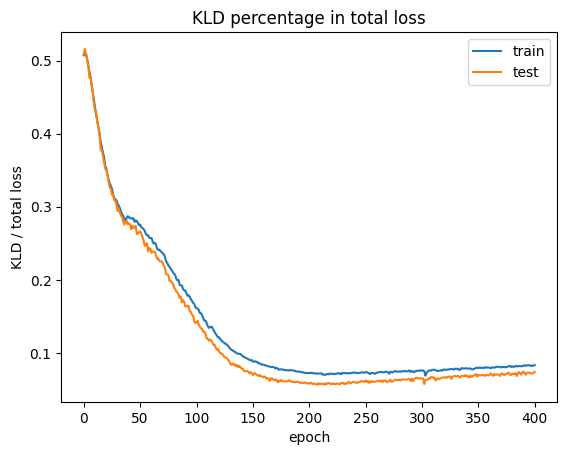

model save at:  model_files_beta/ckpt_400.pt
remove  model_files_beta/ckpt_340.pt


epoch 401: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8285.643, BCE: 7810.450, KLD: 704.716, KLD/(KLD+BCE): 8.276% beta:1.00
[valid] loss: 8707.560, BCE: 8077.123, KLD: 630.437, KLD/loss: 7.240%
model save at:  model_files_beta/ckpt_401.pt
remove  model_files_beta/ckpt_358.pt


epoch 402: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8372.513, BCE: 7890.048, KLD: 711.361, KLD/(KLD+BCE): 8.270% beta:1.00
[valid] loss: 8743.252, BCE: 8099.885, KLD: 643.367, KLD/loss: 7.358%


epoch 403: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8335.509, BCE: 7852.287, KLD: 717.106, KLD/(KLD+BCE): 8.368% beta:1.00
[valid] loss: 8828.105, BCE: 8194.281, KLD: 633.824, KLD/loss: 7.180%


epoch 404: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8243.594, BCE: 7766.275, KLD: 703.552, KLD/(KLD+BCE): 8.307% beta:1.00
[valid] loss: 8721.549, BCE: 8078.775, KLD: 642.774, KLD/loss: 7.370%


epoch 405: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8491.943, BCE: 8007.717, KLD: 710.612, KLD/(KLD+BCE): 8.151% beta:1.00
[valid] loss: 8902.980, BCE: 8244.089, KLD: 658.891, KLD/loss: 7.401%


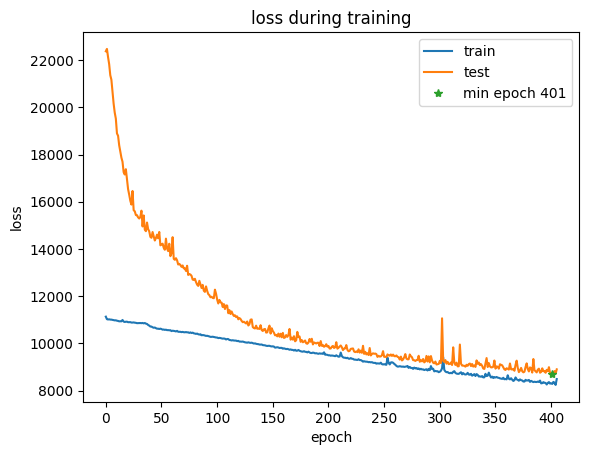

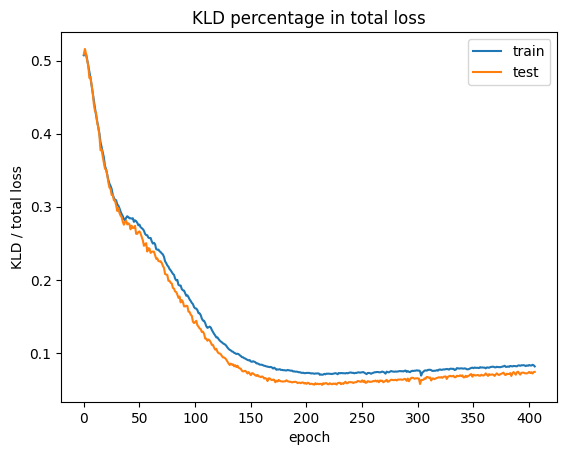

epoch 406: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8346.627, BCE: 7866.798, KLD: 705.547, KLD/(KLD+BCE): 8.231% beta:1.00
[valid] loss: 8747.719, BCE: 8107.047, KLD: 640.673, KLD/loss: 7.324%


epoch 407: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8245.018, BCE: 7765.091, KLD: 704.700, KLD/(KLD+BCE): 8.320% beta:1.00
[valid] loss: 8731.557, BCE: 8097.003, KLD: 634.554, KLD/loss: 7.267%


epoch 408: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8798.970, BCE: 8313.765, KLD: 708.343, KLD/(KLD+BCE): 7.851% beta:1.00
[valid] loss: 8935.039, BCE: 8306.188, KLD: 628.851, KLD/loss: 7.038%


epoch 409: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8452.891, BCE: 7980.717, KLD: 689.937, KLD/(KLD+BCE): 7.957% beta:1.00
[valid] loss: 8742.832, BCE: 8119.368, KLD: 623.464, KLD/loss: 7.131%


epoch 410: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8291.009, BCE: 7814.841, KLD: 694.258, KLD/(KLD+BCE): 8.159% beta:1.00
[valid] loss: 8766.172, BCE: 8123.454, KLD: 642.718, KLD/loss: 7.332%


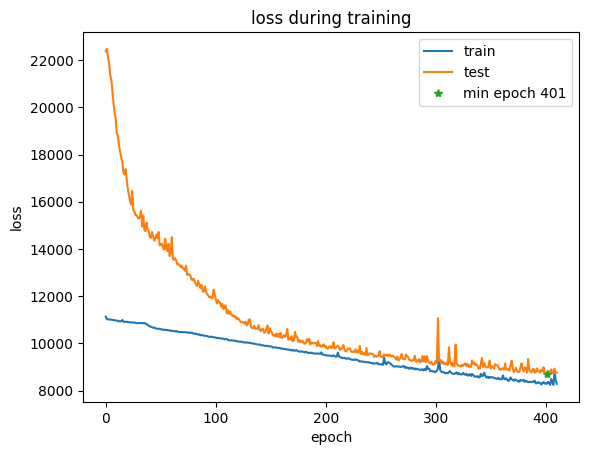

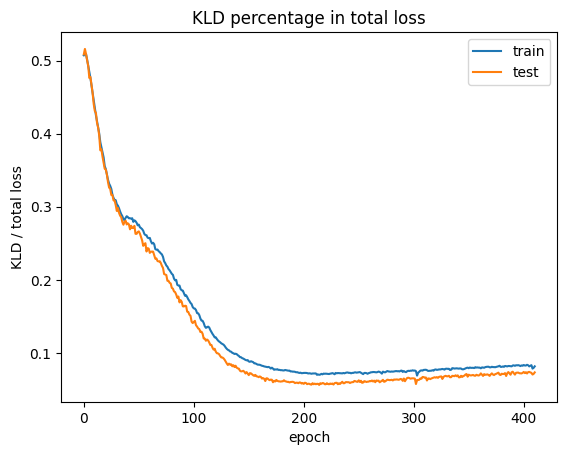

epoch 411: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8247.026, BCE: 7765.009, KLD: 703.784, KLD/(KLD+BCE): 8.310% beta:1.00
[valid] loss: 8791.071, BCE: 8148.670, KLD: 642.400, KLD/loss: 7.307%


epoch 412: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8263.378, BCE: 7784.428, KLD: 701.117, KLD/(KLD+BCE): 8.262% beta:1.00
[valid] loss: 8731.273, BCE: 8102.574, KLD: 628.700, KLD/loss: 7.201%


epoch 413: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8249.388, BCE: 7768.610, KLD: 697.082, KLD/(KLD+BCE): 8.234% beta:1.00
[valid] loss: 9199.543, BCE: 8555.642, KLD: 643.901, KLD/loss: 6.999%


epoch 414: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8304.449, BCE: 7817.447, KLD: 706.979, KLD/(KLD+BCE): 8.294% beta:1.00
[valid] loss: 8700.591, BCE: 8072.718, KLD: 627.873, KLD/loss: 7.216%
model save at:  model_files_beta/ckpt_414.pt
remove  model_files_beta/ckpt_359.pt


epoch 415: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8210.456, BCE: 7725.766, KLD: 701.937, KLD/(KLD+BCE): 8.329% beta:1.00
[valid] loss: 8688.074, BCE: 8042.368, KLD: 645.706, KLD/loss: 7.432%


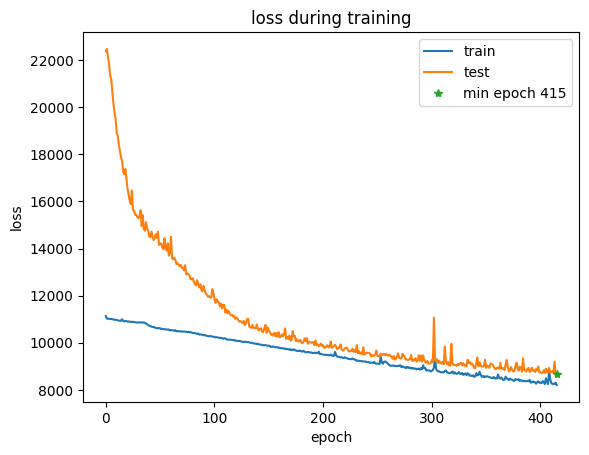

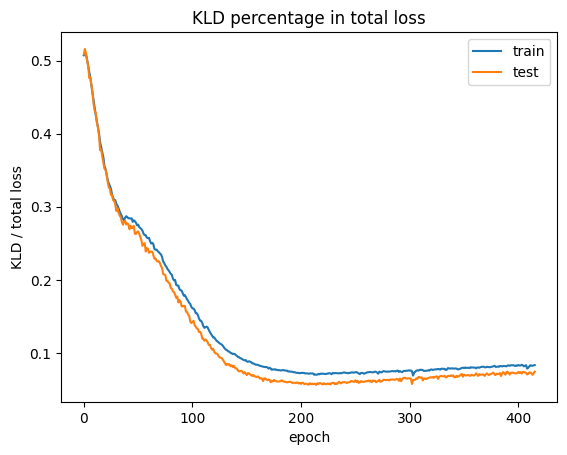

model save at:  model_files_beta/ckpt_415.pt
remove  model_files_beta/ckpt_367.pt


epoch 416: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8212.910, BCE: 7726.492, KLD: 704.122, KLD/(KLD+BCE): 8.352% beta:1.00
[valid] loss: 8695.435, BCE: 8068.450, KLD: 626.985, KLD/loss: 7.211%


epoch 417: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8213.809, BCE: 7729.553, KLD: 700.121, KLD/(KLD+BCE): 8.305% beta:1.00
[valid] loss: 8748.810, BCE: 8097.899, KLD: 650.911, KLD/loss: 7.440%


epoch 418: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8314.217, BCE: 7823.927, KLD: 708.694, KLD/(KLD+BCE): 8.306% beta:1.00
[valid] loss: 9494.064, BCE: 8829.603, KLD: 664.461, KLD/loss: 6.999%


epoch 419: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8307.887, BCE: 7816.557, KLD: 715.086, KLD/(KLD+BCE): 8.382% beta:1.00
[valid] loss: 8648.955, BCE: 8006.114, KLD: 642.841, KLD/loss: 7.433%
model save at:  model_files_beta/ckpt_419.pt
remove  model_files_beta/ckpt_371.pt


epoch 420: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8209.718, BCE: 7718.614, KLD: 707.923, KLD/(KLD+BCE): 8.401% beta:1.00
[valid] loss: 8690.502, BCE: 8047.106, KLD: 643.396, KLD/loss: 7.403%


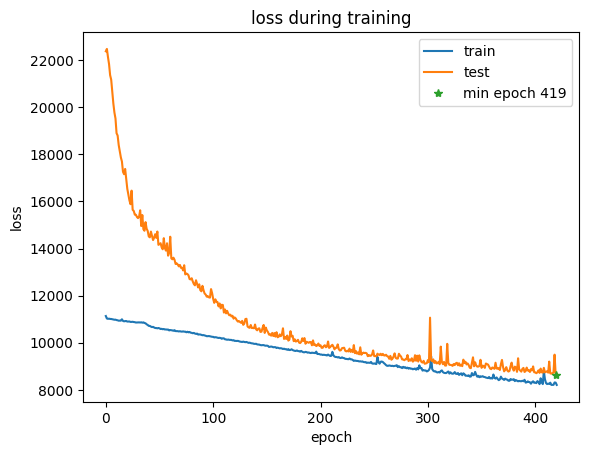

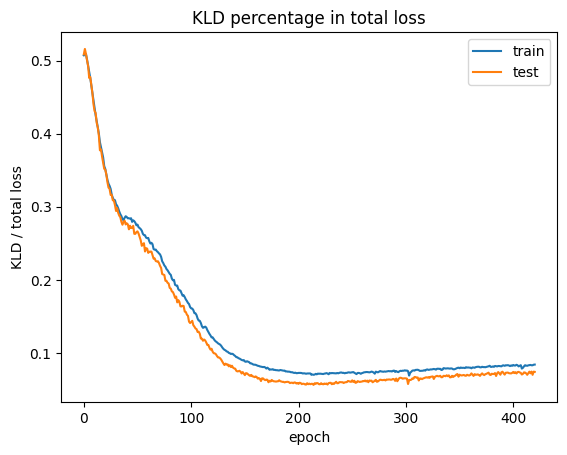

epoch 421: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8168.843, BCE: 7680.551, KLD: 706.326, KLD/(KLD+BCE): 8.422% beta:1.00
[valid] loss: 8792.556, BCE: 8146.130, KLD: 646.425, KLD/loss: 7.352%


epoch 422: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8182.295, BCE: 7690.004, KLD: 709.442, KLD/(KLD+BCE): 8.446% beta:1.00
[valid] loss: 8869.345, BCE: 8218.262, KLD: 651.083, KLD/loss: 7.341%


epoch 423: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8307.526, BCE: 7823.321, KLD: 702.922, KLD/(KLD+BCE): 8.244% beta:1.00
[valid] loss: 8883.872, BCE: 8260.038, KLD: 623.834, KLD/loss: 7.022%


epoch 424: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8241.558, BCE: 7751.485, KLD: 707.134, KLD/(KLD+BCE): 8.360% beta:1.00
[valid] loss: 8704.566, BCE: 8060.690, KLD: 643.876, KLD/loss: 7.397%


epoch 425: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8226.935, BCE: 7732.828, KLD: 710.699, KLD/(KLD+BCE): 8.417% beta:1.00
[valid] loss: 8779.203, BCE: 8133.779, KLD: 645.424, KLD/loss: 7.352%


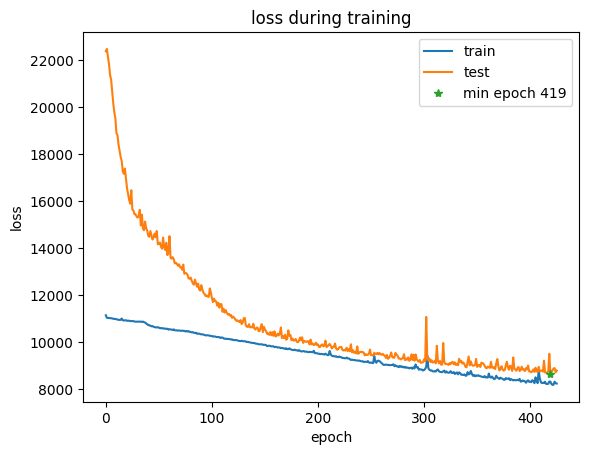

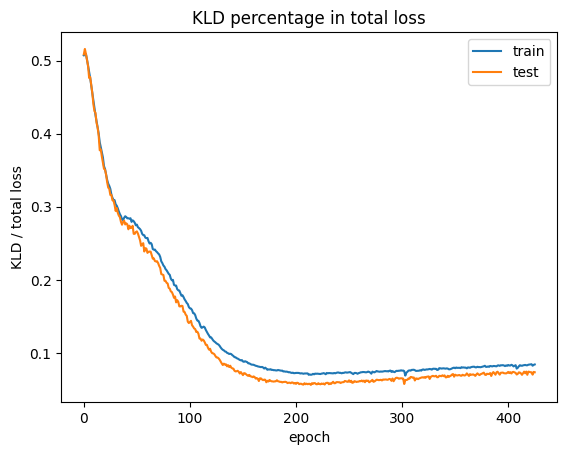

epoch 426: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8206.309, BCE: 7716.872, KLD: 708.414, KLD/(KLD+BCE): 8.408% beta:1.00
[valid] loss: 8813.092, BCE: 8169.604, KLD: 643.488, KLD/loss: 7.302%


epoch 427: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8181.158, BCE: 7688.861, KLD: 707.062, KLD/(KLD+BCE): 8.421% beta:1.00
[valid] loss: 8636.683, BCE: 8003.771, KLD: 632.911, KLD/loss: 7.328%
model save at:  model_files_beta/ckpt_427.pt
remove  model_files_beta/ckpt_375.pt


epoch 428: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8135.847, BCE: 7649.149, KLD: 698.246, KLD/(KLD+BCE): 8.365% beta:1.00
[valid] loss: 8636.640, BCE: 7999.308, KLD: 637.332, KLD/loss: 7.379%
model save at:  model_files_beta/ckpt_428.pt
remove  model_files_beta/ckpt_383.pt


epoch 429: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8169.193, BCE: 7671.145, KLD: 711.048, KLD/(KLD+BCE): 8.483% beta:1.00
[valid] loss: 9057.761, BCE: 8403.183, KLD: 654.579, KLD/loss: 7.227%


epoch 430: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8355.261, BCE: 7857.924, KLD: 711.003, KLD/(KLD+BCE): 8.297% beta:1.00
[valid] loss: 9169.244, BCE: 8511.449, KLD: 657.795, KLD/loss: 7.174%


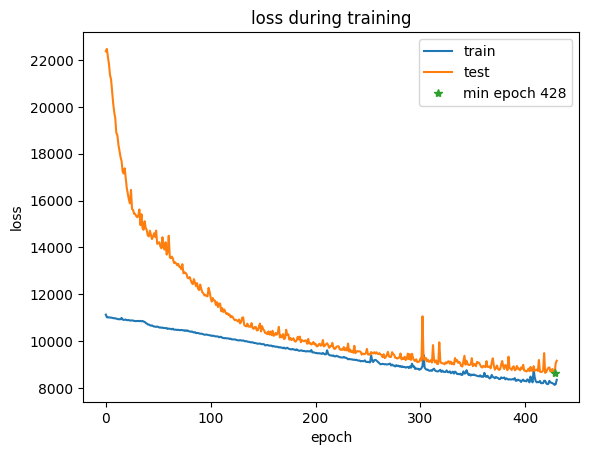

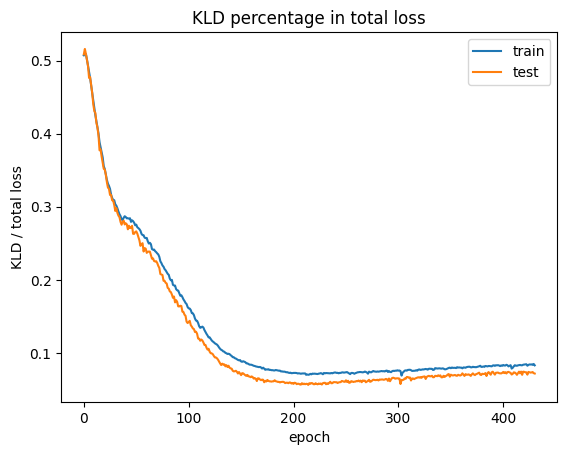

epoch 431: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8244.998, BCE: 7747.116, KLD: 713.554, KLD/(KLD+BCE): 8.434% beta:1.00
[valid] loss: 8684.002, BCE: 8023.081, KLD: 660.921, KLD/loss: 7.611%


epoch 432: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8131.880, BCE: 7629.116, KLD: 720.071, KLD/(KLD+BCE): 8.624% beta:1.00
[valid] loss: 8595.791, BCE: 7945.409, KLD: 650.382, KLD/loss: 7.566%
model save at:  model_files_beta/ckpt_432.pt
remove  model_files_beta/ckpt_390.pt


epoch 433: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8148.592, BCE: 7652.272, KLD: 709.688, KLD/(KLD+BCE): 8.487% beta:1.00
[valid] loss: 8863.580, BCE: 8229.028, KLD: 634.552, KLD/loss: 7.159%


epoch 434: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8131.282, BCE: 7634.531, KLD: 708.082, KLD/(KLD+BCE): 8.488% beta:1.00
[valid] loss: 8652.387, BCE: 8008.896, KLD: 643.491, KLD/loss: 7.437%


epoch 435: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8176.217, BCE: 7673.983, KLD: 713.992, KLD/(KLD+BCE): 8.512% beta:1.00
[valid] loss: 8878.362, BCE: 8225.707, KLD: 652.655, KLD/loss: 7.351%


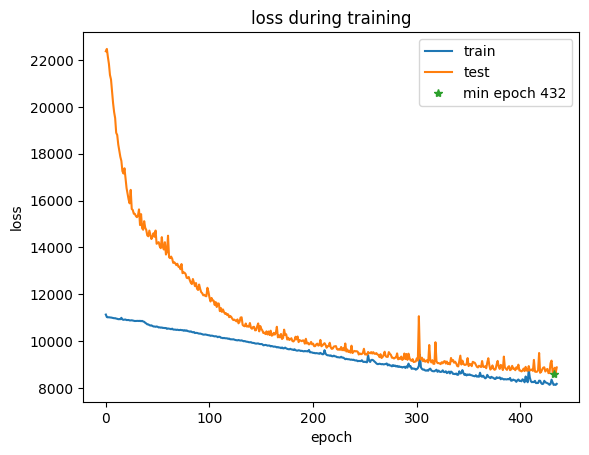

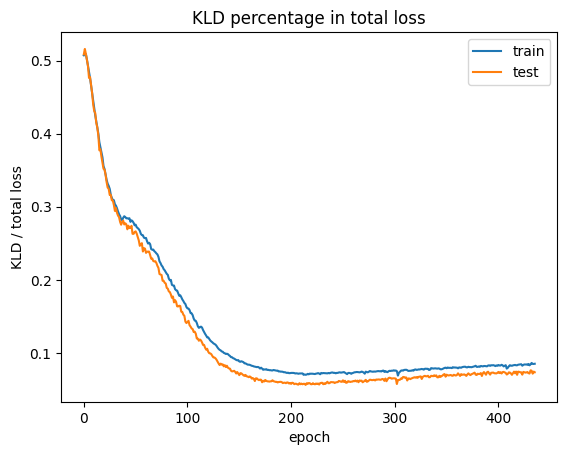

epoch 436: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8153.651, BCE: 7654.744, KLD: 709.800, KLD/(KLD+BCE): 8.486% beta:1.00
[valid] loss: 8723.046, BCE: 8070.757, KLD: 652.289, KLD/loss: 7.478%


epoch 437: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9007.514, BCE: 8488.425, KLD: 733.469, KLD/(KLD+BCE): 7.954% beta:1.00
[valid] loss: 9122.295, BCE: 8492.805, KLD: 629.489, KLD/loss: 6.901%


epoch 438: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8376.338, BCE: 7876.484, KLD: 703.368, KLD/(KLD+BCE): 8.198% beta:1.00
[valid] loss: 8969.667, BCE: 8322.332, KLD: 647.335, KLD/loss: 7.217%


epoch 439: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8196.954, BCE: 7698.932, KLD: 709.642, KLD/(KLD+BCE): 8.440% beta:1.00
[valid] loss: 8664.665, BCE: 8010.849, KLD: 653.816, KLD/loss: 7.546%


epoch 440: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8187.199, BCE: 7684.006, KLD: 710.468, KLD/(KLD+BCE): 8.464% beta:1.00
[valid] loss: 8643.503, BCE: 7991.661, KLD: 651.842, KLD/loss: 7.541%


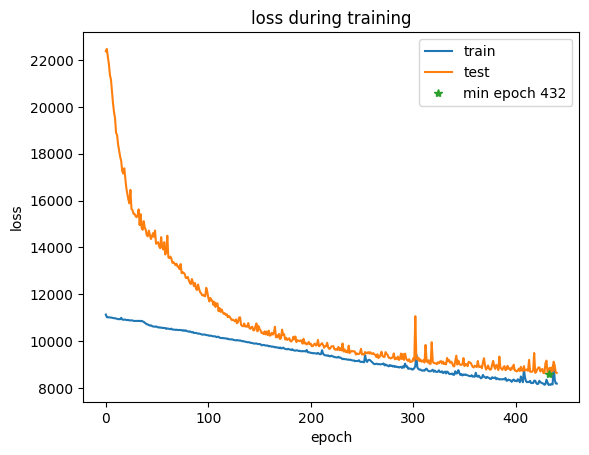

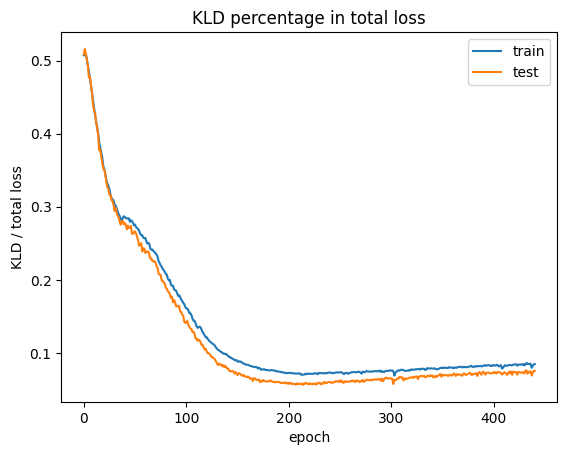

epoch 441: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8151.033, BCE: 7652.601, KLD: 705.274, KLD/(KLD+BCE): 8.438% beta:1.00
[valid] loss: 8747.083, BCE: 8115.911, KLD: 631.172, KLD/loss: 7.216%


epoch 442: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8113.260, BCE: 7624.040, KLD: 693.626, KLD/(KLD+BCE): 8.339% beta:1.00
[valid] loss: 8576.711, BCE: 7938.421, KLD: 638.291, KLD/loss: 7.442%
model save at:  model_files_beta/ckpt_442.pt
remove  model_files_beta/ckpt_395.pt


epoch 443: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8096.337, BCE: 7599.140, KLD: 702.829, KLD/(KLD+BCE): 8.466% beta:1.00
[valid] loss: 8626.718, BCE: 7980.337, KLD: 646.382, KLD/loss: 7.493%


epoch 444: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8109.523, BCE: 7608.363, KLD: 707.402, KLD/(KLD+BCE): 8.507% beta:1.00
[valid] loss: 8942.523, BCE: 8308.326, KLD: 634.197, KLD/loss: 7.092%


epoch 445: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8102.572, BCE: 7607.911, KLD: 699.074, KLD/(KLD+BCE): 8.415% beta:1.00
[valid] loss: 8670.570, BCE: 8028.831, KLD: 641.739, KLD/loss: 7.401%


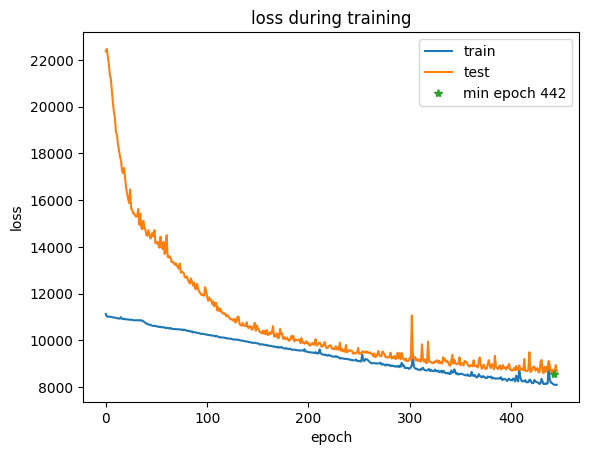

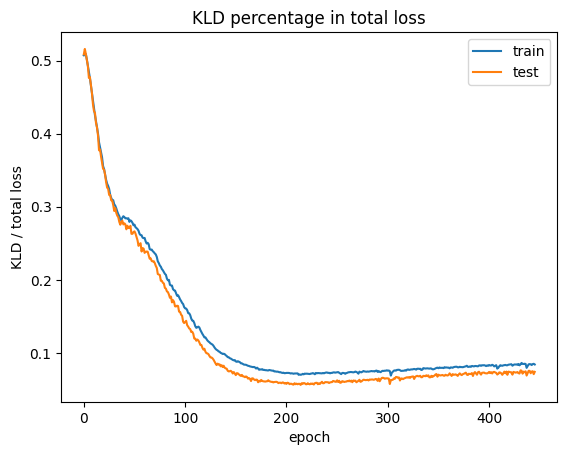

epoch 446: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8057.369, BCE: 7559.327, KLD: 704.225, KLD/(KLD+BCE): 8.522% beta:1.00
[valid] loss: 8688.881, BCE: 8043.597, KLD: 645.285, KLD/loss: 7.427%


epoch 447: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8077.140, BCE: 7579.019, KLD: 702.681, KLD/(KLD+BCE): 8.485% beta:1.00
[valid] loss: 8579.692, BCE: 7932.056, KLD: 647.636, KLD/loss: 7.548%


epoch 448: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8281.457, BCE: 7780.051, KLD: 706.257, KLD/(KLD+BCE): 8.322% beta:1.00
[valid] loss: 8610.179, BCE: 7968.475, KLD: 641.704, KLD/loss: 7.453%


epoch 449: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8396.385, BCE: 7890.706, KLD: 707.554, KLD/(KLD+BCE): 8.229% beta:1.00
[valid] loss: 8730.649, BCE: 8076.320, KLD: 654.329, KLD/loss: 7.495%


epoch 450: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8449.374, BCE: 7949.643, KLD: 705.331, KLD/(KLD+BCE): 8.149% beta:1.00
[valid] loss: 8647.088, BCE: 7999.977, KLD: 647.111, KLD/loss: 7.484%


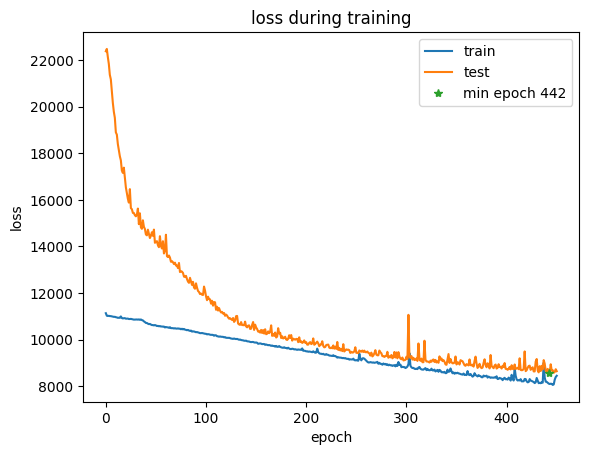

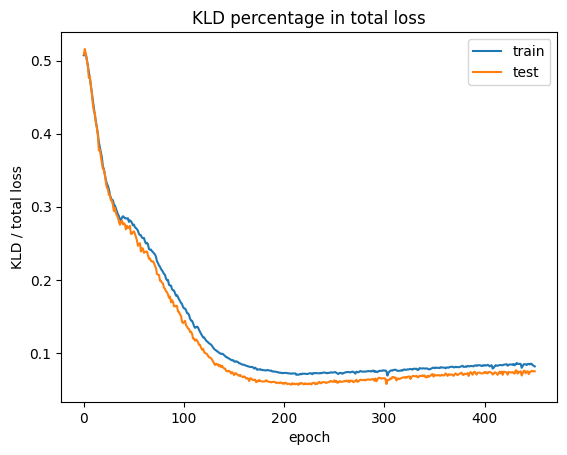

epoch 451: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8100.828, BCE: 7597.307, KLD: 706.084, KLD/(KLD+BCE): 8.504% beta:1.00
[valid] loss: 8624.301, BCE: 7977.758, KLD: 646.543, KLD/loss: 7.497%


epoch 452: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8143.645, BCE: 7642.261, KLD: 702.093, KLD/(KLD+BCE): 8.414% beta:1.00
[valid] loss: 8671.185, BCE: 8030.374, KLD: 640.811, KLD/loss: 7.390%


epoch 453: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8125.810, BCE: 7625.667, KLD: 703.370, KLD/(KLD+BCE): 8.445% beta:1.00
[valid] loss: 8688.368, BCE: 8034.634, KLD: 653.734, KLD/loss: 7.524%


epoch 454: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8098.883, BCE: 7592.221, KLD: 709.341, KLD/(KLD+BCE): 8.545% beta:1.00
[valid] loss: 8623.006, BCE: 7981.496, KLD: 641.510, KLD/loss: 7.440%


epoch 455: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8068.123, BCE: 7558.712, KLD: 708.602, KLD/(KLD+BCE): 8.571% beta:1.00
[valid] loss: 8577.047, BCE: 7929.872, KLD: 647.175, KLD/loss: 7.545%


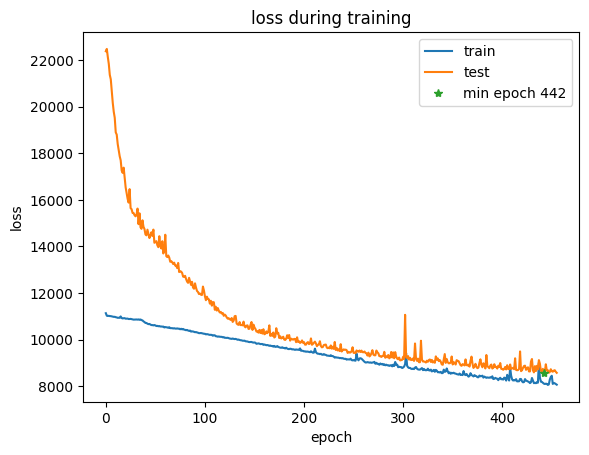

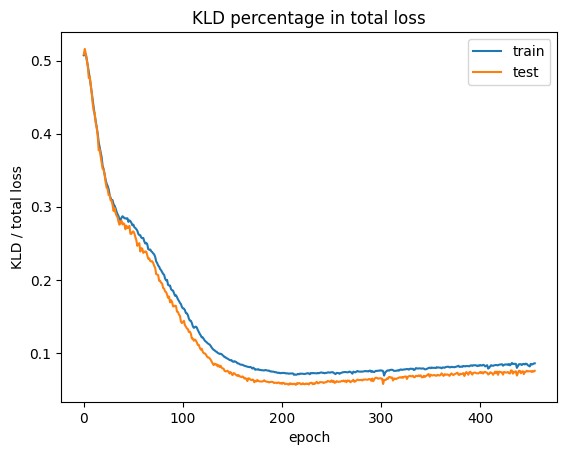

epoch 456: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8099.204, BCE: 7594.305, KLD: 703.723, KLD/(KLD+BCE): 8.481% beta:1.00
[valid] loss: 8602.167, BCE: 7954.848, KLD: 647.319, KLD/loss: 7.525%


epoch 457: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8090.497, BCE: 7587.618, KLD: 701.072, KLD/(KLD+BCE): 8.458% beta:1.00
[valid] loss: 8593.557, BCE: 7937.852, KLD: 655.706, KLD/loss: 7.630%


epoch 458: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8080.474, BCE: 7573.537, KLD: 702.285, KLD/(KLD+BCE): 8.486% beta:1.00
[valid] loss: 8802.411, BCE: 8152.658, KLD: 649.752, KLD/loss: 7.382%


epoch 459: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8077.319, BCE: 7567.594, KLD: 709.671, KLD/(KLD+BCE): 8.574% beta:1.00
[valid] loss: 8624.300, BCE: 7970.737, KLD: 653.563, KLD/loss: 7.578%


epoch 460: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8024.333, BCE: 7514.566, KLD: 709.676, KLD/(KLD+BCE): 8.629% beta:1.00
[valid] loss: 8609.492, BCE: 7966.119, KLD: 643.373, KLD/loss: 7.473%


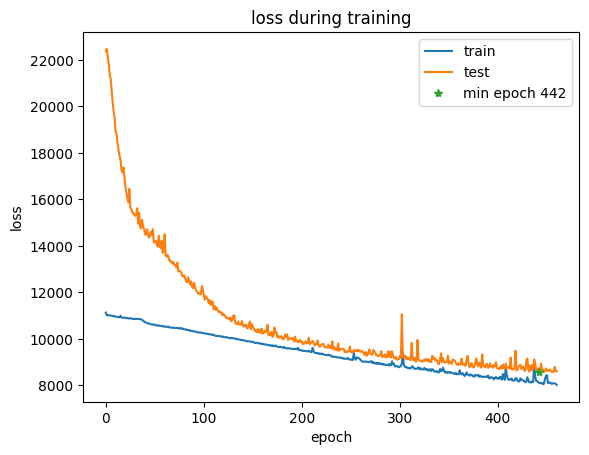

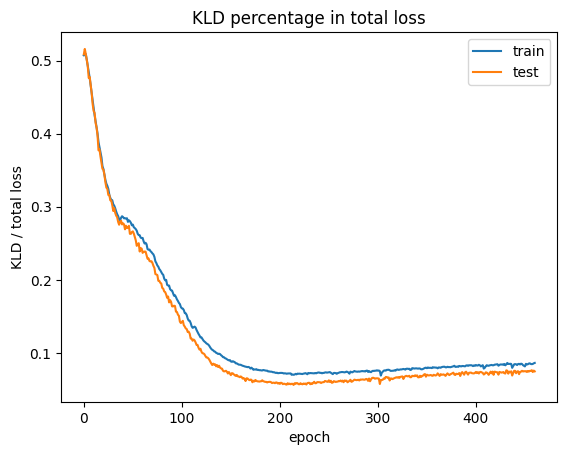

epoch 461: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8073.193, BCE: 7566.827, KLD: 706.230, KLD/(KLD+BCE): 8.537% beta:1.00
[valid] loss: 8561.077, BCE: 7909.379, KLD: 651.698, KLD/loss: 7.612%
model save at:  model_files_beta/ckpt_461.pt
remove  model_files_beta/ckpt_399.pt


epoch 462: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7994.894, BCE: 7490.986, KLD: 703.728, KLD/(KLD+BCE): 8.588% beta:1.00
[valid] loss: 8641.557, BCE: 7990.496, KLD: 651.061, KLD/loss: 7.534%


epoch 463: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8094.209, BCE: 7582.719, KLD: 710.751, KLD/(KLD+BCE): 8.570% beta:1.00
[valid] loss: 8974.497, BCE: 8319.770, KLD: 654.727, KLD/loss: 7.295%


epoch 464: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8064.207, BCE: 7545.388, KLD: 722.509, KLD/(KLD+BCE): 8.739% beta:1.00
[valid] loss: 8489.341, BCE: 7836.151, KLD: 653.190, KLD/loss: 7.694%
model save at:  model_files_beta/ckpt_464.pt
remove  model_files_beta/ckpt_400.pt


epoch 465: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7992.941, BCE: 7474.588, KLD: 717.543, KLD/(KLD+BCE): 8.759% beta:1.00
[valid] loss: 9180.616, BCE: 8512.326, KLD: 668.290, KLD/loss: 7.279%


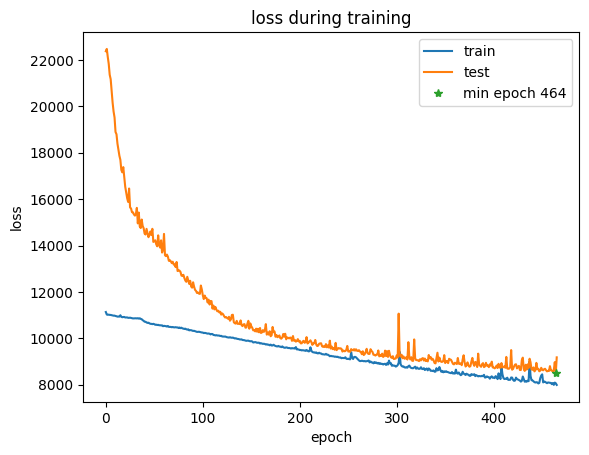

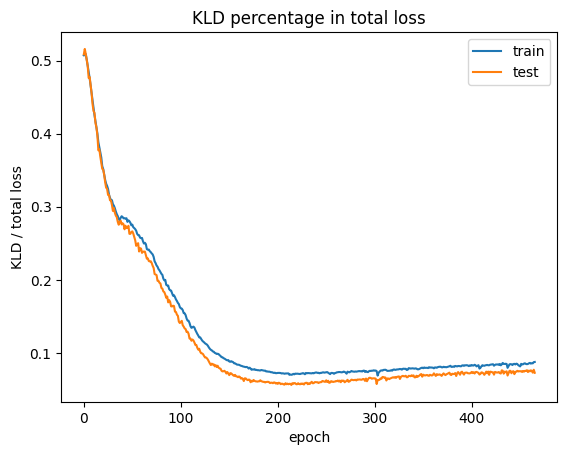

epoch 466: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8014.433, BCE: 7501.017, KLD: 709.481, KLD/(KLD+BCE): 8.641% beta:1.00
[valid] loss: 8526.507, BCE: 7884.906, KLD: 641.601, KLD/loss: 7.525%


epoch 467: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8068.749, BCE: 7558.500, KLD: 702.663, KLD/(KLD+BCE): 8.506% beta:1.00
[valid] loss: 8558.949, BCE: 7910.245, KLD: 648.704, KLD/loss: 7.579%


epoch 468: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8039.655, BCE: 7525.321, KLD: 712.499, KLD/(KLD+BCE): 8.649% beta:1.00
[valid] loss: 8668.497, BCE: 8020.826, KLD: 647.670, KLD/loss: 7.472%


epoch 469: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8603.284, BCE: 8099.341, KLD: 700.301, KLD/(KLD+BCE): 7.958% beta:1.00
[valid] loss: 8762.943, BCE: 8121.769, KLD: 641.174, KLD/loss: 7.317%


epoch 470: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8109.778, BCE: 7599.555, KLD: 704.906, KLD/(KLD+BCE): 8.488% beta:1.00
[valid] loss: 8551.741, BCE: 7894.107, KLD: 657.633, KLD/loss: 7.690%


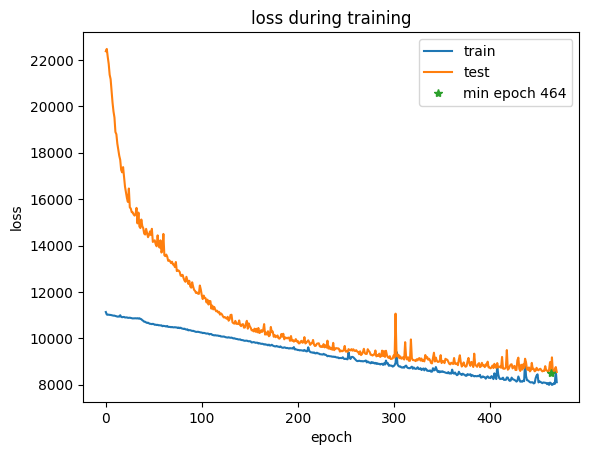

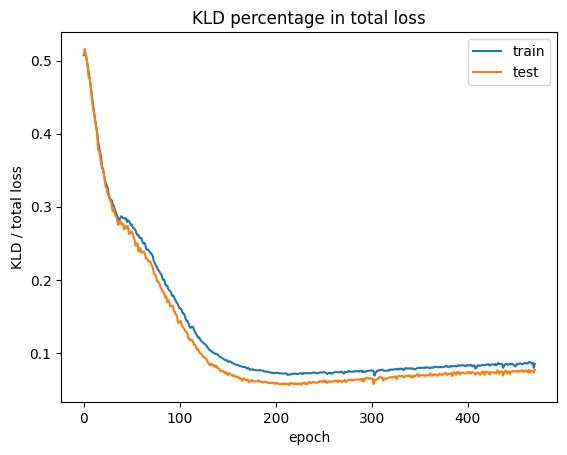

epoch 471: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8139.276, BCE: 7621.171, KLD: 715.718, KLD/(KLD+BCE): 8.585% beta:1.00
[valid] loss: 8649.911, BCE: 8002.840, KLD: 647.071, KLD/loss: 7.481%


epoch 472: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8035.435, BCE: 7521.172, KLD: 708.063, KLD/(KLD+BCE): 8.604% beta:1.00
[valid] loss: 8553.026, BCE: 7890.844, KLD: 662.183, KLD/loss: 7.742%


epoch 473: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8080.559, BCE: 7562.474, KLD: 715.183, KLD/(KLD+BCE): 8.640% beta:1.00
[valid] loss: 9165.711, BCE: 8506.181, KLD: 659.530, KLD/loss: 7.196%


epoch 474: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8111.799, BCE: 7590.790, KLD: 714.808, KLD/(KLD+BCE): 8.606% beta:1.00
[valid] loss: 8516.286, BCE: 7865.484, KLD: 650.803, KLD/loss: 7.642%


epoch 475: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7993.524, BCE: 7479.936, KLD: 707.402, KLD/(KLD+BCE): 8.640% beta:1.00
[valid] loss: 8607.021, BCE: 7961.299, KLD: 645.722, KLD/loss: 7.502%


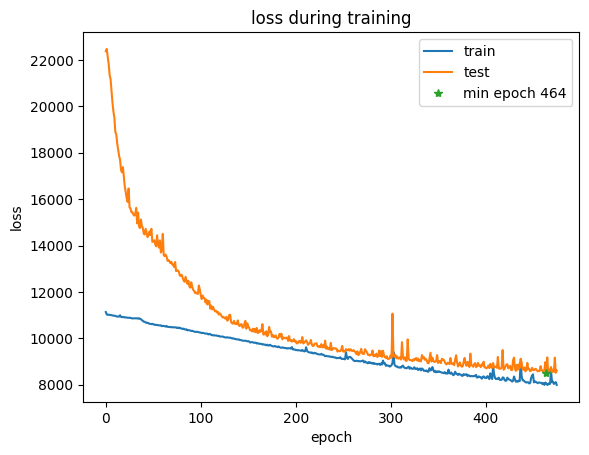

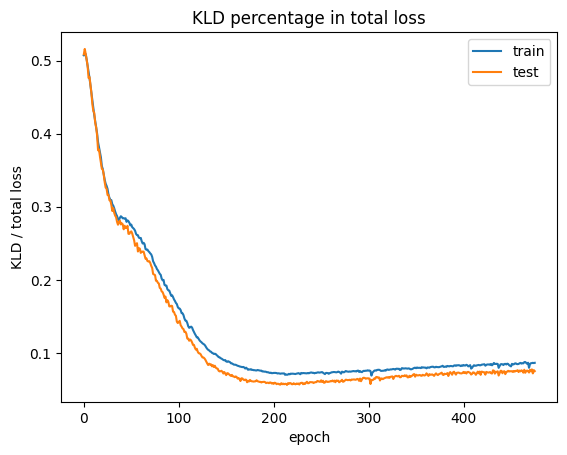

epoch 476: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8137.032, BCE: 7607.781, KLD: 721.123, KLD/(KLD+BCE): 8.658% beta:1.00
[valid] loss: 9252.047, BCE: 8580.622, KLD: 671.425, KLD/loss: 7.257%


epoch 477: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8084.437, BCE: 7564.305, KLD: 718.933, KLD/(KLD+BCE): 8.679% beta:1.00
[valid] loss: 8546.474, BCE: 7896.069, KLD: 650.405, KLD/loss: 7.610%


epoch 478: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7956.771, BCE: 7437.204, KLD: 711.976, KLD/(KLD+BCE): 8.737% beta:1.00
[valid] loss: 8561.394, BCE: 7914.078, KLD: 647.315, KLD/loss: 7.561%


epoch 479: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7941.852, BCE: 7418.547, KLD: 718.258, KLD/(KLD+BCE): 8.827% beta:1.00
[valid] loss: 8978.005, BCE: 8304.622, KLD: 673.383, KLD/loss: 7.500%


epoch 480: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8385.167, BCE: 7854.088, KLD: 727.666, KLD/(KLD+BCE): 8.479% beta:1.00
[valid] loss: 8655.652, BCE: 7989.902, KLD: 665.750, KLD/loss: 7.692%


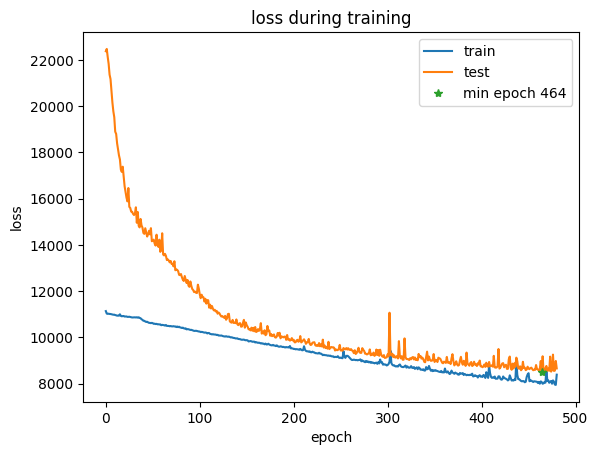

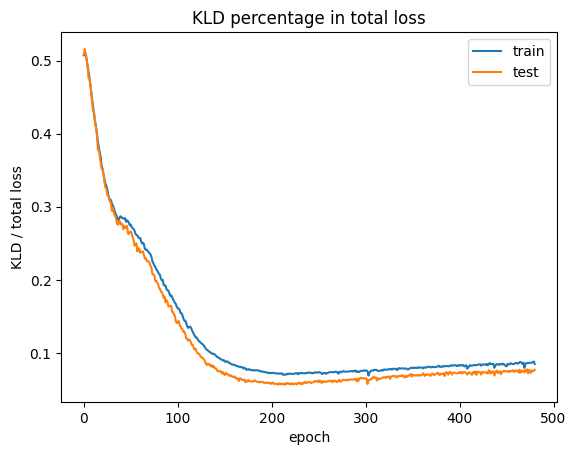

epoch 481: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8021.447, BCE: 7497.421, KLD: 723.590, KLD/(KLD+BCE): 8.802% beta:1.00
[valid] loss: 8559.342, BCE: 7901.431, KLD: 657.911, KLD/loss: 7.686%


epoch 482: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7954.434, BCE: 7432.780, KLD: 713.909, KLD/(KLD+BCE): 8.763% beta:1.00
[valid] loss: 8437.813, BCE: 7787.939, KLD: 649.874, KLD/loss: 7.702%
model save at:  model_files_beta/ckpt_482.pt
remove  model_files_beta/ckpt_401.pt


epoch 483: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7943.279, BCE: 7425.210, KLD: 709.586, KLD/(KLD+BCE): 8.723% beta:1.00
[valid] loss: 8418.327, BCE: 7762.529, KLD: 655.799, KLD/loss: 7.790%
model save at:  model_files_beta/ckpt_483.pt
remove  model_files_beta/ckpt_414.pt


epoch 484: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7950.237, BCE: 7436.219, KLD: 705.819, KLD/(KLD+BCE): 8.669% beta:1.00
[valid] loss: 8623.658, BCE: 7977.125, KLD: 646.532, KLD/loss: 7.497%


epoch 485: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7894.820, BCE: 7376.499, KLD: 709.040, KLD/(KLD+BCE): 8.769% beta:1.00
[valid] loss: 8552.383, BCE: 7895.098, KLD: 657.285, KLD/loss: 7.685%


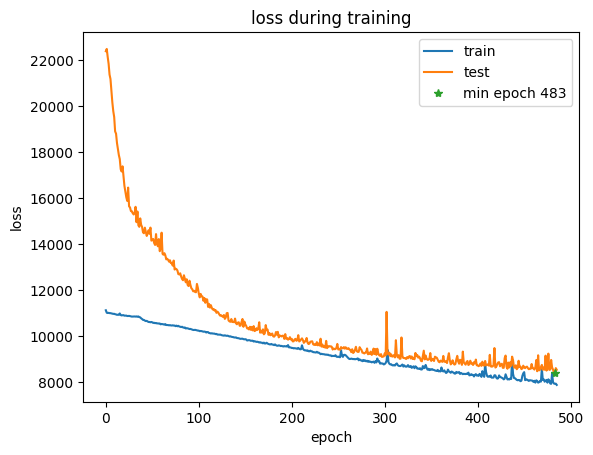

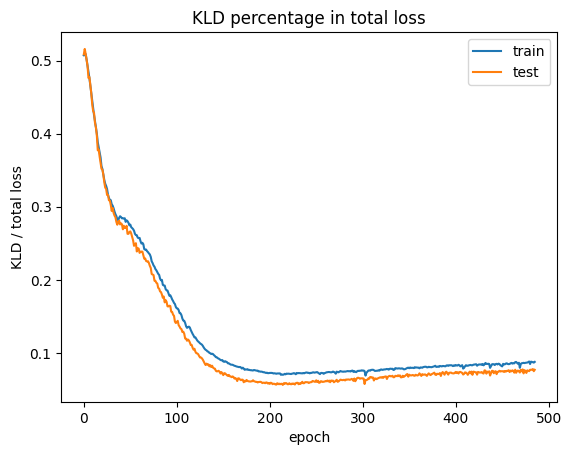

epoch 486: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7914.183, BCE: 7391.317, KLD: 714.116, KLD/(KLD+BCE): 8.810% beta:1.00
[valid] loss: 8746.865, BCE: 8060.528, KLD: 686.337, KLD/loss: 7.847%


epoch 487: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7950.334, BCE: 7427.769, KLD: 715.417, KLD/(KLD+BCE): 8.785% beta:1.00
[valid] loss: 8502.321, BCE: 7849.818, KLD: 652.503, KLD/loss: 7.674%


epoch 488: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7964.894, BCE: 7443.545, KLD: 713.335, KLD/(KLD+BCE): 8.745% beta:1.00
[valid] loss: 8473.698, BCE: 7816.534, KLD: 657.164, KLD/loss: 7.755%


epoch 489: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7992.116, BCE: 7463.224, KLD: 719.477, KLD/(KLD+BCE): 8.793% beta:1.00
[valid] loss: 8469.041, BCE: 7807.084, KLD: 661.958, KLD/loss: 7.816%


epoch 490: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7908.233, BCE: 7382.044, KLD: 716.197, KLD/(KLD+BCE): 8.844% beta:1.00
[valid] loss: 8544.452, BCE: 7894.584, KLD: 649.869, KLD/loss: 7.606%


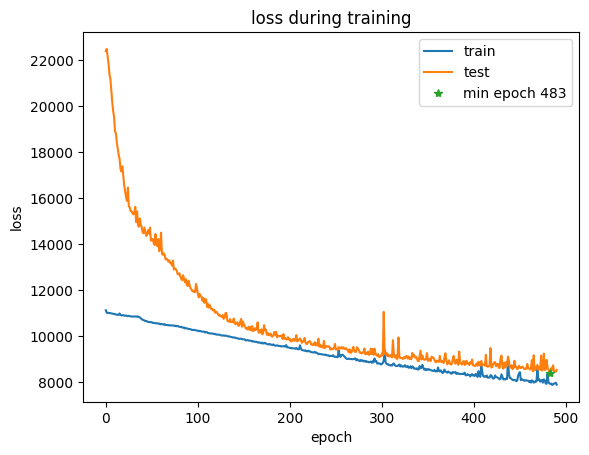

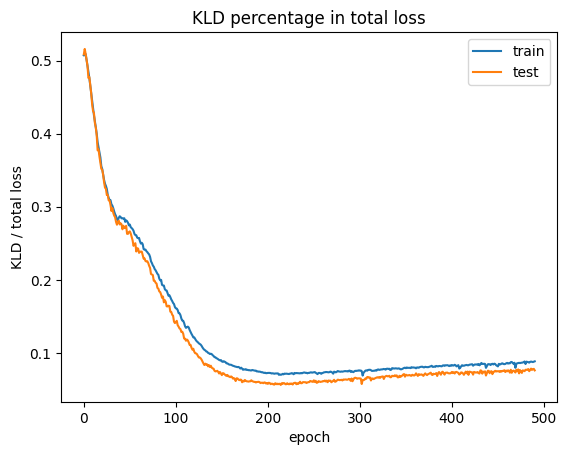

epoch 491: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7917.028, BCE: 7389.166, KLD: 717.357, KLD/(KLD+BCE): 8.849% beta:1.00
[valid] loss: 8538.336, BCE: 7881.617, KLD: 656.719, KLD/loss: 7.691%


epoch 492: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7871.242, BCE: 7340.352, KLD: 717.644, KLD/(KLD+BCE): 8.906% beta:1.00
[valid] loss: 8611.300, BCE: 7947.412, KLD: 663.888, KLD/loss: 7.709%


epoch 493: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7944.759, BCE: 7417.706, KLD: 718.499, KLD/(KLD+BCE): 8.831% beta:1.00
[valid] loss: 8523.792, BCE: 7878.819, KLD: 644.974, KLD/loss: 7.567%


epoch 494: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8130.915, BCE: 7592.433, KLD: 728.959, KLD/(KLD+BCE): 8.760% beta:1.00
[valid] loss: 8544.302, BCE: 7866.210, KLD: 678.093, KLD/loss: 7.936%


epoch 495: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7953.272, BCE: 7416.544, KLD: 727.458, KLD/(KLD+BCE): 8.932% beta:1.00
[valid] loss: 8423.892, BCE: 7761.808, KLD: 662.083, KLD/loss: 7.860%


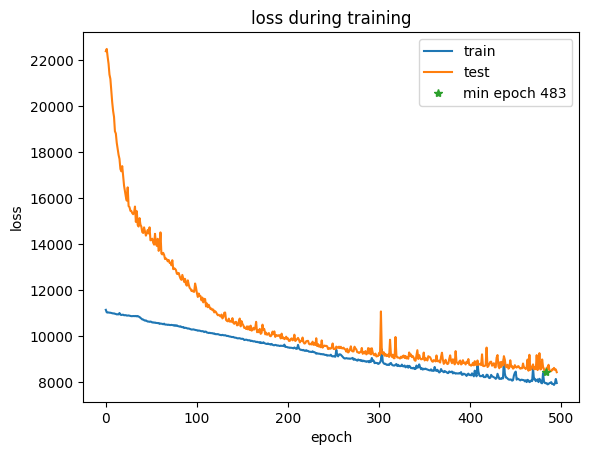

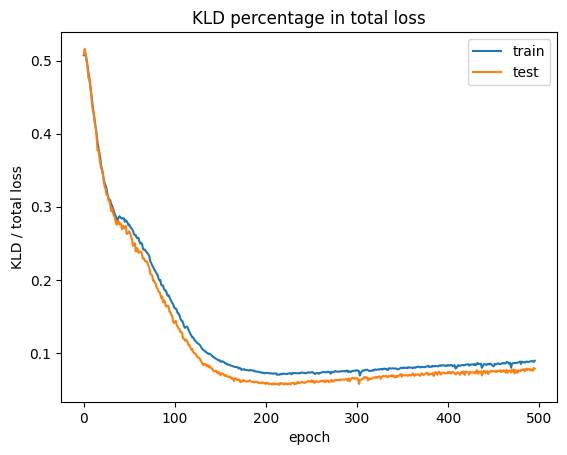

epoch 496: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7905.974, BCE: 7370.618, KLD: 724.918, KLD/(KLD+BCE): 8.955% beta:1.00
[valid] loss: 8701.583, BCE: 8045.057, KLD: 656.526, KLD/loss: 7.545%


epoch 497: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7907.599, BCE: 7379.651, KLD: 715.613, KLD/(KLD+BCE): 8.840% beta:1.00
[valid] loss: 8582.777, BCE: 7906.306, KLD: 676.471, KLD/loss: 7.882%


epoch 498: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7880.010, BCE: 7350.439, KLD: 718.691, KLD/(KLD+BCE): 8.907% beta:1.00
[valid] loss: 8461.456, BCE: 7789.076, KLD: 672.380, KLD/loss: 7.946%


epoch 499: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7839.702, BCE: 7309.361, KLD: 719.821, KLD/(KLD+BCE): 8.965% beta:1.00
[valid] loss: 8754.931, BCE: 8093.745, KLD: 661.186, KLD/loss: 7.552%


epoch 500: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7857.811, BCE: 7323.601, KLD: 723.435, KLD/(KLD+BCE): 8.990% beta:1.00
[valid] loss: 8613.685, BCE: 7936.969, KLD: 676.716, KLD/loss: 7.856%


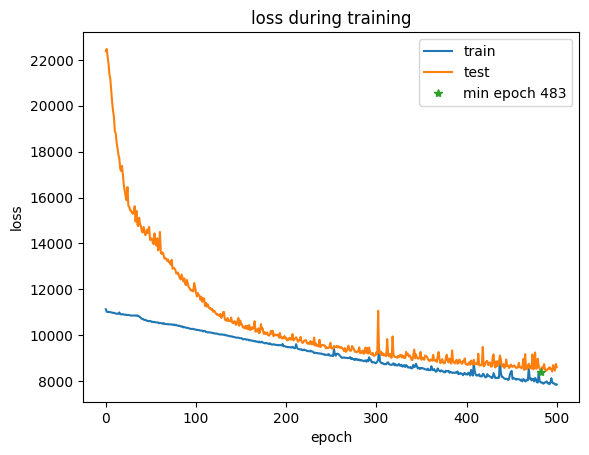

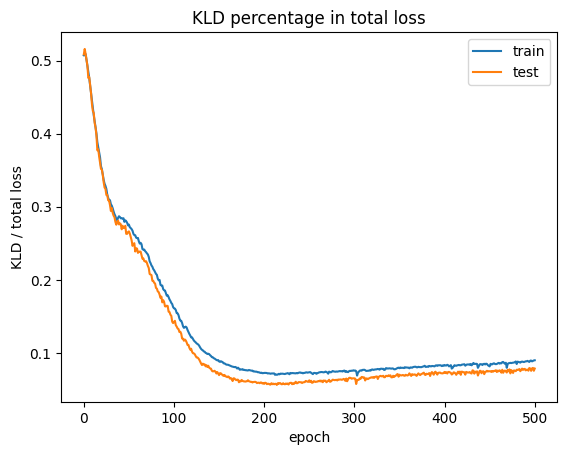

epoch 501: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7895.291, BCE: 7360.741, KLD: 721.639, KLD/(KLD+BCE): 8.929% beta:1.00
[valid] loss: 8749.495, BCE: 8067.123, KLD: 682.372, KLD/loss: 7.799%


epoch 502: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7869.712, BCE: 7329.629, KLD: 730.736, KLD/(KLD+BCE): 9.066% beta:0.00
[valid] loss: 8473.281, BCE: 7803.602, KLD: 669.679, KLD/loss: 7.903%


epoch 503: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7920.628, BCE: 7374.287, KLD: 731.268, KLD/(KLD+BCE): 9.022% beta:0.00
[valid] loss: 8911.412, BCE: 8227.423, KLD: 683.989, KLD/loss: 7.675%


epoch 504: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7935.954, BCE: 7398.869, KLD: 731.046, KLD/(KLD+BCE): 8.992% beta:0.00
[valid] loss: 8603.937, BCE: 7921.204, KLD: 682.733, KLD/loss: 7.935%


epoch 505: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7822.528, BCE: 7289.350, KLD: 726.422, KLD/(KLD+BCE): 9.062% beta:0.00
[valid] loss: 8446.000, BCE: 7775.912, KLD: 670.088, KLD/loss: 7.934%


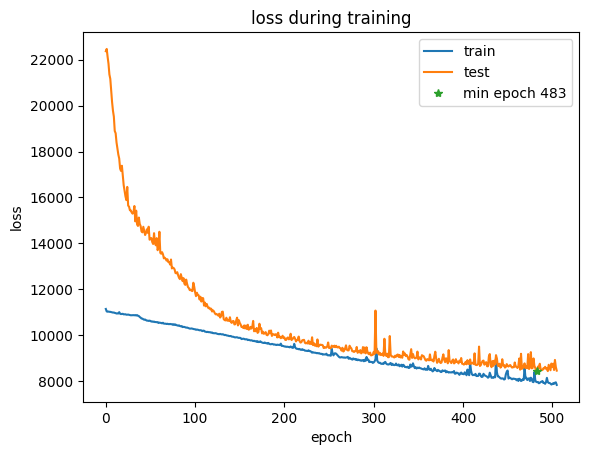

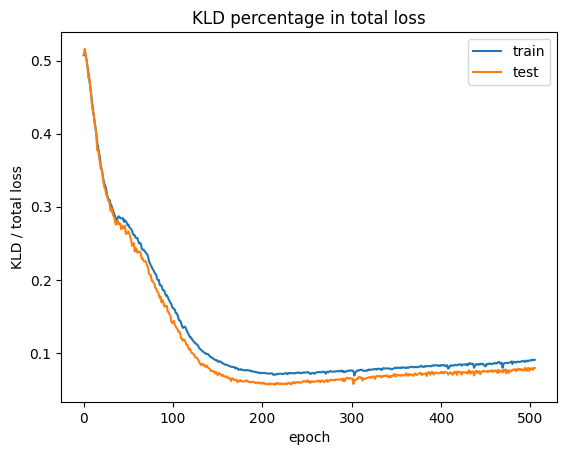

epoch 506: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7972.597, BCE: 7440.961, KLD: 725.534, KLD/(KLD+BCE): 8.884% beta:0.00
[valid] loss: 8453.603, BCE: 7788.567, KLD: 665.036, KLD/loss: 7.867%


epoch 507: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7838.205, BCE: 7303.210, KLD: 726.805, KLD/(KLD+BCE): 9.051% beta:0.00
[valid] loss: 8391.241, BCE: 7714.443, KLD: 676.798, KLD/loss: 8.066%
model save at:  model_files_beta/ckpt_507.pt
remove  model_files_beta/ckpt_415.pt


epoch 508: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7791.532, BCE: 7256.096, KLD: 732.288, KLD/(KLD+BCE): 9.167% beta:0.00
[valid] loss: 8461.412, BCE: 7788.356, KLD: 673.057, KLD/loss: 7.954%


epoch 509: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7876.063, BCE: 7341.343, KLD: 729.660, KLD/(KLD+BCE): 9.041% beta:0.00
[valid] loss: 8639.852, BCE: 7973.860, KLD: 665.992, KLD/loss: 7.708%


epoch 510: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7864.126, BCE: 7340.311, KLD: 716.493, KLD/(KLD+BCE): 8.893% beta:0.00
[valid] loss: 8351.534, BCE: 7691.526, KLD: 660.008, KLD/loss: 7.903%


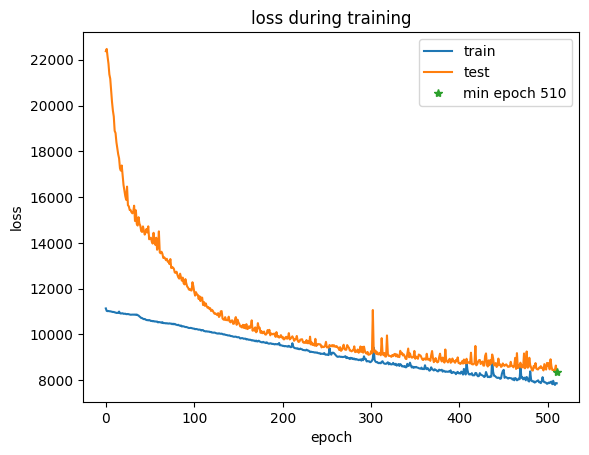

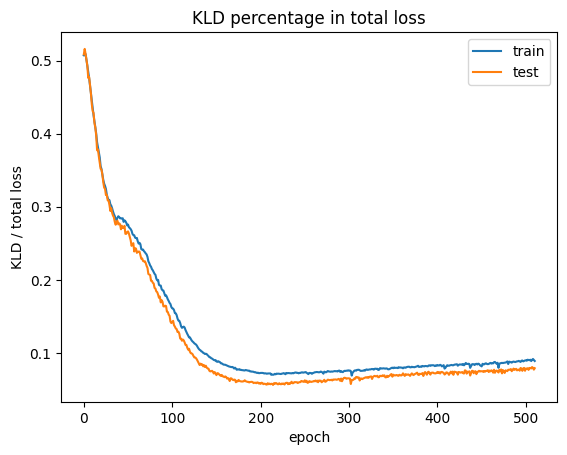

model save at:  model_files_beta/ckpt_510.pt
remove  model_files_beta/ckpt_419.pt


epoch 511: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7759.488, BCE: 7230.422, KLD: 722.567, KLD/(KLD+BCE): 9.085% beta:0.00
[valid] loss: 8651.734, BCE: 7982.406, KLD: 669.327, KLD/loss: 7.736%


epoch 512: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7808.085, BCE: 7276.671, KLD: 731.719, KLD/(KLD+BCE): 9.137% beta:0.00
[valid] loss: 8850.346, BCE: 8171.305, KLD: 679.041, KLD/loss: 7.672%


epoch 513: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8025.594, BCE: 7500.865, KLD: 725.944, KLD/(KLD+BCE): 8.824% beta:0.00
[valid] loss: 8653.044, BCE: 7974.882, KLD: 678.162, KLD/loss: 7.837%


epoch 514: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7933.417, BCE: 7402.172, KLD: 735.432, KLD/(KLD+BCE): 9.037% beta:0.00
[valid] loss: 8471.703, BCE: 7768.315, KLD: 703.388, KLD/loss: 8.303%


epoch 515: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8304.946, BCE: 7759.063, KLD: 751.934, KLD/(KLD+BCE): 8.835% beta:0.00
[valid] loss: 9059.180, BCE: 8386.747, KLD: 672.433, KLD/loss: 7.423%


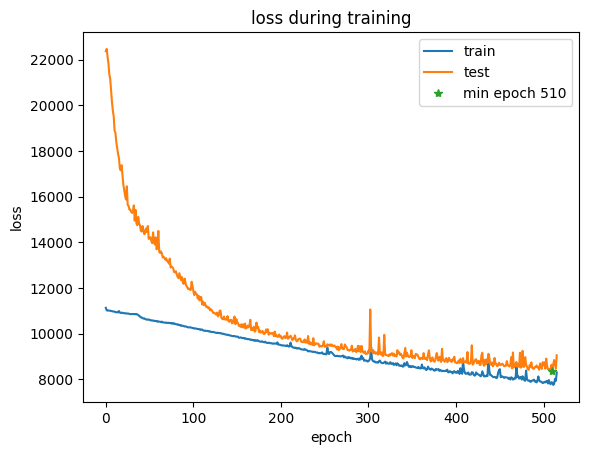

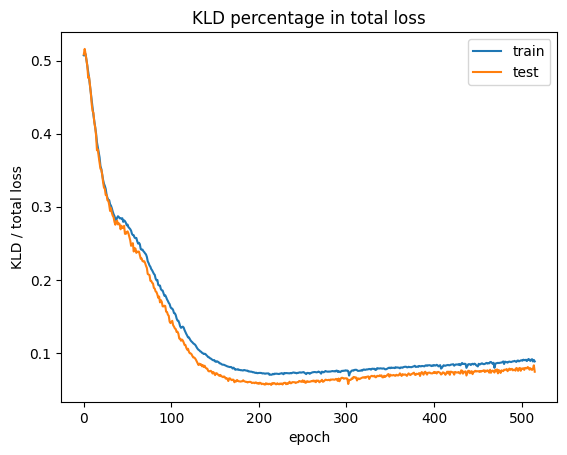

epoch 516: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8090.735, BCE: 7565.827, KLD: 727.171, KLD/(KLD+BCE): 8.768% beta:0.00
[valid] loss: 8437.233, BCE: 7753.716, KLD: 683.517, KLD/loss: 8.101%


epoch 517: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7827.606, BCE: 7298.105, KLD: 733.619, KLD/(KLD+BCE): 9.134% beta:0.01
[valid] loss: 8417.102, BCE: 7725.217, KLD: 691.885, KLD/loss: 8.220%


epoch 518: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7842.761, BCE: 7305.622, KLD: 743.076, KLD/(KLD+BCE): 9.232% beta:0.01
[valid] loss: 8331.129, BCE: 7626.727, KLD: 704.402, KLD/loss: 8.455%
model save at:  model_files_beta/ckpt_518.pt
remove  model_files_beta/ckpt_427.pt


epoch 519: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7838.214, BCE: 7307.066, KLD: 742.359, KLD/(KLD+BCE): 9.223% beta:0.01
[valid] loss: 8556.004, BCE: 7863.249, KLD: 692.755, KLD/loss: 8.097%


epoch 520: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 7766.467, BCE: 7240.292, KLD: 737.049, KLD/(KLD+BCE): 9.239% beta:0.01
[valid] loss: 8481.689, BCE: 7794.324, KLD: 687.365, KLD/loss: 8.104%


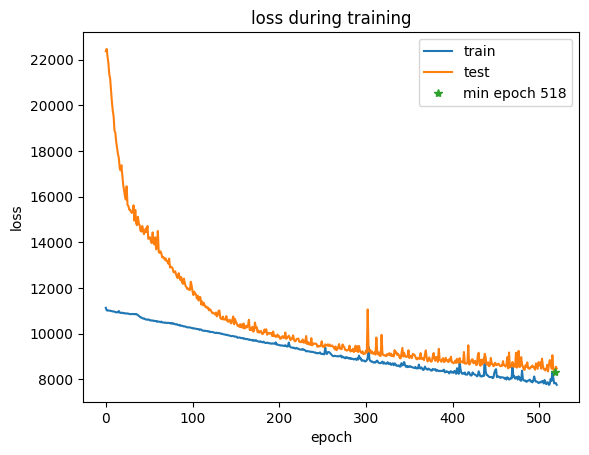

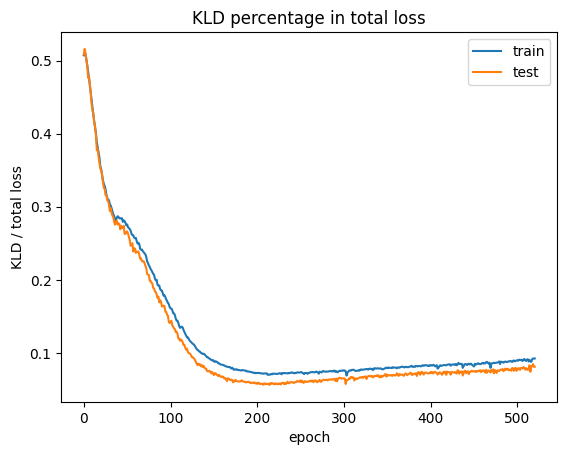

epoch 521: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7746.603, BCE: 7211.403, KLD: 745.818, KLD/(KLD+BCE): 9.373% beta:0.01
[valid] loss: 8456.154, BCE: 7753.821, KLD: 702.333, KLD/loss: 8.306%


epoch 522: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7764.225, BCE: 7227.698, KLD: 751.923, KLD/(KLD+BCE): 9.423% beta:0.01
[valid] loss: 8454.606, BCE: 7738.362, KLD: 716.244, KLD/loss: 8.472%


epoch 523: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7770.754, BCE: 7232.381, KLD: 752.710, KLD/(KLD+BCE): 9.426% beta:0.01
[valid] loss: 8542.008, BCE: 7834.726, KLD: 707.282, KLD/loss: 8.280%


epoch 524: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7761.925, BCE: 7239.402, KLD: 739.199, KLD/(KLD+BCE): 9.265% beta:0.01
[valid] loss: 8437.941, BCE: 7725.656, KLD: 712.285, KLD/loss: 8.441%


epoch 525: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7726.863, BCE: 7200.418, KLD: 746.153, KLD/(KLD+BCE): 9.390% beta:0.01
[valid] loss: 8934.059, BCE: 8189.420, KLD: 744.639, KLD/loss: 8.335%


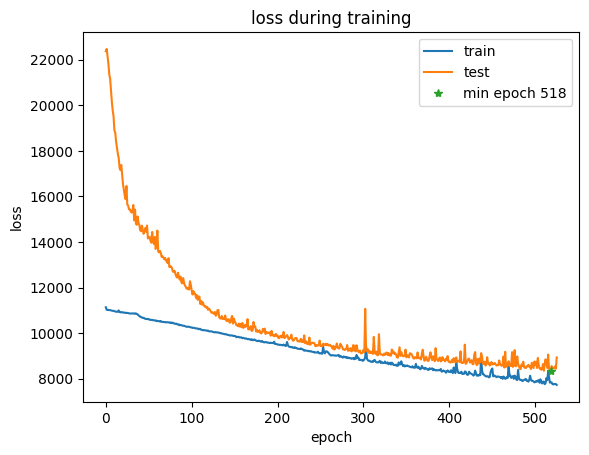

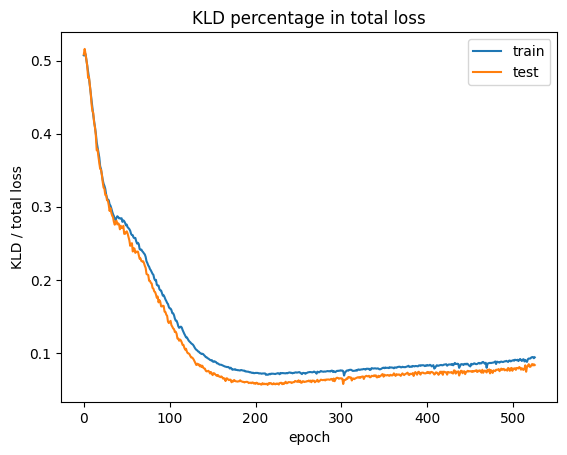

epoch 526: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7697.032, BCE: 7174.244, KLD: 747.744, KLD/(KLD+BCE): 9.439% beta:0.01
[valid] loss: 8342.808, BCE: 7627.461, KLD: 715.347, KLD/loss: 8.574%


epoch 527: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7695.313, BCE: 7163.986, KLD: 756.940, KLD/(KLD+BCE): 9.556% beta:0.01
[valid] loss: 8521.607, BCE: 7800.065, KLD: 721.542, KLD/loss: 8.467%


epoch 528: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7690.088, BCE: 7163.329, KLD: 750.948, KLD/(KLD+BCE): 9.489% beta:0.01
[valid] loss: 8511.123, BCE: 7787.315, KLD: 723.808, KLD/loss: 8.504%


epoch 529: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7744.226, BCE: 7207.960, KLD: 765.580, KLD/(KLD+BCE): 9.602% beta:0.01
[valid] loss: 8439.125, BCE: 7715.675, KLD: 723.450, KLD/loss: 8.573%


epoch 530: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7925.672, BCE: 7393.605, KLD: 761.574, KLD/(KLD+BCE): 9.339% beta:0.01
[valid] loss: 8938.491, BCE: 8213.988, KLD: 724.503, KLD/loss: 8.105%


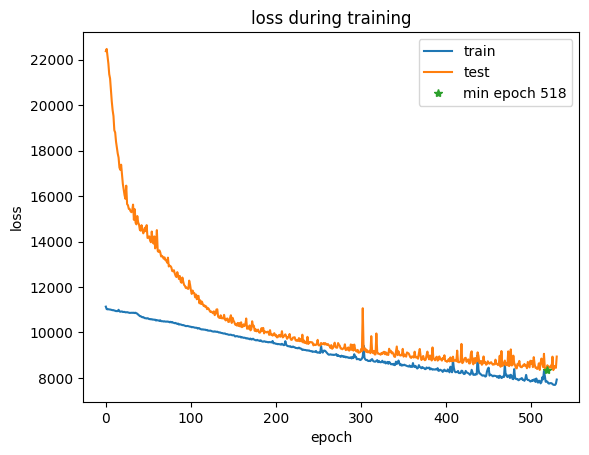

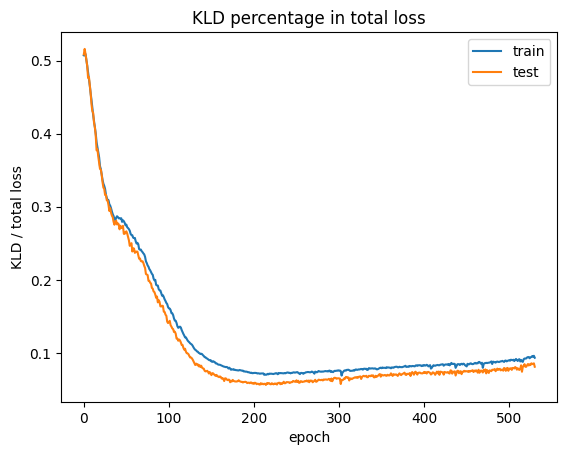

epoch 531: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8076.010, BCE: 7537.817, KLD: 766.640, KLD/(KLD+BCE): 9.232% beta:0.01
[valid] loss: 8469.257, BCE: 7734.864, KLD: 734.393, KLD/loss: 8.671%


epoch 532: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7768.340, BCE: 7237.506, KLD: 758.903, KLD/(KLD+BCE): 9.491% beta:0.01
[valid] loss: 8413.962, BCE: 7680.701, KLD: 733.261, KLD/loss: 8.715%


epoch 533: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7665.167, BCE: 7131.411, KLD: 766.513, KLD/(KLD+BCE): 9.705% beta:0.01
[valid] loss: 8425.831, BCE: 7694.954, KLD: 730.878, KLD/loss: 8.674%


epoch 534: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7706.714, BCE: 7176.511, KLD: 763.482, KLD/(KLD+BCE): 9.616% beta:0.01
[valid] loss: 8489.767, BCE: 7761.377, KLD: 728.391, KLD/loss: 8.580%


epoch 535: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7674.560, BCE: 7140.366, KLD: 767.421, KLD/(KLD+BCE): 9.705% beta:0.01
[valid] loss: 8902.596, BCE: 8156.564, KLD: 746.033, KLD/loss: 8.380%


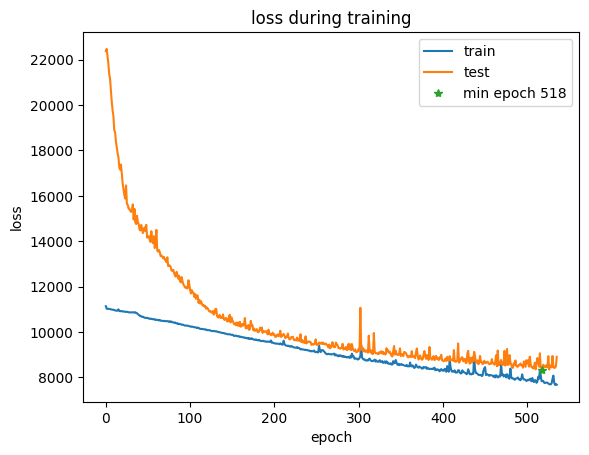

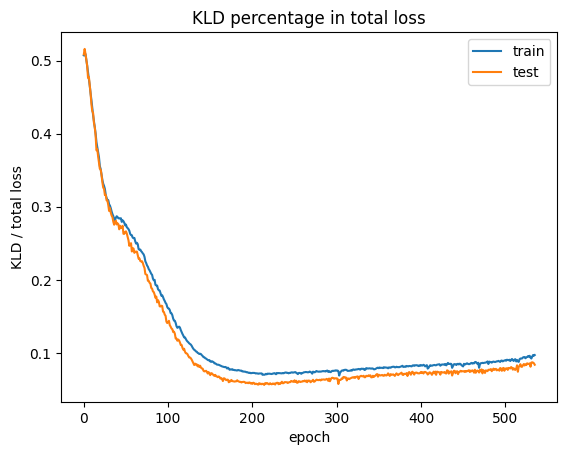

epoch 536: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7620.395, BCE: 7095.624, KLD: 756.801, KLD/(KLD+BCE): 9.638% beta:0.01
[valid] loss: 8402.318, BCE: 7682.898, KLD: 719.420, KLD/loss: 8.562%


epoch 537: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7720.112, BCE: 7191.985, KLD: 765.605, KLD/(KLD+BCE): 9.621% beta:0.01
[valid] loss: 8545.901, BCE: 7798.862, KLD: 747.039, KLD/loss: 8.741%


epoch 538: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7778.814, BCE: 7255.320, KLD: 760.858, KLD/(KLD+BCE): 9.492% beta:0.01
[valid] loss: 8392.689, BCE: 7659.571, KLD: 733.118, KLD/loss: 8.735%


epoch 539: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7860.931, BCE: 7333.682, KLD: 764.043, KLD/(KLD+BCE): 9.435% beta:0.01
[valid] loss: 8367.368, BCE: 7635.040, KLD: 732.328, KLD/loss: 8.752%


epoch 540: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7685.608, BCE: 7154.951, KLD: 769.689, KLD/(KLD+BCE): 9.713% beta:0.02
[valid] loss: 8368.459, BCE: 7620.391, KLD: 748.068, KLD/loss: 8.939%


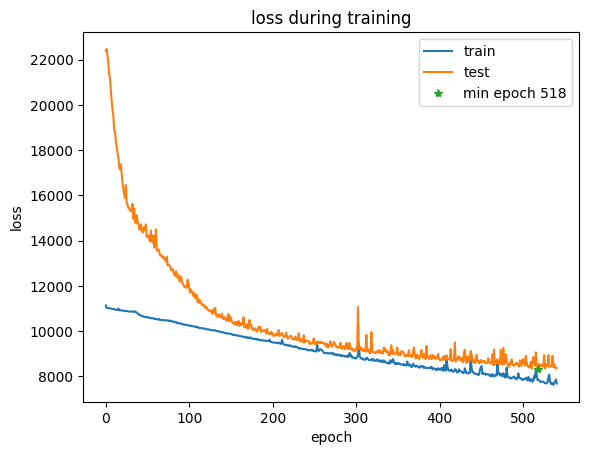

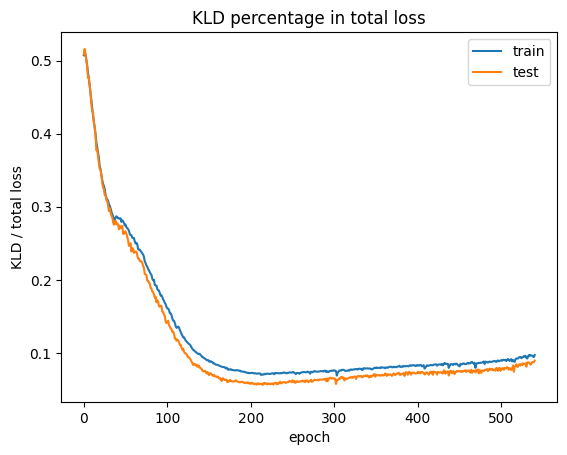

epoch 541: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7634.823, BCE: 7109.577, KLD: 768.740, KLD/(KLD+BCE): 9.758% beta:0.02
[valid] loss: 8408.006, BCE: 7668.024, KLD: 739.982, KLD/loss: 8.801%


epoch 542: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8308.067, BCE: 7756.202, KLD: 794.520, KLD/(KLD+BCE): 9.292% beta:0.02
[valid] loss: 9034.660, BCE: 8290.665, KLD: 743.995, KLD/loss: 8.235%


epoch 543: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7873.599, BCE: 7342.099, KLD: 777.282, KLD/(KLD+BCE): 9.573% beta:0.02
[valid] loss: 8553.596, BCE: 7812.671, KLD: 740.925, KLD/loss: 8.662%


epoch 544: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 7698.283, BCE: 7170.925, KLD: 771.606, KLD/(KLD+BCE): 9.715% beta:0.02
[valid] loss: 8341.571, BCE: 7605.760, KLD: 735.811, KLD/loss: 8.821%


epoch 545: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7908.183, BCE: 7363.598, KLD: 789.161, KLD/(KLD+BCE): 9.680% beta:0.02
[valid] loss: 8638.966, BCE: 7867.310, KLD: 771.656, KLD/loss: 8.932%


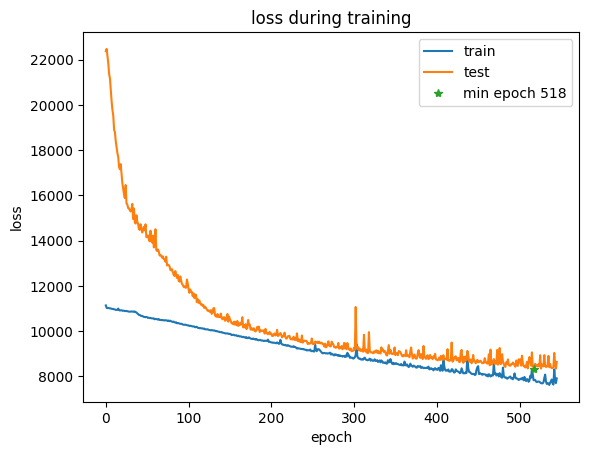

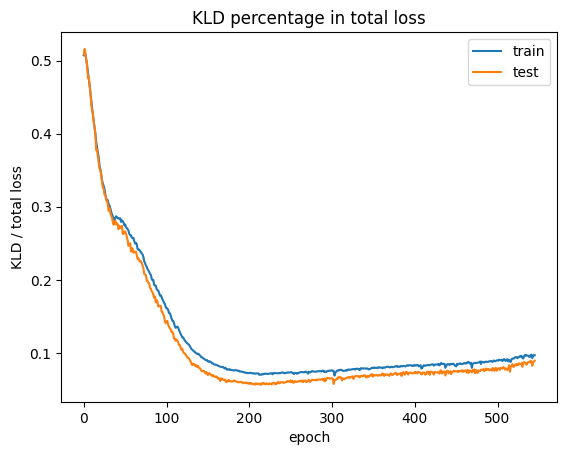

epoch 546: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7641.273, BCE: 7106.140, KLD: 782.805, KLD/(KLD+BCE): 9.923% beta:0.02
[valid] loss: 8526.626, BCE: 7781.571, KLD: 745.055, KLD/loss: 8.738%


epoch 547: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7612.485, BCE: 7086.454, KLD: 769.690, KLD/(KLD+BCE): 9.797% beta:0.02
[valid] loss: 8365.636, BCE: 7615.934, KLD: 749.702, KLD/loss: 8.962%


epoch 548: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7620.915, BCE: 7093.003, KLD: 777.071, KLD/(KLD+BCE): 9.874% beta:0.02
[valid] loss: 8343.358, BCE: 7587.322, KLD: 756.036, KLD/loss: 9.062%


epoch 549: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7824.233, BCE: 7303.182, KLD: 768.213, KLD/(KLD+BCE): 9.518% beta:0.02
[valid] loss: 8532.058, BCE: 7791.874, KLD: 740.184, KLD/loss: 8.675%


epoch 550: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7656.497, BCE: 7129.048, KLD: 779.785, KLD/(KLD+BCE): 9.860% beta:0.02
[valid] loss: 8395.215, BCE: 7628.639, KLD: 766.576, KLD/loss: 9.131%


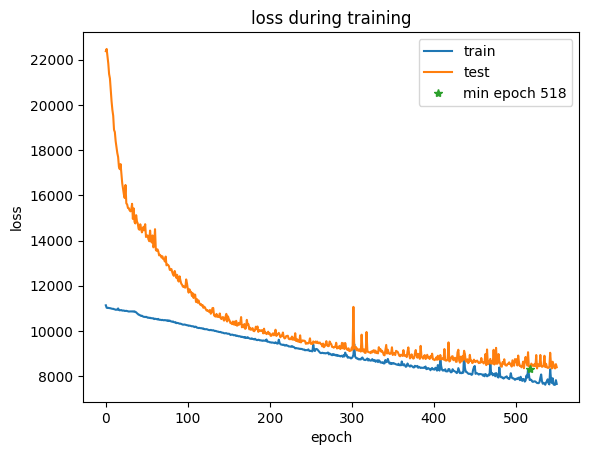

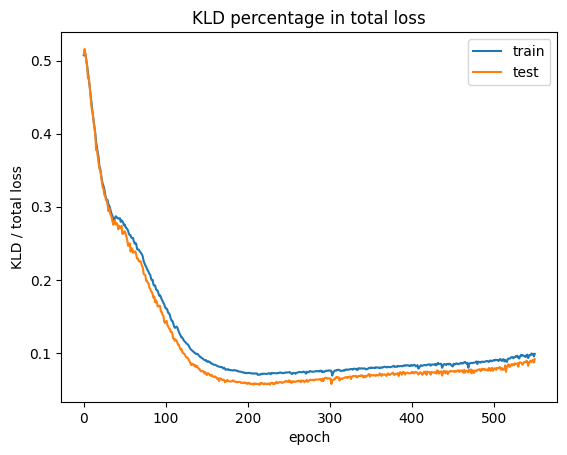

epoch 551: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7627.039, BCE: 7096.516, KLD: 788.289, KLD/(KLD+BCE): 9.998% beta:0.03
[valid] loss: 8343.012, BCE: 7571.230, KLD: 771.783, KLD/loss: 9.251%


epoch 552: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7580.408, BCE: 7051.372, KLD: 784.313, KLD/(KLD+BCE): 10.009% beta:0.03
[valid] loss: 8479.662, BCE: 7712.702, KLD: 766.959, KLD/loss: 9.045%


epoch 553: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7556.467, BCE: 7032.873, KLD: 780.907, KLD/(KLD+BCE): 9.994% beta:0.03
[valid] loss: 8496.237, BCE: 7734.370, KLD: 761.867, KLD/loss: 8.967%


epoch 554: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7629.930, BCE: 7098.114, KLD: 786.992, KLD/(KLD+BCE): 9.981% beta:0.03
[valid] loss: 8480.038, BCE: 7710.697, KLD: 769.341, KLD/loss: 9.072%


epoch 555: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7606.549, BCE: 7084.687, KLD: 786.321, KLD/(KLD+BCE): 9.990% beta:0.03
[valid] loss: 8662.484, BCE: 7867.354, KLD: 795.129, KLD/loss: 9.179%


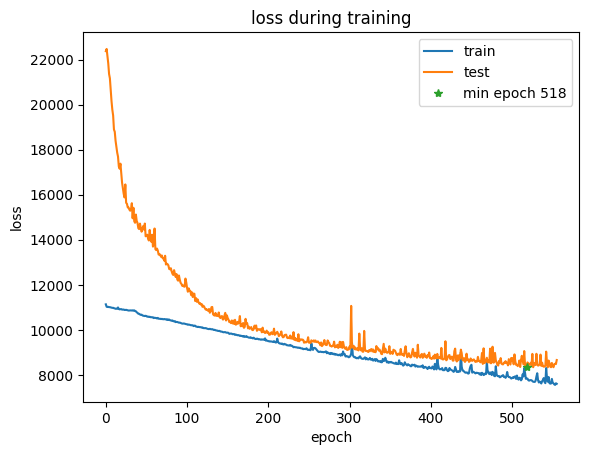

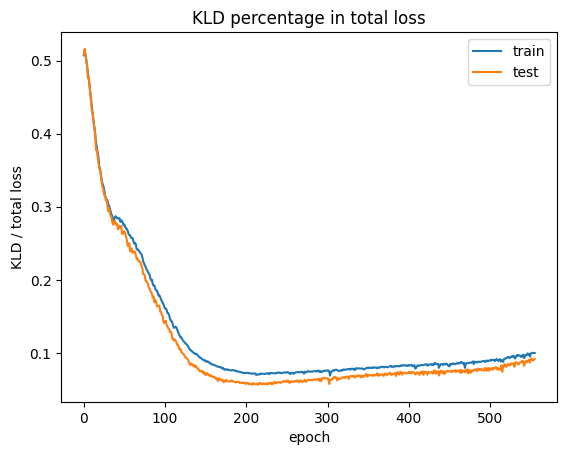

epoch 556: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7539.121, BCE: 7011.382, KLD: 791.952, KLD/(KLD+BCE): 10.149% beta:0.03
[valid] loss: 8708.689, BCE: 7948.255, KLD: 760.434, KLD/loss: 8.732%


epoch 557: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7558.776, BCE: 7037.543, KLD: 783.563, KLD/(KLD+BCE): 10.019% beta:0.03
[valid] loss: 8505.895, BCE: 7711.985, KLD: 793.911, KLD/loss: 9.334%


epoch 558: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7549.934, BCE: 7027.210, KLD: 790.029, KLD/(KLD+BCE): 10.106% beta:0.04
[valid] loss: 8345.288, BCE: 7562.746, KLD: 782.541, KLD/loss: 9.377%


epoch 559: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7578.295, BCE: 7050.053, KLD: 798.073, KLD/(KLD+BCE): 10.169% beta:0.04
[valid] loss: 8375.178, BCE: 7578.259, KLD: 796.919, KLD/loss: 9.515%


epoch 560: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7596.977, BCE: 7066.221, KLD: 797.873, KLD/(KLD+BCE): 10.146% beta:0.04
[valid] loss: 8313.175, BCE: 7541.943, KLD: 771.231, KLD/loss: 9.277%


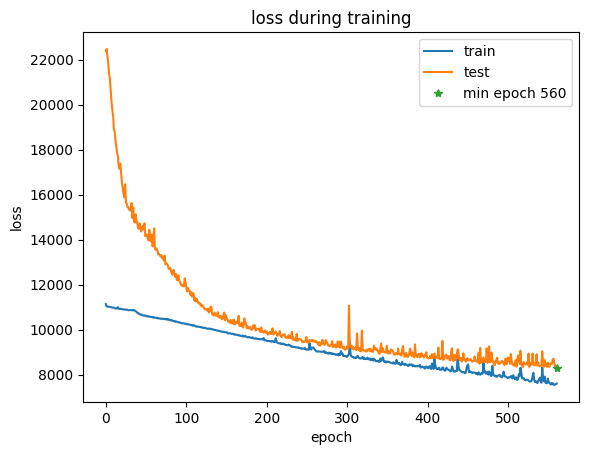

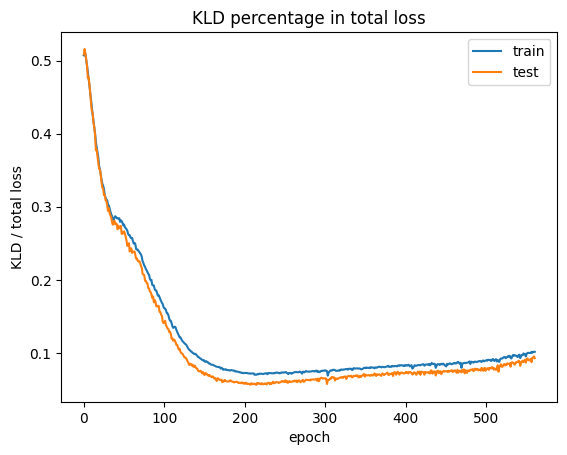

model save at:  model_files_beta/ckpt_560.pt
remove  model_files_beta/ckpt_428.pt


epoch 561: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7555.564, BCE: 7032.883, KLD: 788.621, KLD/(KLD+BCE): 10.083% beta:0.04
[valid] loss: 8470.842, BCE: 7679.860, KLD: 790.982, KLD/loss: 9.338%


epoch 562: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7557.940, BCE: 7034.651, KLD: 793.870, KLD/(KLD+BCE): 10.141% beta:0.04
[valid] loss: 8342.380, BCE: 7540.673, KLD: 801.707, KLD/loss: 9.610%


epoch 563: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7563.837, BCE: 7033.458, KLD: 807.137, KLD/(KLD+BCE): 10.294% beta:0.04
[valid] loss: 8298.529, BCE: 7487.684, KLD: 810.844, KLD/loss: 9.771%
model save at:  model_files_beta/ckpt_563.pt
remove  model_files_beta/ckpt_432.pt


epoch 564: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7869.659, BCE: 7337.508, KLD: 810.298, KLD/(KLD+BCE): 9.945% beta:0.05
[valid] loss: 8475.897, BCE: 7657.304, KLD: 818.593, KLD/loss: 9.658%


epoch 565: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7528.229, BCE: 6993.910, KLD: 818.538, KLD/(KLD+BCE): 10.477% beta:0.05
[valid] loss: 8281.335, BCE: 7464.865, KLD: 816.470, KLD/loss: 9.859%


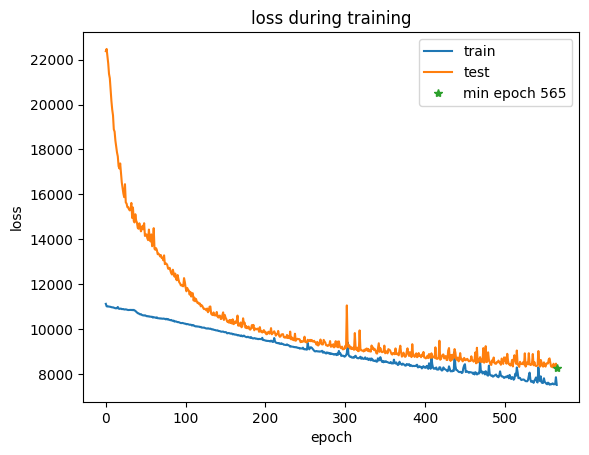

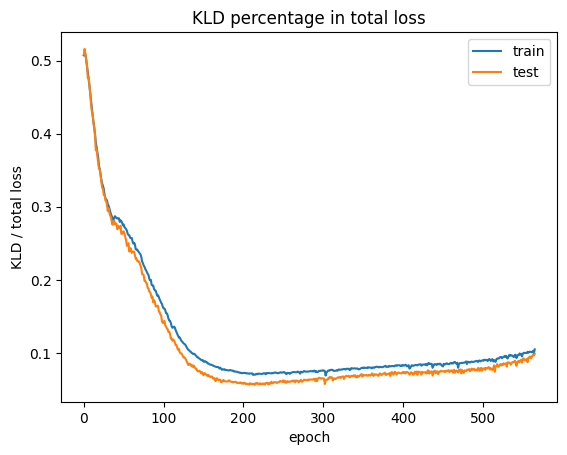

model save at:  model_files_beta/ckpt_565.pt
remove  model_files_beta/ckpt_442.pt


epoch 566: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7481.709, BCE: 6951.509, KLD: 808.296, KLD/(KLD+BCE): 10.416% beta:0.05
[valid] loss: 8264.228, BCE: 7459.071, KLD: 805.157, KLD/loss: 9.743%
model save at:  model_files_beta/ckpt_566.pt
remove  model_files_beta/ckpt_461.pt


epoch 567: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7477.401, BCE: 6953.352, KLD: 803.788, KLD/(KLD+BCE): 10.362% beta:0.05
[valid] loss: 8475.953, BCE: 7667.875, KLD: 808.078, KLD/loss: 9.534%


epoch 568: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7540.009, BCE: 7009.249, KLD: 812.105, KLD/(KLD+BCE): 10.383% beta:0.06
[valid] loss: 8549.206, BCE: 7731.546, KLD: 817.660, KLD/loss: 9.564%


epoch 569: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7459.730, BCE: 6940.672, KLD: 802.579, KLD/(KLD+BCE): 10.365% beta:0.06
[valid] loss: 8640.990, BCE: 7807.462, KLD: 833.528, KLD/loss: 9.646%


epoch 570: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7714.455, BCE: 7172.302, KLD: 833.098, KLD/(KLD+BCE): 10.407% beta:0.06
[valid] loss: 8732.119, BCE: 7907.355, KLD: 824.763, KLD/loss: 9.445%


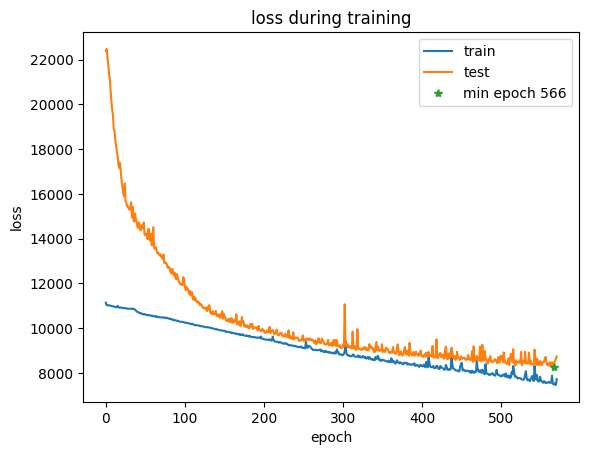

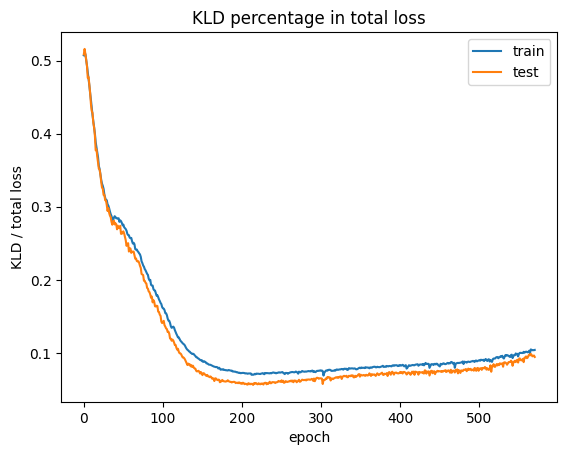

epoch 571: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7612.574, BCE: 7083.534, KLD: 822.256, KLD/(KLD+BCE): 10.401% beta:0.06
[valid] loss: 8372.199, BCE: 7536.998, KLD: 835.201, KLD/loss: 9.976%


epoch 572: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7518.857, BCE: 6983.804, KLD: 825.753, KLD/(KLD+BCE): 10.574% beta:0.07
[valid] loss: 8467.940, BCE: 7642.898, KLD: 825.042, KLD/loss: 9.743%


epoch 573: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7476.654, BCE: 6948.020, KLD: 820.488, KLD/(KLD+BCE): 10.562% beta:0.07
[valid] loss: 8321.606, BCE: 7489.312, KLD: 832.294, KLD/loss: 10.002%


epoch 574: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7486.425, BCE: 6953.681, KLD: 824.685, KLD/(KLD+BCE): 10.602% beta:0.07
[valid] loss: 8270.658, BCE: 7443.516, KLD: 827.142, KLD/loss: 10.001%


epoch 575: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7456.757, BCE: 6924.468, KLD: 825.711, KLD/(KLD+BCE): 10.654% beta:0.08
[valid] loss: 8507.109, BCE: 7683.618, KLD: 823.491, KLD/loss: 9.680%


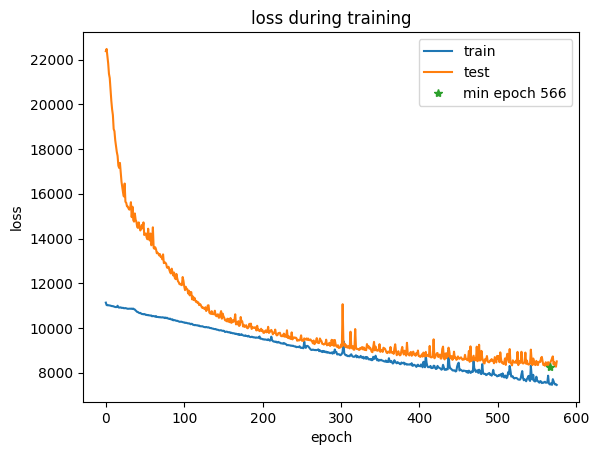

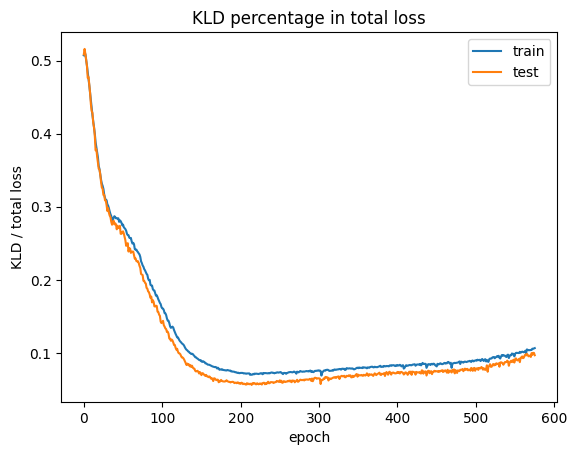

epoch 576: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7496.424, BCE: 6968.135, KLD: 819.351, KLD/(KLD+BCE): 10.521% beta:0.08
[valid] loss: 8298.010, BCE: 7462.628, KLD: 835.382, KLD/loss: 10.067%


epoch 577: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7461.708, BCE: 6933.008, KLD: 823.100, KLD/(KLD+BCE): 10.612% beta:0.08
[valid] loss: 8319.392, BCE: 7475.431, KLD: 843.961, KLD/loss: 10.145%


epoch 578: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7444.922, BCE: 6916.002, KLD: 828.710, KLD/(KLD+BCE): 10.700% beta:0.09
[valid] loss: 8517.306, BCE: 7686.875, KLD: 830.431, KLD/loss: 9.750%


epoch 579: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7475.630, BCE: 6946.367, KLD: 830.717, KLD/(KLD+BCE): 10.682% beta:0.09
[valid] loss: 8728.486, BCE: 7861.841, KLD: 866.645, KLD/loss: 9.929%


epoch 580: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7555.637, BCE: 7023.798, KLD: 833.783, KLD/(KLD+BCE): 10.611% beta:0.09
[valid] loss: 8334.979, BCE: 7495.600, KLD: 839.379, KLD/loss: 10.071%


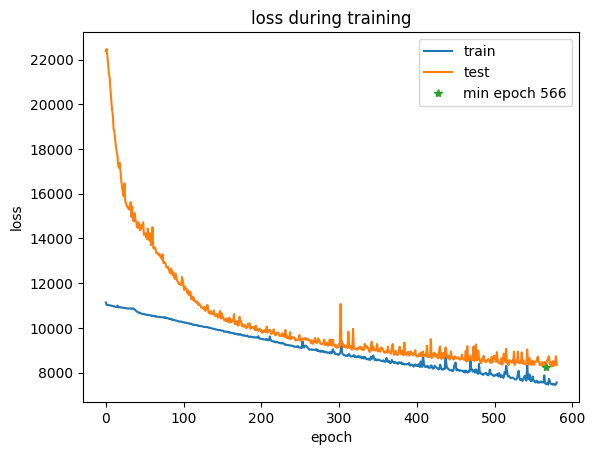

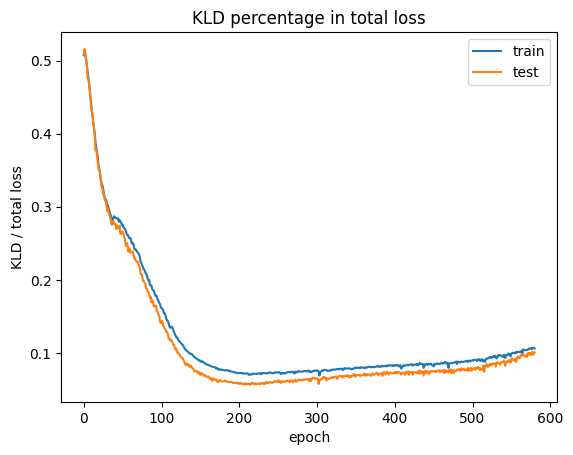

epoch 581: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7402.695, BCE: 6880.470, KLD: 825.939, KLD/(KLD+BCE): 10.718% beta:0.10
[valid] loss: 8311.476, BCE: 7463.529, KLD: 847.947, KLD/loss: 10.202%


epoch 582: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7395.244, BCE: 6868.237, KLD: 830.298, KLD/(KLD+BCE): 10.785% beta:0.10
[valid] loss: 8296.723, BCE: 7449.816, KLD: 846.907, KLD/loss: 10.208%


epoch 583: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 8039.745, BCE: 7510.524, KLD: 830.196, KLD/(KLD+BCE): 9.954% beta:0.11
[valid] loss: 8510.155, BCE: 7693.224, KLD: 816.931, KLD/loss: 9.599%


epoch 584: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7485.560, BCE: 6960.749, KLD: 825.044, KLD/(KLD+BCE): 10.597% beta:0.11
[valid] loss: 8801.168, BCE: 7953.283, KLD: 847.885, KLD/loss: 9.634%


epoch 585: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7470.170, BCE: 6937.471, KLD: 842.755, KLD/(KLD+BCE): 10.832% beta:0.12
[valid] loss: 8427.711, BCE: 7583.278, KLD: 844.433, KLD/loss: 10.020%


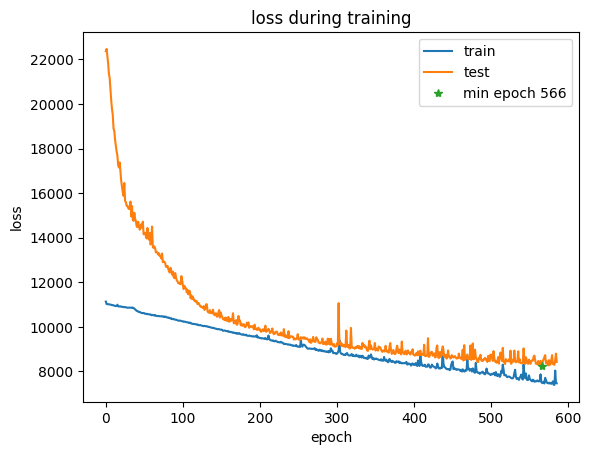

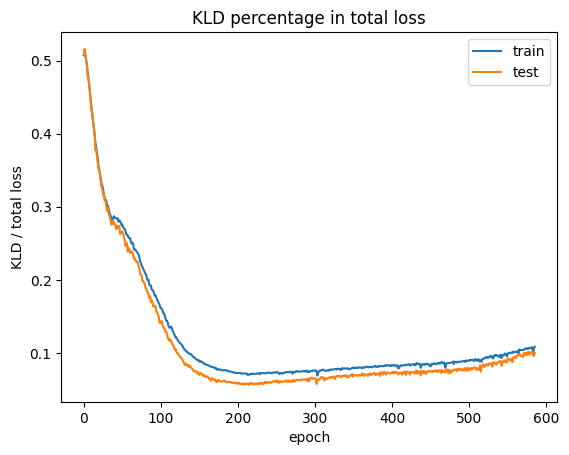

epoch 586: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7453.958, BCE: 6923.719, KLD: 838.579, KLD/(KLD+BCE): 10.803% beta:0.12
[valid] loss: 8348.998, BCE: 7495.662, KLD: 853.336, KLD/loss: 10.221%


epoch 587: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7421.509, BCE: 6892.890, KLD: 835.802, KLD/(KLD+BCE): 10.814% beta:0.13
[valid] loss: 8386.603, BCE: 7532.700, KLD: 853.902, KLD/loss: 10.182%


epoch 588: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7360.298, BCE: 6827.081, KLD: 840.937, KLD/(KLD+BCE): 10.967% beta:0.13
[valid] loss: 8326.798, BCE: 7481.503, KLD: 845.295, KLD/loss: 10.152%


epoch 589: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7359.943, BCE: 6826.476, KLD: 849.653, KLD/(KLD+BCE): 11.069% beta:0.14
[valid] loss: 8351.461, BCE: 7461.758, KLD: 889.703, KLD/loss: 10.653%


epoch 590: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7375.003, BCE: 6841.600, KLD: 851.810, KLD/(KLD+BCE): 11.072% beta:0.14
[valid] loss: 8271.126, BCE: 7402.744, KLD: 868.382, KLD/loss: 10.499%


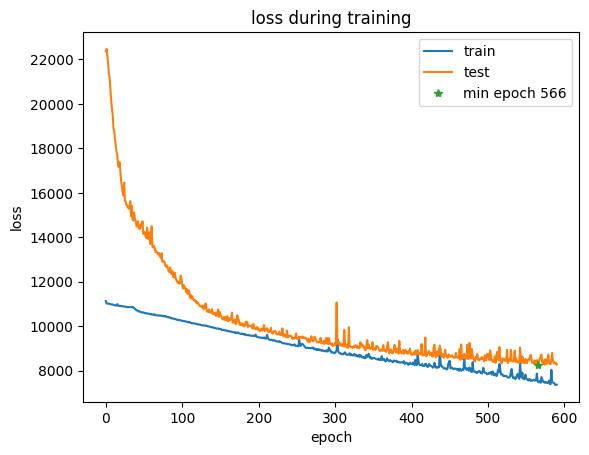

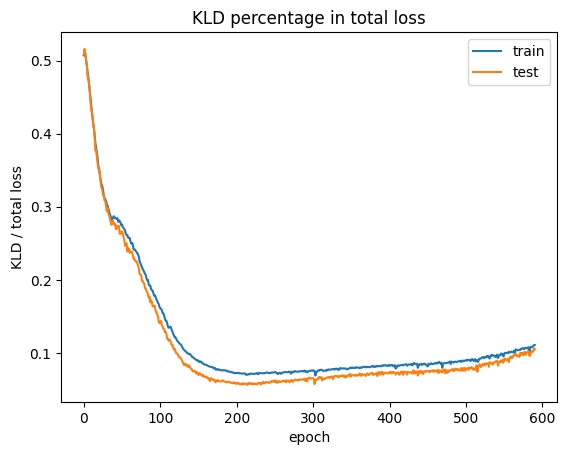

epoch 591: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7386.690, BCE: 6845.711, KLD: 856.566, KLD/(KLD+BCE): 11.121% beta:0.15
[valid] loss: 8218.754, BCE: 7359.288, KLD: 859.466, KLD/loss: 10.457%
model save at:  model_files_beta/ckpt_591.pt
remove  model_files_beta/ckpt_464.pt


epoch 592: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7357.022, BCE: 6827.619, KLD: 844.663, KLD/(KLD+BCE): 11.009% beta:0.16
[valid] loss: 8424.746, BCE: 7568.411, KLD: 856.335, KLD/loss: 10.165%


epoch 593: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7436.276, BCE: 6908.065, KLD: 844.995, KLD/(KLD+BCE): 10.899% beta:0.16
[valid] loss: 8415.828, BCE: 7560.919, KLD: 854.909, KLD/loss: 10.158%


epoch 594: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7397.564, BCE: 6868.421, KLD: 844.103, KLD/(KLD+BCE): 10.945% beta:0.17
[valid] loss: 8340.628, BCE: 7468.809, KLD: 871.819, KLD/loss: 10.453%


epoch 595: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7420.294, BCE: 6894.156, KLD: 849.150, KLD/(KLD+BCE): 10.966% beta:0.18
[valid] loss: 8766.986, BCE: 7886.410, KLD: 880.576, KLD/loss: 10.044%


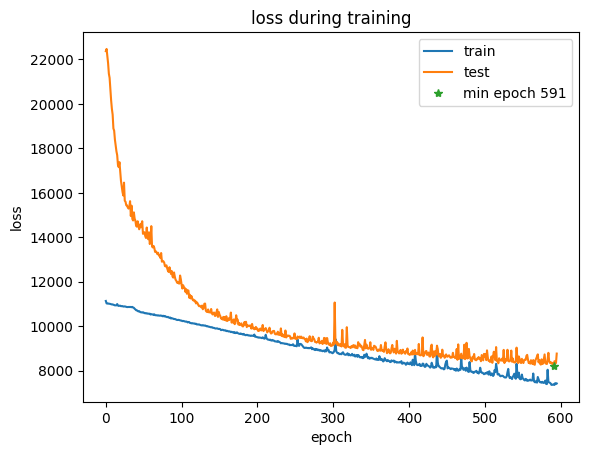

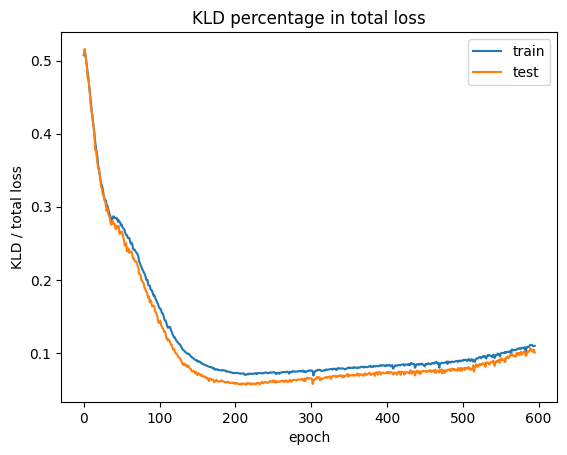

epoch 596: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 7435.384, BCE: 6903.404, KLD: 852.677, KLD/(KLD+BCE): 10.994% beta:0.18
[valid] loss: 8640.269, BCE: 7768.759, KLD: 871.510, KLD/loss: 10.087%


epoch 597: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7571.574, BCE: 7038.328, KLD: 854.961, KLD/(KLD+BCE): 10.831% beta:0.19
[valid] loss: 8485.208, BCE: 7597.172, KLD: 888.036, KLD/loss: 10.466%


epoch 598: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7350.259, BCE: 6818.035, KLD: 856.333, KLD/(KLD+BCE): 11.158% beta:0.20
[valid] loss: 8247.430, BCE: 7367.571, KLD: 879.859, KLD/loss: 10.668%


epoch 599: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7339.786, BCE: 6807.283, KLD: 856.701, KLD/(KLD+BCE): 11.178% beta:0.20
[valid] loss: 8299.886, BCE: 7427.215, KLD: 872.671, KLD/loss: 10.514%


epoch 600: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7304.733, BCE: 6773.669, KLD: 851.366, KLD/(KLD+BCE): 11.165% beta:0.21
[valid] loss: 8334.696, BCE: 7465.027, KLD: 869.669, KLD/loss: 10.434%


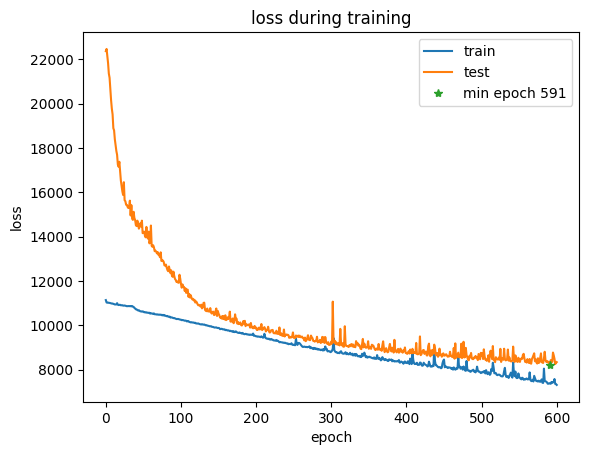

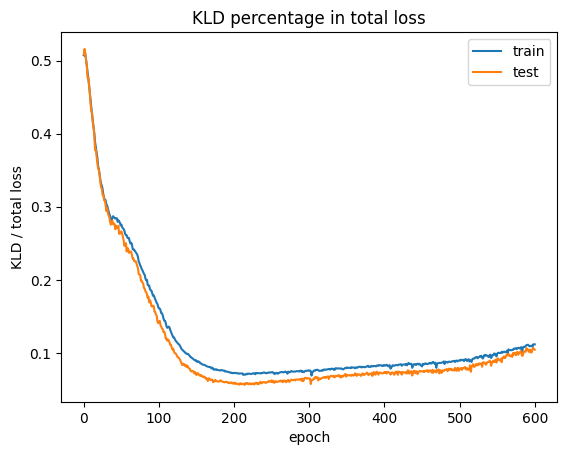

epoch 601: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7338.411, BCE: 6801.777, KLD: 859.277, KLD/(KLD+BCE): 11.216% beta:0.22
[valid] loss: 8367.902, BCE: 7484.453, KLD: 883.449, KLD/loss: 10.558%


epoch 602: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7323.476, BCE: 6793.445, KLD: 860.325, KLD/(KLD+BCE): 11.241% beta:0.23
[valid] loss: 8399.843, BCE: 7511.489, KLD: 888.354, KLD/loss: 10.576%


epoch 603: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7295.697, BCE: 6765.564, KLD: 858.148, KLD/(KLD+BCE): 11.256% beta:0.24
[valid] loss: 8283.054, BCE: 7398.433, KLD: 884.621, KLD/loss: 10.680%


epoch 604: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7237.162, BCE: 6706.212, KLD: 858.385, KLD/(KLD+BCE): 11.347% beta:0.25
[valid] loss: 8388.124, BCE: 7500.469, KLD: 887.655, KLD/loss: 10.582%


epoch 605: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7454.468, BCE: 6923.151, KLD: 858.041, KLD/(KLD+BCE): 11.027% beta:0.26
[valid] loss: 8361.957, BCE: 7482.155, KLD: 879.802, KLD/loss: 10.521%


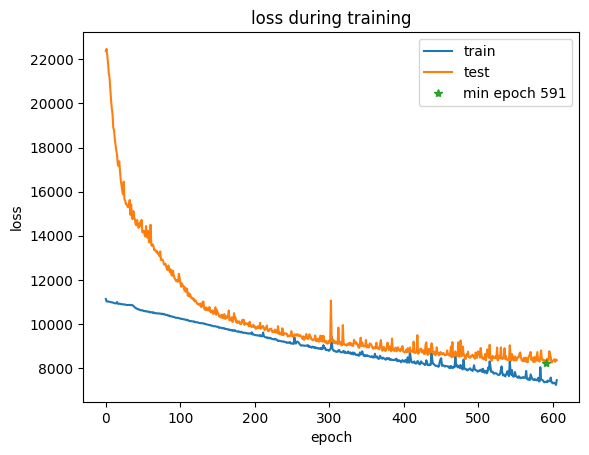

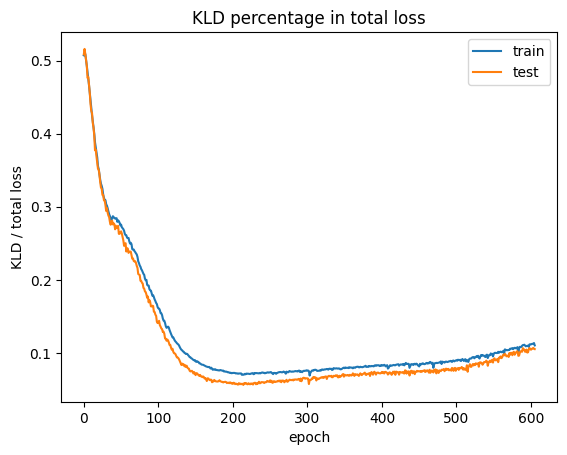

epoch 606: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7330.424, BCE: 6801.721, KLD: 860.286, KLD/(KLD+BCE): 11.228% beta:0.26
[valid] loss: 8440.530, BCE: 7561.363, KLD: 879.167, KLD/loss: 10.416%


epoch 607: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7335.226, BCE: 6798.587, KLD: 870.458, KLD/(KLD+BCE): 11.350% beta:0.27
[valid] loss: 8368.645, BCE: 7490.088, KLD: 878.557, KLD/loss: 10.498%


epoch 608: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7247.331, BCE: 6714.503, KLD: 867.605, KLD/(KLD+BCE): 11.443% beta:0.28
[valid] loss: 8327.942, BCE: 7428.443, KLD: 899.499, KLD/loss: 10.801%


epoch 609: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7319.881, BCE: 6781.168, KLD: 872.227, KLD/(KLD+BCE): 11.397% beta:0.29
[valid] loss: 8888.343, BCE: 7980.586, KLD: 907.757, KLD/loss: 10.213%


epoch 610: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7384.010, BCE: 6843.350, KLD: 876.079, KLD/(KLD+BCE): 11.349% beta:0.30
[valid] loss: 8573.102, BCE: 7683.360, KLD: 889.742, KLD/loss: 10.378%


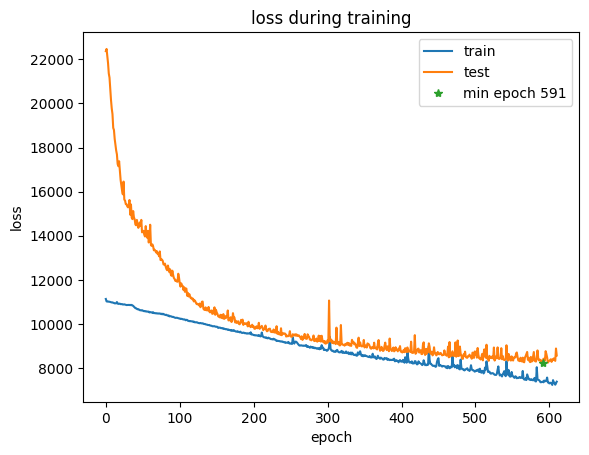

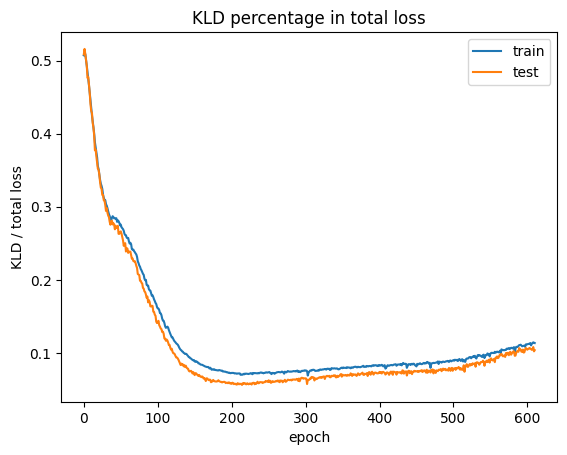

epoch 611: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7417.868, BCE: 6877.420, KLD: 876.975, KLD/(KLD+BCE): 11.309% beta:0.31
[valid] loss: 8260.218, BCE: 7365.092, KLD: 895.125, KLD/loss: 10.837%


epoch 612: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7315.811, BCE: 6772.977, KLD: 876.410, KLD/(KLD+BCE): 11.457% beta:0.32
[valid] loss: 8226.688, BCE: 7332.780, KLD: 893.908, KLD/loss: 10.866%


epoch 613: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7260.318, BCE: 6719.132, KLD: 886.411, KLD/(KLD+BCE): 11.655% beta:0.33
[valid] loss: 8432.395, BCE: 7497.935, KLD: 934.460, KLD/loss: 11.082%


epoch 614: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7245.431, BCE: 6704.509, KLD: 886.431, KLD/(KLD+BCE): 11.677% beta:0.35
[valid] loss: 8551.182, BCE: 7627.383, KLD: 923.799, KLD/loss: 10.803%


epoch 615: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7763.809, BCE: 7210.927, KLD: 902.946, KLD/(KLD+BCE): 11.128% beta:0.36
[valid] loss: 8374.401, BCE: 7467.018, KLD: 907.383, KLD/loss: 10.835%


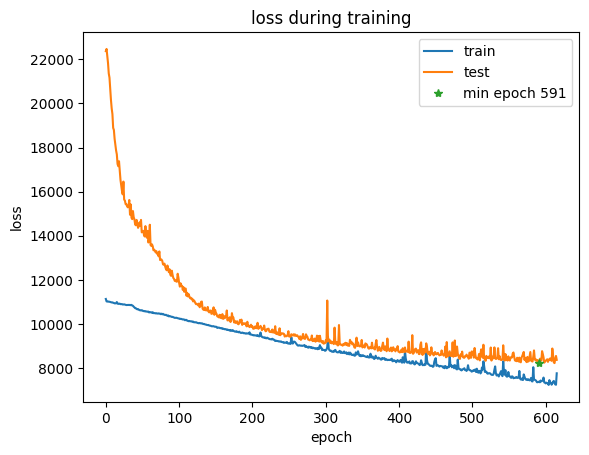

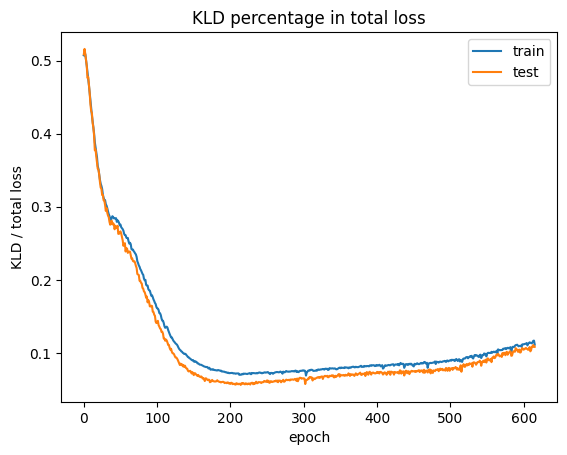

epoch 616: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7339.759, BCE: 6790.695, KLD: 897.530, KLD/(KLD+BCE): 11.674% beta:0.37
[valid] loss: 8243.540, BCE: 7328.924, KLD: 914.616, KLD/loss: 11.095%


epoch 617: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7238.934, BCE: 6698.980, KLD: 878.482, KLD/(KLD+BCE): 11.593% beta:0.38
[valid] loss: 8307.191, BCE: 7428.829, KLD: 878.362, KLD/loss: 10.574%


epoch 618: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7138.503, BCE: 6603.231, KLD: 870.964, KLD/(KLD+BCE): 11.653% beta:0.39
[valid] loss: 8247.218, BCE: 7354.968, KLD: 892.250, KLD/loss: 10.819%


epoch 619: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7184.585, BCE: 6649.365, KLD: 878.247, KLD/(KLD+BCE): 11.667% beta:0.40
[valid] loss: 8342.257, BCE: 7414.461, KLD: 927.796, KLD/loss: 11.122%


epoch 620: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7270.019, BCE: 6732.856, KLD: 885.566, KLD/(KLD+BCE): 11.624% beta:0.41
[valid] loss: 8332.716, BCE: 7411.367, KLD: 921.349, KLD/loss: 11.057%


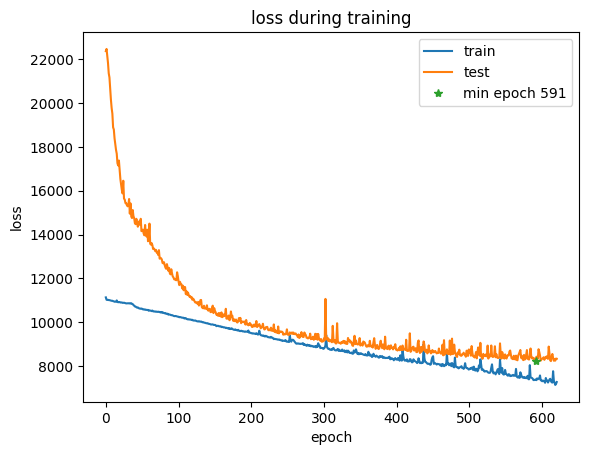

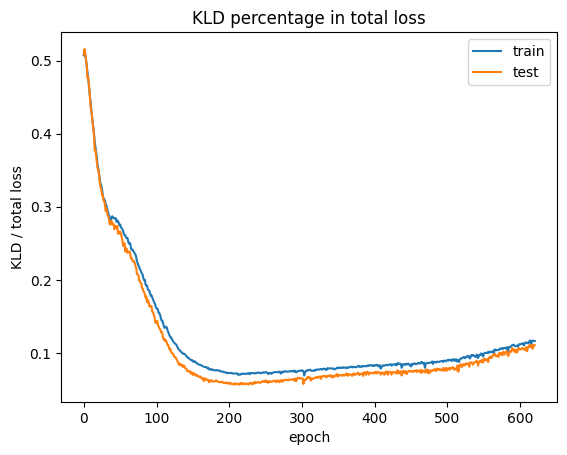

epoch 621: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7345.282, BCE: 6797.878, KLD: 891.525, KLD/(KLD+BCE): 11.594% beta:0.42
[valid] loss: 8574.166, BCE: 7675.472, KLD: 898.694, KLD/loss: 10.481%


epoch 622: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7214.690, BCE: 6682.772, KLD: 878.871, KLD/(KLD+BCE): 11.623% beta:0.44
[valid] loss: 8290.291, BCE: 7375.814, KLD: 914.477, KLD/loss: 11.031%


epoch 623: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7295.117, BCE: 6750.954, KLD: 891.336, KLD/(KLD+BCE): 11.663% beta:0.45
[valid] loss: 8394.272, BCE: 7485.987, KLD: 908.285, KLD/loss: 10.820%


epoch 624: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7407.752, BCE: 6859.736, KLD: 895.302, KLD/(KLD+BCE): 11.545% beta:0.46
[valid] loss: 8414.208, BCE: 7509.169, KLD: 905.039, KLD/loss: 10.756%


epoch 625: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7285.877, BCE: 6735.838, KLD: 893.525, KLD/(KLD+BCE): 11.712% beta:0.47
[valid] loss: 8215.591, BCE: 7299.576, KLD: 916.014, KLD/loss: 11.150%


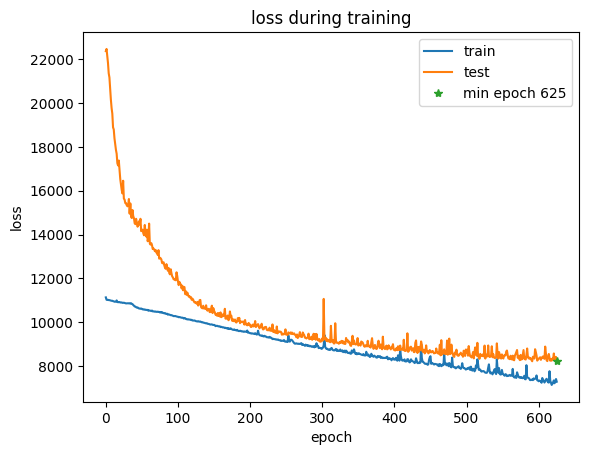

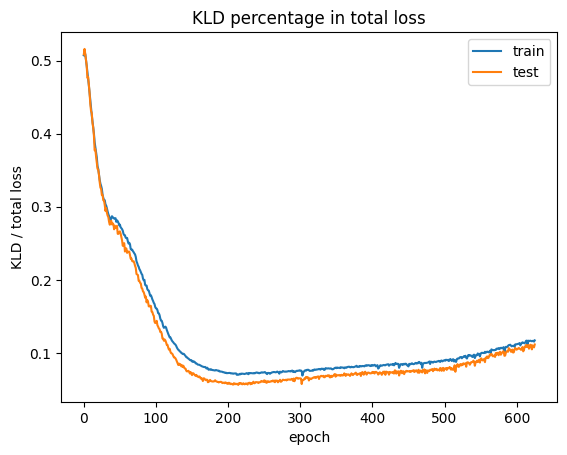

model save at:  model_files_beta/ckpt_625.pt
remove  model_files_beta/ckpt_482.pt


epoch 626: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7383.053, BCE: 6839.361, KLD: 889.758, KLD/(KLD+BCE): 11.512% beta:0.48
[valid] loss: 8272.351, BCE: 7348.340, KLD: 924.011, KLD/loss: 11.170%


epoch 627: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7240.313, BCE: 6693.408, KLD: 893.281, KLD/(KLD+BCE): 11.774% beta:0.50
[valid] loss: 8366.336, BCE: 7464.580, KLD: 901.757, KLD/loss: 10.778%


epoch 628: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7224.864, BCE: 6686.085, KLD: 883.379, KLD/(KLD+BCE): 11.670% beta:0.51
[valid] loss: 8290.820, BCE: 7390.160, KLD: 900.660, KLD/loss: 10.863%


epoch 629: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7157.166, BCE: 6615.296, KLD: 888.547, KLD/(KLD+BCE): 11.841% beta:0.52
[valid] loss: 8379.139, BCE: 7444.773, KLD: 934.366, KLD/loss: 11.151%


epoch 630: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7153.984, BCE: 6611.864, KLD: 899.508, KLD/(KLD+BCE): 11.975% beta:0.53
[valid] loss: 8299.504, BCE: 7361.495, KLD: 938.008, KLD/loss: 11.302%


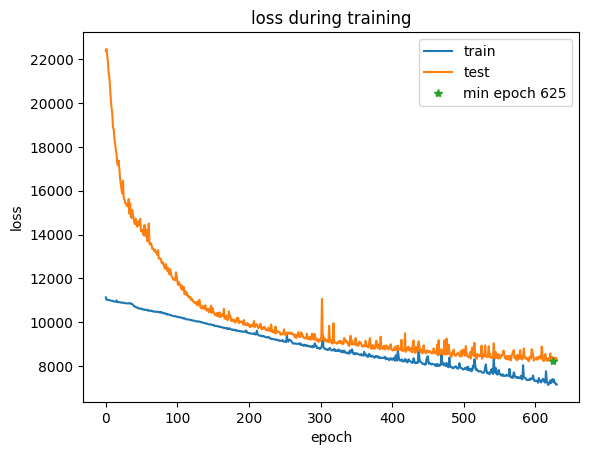

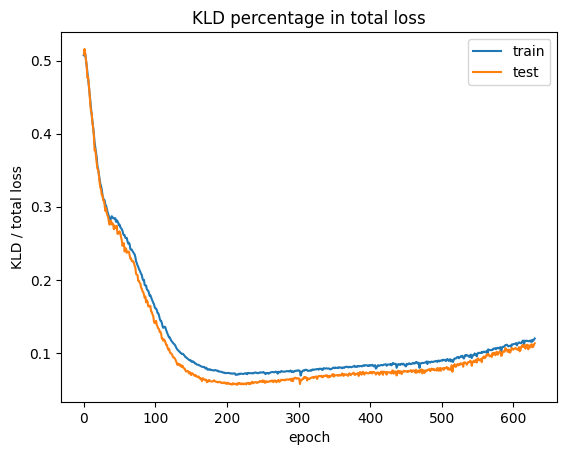

epoch 631: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7383.038, BCE: 6829.494, KLD: 910.831, KLD/(KLD+BCE): 11.767% beta:0.54
[valid] loss: 8288.407, BCE: 7382.401, KLD: 906.006, KLD/loss: 10.931%


epoch 632: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7326.103, BCE: 6779.687, KLD: 897.735, KLD/(KLD+BCE): 11.693% beta:0.56
[valid] loss: 8331.765, BCE: 7410.591, KLD: 921.173, KLD/loss: 11.056%


epoch 633: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7149.663, BCE: 6602.649, KLD: 899.502, KLD/(KLD+BCE): 11.990% beta:0.57
[valid] loss: 8229.009, BCE: 7314.182, KLD: 914.827, KLD/loss: 11.117%


epoch 634: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7137.856, BCE: 6594.640, KLD: 895.423, KLD/(KLD+BCE): 11.955% beta:0.58
[valid] loss: 8298.997, BCE: 7372.089, KLD: 926.908, KLD/loss: 11.169%


epoch 635: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7125.649, BCE: 6581.060, KLD: 891.949, KLD/(KLD+BCE): 11.936% beta:0.59
[valid] loss: 8194.815, BCE: 7287.150, KLD: 907.665, KLD/loss: 11.076%


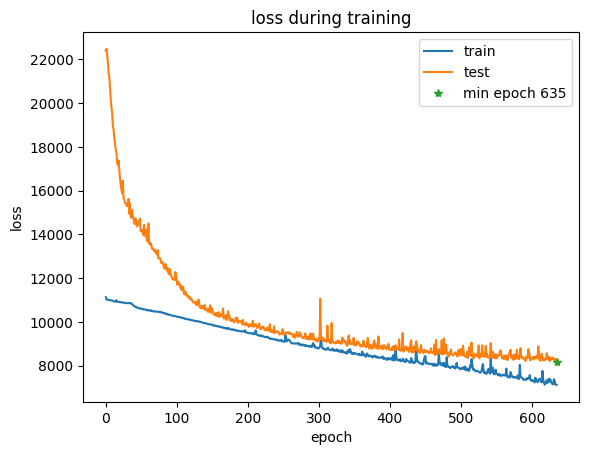

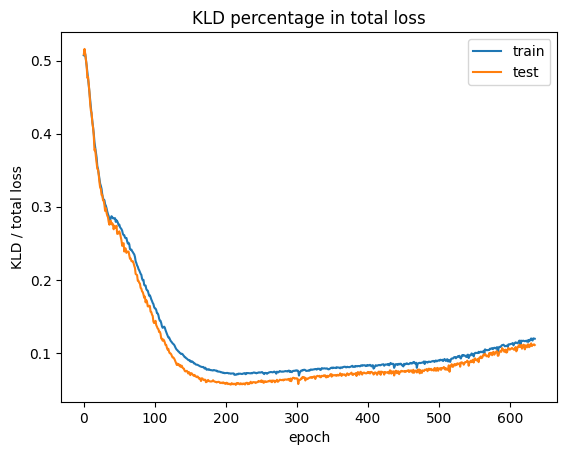

model save at:  model_files_beta/ckpt_635.pt
remove  model_files_beta/ckpt_483.pt


epoch 636: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7154.863, BCE: 6612.706, KLD: 889.387, KLD/(KLD+BCE): 11.855% beta:0.60
[valid] loss: 8263.156, BCE: 7354.985, KLD: 908.172, KLD/loss: 10.991%


epoch 637: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7580.190, BCE: 7036.301, KLD: 890.794, KLD/(KLD+BCE): 11.237% beta:0.61
[valid] loss: 8328.705, BCE: 7425.819, KLD: 902.885, KLD/loss: 10.841%


epoch 638: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7215.251, BCE: 6675.386, KLD: 887.564, KLD/(KLD+BCE): 11.736% beta:0.62
[valid] loss: 8293.471, BCE: 7379.058, KLD: 914.412, KLD/loss: 11.026%


epoch 639: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7131.257, BCE: 6581.199, KLD: 898.875, KLD/(KLD+BCE): 12.017% beta:0.64
[valid] loss: 8187.269, BCE: 7276.452, KLD: 910.817, KLD/loss: 11.125%
model save at:  model_files_beta/ckpt_639.pt
remove  model_files_beta/ckpt_507.pt


epoch 640: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7091.590, BCE: 6549.197, KLD: 894.131, KLD/(KLD+BCE): 12.013% beta:0.65
[valid] loss: 8239.785, BCE: 7311.056, KLD: 928.729, KLD/loss: 11.271%


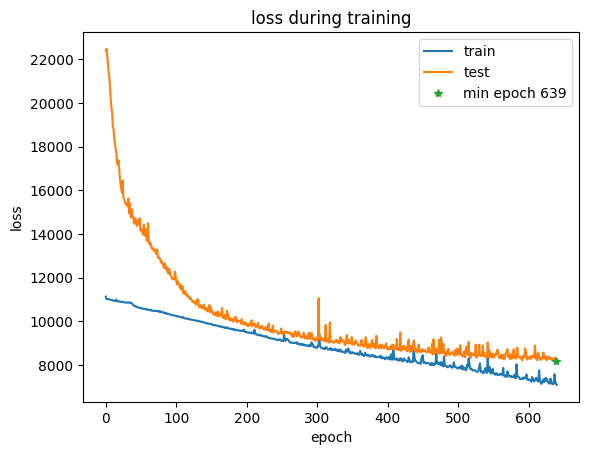

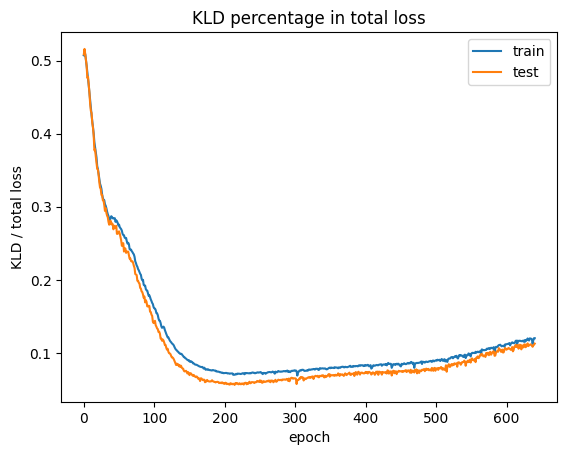

epoch 641: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7109.141, BCE: 6562.648, KLD: 895.593, KLD/(KLD+BCE): 12.008% beta:0.66
[valid] loss: 8202.023, BCE: 7281.416, KLD: 920.607, KLD/loss: 11.224%


epoch 642: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7124.575, BCE: 6572.757, KLD: 900.290, KLD/(KLD+BCE): 12.047% beta:0.67
[valid] loss: 8604.421, BCE: 7671.221, KLD: 933.199, KLD/loss: 10.846%


epoch 643: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7228.768, BCE: 6679.052, KLD: 906.442, KLD/(KLD+BCE): 11.950% beta:0.68
[valid] loss: 8232.338, BCE: 7307.569, KLD: 924.769, KLD/loss: 11.233%


epoch 644: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7229.975, BCE: 6679.461, KLD: 905.349, KLD/(KLD+BCE): 11.936% beta:0.69
[valid] loss: 8328.092, BCE: 7400.809, KLD: 927.283, KLD/loss: 11.134%


epoch 645: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7186.640, BCE: 6630.518, KLD: 907.493, KLD/(KLD+BCE): 12.039% beta:0.70
[valid] loss: 8244.354, BCE: 7311.606, KLD: 932.748, KLD/loss: 11.314%


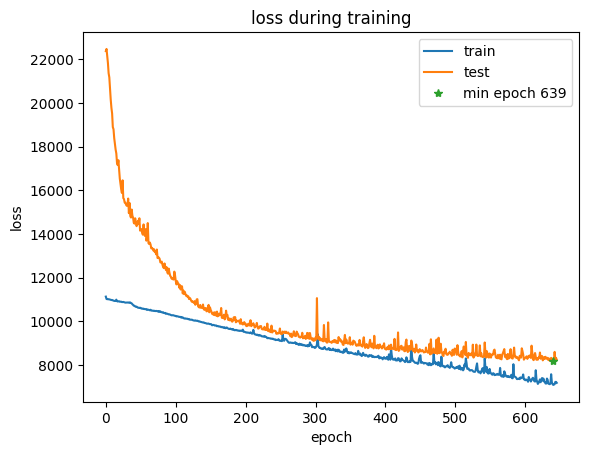

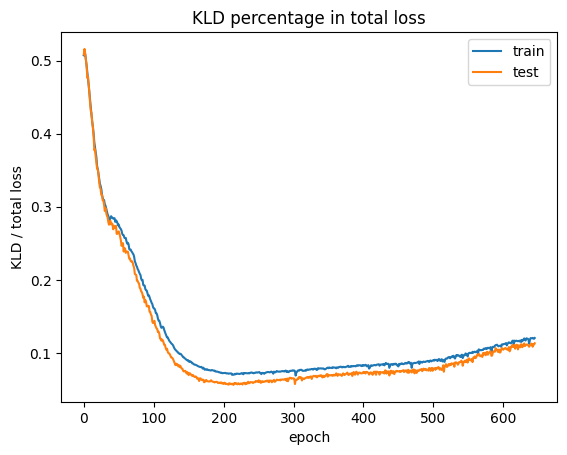

epoch 646: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7143.775, BCE: 6589.697, KLD: 910.162, KLD/(KLD+BCE): 12.136% beta:0.71
[valid] loss: 8341.371, BCE: 7408.440, KLD: 932.931, KLD/loss: 11.184%


epoch 647: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7099.064, BCE: 6551.093, KLD: 902.974, KLD/(KLD+BCE): 12.114% beta:0.72
[valid] loss: 8271.225, BCE: 7351.117, KLD: 920.108, KLD/loss: 11.124%


epoch 648: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7134.078, BCE: 6585.425, KLD: 903.260, KLD/(KLD+BCE): 12.062% beta:0.73
[valid] loss: 8386.457, BCE: 7454.635, KLD: 931.822, KLD/loss: 11.111%


epoch 649: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7120.669, BCE: 6565.358, KLD: 912.106, KLD/(KLD+BCE): 12.198% beta:0.74
[valid] loss: 8278.004, BCE: 7350.777, KLD: 927.227, KLD/loss: 11.201%


epoch 650: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7093.231, BCE: 6545.792, KLD: 898.129, KLD/(KLD+BCE): 12.065% beta:0.75
[valid] loss: 8243.015, BCE: 7314.312, KLD: 928.703, KLD/loss: 11.267%


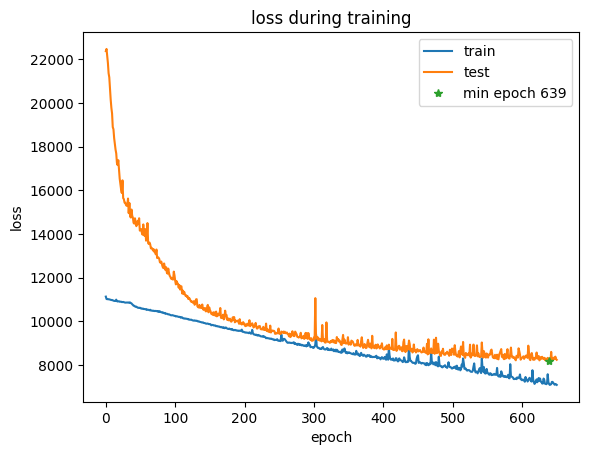

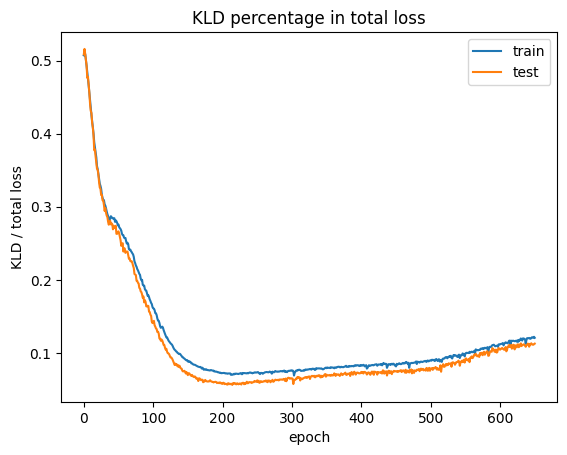

epoch 651: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7115.576, BCE: 6559.118, KLD: 906.889, KLD/(KLD+BCE): 12.147% beta:0.76
[valid] loss: 8230.946, BCE: 7312.032, KLD: 918.914, KLD/loss: 11.164%


epoch 652: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7122.728, BCE: 6572.266, KLD: 908.011, KLD/(KLD+BCE): 12.139% beta:0.76
[valid] loss: 8570.790, BCE: 7634.848, KLD: 935.942, KLD/loss: 10.920%


epoch 653: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7062.682, BCE: 6506.944, KLD: 910.731, KLD/(KLD+BCE): 12.278% beta:0.77
[valid] loss: 8191.471, BCE: 7261.657, KLD: 929.814, KLD/loss: 11.351%


epoch 654: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7295.711, BCE: 6736.321, KLD: 913.669, KLD/(KLD+BCE): 11.943% beta:0.78
[valid] loss: 8250.368, BCE: 7320.612, KLD: 929.756, KLD/loss: 11.269%


epoch 655: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7192.308, BCE: 6632.678, KLD: 913.119, KLD/(KLD+BCE): 12.101% beta:0.79
[valid] loss: 8428.184, BCE: 7509.639, KLD: 918.545, KLD/loss: 10.898%


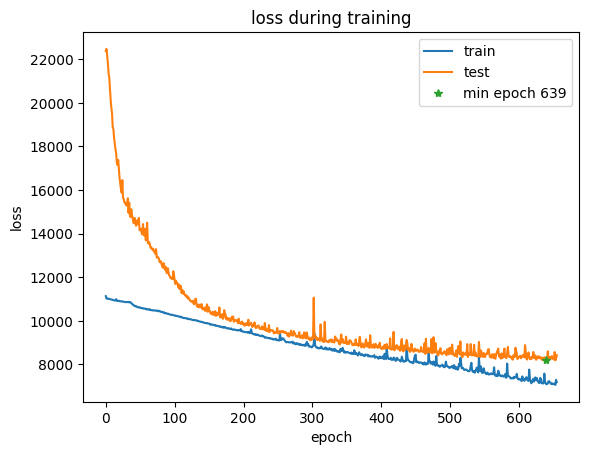

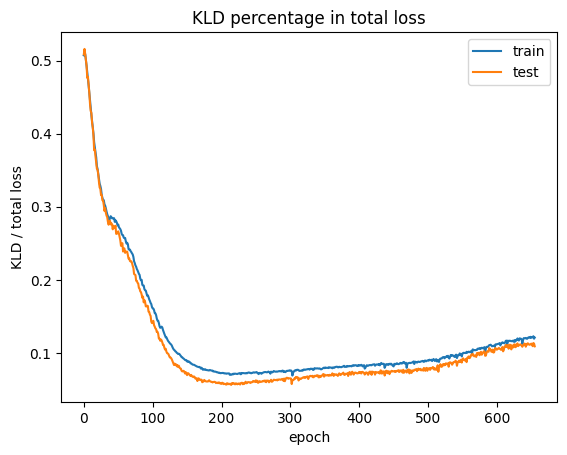

epoch 656: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7166.754, BCE: 6600.976, KLD: 917.084, KLD/(KLD+BCE): 12.198% beta:0.80
[valid] loss: 8296.877, BCE: 7370.317, KLD: 926.560, KLD/loss: 11.168%


epoch 657: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7055.212, BCE: 6504.377, KLD: 903.788, KLD/(KLD+BCE): 12.200% beta:0.80
[valid] loss: 8209.779, BCE: 7271.747, KLD: 938.032, KLD/loss: 11.426%


epoch 658: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7081.269, BCE: 6516.533, KLD: 918.958, KLD/(KLD+BCE): 12.359% beta:0.81
[valid] loss: 8192.456, BCE: 7259.529, KLD: 932.927, KLD/loss: 11.388%


epoch 659: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7290.890, BCE: 6733.570, KLD: 910.487, KLD/(KLD+BCE): 11.911% beta:0.82
[valid] loss: 8448.414, BCE: 7512.713, KLD: 935.701, KLD/loss: 11.075%


epoch 660: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7079.417, BCE: 6516.450, KLD: 918.444, KLD/(KLD+BCE): 12.353% beta:0.83
[valid] loss: 8124.360, BCE: 7194.754, KLD: 929.606, KLD/loss: 11.442%


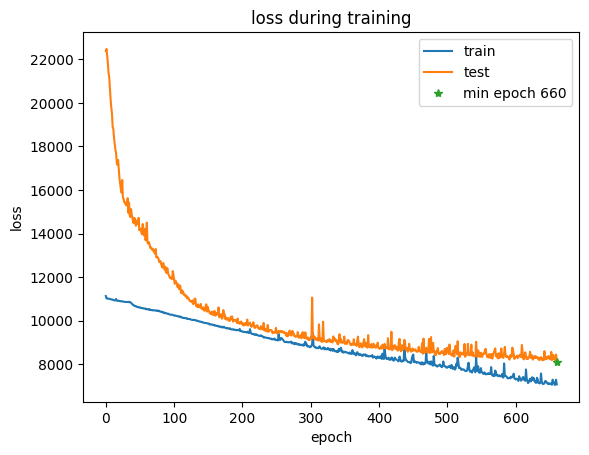

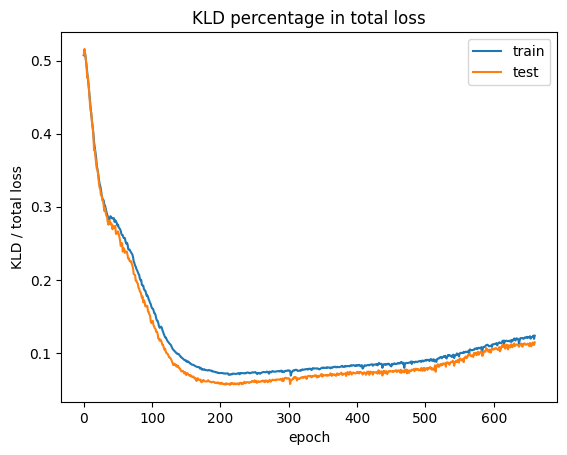

model save at:  model_files_beta/ckpt_660.pt
remove  model_files_beta/ckpt_510.pt


epoch 661: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7115.987, BCE: 6550.050, KLD: 920.015, KLD/(KLD+BCE): 12.316% beta:0.83
[valid] loss: 8282.384, BCE: 7361.251, KLD: 921.133, KLD/loss: 11.122%


epoch 662: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7019.394, BCE: 6457.767, KLD: 916.834, KLD/(KLD+BCE): 12.432% beta:0.84
[valid] loss: 8163.586, BCE: 7237.417, KLD: 926.170, KLD/loss: 11.345%


epoch 663: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7056.310, BCE: 6498.253, KLD: 907.682, KLD/(KLD+BCE): 12.256% beta:0.85
[valid] loss: 8193.814, BCE: 7278.820, KLD: 914.994, KLD/loss: 11.167%


epoch 664: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7032.131, BCE: 6468.856, KLD: 913.856, KLD/(KLD+BCE): 12.378% beta:0.85
[valid] loss: 8099.563, BCE: 7175.005, KLD: 924.558, KLD/loss: 11.415%
model save at:  model_files_beta/ckpt_664.pt
remove  model_files_beta/ckpt_518.pt


epoch 665: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7223.300, BCE: 6652.802, KLD: 924.125, KLD/(KLD+BCE): 12.197% beta:0.86
[valid] loss: 8381.064, BCE: 7448.572, KLD: 932.493, KLD/loss: 11.126%


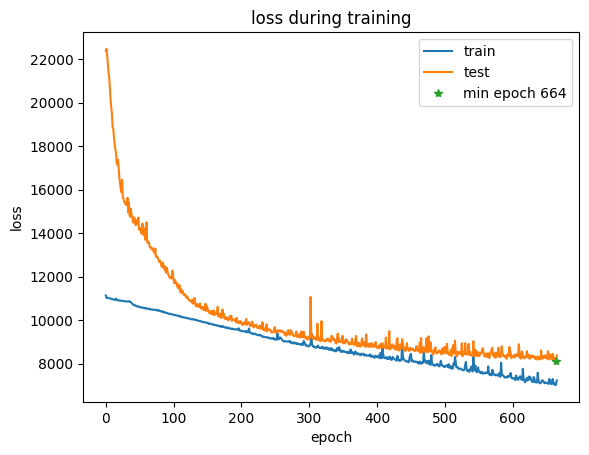

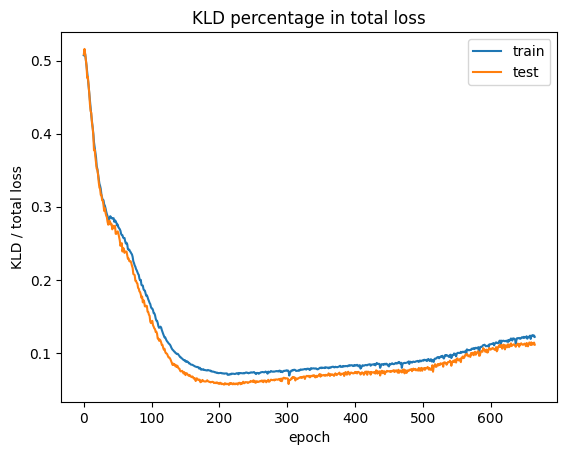

epoch 666: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7010.233, BCE: 6440.025, KLD: 928.387, KLD/(KLD+BCE): 12.600% beta:0.86
[valid] loss: 8200.977, BCE: 7272.788, KLD: 928.189, KLD/loss: 11.318%


epoch 667: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6995.920, BCE: 6429.221, KLD: 917.654, KLD/(KLD+BCE): 12.490% beta:0.87
[valid] loss: 8251.178, BCE: 7323.605, KLD: 927.572, KLD/loss: 11.242%


epoch 668: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7153.301, BCE: 6585.219, KLD: 917.348, KLD/(KLD+BCE): 12.227% beta:0.87
[valid] loss: 8278.415, BCE: 7356.942, KLD: 921.473, KLD/loss: 11.131%


epoch 669: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7052.392, BCE: 6486.832, KLD: 913.640, KLD/(KLD+BCE): 12.346% beta:0.88
[valid] loss: 8166.099, BCE: 7247.015, KLD: 919.084, KLD/loss: 11.255%


epoch 670: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7062.617, BCE: 6500.070, KLD: 914.159, KLD/(KLD+BCE): 12.330% beta:0.88
[valid] loss: 8223.003, BCE: 7303.277, KLD: 919.726, KLD/loss: 11.185%


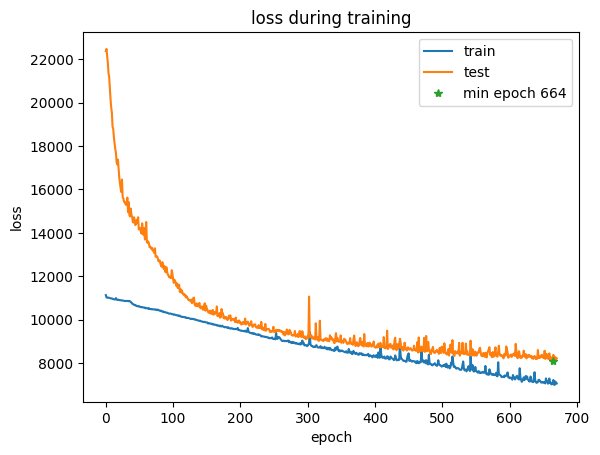

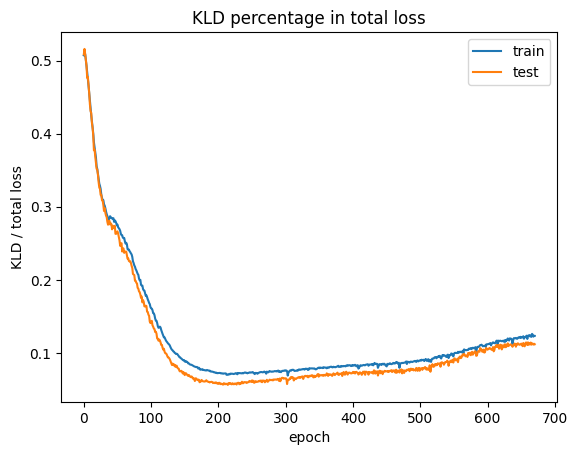

epoch 671: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6965.417, BCE: 6393.624, KLD: 921.167, KLD/(KLD+BCE): 12.593% beta:0.89
[valid] loss: 8101.238, BCE: 7168.950, KLD: 932.288, KLD/loss: 11.508%


epoch 672: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6988.363, BCE: 6420.690, KLD: 917.226, KLD/(KLD+BCE): 12.500% beta:0.89
[valid] loss: 8141.288, BCE: 7221.579, KLD: 919.709, KLD/loss: 11.297%


epoch 673: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7139.574, BCE: 6567.678, KLD: 923.239, KLD/(KLD+BCE): 12.325% beta:0.90
[valid] loss: 8778.836, BCE: 7824.030, KLD: 954.806, KLD/loss: 10.876%


epoch 674: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7090.478, BCE: 6511.595, KLD: 933.599, KLD/(KLD+BCE): 12.540% beta:0.90
[valid] loss: 8204.070, BCE: 7279.447, KLD: 924.623, KLD/loss: 11.270%


epoch 675: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7051.504, BCE: 6472.646, KLD: 925.853, KLD/(KLD+BCE): 12.514% beta:0.91
[valid] loss: 8072.726, BCE: 7140.343, KLD: 932.384, KLD/loss: 11.550%


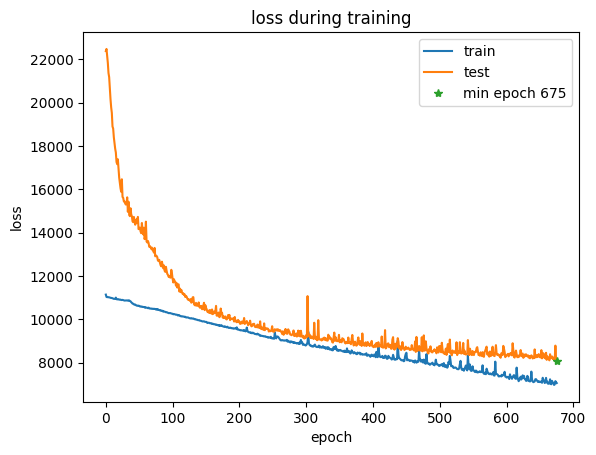

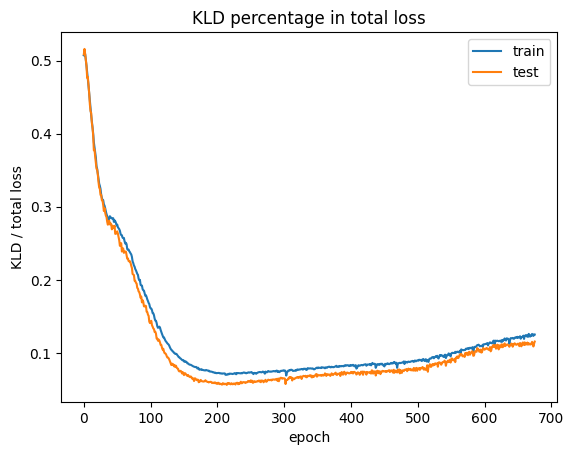

model save at:  model_files_beta/ckpt_675.pt
remove  model_files_beta/ckpt_560.pt


epoch 676: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6991.649, BCE: 6417.686, KLD: 921.003, KLD/(KLD+BCE): 12.550% beta:0.91
[valid] loss: 8387.660, BCE: 7470.511, KLD: 917.149, KLD/loss: 10.935%


epoch 677: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7088.822, BCE: 6511.491, KLD: 923.670, KLD/(KLD+BCE): 12.423% beta:0.91
[valid] loss: 8177.939, BCE: 7250.811, KLD: 927.128, KLD/loss: 11.337%


epoch 678: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6908.552, BCE: 6337.095, KLD: 916.676, KLD/(KLD+BCE): 12.637% beta:0.92
[valid] loss: 8133.335, BCE: 7224.351, KLD: 908.984, KLD/loss: 11.176%


epoch 679: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7044.150, BCE: 6470.067, KLD: 921.511, KLD/(KLD+BCE): 12.467% beta:0.92
[valid] loss: 8254.411, BCE: 7342.021, KLD: 912.390, KLD/loss: 11.053%


epoch 680: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7102.013, BCE: 6528.754, KLD: 923.375, KLD/(KLD+BCE): 12.391% beta:0.93
[valid] loss: 8222.654, BCE: 7293.769, KLD: 928.885, KLD/loss: 11.297%


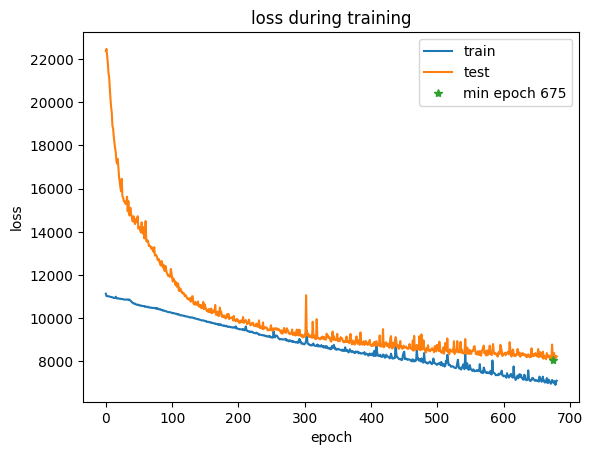

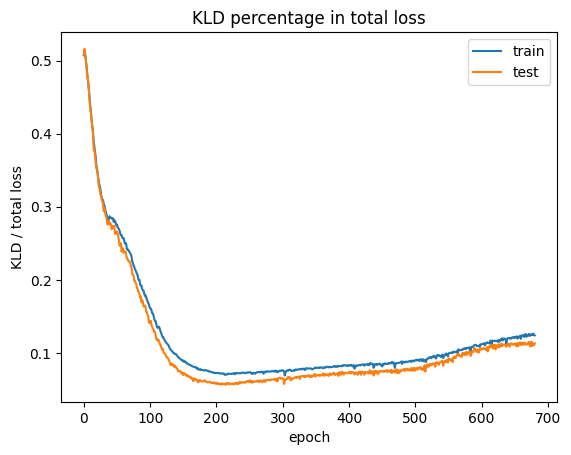

epoch 681: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7045.658, BCE: 6468.375, KLD: 928.195, KLD/(KLD+BCE): 12.549% beta:0.93
[valid] loss: 8137.008, BCE: 7206.840, KLD: 930.167, KLD/loss: 11.431%


epoch 682: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6943.118, BCE: 6370.145, KLD: 914.423, KLD/(KLD+BCE): 12.553% beta:0.93
[valid] loss: 8241.686, BCE: 7328.608, KLD: 913.078, KLD/loss: 11.079%


epoch 683: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7067.797, BCE: 6488.739, KLD: 925.801, KLD/(KLD+BCE): 12.486% beta:0.93
[valid] loss: 8624.475, BCE: 7676.893, KLD: 947.582, KLD/loss: 10.987%


epoch 684: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7258.016, BCE: 6674.742, KLD: 930.711, KLD/(KLD+BCE): 12.237% beta:0.94
[valid] loss: 8310.469, BCE: 7382.121, KLD: 928.348, KLD/loss: 11.171%


epoch 685: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7221.784, BCE: 6630.975, KLD: 938.148, KLD/(KLD+BCE): 12.394% beta:0.94
[valid] loss: 8227.085, BCE: 7280.174, KLD: 946.911, KLD/loss: 11.510%


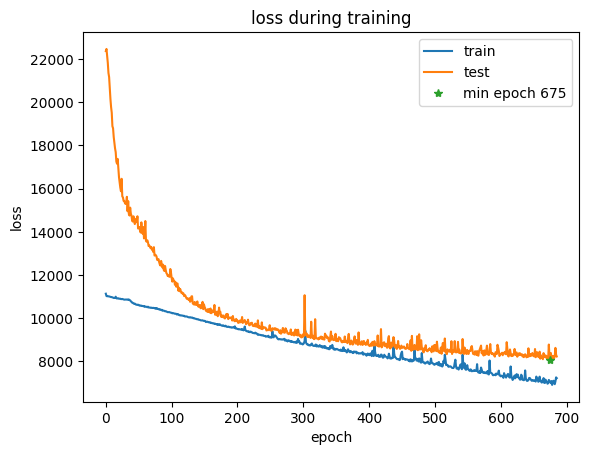

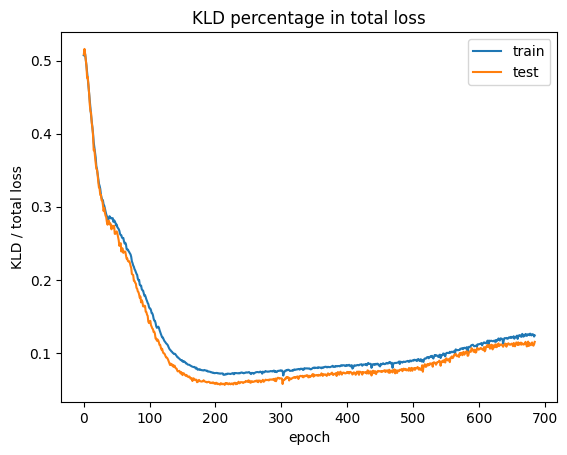

epoch 686: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7132.913, BCE: 6553.246, KLD: 924.902, KLD/(KLD+BCE): 12.368% beta:0.94
[valid] loss: 8316.253, BCE: 7411.970, KLD: 904.283, KLD/loss: 10.874%


epoch 687: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6951.831, BCE: 6370.076, KLD: 927.001, KLD/(KLD+BCE): 12.704% beta:0.95
[valid] loss: 8068.877, BCE: 7149.425, KLD: 919.452, KLD/loss: 11.395%
model save at:  model_files_beta/ckpt_687.pt
remove  model_files_beta/ckpt_563.pt


epoch 688: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7183.022, BCE: 6600.500, KLD: 924.412, KLD/(KLD+BCE): 12.285% beta:0.95
[valid] loss: 8047.244, BCE: 7124.559, KLD: 922.685, KLD/loss: 11.466%
model save at:  model_files_beta/ckpt_688.pt
remove  model_files_beta/ckpt_565.pt


epoch 689: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7205.759, BCE: 6621.159, KLD: 925.559, KLD/(KLD+BCE): 12.264% beta:0.95
[valid] loss: 8104.753, BCE: 7189.025, KLD: 915.727, KLD/loss: 11.299%


epoch 690: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6958.313, BCE: 6380.368, KLD: 919.098, KLD/(KLD+BCE): 12.591% beta:0.95
[valid] loss: 8086.267, BCE: 7163.223, KLD: 923.044, KLD/loss: 11.415%


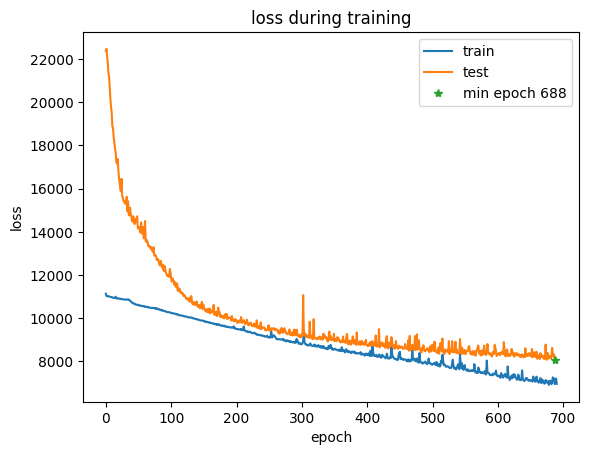

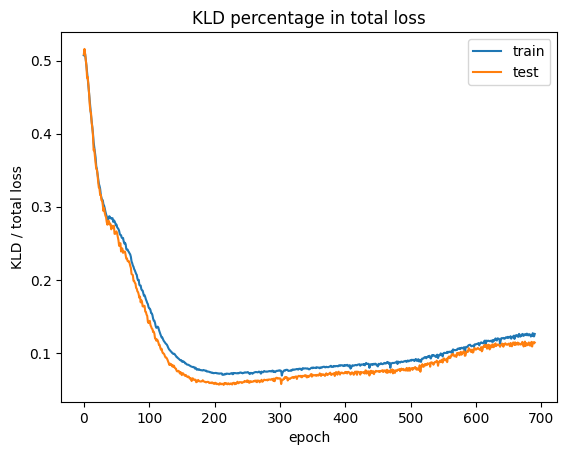

epoch 691: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6931.432, BCE: 6351.107, KLD: 922.873, KLD/(KLD+BCE): 12.687% beta:0.95
[valid] loss: 8000.750, BCE: 7086.595, KLD: 914.155, KLD/loss: 11.426%
model save at:  model_files_beta/ckpt_691.pt
remove  model_files_beta/ckpt_566.pt


epoch 692: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6883.909, BCE: 6302.929, KLD: 924.298, KLD/(KLD+BCE): 12.789% beta:0.96
[valid] loss: 8118.380, BCE: 7191.198, KLD: 927.182, KLD/loss: 11.421%


epoch 693: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7081.629, BCE: 6498.856, KLD: 923.372, KLD/(KLD+BCE): 12.441% beta:0.96
[valid] loss: 8215.679, BCE: 7311.352, KLD: 904.327, KLD/loss: 11.007%


epoch 694: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6946.883, BCE: 6370.808, KLD: 914.234, KLD/(KLD+BCE): 12.549% beta:0.96
[valid] loss: 8161.013, BCE: 7260.616, KLD: 900.397, KLD/loss: 11.033%


epoch 695: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7041.135, BCE: 6461.287, KLD: 915.585, KLD/(KLD+BCE): 12.412% beta:0.96
[valid] loss: 8156.126, BCE: 7251.992, KLD: 904.133, KLD/loss: 11.085%


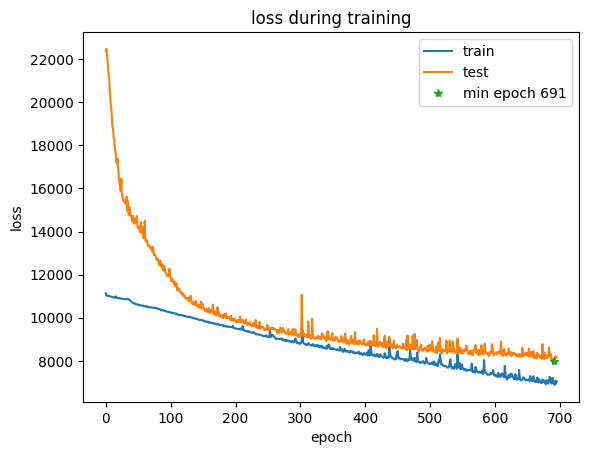

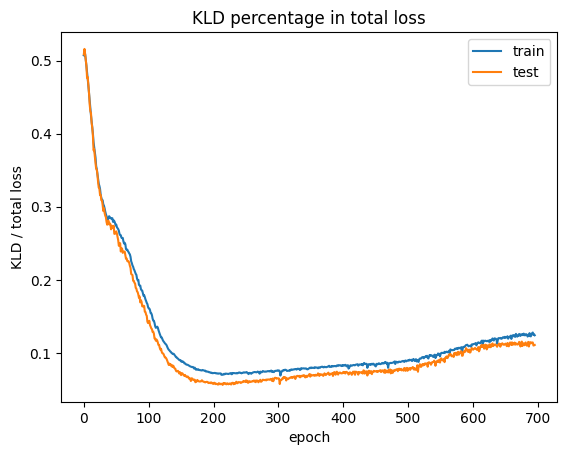

epoch 696: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6928.476, BCE: 6352.183, KLD: 910.482, KLD/(KLD+BCE): 12.536% beta:0.96
[valid] loss: 8264.470, BCE: 7376.035, KLD: 888.436, KLD/loss: 10.750%


epoch 697: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6865.344, BCE: 6290.720, KLD: 914.241, KLD/(KLD+BCE): 12.689% beta:0.97
[valid] loss: 8120.451, BCE: 7203.602, KLD: 916.849, KLD/loss: 11.291%


epoch 698: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7013.316, BCE: 6425.621, KLD: 930.164, KLD/(KLD+BCE): 12.645% beta:0.97
[valid] loss: 8252.191, BCE: 7330.911, KLD: 921.280, KLD/loss: 11.164%


epoch 699: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7082.073, BCE: 6492.007, KLD: 931.860, KLD/(KLD+BCE): 12.552% beta:0.97
[valid] loss: 8132.234, BCE: 7202.460, KLD: 929.774, KLD/loss: 11.433%


epoch 700: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6966.670, BCE: 6377.926, KLD: 929.288, KLD/(KLD+BCE): 12.717% beta:0.97
[valid] loss: 8608.789, BCE: 7703.731, KLD: 905.058, KLD/loss: 10.513%


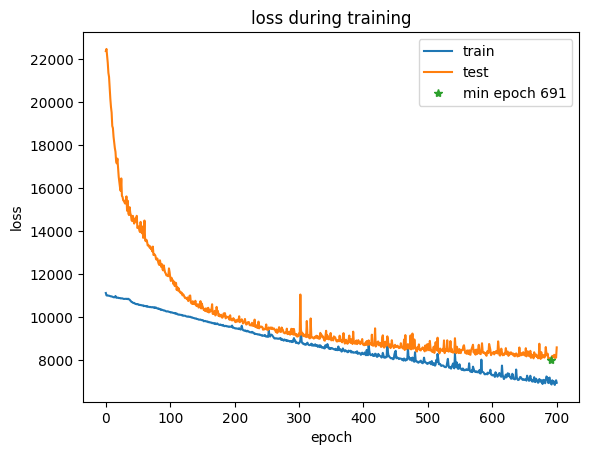

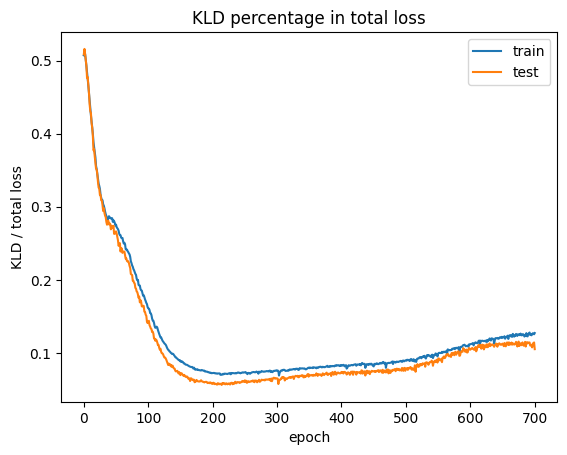

epoch 701: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6921.487, BCE: 6330.878, KLD: 927.456, KLD/(KLD+BCE): 12.778% beta:0.97
[valid] loss: 8118.298, BCE: 7195.139, KLD: 923.159, KLD/loss: 11.371%


epoch 702: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6886.086, BCE: 6295.738, KLD: 930.656, KLD/(KLD+BCE): 12.879% beta:0.97
[valid] loss: 8071.037, BCE: 7151.230, KLD: 919.807, KLD/loss: 11.396%


epoch 703: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7174.514, BCE: 6576.205, KLD: 937.599, KLD/(KLD+BCE): 12.478% beta:0.97
[valid] loss: 8114.393, BCE: 7205.620, KLD: 908.774, KLD/loss: 11.200%


epoch 704: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7182.607, BCE: 6591.299, KLD: 931.193, KLD/(KLD+BCE): 12.379% beta:0.98
[valid] loss: 8590.890, BCE: 7662.459, KLD: 928.431, KLD/loss: 10.807%


epoch 705: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7141.961, BCE: 6551.940, KLD: 931.335, KLD/(KLD+BCE): 12.446% beta:0.98
[valid] loss: 8070.074, BCE: 7154.514, KLD: 915.561, KLD/loss: 11.345%


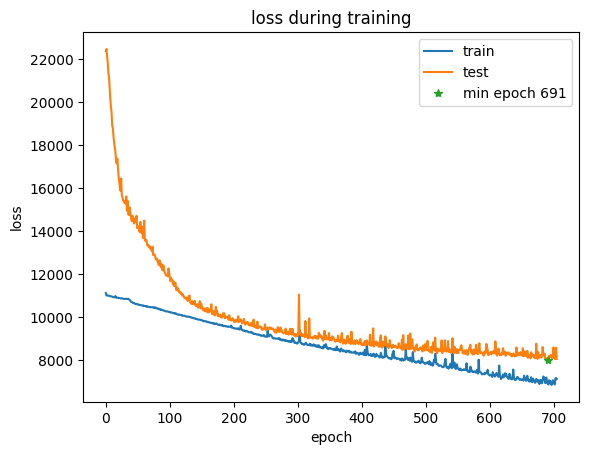

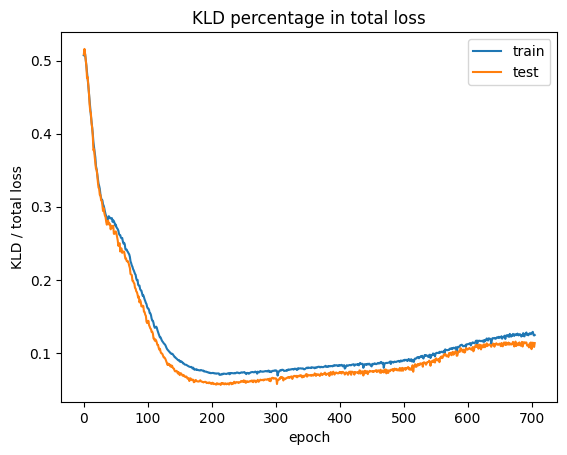

epoch 706: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6921.558, BCE: 6329.361, KLD: 930.466, KLD/(KLD+BCE): 12.817% beta:0.98
[valid] loss: 8110.004, BCE: 7180.138, KLD: 929.866, KLD/loss: 11.466%


epoch 707: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6887.981, BCE: 6290.414, KLD: 934.452, KLD/(KLD+BCE): 12.934% beta:0.98
[valid] loss: 8005.034, BCE: 7087.592, KLD: 917.442, KLD/loss: 11.461%


epoch 708: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 6921.653, BCE: 6327.958, KLD: 931.573, KLD/(KLD+BCE): 12.832% beta:0.98
[valid] loss: 8102.688, BCE: 7179.322, KLD: 923.365, KLD/loss: 11.396%


epoch 709: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8127.665, BCE: 7510.014, KLD: 950.366, KLD/(KLD+BCE): 11.233% beta:0.98
[valid] loss: 8372.792, BCE: 7462.980, KLD: 909.812, KLD/loss: 10.866%


epoch 710: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7130.289, BCE: 6539.080, KLD: 922.944, KLD/(KLD+BCE): 12.369% beta:0.98
[valid] loss: 8311.259, BCE: 7397.788, KLD: 913.471, KLD/loss: 10.991%


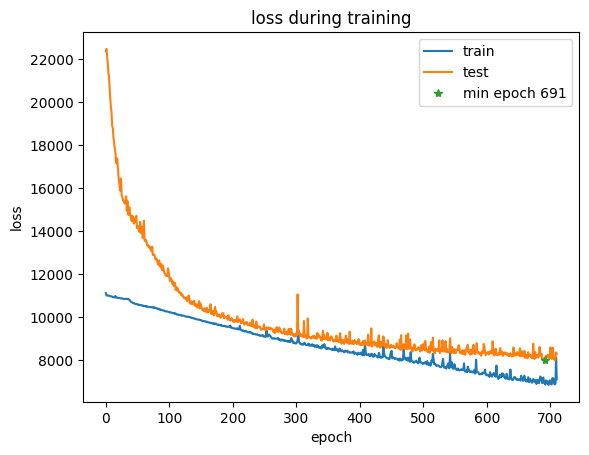

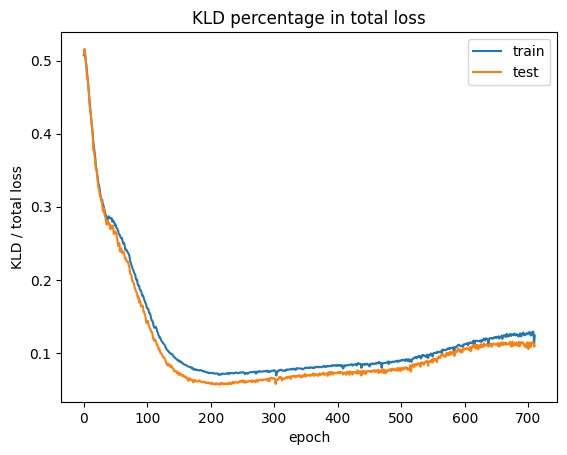

epoch 711: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7019.082, BCE: 6429.150, KLD: 918.146, KLD/(KLD+BCE): 12.496% beta:0.98
[valid] loss: 8332.945, BCE: 7433.527, KLD: 899.419, KLD/loss: 10.794%


epoch 712: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7250.422, BCE: 6653.285, KLD: 933.729, KLD/(KLD+BCE): 12.307% beta:0.98
[valid] loss: 9039.403, BCE: 8132.979, KLD: 906.425, KLD/loss: 10.027%


epoch 713: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7118.448, BCE: 6514.525, KLD: 938.998, KLD/(KLD+BCE): 12.598% beta:0.98
[valid] loss: 8072.614, BCE: 7154.493, KLD: 918.121, KLD/loss: 11.373%


epoch 714: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6981.585, BCE: 6384.448, KLD: 928.472, KLD/(KLD+BCE): 12.696% beta:0.98
[valid] loss: 8043.522, BCE: 7138.422, KLD: 905.100, KLD/loss: 11.253%


epoch 715: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6987.924, BCE: 6382.685, KLD: 934.801, KLD/(KLD+BCE): 12.775% beta:0.99
[valid] loss: 8132.983, BCE: 7211.264, KLD: 921.719, KLD/loss: 11.333%


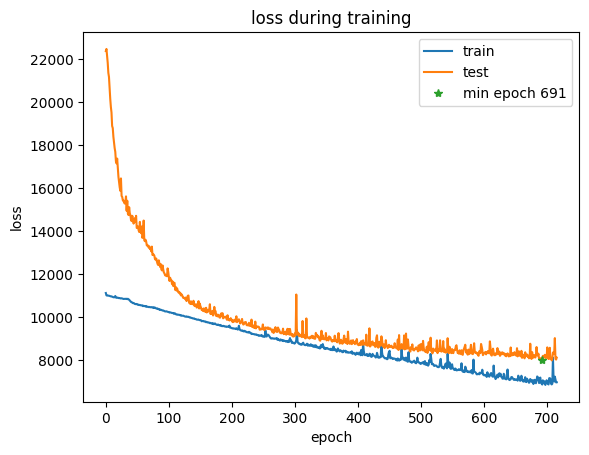

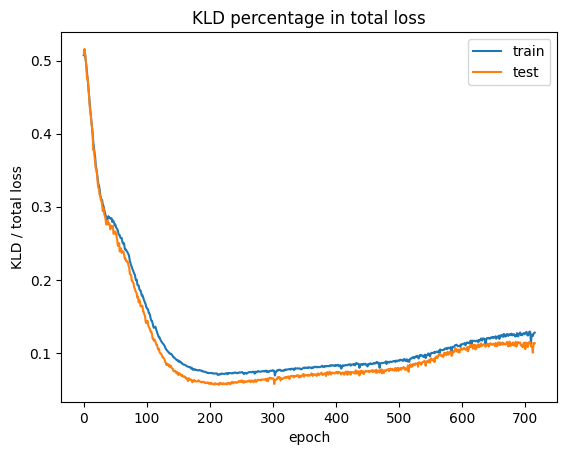

epoch 716: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6786.960, BCE: 6189.122, KLD: 931.181, KLD/(KLD+BCE): 13.078% beta:0.99
[valid] loss: 8160.263, BCE: 7249.018, KLD: 911.245, KLD/loss: 11.167%


epoch 717: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6770.000, BCE: 6172.126, KLD: 930.600, KLD/(KLD+BCE): 13.102% beta:0.99
[valid] loss: 8237.367, BCE: 7332.882, KLD: 904.485, KLD/loss: 10.980%


epoch 718: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6840.888, BCE: 6240.953, KLD: 930.715, KLD/(KLD+BCE): 12.978% beta:0.99
[valid] loss: 8226.222, BCE: 7321.602, KLD: 904.621, KLD/loss: 10.997%


epoch 719: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6941.075, BCE: 6349.308, KLD: 925.086, KLD/(KLD+BCE): 12.717% beta:0.99
[valid] loss: 8038.958, BCE: 7143.132, KLD: 895.826, KLD/loss: 11.144%


epoch 720: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6849.575, BCE: 6249.276, KLD: 930.847, KLD/(KLD+BCE): 12.964% beta:0.99
[valid] loss: 8072.093, BCE: 7167.861, KLD: 904.232, KLD/loss: 11.202%


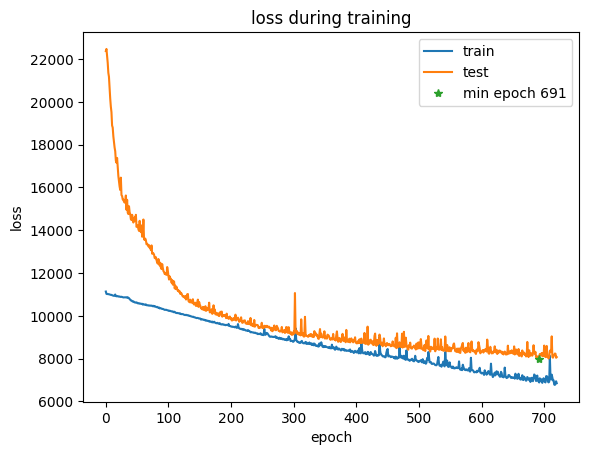

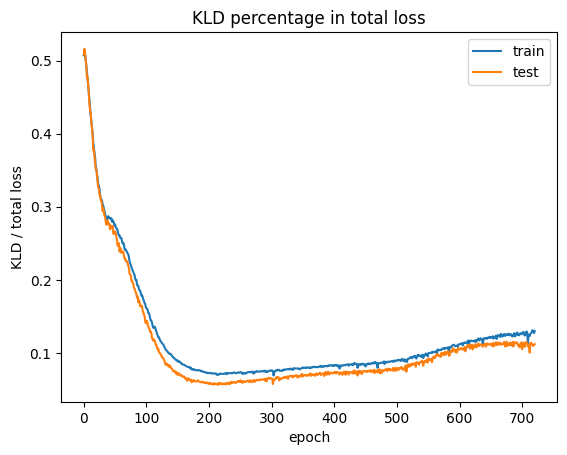

epoch 721: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6815.307, BCE: 6216.671, KLD: 928.160, KLD/(KLD+BCE): 12.991% beta:0.99
[valid] loss: 8157.883, BCE: 7236.866, KLD: 921.017, KLD/loss: 11.290%


epoch 722: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6832.733, BCE: 6233.949, KLD: 926.419, KLD/(KLD+BCE): 12.938% beta:0.99
[valid] loss: 8115.454, BCE: 7194.830, KLD: 920.624, KLD/loss: 11.344%


epoch 723: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6898.222, BCE: 6292.094, KLD: 936.117, KLD/(KLD+BCE): 12.951% beta:0.99
[valid] loss: 8109.246, BCE: 7185.640, KLD: 923.606, KLD/loss: 11.390%


epoch 724: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6773.392, BCE: 6181.470, KLD: 920.014, KLD/(KLD+BCE): 12.955% beta:0.99
[valid] loss: 8080.867, BCE: 7191.558, KLD: 889.309, KLD/loss: 11.005%


epoch 725: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6732.706, BCE: 6140.642, KLD: 913.339, KLD/(KLD+BCE): 12.948% beta:0.99
[valid] loss: 7965.006, BCE: 7079.951, KLD: 885.055, KLD/loss: 11.112%


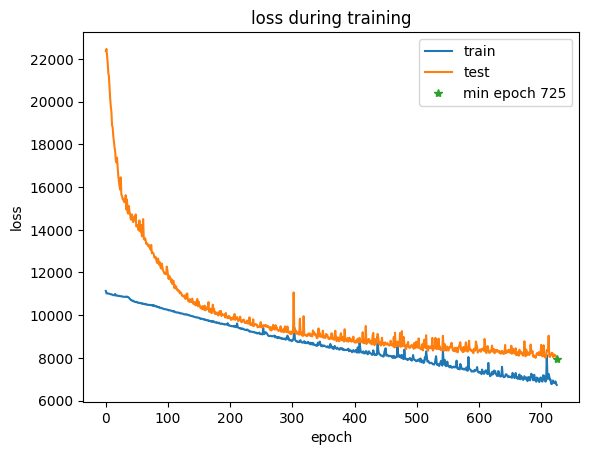

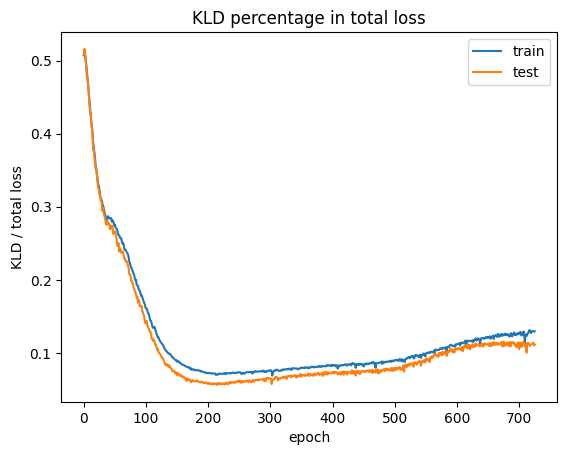

model save at:  model_files_beta/ckpt_725.pt
remove  model_files_beta/ckpt_591.pt


epoch 726: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6833.051, BCE: 6238.850, KLD: 916.565, KLD/(KLD+BCE): 12.809% beta:0.99
[valid] loss: 8041.885, BCE: 7138.771, KLD: 903.114, KLD/loss: 11.230%


epoch 727: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7084.387, BCE: 6487.066, KLD: 922.159, KLD/(KLD+BCE): 12.446% beta:0.99
[valid] loss: 8350.693, BCE: 7432.499, KLD: 918.194, KLD/loss: 10.995%


epoch 728: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6882.589, BCE: 6286.897, KLD: 920.041, KLD/(KLD+BCE): 12.766% beta:0.99
[valid] loss: 8199.918, BCE: 7292.201, KLD: 907.717, KLD/loss: 11.070%


epoch 729: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6847.863, BCE: 6241.948, KLD: 931.287, KLD/(KLD+BCE): 12.983% beta:0.99
[valid] loss: 7984.935, BCE: 7074.288, KLD: 910.646, KLD/loss: 11.405%


epoch 730: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6885.586, BCE: 6278.025, KLD: 930.400, KLD/(KLD+BCE): 12.907% beta:0.99
[valid] loss: 8179.162, BCE: 7268.873, KLD: 910.289, KLD/loss: 11.129%


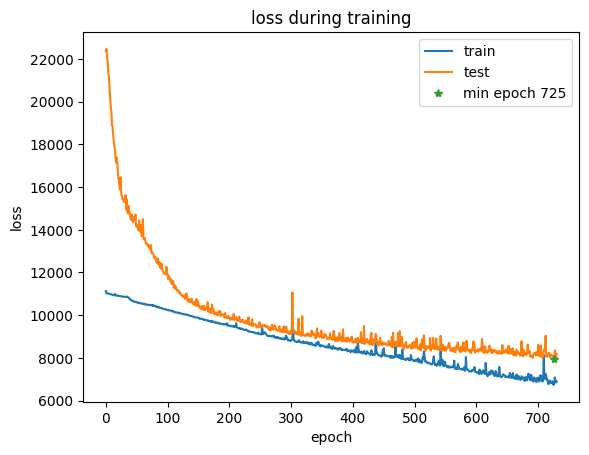

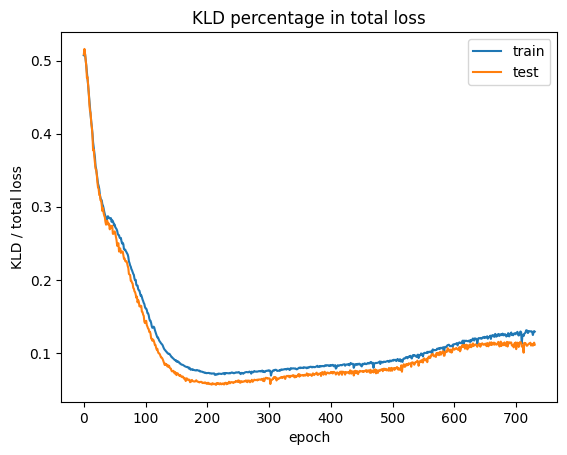

epoch 731: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7384.703, BCE: 6786.684, KLD: 923.381, KLD/(KLD+BCE): 11.976% beta:0.99
[valid] loss: 8468.804, BCE: 7569.410, KLD: 899.394, KLD/loss: 10.620%


epoch 732: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6955.164, BCE: 6352.263, KLD: 926.398, KLD/(KLD+BCE): 12.728% beta:0.99
[valid] loss: 8334.467, BCE: 7440.189, KLD: 894.278, KLD/loss: 10.730%


epoch 733: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7003.265, BCE: 6398.278, KLD: 924.318, KLD/(KLD+BCE): 12.623% beta:0.99
[valid] loss: 8052.120, BCE: 7156.184, KLD: 895.935, KLD/loss: 11.127%


epoch 734: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6840.618, BCE: 6235.102, KLD: 924.423, KLD/(KLD+BCE): 12.912% beta:0.99
[valid] loss: 8075.266, BCE: 7178.361, KLD: 896.905, KLD/loss: 11.107%


epoch 735: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6835.201, BCE: 6234.412, KLD: 923.204, KLD/(KLD+BCE): 12.898% beta:0.99
[valid] loss: 9032.902, BCE: 8116.361, KLD: 916.541, KLD/loss: 10.147%


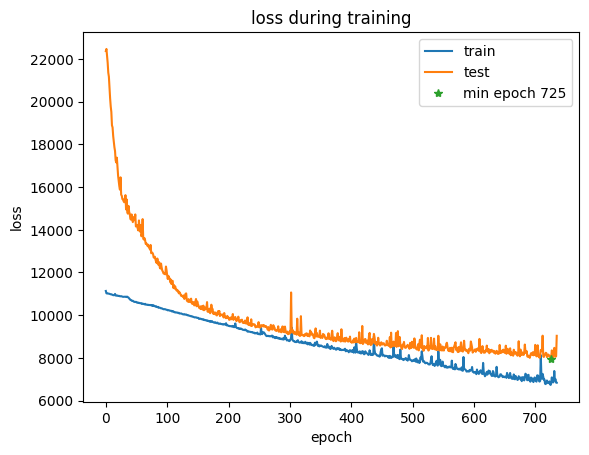

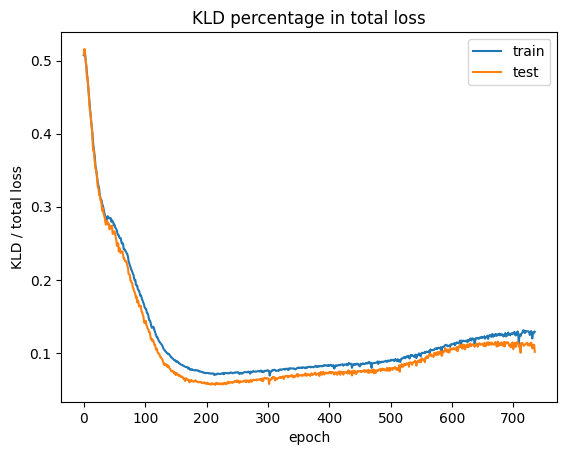

epoch 736: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7121.741, BCE: 6516.982, KLD: 933.367, KLD/(KLD+BCE): 12.528% beta:0.99
[valid] loss: 8100.697, BCE: 7178.121, KLD: 922.576, KLD/loss: 11.389%


epoch 737: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6760.276, BCE: 6145.478, KLD: 938.563, KLD/(KLD+BCE): 13.249% beta:0.99
[valid] loss: 7952.431, BCE: 7047.350, KLD: 905.081, KLD/loss: 11.381%
model save at:  model_files_beta/ckpt_737.pt
remove  model_files_beta/ckpt_625.pt


epoch 738: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6797.517, BCE: 6185.265, KLD: 933.983, KLD/(KLD+BCE): 13.119% beta:0.99
[valid] loss: 8066.021, BCE: 7145.064, KLD: 920.956, KLD/loss: 11.418%


epoch 739: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6777.275, BCE: 6168.055, KLD: 935.485, KLD/(KLD+BCE): 13.169% beta:1.00
[valid] loss: 7957.348, BCE: 7060.748, KLD: 896.600, KLD/loss: 11.268%


epoch 740: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6869.688, BCE: 6257.632, KLD: 934.247, KLD/(KLD+BCE): 12.990% beta:1.00
[valid] loss: 7980.427, BCE: 7074.575, KLD: 905.852, KLD/loss: 11.351%


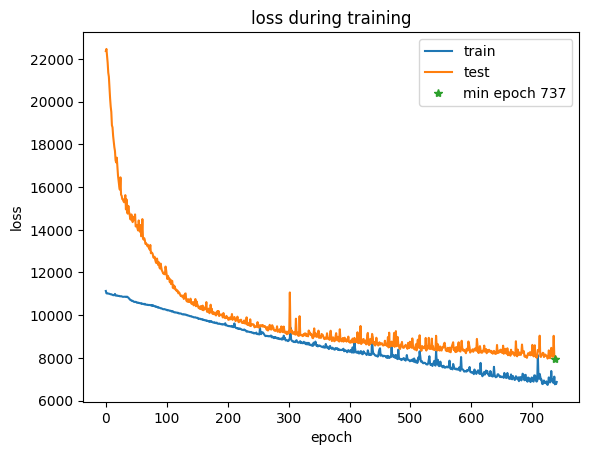

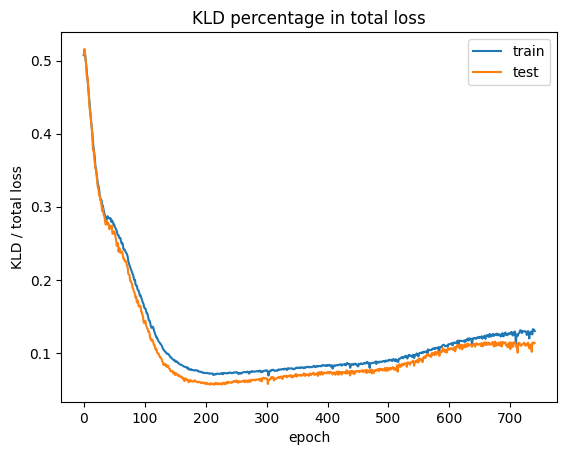

epoch 741: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6735.763, BCE: 6125.755, KLD: 935.325, KLD/(KLD+BCE): 13.246% beta:1.00
[valid] loss: 8035.409, BCE: 7125.225, KLD: 910.184, KLD/loss: 11.327%


epoch 742: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6787.452, BCE: 6171.150, KLD: 938.485, KLD/(KLD+BCE): 13.200% beta:1.00
[valid] loss: 8088.705, BCE: 7173.568, KLD: 915.137, KLD/loss: 11.314%


epoch 743: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 6725.975, BCE: 6109.704, KLD: 935.026, KLD/(KLD+BCE): 13.273% beta:1.00
[valid] loss: 7944.936, BCE: 7036.994, KLD: 907.942, KLD/loss: 11.428%
model save at:  model_files_beta/ckpt_743.pt
remove  model_files_beta/ckpt_635.pt


epoch 744: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 6856.879, BCE: 6244.276, KLD: 936.625, KLD/(KLD+BCE): 13.043% beta:1.00
[valid] loss: 8130.174, BCE: 7215.202, KLD: 914.972, KLD/loss: 11.254%


epoch 745: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7114.849, BCE: 6491.888, KLD: 948.953, KLD/(KLD+BCE): 12.753% beta:1.00
[valid] loss: 8162.826, BCE: 7255.841, KLD: 906.985, KLD/loss: 11.111%


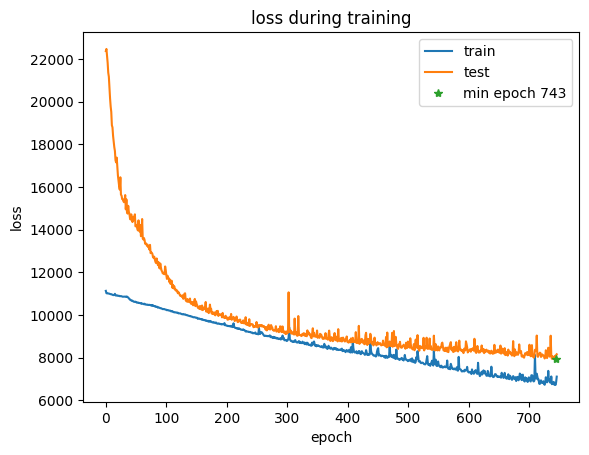

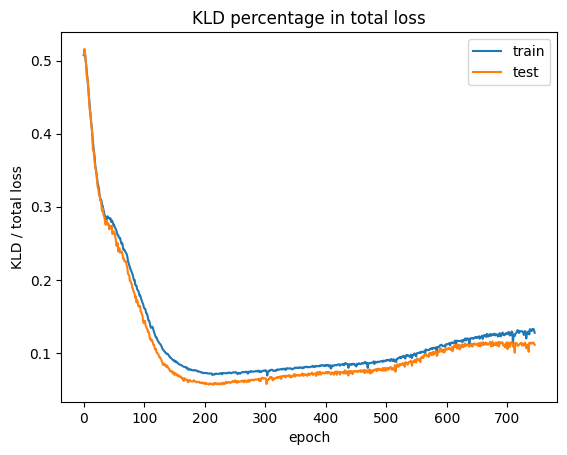

epoch 746: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6839.213, BCE: 6211.895, KLD: 947.951, KLD/(KLD+BCE): 13.240% beta:1.00
[valid] loss: 8058.489, BCE: 7131.944, KLD: 926.545, KLD/loss: 11.498%


epoch 747: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6717.068, BCE: 6096.031, KLD: 939.025, KLD/(KLD+BCE): 13.348% beta:1.00
[valid] loss: 8010.649, BCE: 7100.473, KLD: 910.176, KLD/loss: 11.362%


epoch 748: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6963.413, BCE: 6335.612, KLD: 955.399, KLD/(KLD+BCE): 13.104% beta:1.00
[valid] loss: 8085.120, BCE: 7154.896, KLD: 930.224, KLD/loss: 11.505%


epoch 749: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6712.845, BCE: 6092.727, KLD: 941.525, KLD/(KLD+BCE): 13.385% beta:1.00
[valid] loss: 8030.891, BCE: 7124.933, KLD: 905.958, KLD/loss: 11.281%


epoch 750: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6681.799, BCE: 6066.902, KLD: 931.823, KLD/(KLD+BCE): 13.314% beta:1.00
[valid] loss: 7942.768, BCE: 7048.941, KLD: 893.827, KLD/loss: 11.253%


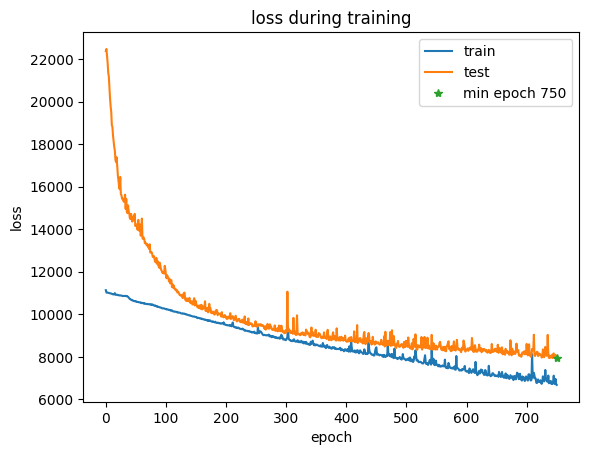

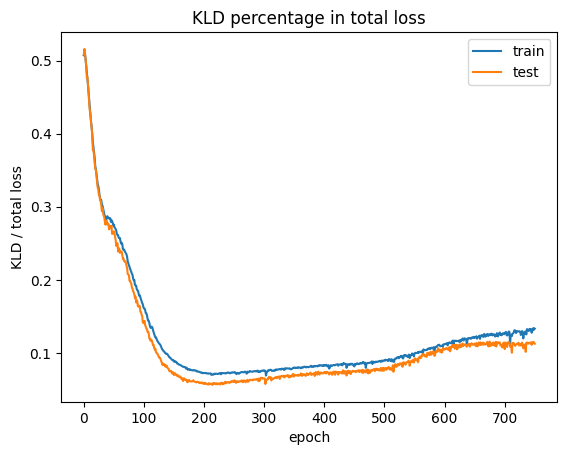

model save at:  model_files_beta/ckpt_750.pt
remove  model_files_beta/ckpt_639.pt


epoch 751: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6740.380, BCE: 6118.365, KLD: 937.082, KLD/(KLD+BCE): 13.282% beta:1.00
[valid] loss: 7958.478, BCE: 7064.245, KLD: 894.233, KLD/loss: 11.236%


epoch 752: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6663.559, BCE: 6054.505, KLD: 924.514, KLD/(KLD+BCE): 13.247% beta:1.00
[valid] loss: 8005.255, BCE: 7124.920, KLD: 880.335, KLD/loss: 10.997%


epoch 753: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6887.724, BCE: 6276.221, KLD: 926.698, KLD/(KLD+BCE): 12.866% beta:1.00
[valid] loss: 7997.478, BCE: 7098.299, KLD: 899.179, KLD/loss: 11.243%


epoch 754: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6851.578, BCE: 6229.286, KLD: 941.079, KLD/(KLD+BCE): 13.125% beta:1.00
[valid] loss: 8041.289, BCE: 7138.306, KLD: 902.983, KLD/loss: 11.229%


epoch 755: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 11844.451, BCE: 10935.373, KLD: 1278.754, KLD/(KLD+BCE): 10.469% beta:1.00
[valid] loss: 11467.564, BCE: 10554.248, KLD: 913.317, KLD/loss: 7.964%


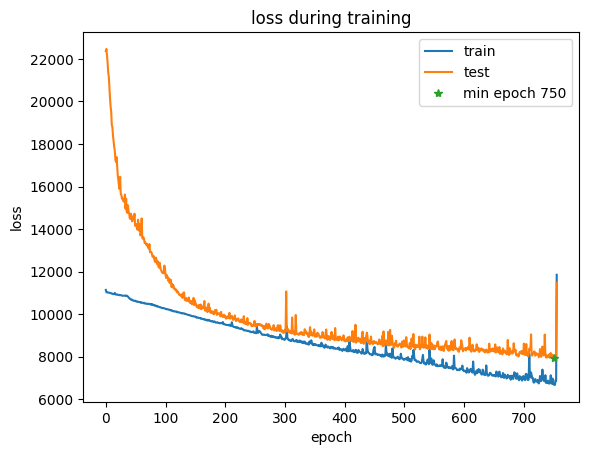

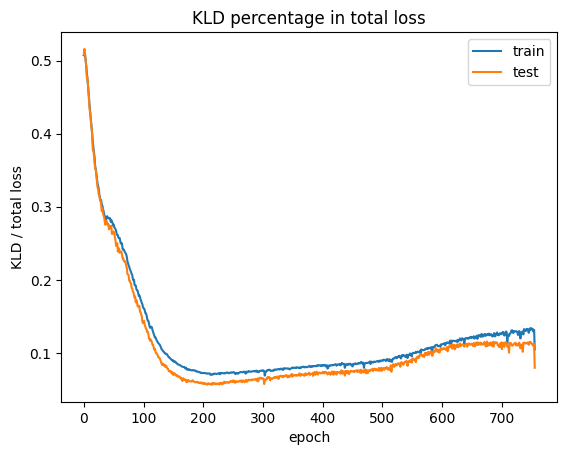

epoch 756: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10950.845, BCE: 10407.992, KLD: 827.061, KLD/(KLD+BCE): 7.361% beta:1.00
[valid] loss: 10842.366, BCE: 10113.287, KLD: 729.079, KLD/loss: 6.724%


epoch 757: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 10496.304, BCE: 10019.194, KLD: 720.031, KLD/(KLD+BCE): 6.705% beta:1.00
[valid] loss: 10513.473, BCE: 9825.969, KLD: 687.504, KLD/loss: 6.539%


epoch 758: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 10181.260, BCE: 9718.742, KLD: 693.457, KLD/(KLD+BCE): 6.660% beta:1.00
[valid] loss: 10272.046, BCE: 9599.722, KLD: 672.324, KLD/loss: 6.545%


epoch 759: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9915.995, BCE: 9456.849, KLD: 687.787, KLD/(KLD+BCE): 6.780% beta:1.00
[valid] loss: 10026.720, BCE: 9359.272, KLD: 667.448, KLD/loss: 6.657%


epoch 760: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 9671.437, BCE: 9208.800, KLD: 691.558, KLD/(KLD+BCE): 6.985% beta:1.00
[valid] loss: 9897.512, BCE: 9217.417, KLD: 680.095, KLD/loss: 6.871%


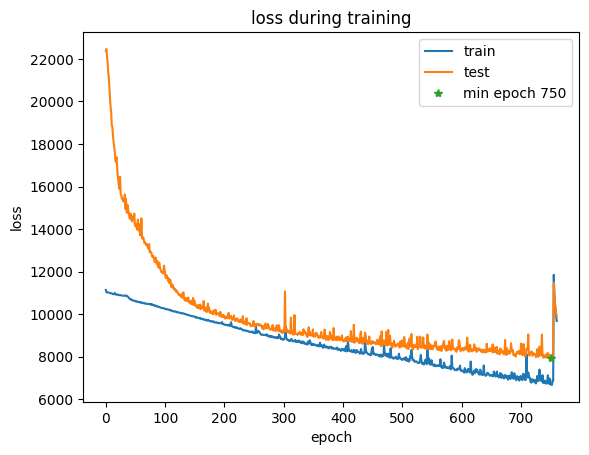

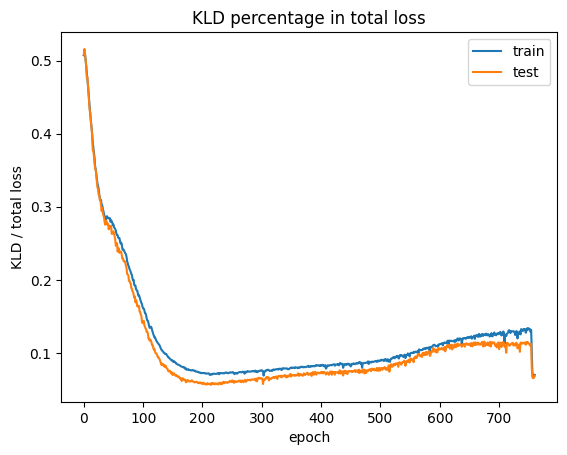

epoch 761: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 9406.668, BCE: 8937.427, KLD: 702.061, KLD/(KLD+BCE): 7.283% beta:1.00
[valid] loss: 9690.904, BCE: 8997.895, KLD: 693.009, KLD/loss: 7.151%


epoch 762: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 9085.480, BCE: 8602.081, KLD: 722.656, KLD/(KLD+BCE): 7.750% beta:1.00
[valid] loss: 9379.258, BCE: 8653.493, KLD: 725.765, KLD/loss: 7.738%


epoch 763: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 8703.402, BCE: 8189.946, KLD: 764.238, KLD/(KLD+BCE): 8.535% beta:1.00
[valid] loss: 9035.684, BCE: 8280.312, KLD: 755.372, KLD/loss: 8.360%


epoch 764: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8259.526, BCE: 7726.859, KLD: 795.746, KLD/(KLD+BCE): 9.337% beta:1.00
[valid] loss: 8731.854, BCE: 7952.455, KLD: 779.399, KLD/loss: 8.926%


epoch 765: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7956.713, BCE: 7406.358, KLD: 821.898, KLD/(KLD+BCE): 9.989% beta:1.00
[valid] loss: 8421.962, BCE: 7605.545, KLD: 816.417, KLD/loss: 9.694%


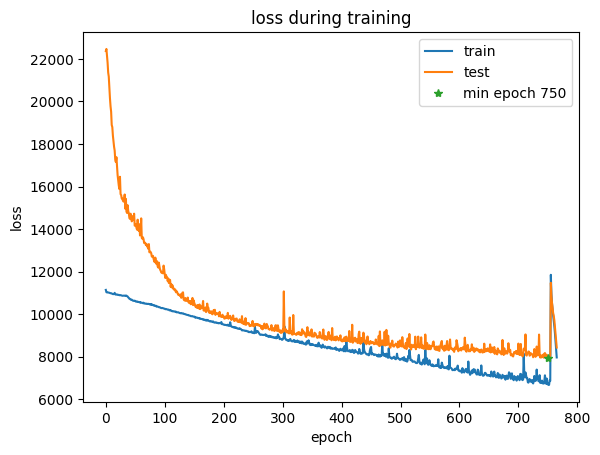

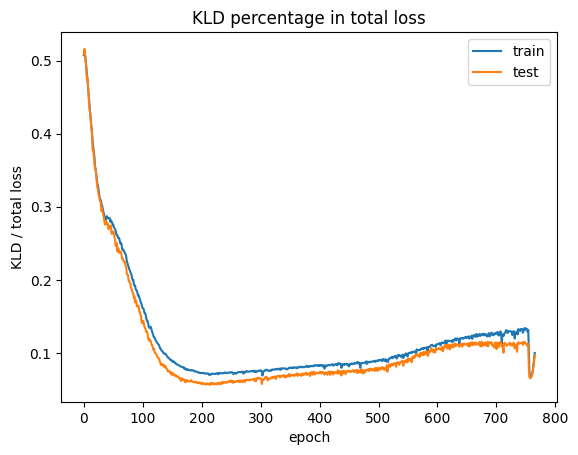

epoch 766: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7546.514, BCE: 6985.407, KLD: 836.789, KLD/(KLD+BCE): 10.698% beta:1.00
[valid] loss: 8294.363, BCE: 7476.202, KLD: 818.161, KLD/loss: 9.864%


epoch 767: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7460.965, BCE: 6893.774, KLD: 845.579, KLD/(KLD+BCE): 10.926% beta:1.00
[valid] loss: 8314.522, BCE: 7493.987, KLD: 820.535, KLD/loss: 9.869%


epoch 768: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7420.724, BCE: 6845.226, KLD: 859.481, KLD/(KLD+BCE): 11.155% beta:1.00
[valid] loss: 8339.654, BCE: 7507.271, KLD: 832.383, KLD/loss: 9.981%


epoch 769: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7144.450, BCE: 6566.373, KLD: 866.207, KLD/(KLD+BCE): 11.654% beta:1.00
[valid] loss: 8140.078, BCE: 7303.693, KLD: 836.385, KLD/loss: 10.275%


epoch 770: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7070.752, BCE: 6487.506, KLD: 870.153, KLD/(KLD+BCE): 11.826% beta:1.00
[valid] loss: 8472.004, BCE: 7615.375, KLD: 856.629, KLD/loss: 10.111%


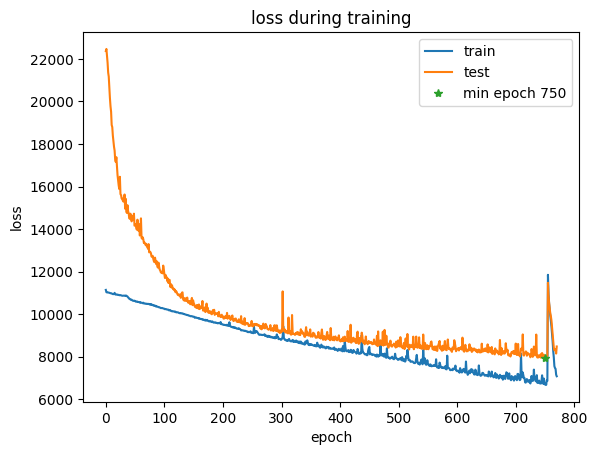

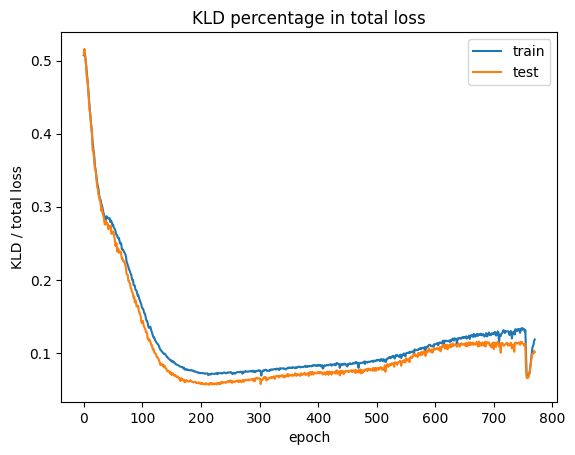

epoch 771: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7099.265, BCE: 6509.986, KLD: 877.552, KLD/(KLD+BCE): 11.879% beta:1.00
[valid] loss: 8075.114, BCE: 7233.548, KLD: 841.566, KLD/loss: 10.422%


epoch 772: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7063.870, BCE: 6475.683, KLD: 877.018, KLD/(KLD+BCE): 11.928% beta:1.00
[valid] loss: 8116.022, BCE: 7251.647, KLD: 864.375, KLD/loss: 10.650%


epoch 773: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 7008.518, BCE: 6407.466, KLD: 888.917, KLD/(KLD+BCE): 12.183% beta:1.00
[valid] loss: 7982.719, BCE: 7134.992, KLD: 847.726, KLD/loss: 10.620%


epoch 774: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6946.143, BCE: 6352.465, KLD: 884.224, KLD/(KLD+BCE): 12.219% beta:1.00
[valid] loss: 8109.410, BCE: 7274.002, KLD: 835.409, KLD/loss: 10.302%


epoch 775: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6896.298, BCE: 6300.264, KLD: 888.795, KLD/(KLD+BCE): 12.363% beta:1.00
[valid] loss: 7975.940, BCE: 7127.329, KLD: 848.611, KLD/loss: 10.640%


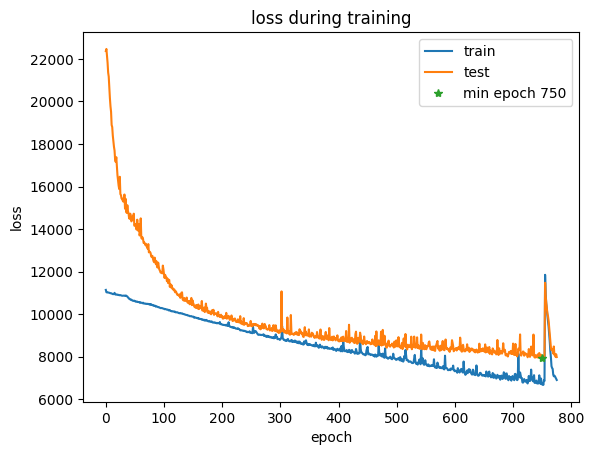

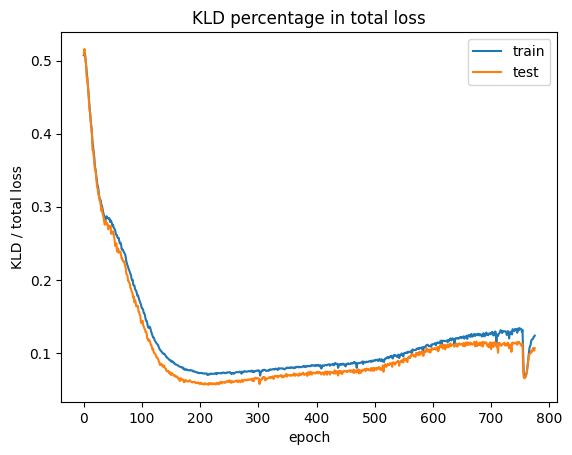

epoch 776: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6930.224, BCE: 6328.898, KLD: 891.186, KLD/(KLD+BCE): 12.343% beta:1.00
[valid] loss: 8153.366, BCE: 7278.103, KLD: 875.263, KLD/loss: 10.735%


epoch 777: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6939.349, BCE: 6334.746, KLD: 898.252, KLD/(KLD+BCE): 12.419% beta:1.00
[valid] loss: 8002.714, BCE: 7141.165, KLD: 861.549, KLD/loss: 10.766%


epoch 778: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6906.810, BCE: 6306.208, KLD: 897.139, KLD/(KLD+BCE): 12.454% beta:1.00
[valid] loss: 9182.337, BCE: 8298.135, KLD: 884.202, KLD/loss: 9.629%


epoch 779: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6960.302, BCE: 6353.028, KLD: 901.259, KLD/(KLD+BCE): 12.424% beta:1.00
[valid] loss: 8147.256, BCE: 7288.611, KLD: 858.644, KLD/loss: 10.539%


epoch 780: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6881.009, BCE: 6276.675, KLD: 897.269, KLD/(KLD+BCE): 12.507% beta:1.00
[valid] loss: 8355.022, BCE: 7484.868, KLD: 870.154, KLD/loss: 10.415%


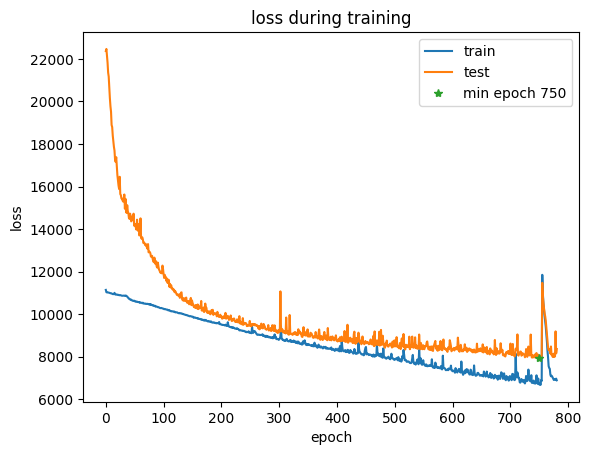

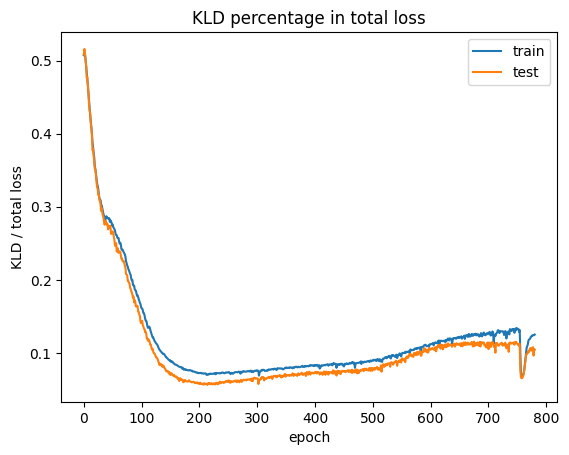

epoch 781: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6898.543, BCE: 6288.234, KLD: 903.794, KLD/(KLD+BCE): 12.567% beta:1.00
[valid] loss: 8268.855, BCE: 7402.078, KLD: 866.777, KLD/loss: 10.482%


epoch 782: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6886.453, BCE: 6273.242, KLD: 906.278, KLD/(KLD+BCE): 12.623% beta:1.00
[valid] loss: 8321.296, BCE: 7437.525, KLD: 883.771, KLD/loss: 10.621%


epoch 783: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6956.800, BCE: 6343.543, KLD: 909.177, KLD/(KLD+BCE): 12.536% beta:1.00
[valid] loss: 8066.201, BCE: 7188.945, KLD: 877.256, KLD/loss: 10.876%


epoch 784: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6953.570, BCE: 6339.599, KLD: 909.749, KLD/(KLD+BCE): 12.549% beta:1.00
[valid] loss: 8097.654, BCE: 7225.251, KLD: 872.403, KLD/loss: 10.774%


epoch 785: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7048.318, BCE: 6442.187, KLD: 896.298, KLD/(KLD+BCE): 12.214% beta:1.00
[valid] loss: 7937.888, BCE: 7083.098, KLD: 854.790, KLD/loss: 10.768%


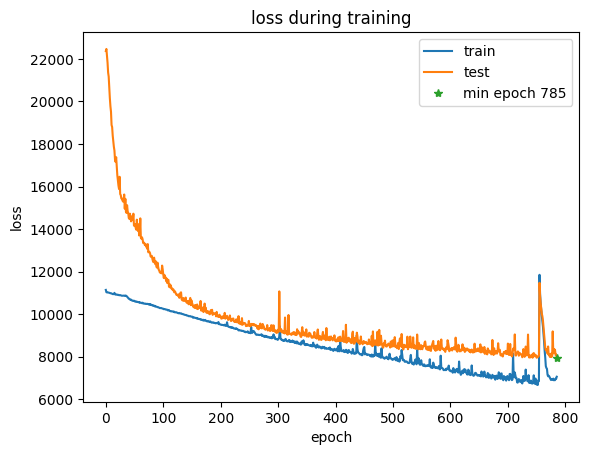

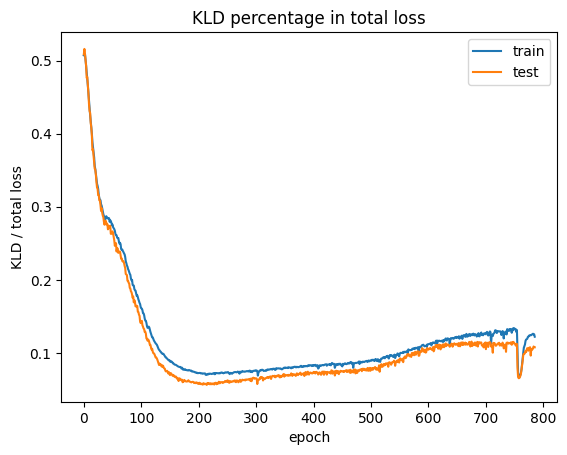

model save at:  model_files_beta/ckpt_785.pt
remove  model_files_beta/ckpt_660.pt


epoch 786: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6984.004, BCE: 6369.624, KLD: 904.297, KLD/(KLD+BCE): 12.432% beta:1.00
[valid] loss: 8182.176, BCE: 7328.206, KLD: 853.969, KLD/loss: 10.437%


epoch 787: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6862.965, BCE: 6251.018, KLD: 902.732, KLD/(KLD+BCE): 12.619% beta:1.00
[valid] loss: 7909.868, BCE: 7055.503, KLD: 854.365, KLD/loss: 10.801%
model save at:  model_files_beta/ckpt_787.pt
remove  model_files_beta/ckpt_664.pt


epoch 788: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6841.070, BCE: 6232.639, KLD: 901.602, KLD/(KLD+BCE): 12.638% beta:1.00
[valid] loss: 8065.156, BCE: 7198.057, KLD: 867.099, KLD/loss: 10.751%


epoch 789: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6743.917, BCE: 6130.554, KLD: 907.671, KLD/(KLD+BCE): 12.896% beta:1.00
[valid] loss: 8344.944, BCE: 7483.818, KLD: 861.127, KLD/loss: 10.319%


epoch 790: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6885.731, BCE: 6264.903, KLD: 917.252, KLD/(KLD+BCE): 12.771% beta:1.00
[valid] loss: 8126.291, BCE: 7240.235, KLD: 886.056, KLD/loss: 10.904%


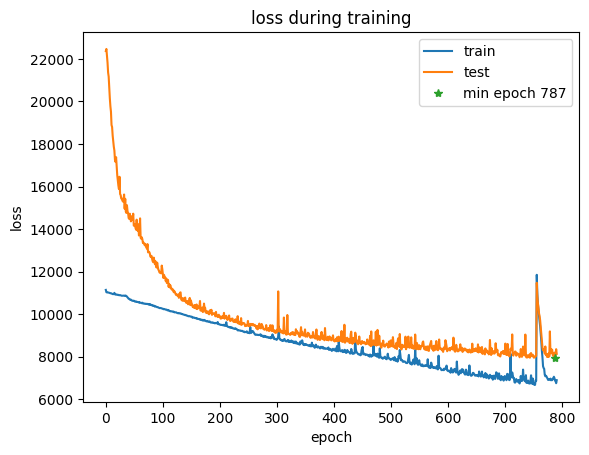

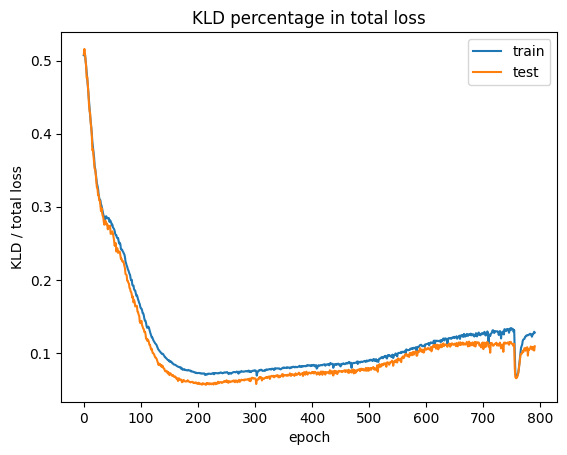

epoch 791: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6780.675, BCE: 6161.150, KLD: 912.187, KLD/(KLD+BCE): 12.896% beta:1.00
[valid] loss: 8043.760, BCE: 7179.007, KLD: 864.752, KLD/loss: 10.751%


epoch 792: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6711.043, BCE: 6094.765, KLD: 908.287, KLD/(KLD+BCE): 12.970% beta:1.00
[valid] loss: 7937.715, BCE: 7078.675, KLD: 859.040, KLD/loss: 10.822%


epoch 793: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 6672.197, BCE: 6057.963, KLD: 908.907, KLD/(KLD+BCE): 13.046% beta:1.00
[valid] loss: 7940.542, BCE: 7073.085, KLD: 867.457, KLD/loss: 10.924%


epoch 794: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6731.468, BCE: 6113.894, KLD: 910.639, KLD/(KLD+BCE): 12.964% beta:1.00
[valid] loss: 8016.104, BCE: 7144.199, KLD: 871.905, KLD/loss: 10.877%


epoch 795: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6780.159, BCE: 6162.565, KLD: 915.751, KLD/(KLD+BCE): 12.937% beta:1.00
[valid] loss: 8230.559, BCE: 7366.484, KLD: 864.074, KLD/loss: 10.498%


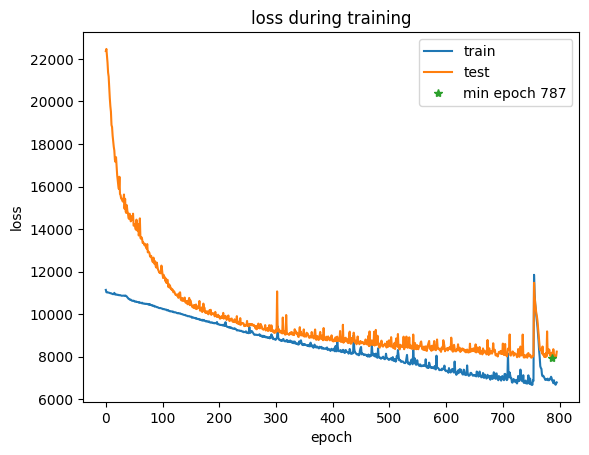

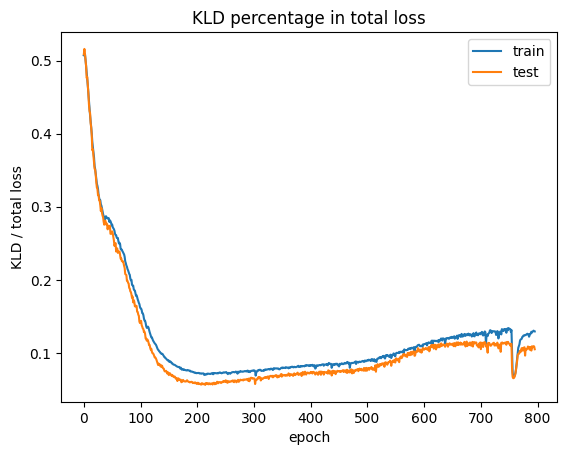

epoch 796: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6769.285, BCE: 6145.304, KLD: 913.992, KLD/(KLD+BCE): 12.947% beta:1.00
[valid] loss: 8183.066, BCE: 7308.021, KLD: 875.045, KLD/loss: 10.693%


epoch 797: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6814.044, BCE: 6189.650, KLD: 918.905, KLD/(KLD+BCE): 12.927% beta:1.00
[valid] loss: 8146.848, BCE: 7250.508, KLD: 896.340, KLD/loss: 11.002%


epoch 798: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6841.622, BCE: 6211.553, KLD: 927.981, KLD/(KLD+BCE): 12.998% beta:1.00
[valid] loss: 8008.319, BCE: 7130.877, KLD: 877.442, KLD/loss: 10.957%


epoch 799: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6706.074, BCE: 6071.196, KLD: 930.456, KLD/(KLD+BCE): 13.289% beta:1.00
[valid] loss: 7932.458, BCE: 7067.091, KLD: 865.366, KLD/loss: 10.909%


epoch 800: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6676.954, BCE: 6048.082, KLD: 918.443, KLD/(KLD+BCE): 13.184% beta:1.00
[valid] loss: 7906.888, BCE: 7031.257, KLD: 875.632, KLD/loss: 11.074%


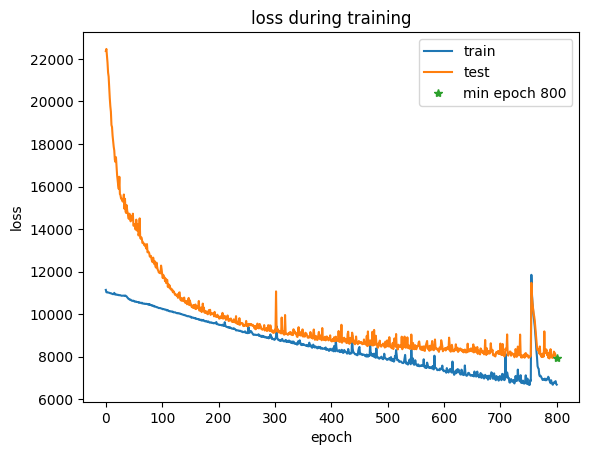

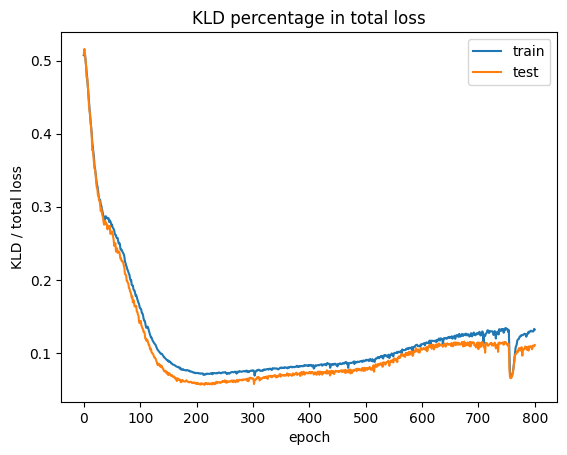

model save at:  model_files_beta/ckpt_800.pt
remove  model_files_beta/ckpt_675.pt


epoch 801: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7065.104, BCE: 6436.826, KLD: 920.067, KLD/(KLD+BCE): 12.506% beta:1.00
[valid] loss: 7970.232, BCE: 7103.722, KLD: 866.510, KLD/loss: 10.872%


epoch 802: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6715.719, BCE: 6087.989, KLD: 921.453, KLD/(KLD+BCE): 13.146% beta:1.00
[valid] loss: 8017.757, BCE: 7150.762, KLD: 866.994, KLD/loss: 10.813%


epoch 803: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7170.589, BCE: 6536.119, KLD: 925.864, KLD/(KLD+BCE): 12.408% beta:1.00
[valid] loss: 8009.730, BCE: 7129.129, KLD: 880.601, KLD/loss: 10.994%


epoch 804: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6728.130, BCE: 6094.395, KLD: 926.150, KLD/(KLD+BCE): 13.192% beta:1.00
[valid] loss: 7878.451, BCE: 7005.375, KLD: 873.075, KLD/loss: 11.082%
model save at:  model_files_beta/ckpt_804.pt
remove  model_files_beta/ckpt_687.pt


epoch 805: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6697.873, BCE: 6064.026, KLD: 924.276, KLD/(KLD+BCE): 13.226% beta:1.00
[valid] loss: 7887.632, BCE: 7014.959, KLD: 872.673, KLD/loss: 11.064%


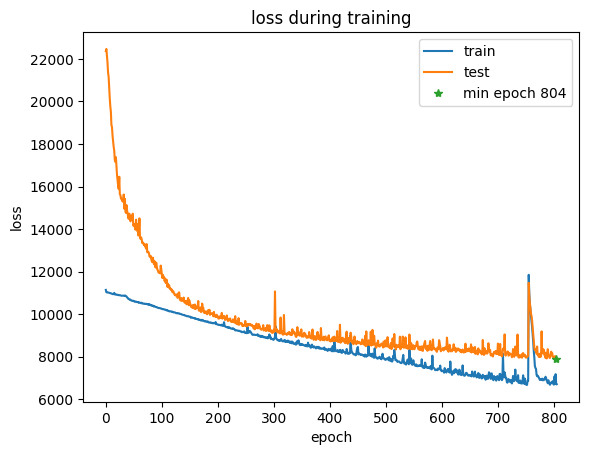

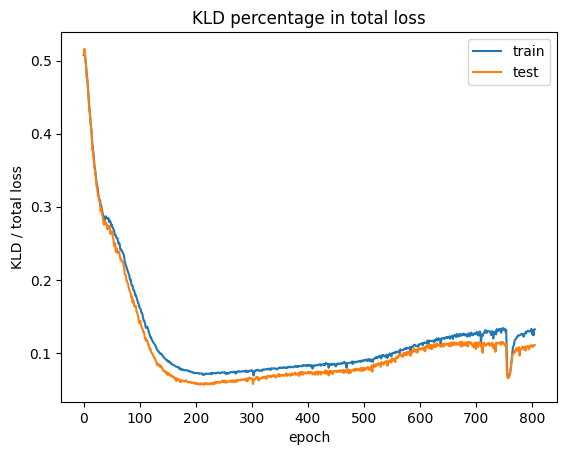

epoch 806: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6630.974, BCE: 5994.587, KLD: 926.358, KLD/(KLD+BCE): 13.385% beta:1.00
[valid] loss: 7932.483, BCE: 7056.497, KLD: 875.986, KLD/loss: 11.043%


epoch 807: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6670.271, BCE: 6042.246, KLD: 916.133, KLD/(KLD+BCE): 13.166% beta:1.00
[valid] loss: 8067.406, BCE: 7197.550, KLD: 869.856, KLD/loss: 10.782%


epoch 808: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6755.157, BCE: 6122.166, KLD: 922.942, KLD/(KLD+BCE): 13.100% beta:1.00
[valid] loss: 7863.358, BCE: 6982.385, KLD: 880.973, KLD/loss: 11.204%
model save at:  model_files_beta/ckpt_808.pt
remove  model_files_beta/ckpt_688.pt


epoch 809: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6621.990, BCE: 5994.111, KLD: 919.288, KLD/(KLD+BCE): 13.297% beta:1.00
[valid] loss: 7951.653, BCE: 7090.069, KLD: 861.584, KLD/loss: 10.835%


epoch 810: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6689.072, BCE: 6059.273, KLD: 916.999, KLD/(KLD+BCE): 13.145% beta:1.00
[valid] loss: 7892.457, BCE: 7010.572, KLD: 881.886, KLD/loss: 11.174%


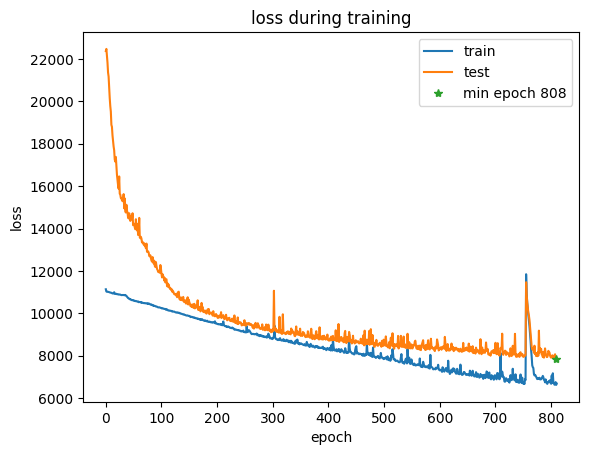

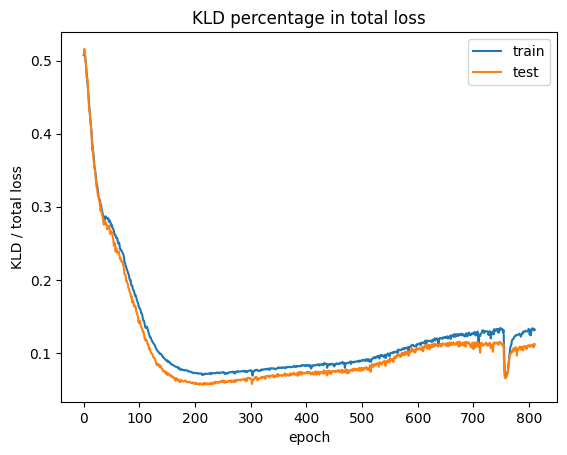

epoch 811: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6626.735, BCE: 5993.350, KLD: 929.522, KLD/(KLD+BCE): 13.427% beta:1.00
[valid] loss: 7963.591, BCE: 7078.820, KLD: 884.771, KLD/loss: 11.110%


epoch 812: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6745.793, BCE: 6109.062, KLD: 929.369, KLD/(KLD+BCE): 13.204% beta:1.00
[valid] loss: 7987.562, BCE: 7104.201, KLD: 883.361, KLD/loss: 11.059%


epoch 813: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6924.879, BCE: 6287.776, KLD: 925.507, KLD/(KLD+BCE): 12.831% beta:1.00
[valid] loss: 7961.223, BCE: 7060.318, KLD: 900.906, KLD/loss: 11.316%


epoch 814: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6583.284, BCE: 5949.122, KLD: 921.883, KLD/(KLD+BCE): 13.417% beta:1.00
[valid] loss: 7840.276, BCE: 6954.639, KLD: 885.636, KLD/loss: 11.296%
model save at:  model_files_beta/ckpt_814.pt
remove  model_files_beta/ckpt_691.pt


epoch 815: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6659.815, BCE: 6024.147, KLD: 923.822, KLD/(KLD+BCE): 13.296% beta:1.00
[valid] loss: 8034.059, BCE: 7143.577, KLD: 890.482, KLD/loss: 11.084%


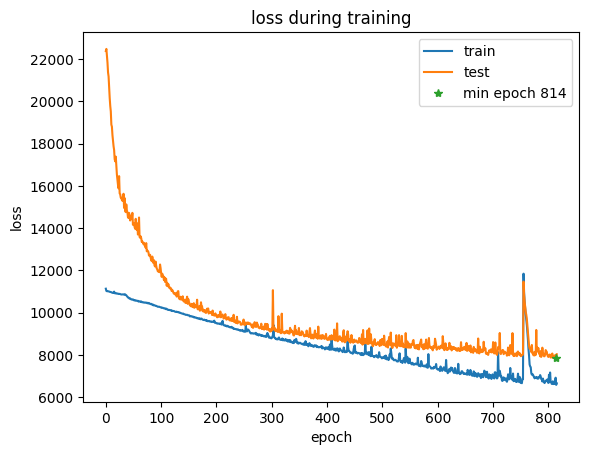

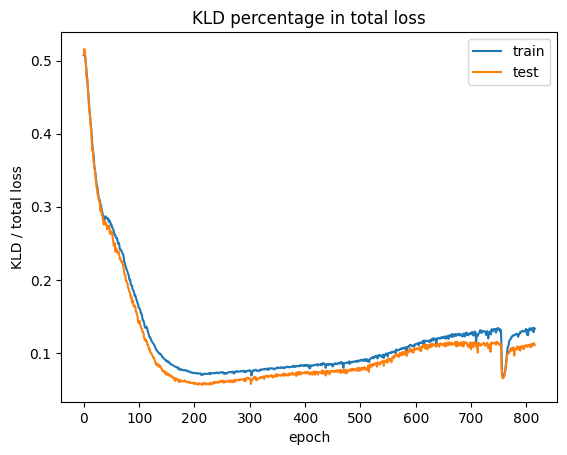

epoch 816: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6722.800, BCE: 6085.057, KLD: 932.433, KLD/(KLD+BCE): 13.287% beta:1.00
[valid] loss: 8061.923, BCE: 7168.772, KLD: 893.151, KLD/loss: 11.079%


epoch 817: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6678.063, BCE: 6046.291, KLD: 926.130, KLD/(KLD+BCE): 13.283% beta:1.00
[valid] loss: 7913.332, BCE: 7030.992, KLD: 882.339, KLD/loss: 11.150%


epoch 818: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6633.103, BCE: 6001.351, KLD: 916.495, KLD/(KLD+BCE): 13.248% beta:1.00
[valid] loss: 7840.167, BCE: 6969.824, KLD: 870.342, KLD/loss: 11.101%
model save at:  model_files_beta/ckpt_818.pt
remove  model_files_beta/ckpt_725.pt


epoch 819: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6714.043, BCE: 6083.672, KLD: 915.834, KLD/(KLD+BCE): 13.084% beta:1.00
[valid] loss: 7894.351, BCE: 7023.805, KLD: 870.547, KLD/loss: 11.027%


epoch 820: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6663.307, BCE: 6033.046, KLD: 913.223, KLD/(KLD+BCE): 13.147% beta:1.00
[valid] loss: 8039.571, BCE: 7169.996, KLD: 869.576, KLD/loss: 10.816%


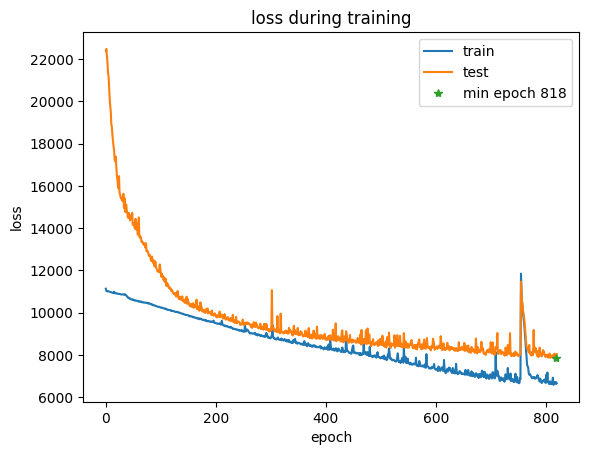

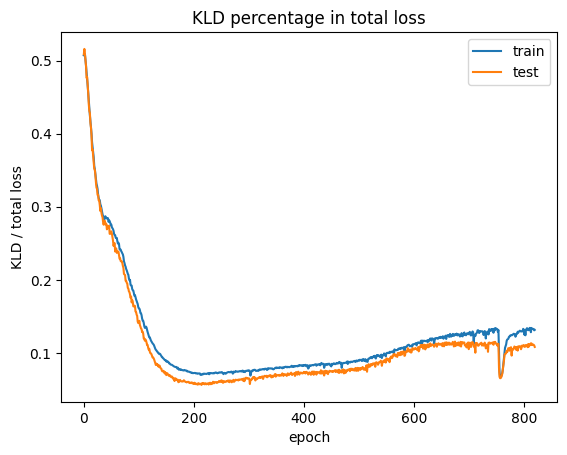

epoch 821: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6599.725, BCE: 5966.987, KLD: 920.747, KLD/(KLD+BCE): 13.368% beta:1.00
[valid] loss: 8092.998, BCE: 7222.361, KLD: 870.637, KLD/loss: 10.758%


epoch 822: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6605.238, BCE: 5966.962, KLD: 925.702, KLD/(KLD+BCE): 13.430% beta:1.00
[valid] loss: 7972.639, BCE: 7105.405, KLD: 867.235, KLD/loss: 10.878%


epoch 823: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6560.949, BCE: 5927.588, KLD: 917.300, KLD/(KLD+BCE): 13.401% beta:1.00
[valid] loss: 7983.944, BCE: 7120.586, KLD: 863.358, KLD/loss: 10.814%


epoch 824: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6693.838, BCE: 6053.372, KLD: 922.414, KLD/(KLD+BCE): 13.223% beta:1.00
[valid] loss: 8164.124, BCE: 7272.360, KLD: 891.764, KLD/loss: 10.923%


epoch 825: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6594.903, BCE: 5962.488, KLD: 918.904, KLD/(KLD+BCE): 13.353% beta:1.00
[valid] loss: 7906.923, BCE: 7045.831, KLD: 861.092, KLD/loss: 10.890%


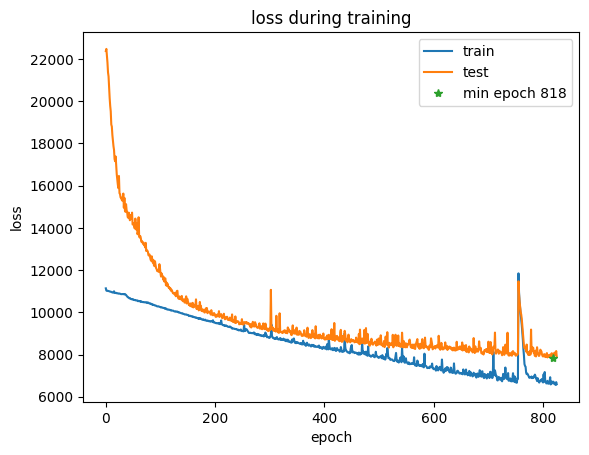

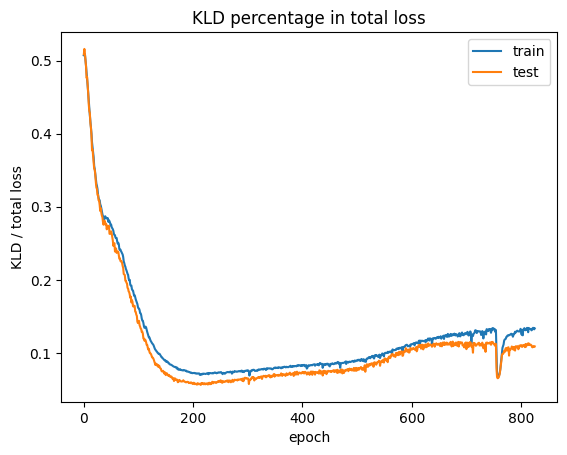

epoch 826: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6926.049, BCE: 6284.646, KLD: 927.656, KLD/(KLD+BCE): 12.862% beta:1.00
[valid] loss: 8105.215, BCE: 7222.997, KLD: 882.219, KLD/loss: 10.885%


epoch 827: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6567.559, BCE: 5926.645, KLD: 925.518, KLD/(KLD+BCE): 13.507% beta:1.00
[valid] loss: 7977.488, BCE: 7087.990, KLD: 889.498, KLD/loss: 11.150%


epoch 828: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6699.464, BCE: 6055.782, KLD: 931.242, KLD/(KLD+BCE): 13.328% beta:1.00
[valid] loss: 8196.419, BCE: 7304.752, KLD: 891.667, KLD/loss: 10.879%


epoch 829: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6562.336, BCE: 5916.335, KLD: 927.271, KLD/(KLD+BCE): 13.549% beta:1.00
[valid] loss: 7807.586, BCE: 6921.462, KLD: 886.124, KLD/loss: 11.350%
model save at:  model_files_beta/ckpt_829.pt
remove  model_files_beta/ckpt_737.pt


epoch 830: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6561.865, BCE: 5917.071, KLD: 926.794, KLD/(KLD+BCE): 13.542% beta:1.00
[valid] loss: 8202.583, BCE: 7319.765, KLD: 882.819, KLD/loss: 10.763%


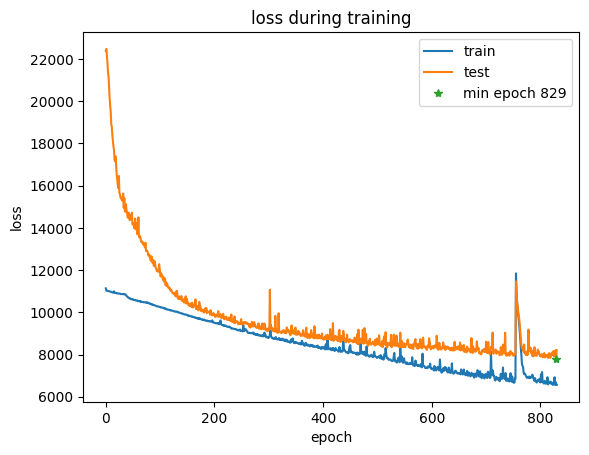

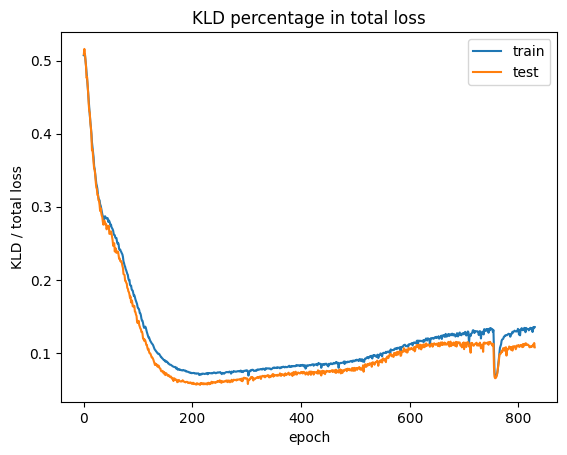

epoch 831: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6546.151, BCE: 5900.189, KLD: 927.835, KLD/(KLD+BCE): 13.589% beta:1.00
[valid] loss: 7933.078, BCE: 7063.498, KLD: 869.580, KLD/loss: 10.961%


epoch 832: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6579.021, BCE: 5940.528, KLD: 919.906, KLD/(KLD+BCE): 13.409% beta:1.00
[valid] loss: 7849.459, BCE: 6975.622, KLD: 873.837, KLD/loss: 11.132%


epoch 833: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8036.226, BCE: 7372.984, KLD: 937.358, KLD/(KLD+BCE): 11.279% beta:1.00
[valid] loss: 8233.282, BCE: 7360.433, KLD: 872.850, KLD/loss: 10.601%


epoch 834: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6819.856, BCE: 6180.769, KLD: 916.877, KLD/(KLD+BCE): 12.918% beta:1.00
[valid] loss: 7873.684, BCE: 7003.483, KLD: 870.201, KLD/loss: 11.052%


epoch 835: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6636.209, BCE: 5999.594, KLD: 911.650, KLD/(KLD+BCE): 13.191% beta:1.00
[valid] loss: 8510.639, BCE: 7642.634, KLD: 868.005, KLD/loss: 10.199%


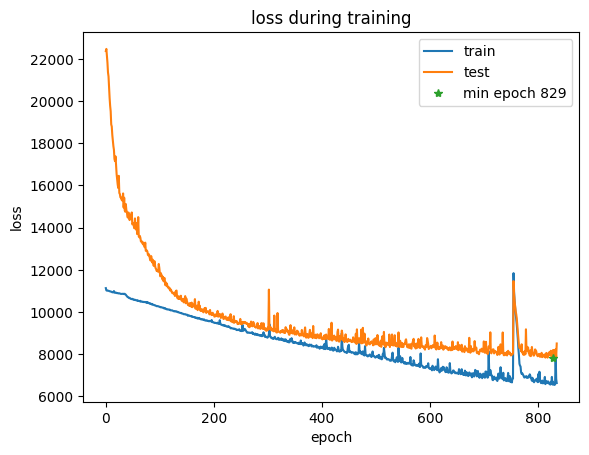

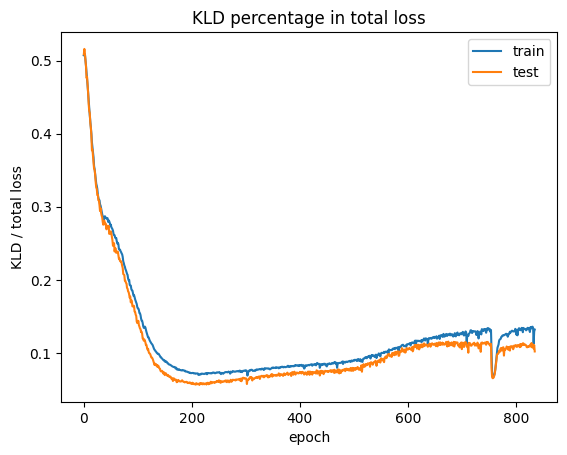

epoch 836: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 7444.681, BCE: 6761.272, KLD: 970.856, KLD/(KLD+BCE): 12.556% beta:1.00
[valid] loss: 8068.193, BCE: 7160.842, KLD: 907.351, KLD/loss: 11.246%


epoch 837: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6701.784, BCE: 6049.194, KLD: 934.278, KLD/(KLD+BCE): 13.378% beta:1.00
[valid] loss: 7972.309, BCE: 7078.828, KLD: 893.481, KLD/loss: 11.207%


epoch 838: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6556.427, BCE: 5911.387, KLD: 924.216, KLD/(KLD+BCE): 13.521% beta:1.00
[valid] loss: 7793.979, BCE: 6909.566, KLD: 884.413, KLD/loss: 11.347%
model save at:  model_files_beta/ckpt_838.pt
remove  model_files_beta/ckpt_743.pt


epoch 839: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6493.336, BCE: 5847.614, KLD: 925.715, KLD/(KLD+BCE): 13.667% beta:1.00
[valid] loss: 7799.259, BCE: 6917.571, KLD: 881.688, KLD/loss: 11.305%


epoch 840: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6485.383, BCE: 5838.971, KLD: 922.930, KLD/(KLD+BCE): 13.649% beta:1.00
[valid] loss: 7824.559, BCE: 6944.913, KLD: 879.646, KLD/loss: 11.242%


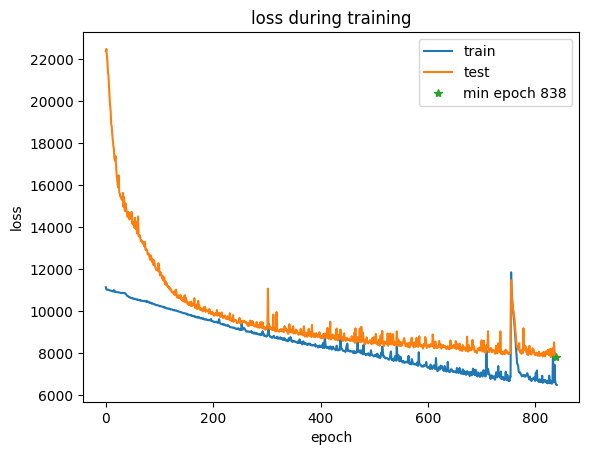

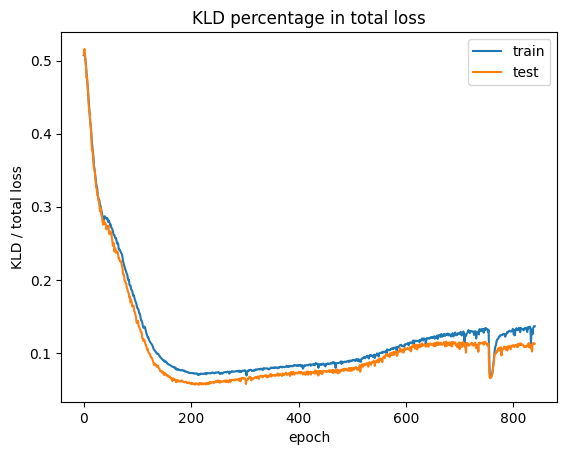

epoch 841: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6708.507, BCE: 6063.026, KLD: 926.369, KLD/(KLD+BCE): 13.254% beta:1.00
[valid] loss: 8195.105, BCE: 7311.082, KLD: 884.023, KLD/loss: 10.787%


epoch 842: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6636.942, BCE: 5993.369, KLD: 921.752, KLD/(KLD+BCE): 13.330% beta:1.00
[valid] loss: 8058.905, BCE: 7177.142, KLD: 881.763, KLD/loss: 10.941%


epoch 843: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6665.434, BCE: 6017.805, KLD: 925.362, KLD/(KLD+BCE): 13.328% beta:1.00
[valid] loss: 7887.979, BCE: 7000.058, KLD: 887.921, KLD/loss: 11.257%


epoch 844: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6553.992, BCE: 5896.922, KLD: 935.588, KLD/(KLD+BCE): 13.693% beta:1.00
[valid] loss: 7898.281, BCE: 7010.488, KLD: 887.792, KLD/loss: 11.240%


epoch 845: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 6535.509, BCE: 5885.853, KLD: 928.639, KLD/(KLD+BCE): 13.627% beta:1.00
[valid] loss: 8001.405, BCE: 7123.649, KLD: 877.756, KLD/loss: 10.970%


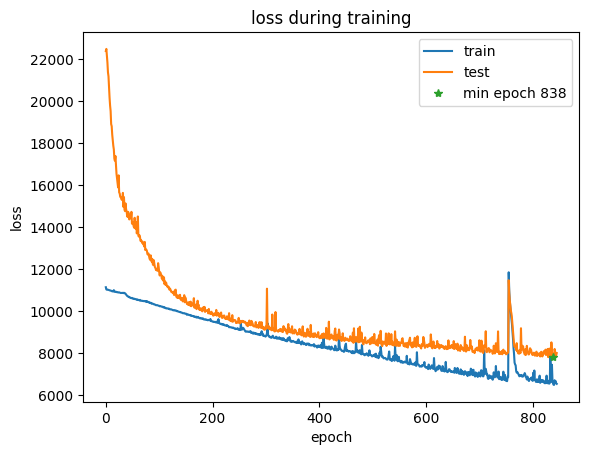

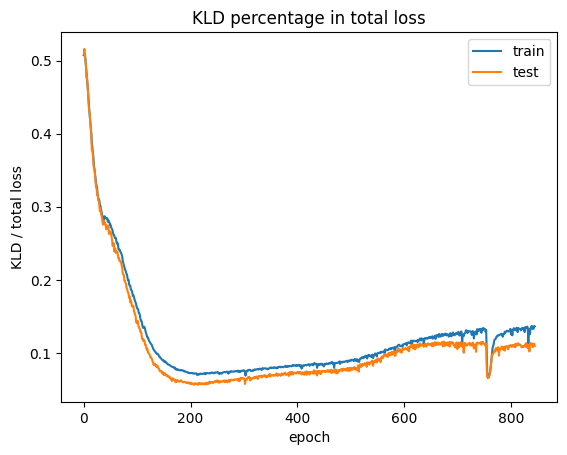

epoch 846: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 6476.146, BCE: 5830.504, KLD: 919.837, KLD/(KLD+BCE): 13.627% beta:1.00
[valid] loss: 7920.609, BCE: 7037.939, KLD: 882.669, KLD/loss: 11.144%


epoch 847: 100%|██████████| 266/266 [00:26<00:00,  9.95it/s]


[train] loss: 6482.131, BCE: 5831.799, KLD: 927.210, KLD/(KLD+BCE): 13.718% beta:1.00
[valid] loss: 7869.961, BCE: 6980.313, KLD: 889.649, KLD/loss: 11.304%


epoch 848: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6450.217, BCE: 5806.456, KLD: 924.075, KLD/(KLD+BCE): 13.730% beta:1.00
[valid] loss: 7889.487, BCE: 7018.115, KLD: 871.372, KLD/loss: 11.045%


epoch 849: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6674.683, BCE: 6030.887, KLD: 921.120, KLD/(KLD+BCE): 13.250% beta:1.00
[valid] loss: 7951.309, BCE: 7066.988, KLD: 884.320, KLD/loss: 11.122%


epoch 850: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6494.666, BCE: 5852.707, KLD: 920.439, KLD/(KLD+BCE): 13.590% beta:1.00
[valid] loss: 7807.557, BCE: 6936.454, KLD: 871.103, KLD/loss: 11.157%


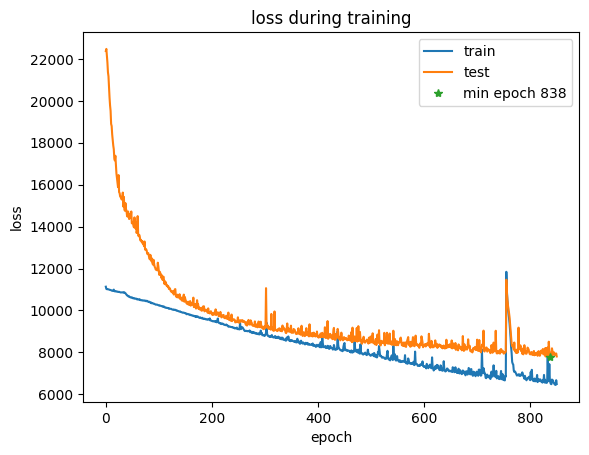

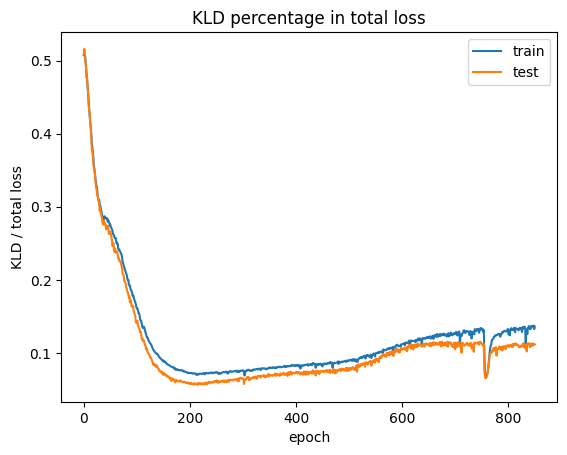

epoch 851: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6484.987, BCE: 5840.728, KLD: 920.267, KLD/(KLD+BCE): 13.611% beta:1.00
[valid] loss: 7910.168, BCE: 7010.358, KLD: 899.810, KLD/loss: 11.375%


epoch 852: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6486.735, BCE: 5845.093, KLD: 916.319, KLD/(KLD+BCE): 13.552% beta:1.00
[valid] loss: 7963.195, BCE: 7086.675, KLD: 876.520, KLD/loss: 11.007%


epoch 853: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6641.579, BCE: 5989.406, KLD: 935.282, KLD/(KLD+BCE): 13.506% beta:1.00
[valid] loss: 7861.185, BCE: 6976.374, KLD: 884.811, KLD/loss: 11.255%


epoch 854: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6633.111, BCE: 5970.162, KLD: 947.121, KLD/(KLD+BCE): 13.692% beta:1.00
[valid] loss: 8069.482, BCE: 7157.587, KLD: 911.895, KLD/loss: 11.301%


epoch 855: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6677.073, BCE: 6018.222, KLD: 940.378, KLD/(KLD+BCE): 13.514% beta:1.00
[valid] loss: 7857.751, BCE: 6994.208, KLD: 863.543, KLD/loss: 10.990%


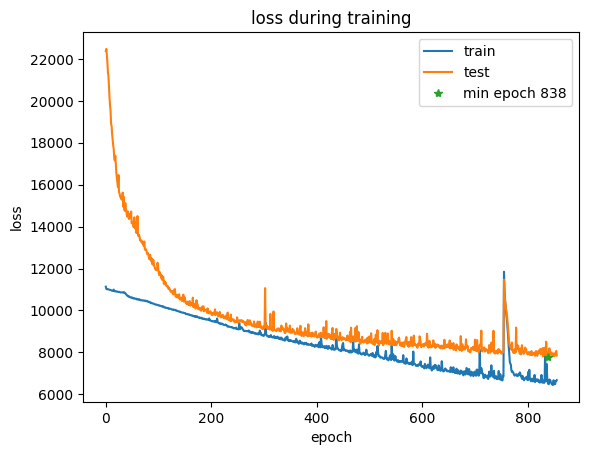

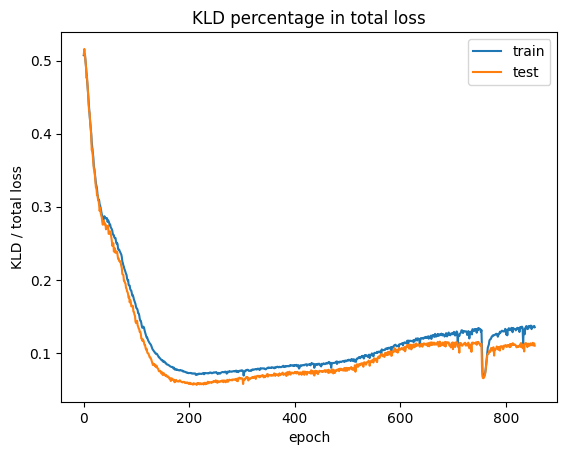

epoch 856: 100%|██████████| 266/266 [00:26<00:00,  9.97it/s]


[train] loss: 6490.119, BCE: 5838.000, KLD: 924.802, KLD/(KLD+BCE): 13.675% beta:1.00
[valid] loss: 8100.274, BCE: 7212.607, KLD: 887.667, KLD/loss: 10.958%


epoch 857: 100%|██████████| 266/266 [00:26<00:00,  9.96it/s]


[train] loss: 6526.861, BCE: 5879.965, KLD: 920.667, KLD/(KLD+BCE): 13.538% beta:1.00
[valid] loss: 7872.660, BCE: 6987.825, KLD: 884.835, KLD/loss: 11.239%


epoch 858: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6387.557, BCE: 5740.644, KLD: 917.440, KLD/(KLD+BCE): 13.779% beta:1.00
[valid] loss: 7931.609, BCE: 7052.139, KLD: 879.470, KLD/loss: 11.088%


epoch 859: 100%|██████████| 266/266 [00:26<00:00, 10.00it/s]


[train] loss: 6612.829, BCE: 5957.013, KLD: 931.727, KLD/(KLD+BCE): 13.525% beta:1.00
[valid] loss: 7897.868, BCE: 7020.871, KLD: 876.997, KLD/loss: 11.104%


epoch 860: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6502.382, BCE: 5844.033, KLD: 931.668, KLD/(KLD+BCE): 13.750% beta:1.00
[valid] loss: 7979.327, BCE: 7091.439, KLD: 887.888, KLD/loss: 11.127%


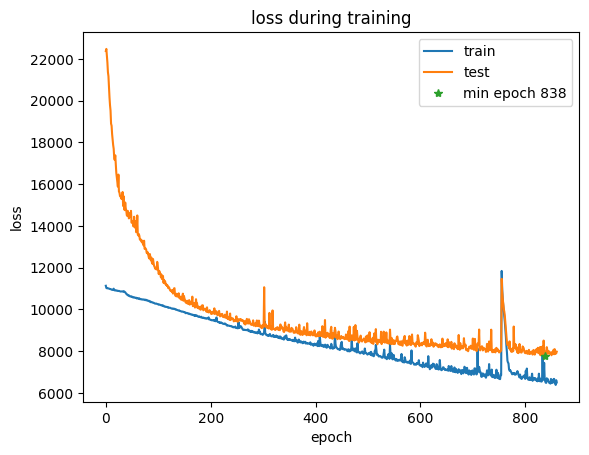

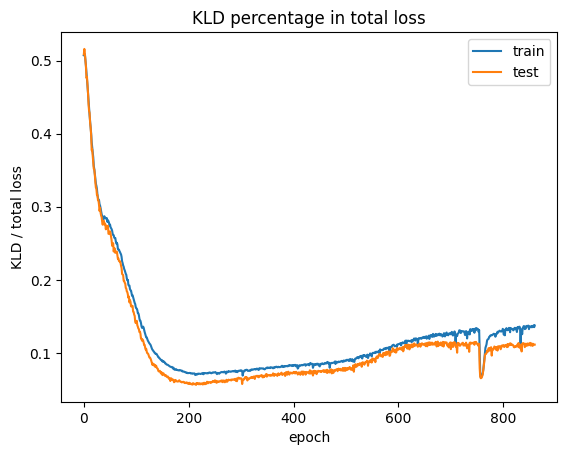

epoch 861: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6986.989, BCE: 6323.875, KLD: 937.219, KLD/(KLD+BCE): 12.907% beta:1.00
[valid] loss: 7915.968, BCE: 7013.375, KLD: 902.593, KLD/loss: 11.402%


epoch 862: 100%|██████████| 266/266 [00:26<00:00,  9.93it/s]


[train] loss: 6498.559, BCE: 5833.783, KLD: 942.789, KLD/(KLD+BCE): 13.912% beta:1.00
[valid] loss: 7960.287, BCE: 7069.584, KLD: 890.702, KLD/loss: 11.189%


epoch 863: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6456.562, BCE: 5797.254, KLD: 934.119, KLD/(KLD+BCE): 13.877% beta:1.00
[valid] loss: 7858.556, BCE: 6961.332, KLD: 897.224, KLD/loss: 11.417%


epoch 864: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6503.774, BCE: 5850.157, KLD: 925.868, KLD/(KLD+BCE): 13.664% beta:1.00
[valid] loss: 7781.775, BCE: 6906.327, KLD: 875.448, KLD/loss: 11.250%
model save at:  model_files_beta/ckpt_864.pt
remove  model_files_beta/ckpt_750.pt


epoch 865: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6491.246, BCE: 5825.925, KLD: 940.710, KLD/(KLD+BCE): 13.902% beta:1.00
[valid] loss: 7921.196, BCE: 7025.930, KLD: 895.266, KLD/loss: 11.302%


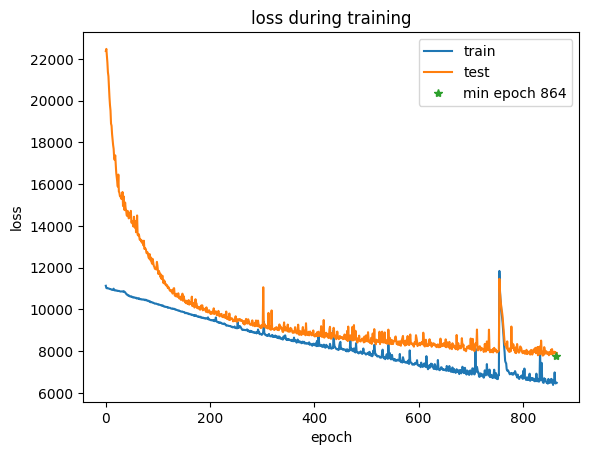

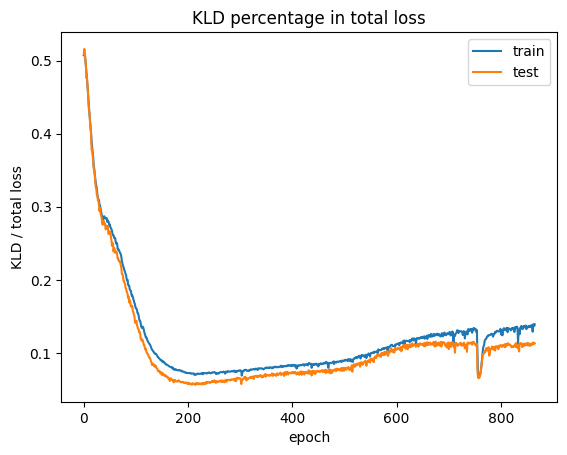

epoch 866: 100%|██████████| 266/266 [00:26<00:00,  9.99it/s]


[train] loss: 6445.284, BCE: 5788.399, KLD: 932.726, KLD/(KLD+BCE): 13.878% beta:1.00
[valid] loss: 8031.377, BCE: 7158.253, KLD: 873.124, KLD/loss: 10.871%


epoch 867: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6529.893, BCE: 5868.671, KLD: 935.821, KLD/(KLD+BCE): 13.753% beta:1.00
[valid] loss: 8261.289, BCE: 7369.397, KLD: 891.892, KLD/loss: 10.796%


epoch 868: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6483.982, BCE: 5817.868, KLD: 940.963, KLD/(KLD+BCE): 13.922% beta:1.00
[valid] loss: 7888.116, BCE: 6978.215, KLD: 909.901, KLD/loss: 11.535%


epoch 869: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6583.297, BCE: 5920.690, KLD: 937.484, KLD/(KLD+BCE): 13.670% beta:1.00
[valid] loss: 8240.291, BCE: 7341.629, KLD: 898.663, KLD/loss: 10.906%


epoch 870: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 7836.742, BCE: 7115.451, KLD: 1047.463, KLD/(KLD+BCE): 12.832% beta:1.00
[valid] loss: 8888.645, BCE: 7884.164, KLD: 1004.481, KLD/loss: 11.301%


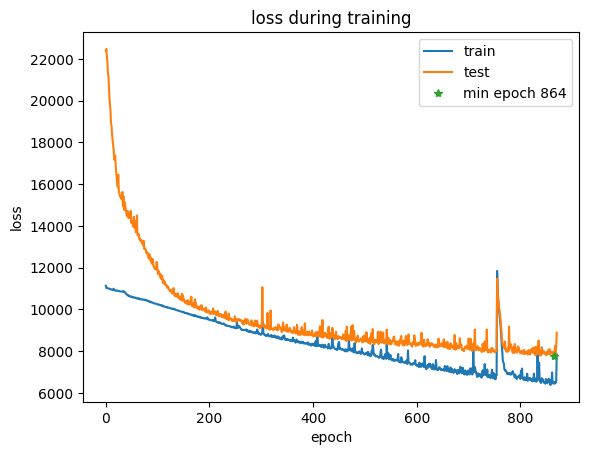

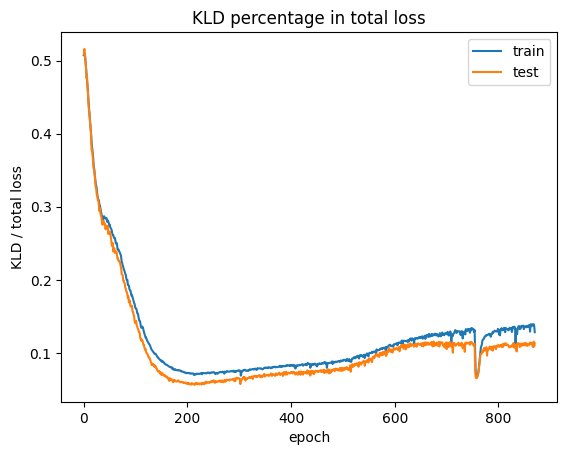

epoch 871: 100%|██████████| 266/266 [00:26<00:00,  9.91it/s]


[train] loss: 7107.564, BCE: 6419.472, KLD: 979.180, KLD/(KLD+BCE): 13.235% beta:1.00
[valid] loss: 7885.171, BCE: 6974.479, KLD: 910.693, KLD/loss: 11.549%


epoch 872: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6552.474, BCE: 5882.486, KLD: 942.752, KLD/(KLD+BCE): 13.813% beta:1.00
[valid] loss: 7812.997, BCE: 6912.609, KLD: 900.389, KLD/loss: 11.524%


epoch 873: 100%|██████████| 266/266 [00:26<00:00,  9.98it/s]


[train] loss: 6483.085, BCE: 5818.352, KLD: 935.567, KLD/(KLD+BCE): 13.852% beta:1.00
[valid] loss: 7754.221, BCE: 6860.716, KLD: 893.505, KLD/loss: 11.523%
model save at:  model_files_beta/ckpt_873.pt
remove  model_files_beta/ckpt_785.pt


epoch 874: 100%|██████████| 266/266 [00:26<00:00,  9.94it/s]


[train] loss: 6553.973, BCE: 5887.409, KLD: 935.375, KLD/(KLD+BCE): 13.710% beta:1.00
[valid] loss: 7882.296, BCE: 6994.819, KLD: 887.477, KLD/loss: 11.259%


epoch 875: 100%|██████████| 266/266 [00:26<00:00,  9.92it/s]


[train] loss: 6485.497, BCE: 5824.118, KLD: 932.153, KLD/(KLD+BCE): 13.797% beta:1.00
[valid] loss: 7852.544, BCE: 6968.343, KLD: 884.201, KLD/loss: 11.260%


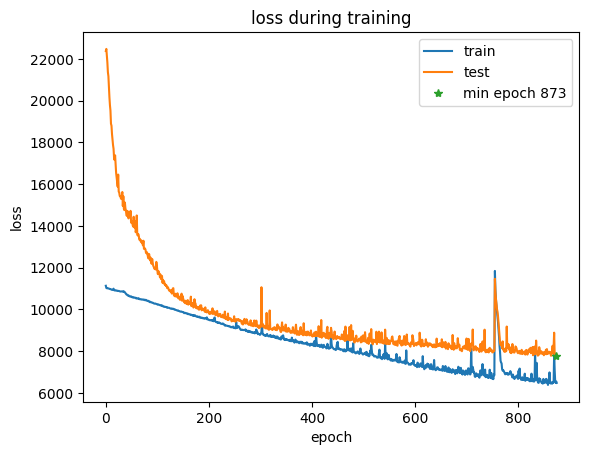

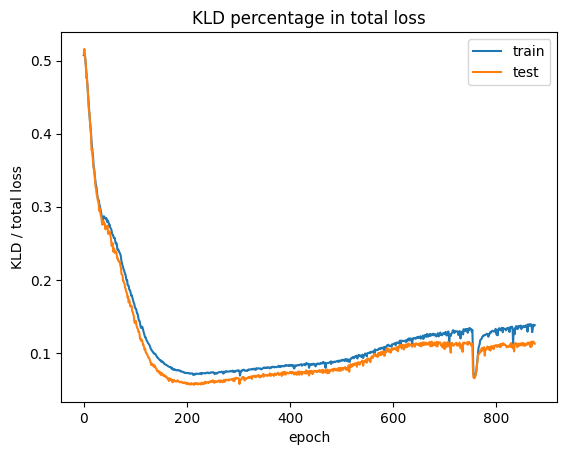

epoch 876: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6354.057, BCE: 5701.513, KLD: 918.487, KLD/(KLD+BCE): 13.874% beta:1.00
[valid] loss: 7779.341, BCE: 6904.376, KLD: 874.966, KLD/loss: 11.247%


epoch 877: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6464.866, BCE: 5801.739, KLD: 933.063, KLD/(KLD+BCE): 13.854% beta:1.00
[valid] loss: 7832.800, BCE: 6946.593, KLD: 886.207, KLD/loss: 11.314%


epoch 878: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6520.770, BCE: 5852.667, KLD: 934.820, KLD/(KLD+BCE): 13.773% beta:1.00
[valid] loss: 7998.977, BCE: 7098.435, KLD: 900.542, KLD/loss: 11.258%


epoch 879: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6404.378, BCE: 5737.442, KLD: 935.515, KLD/(KLD+BCE): 14.019% beta:1.00
[valid] loss: 7828.374, BCE: 6938.692, KLD: 889.682, KLD/loss: 11.365%


epoch 880: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6293.152, BCE: 5636.394, KLD: 918.131, KLD/(KLD+BCE): 14.008% beta:1.00
[valid] loss: 7694.635, BCE: 6821.554, KLD: 873.081, KLD/loss: 11.347%


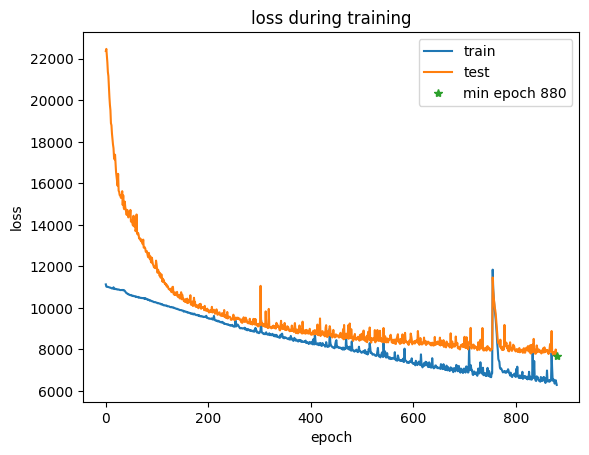

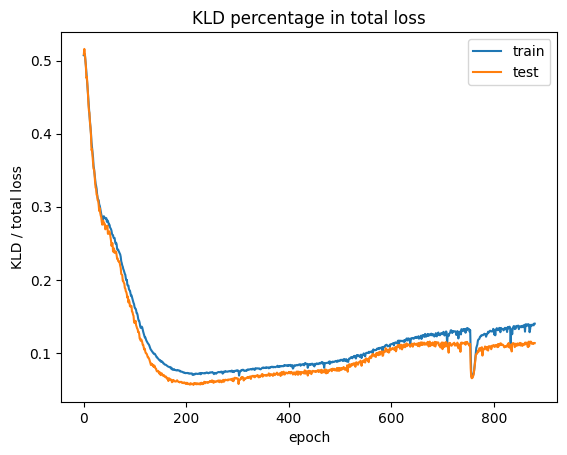

model save at:  model_files_beta/ckpt_880.pt
remove  model_files_beta/ckpt_787.pt


epoch 881: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6351.589, BCE: 5693.706, KLD: 926.072, KLD/(KLD+BCE): 13.989% beta:1.00
[valid] loss: 7826.316, BCE: 6947.292, KLD: 879.023, KLD/loss: 11.232%


epoch 882: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6568.973, BCE: 5906.254, KLD: 930.416, KLD/(KLD+BCE): 13.609% beta:1.00
[valid] loss: 8067.851, BCE: 7182.992, KLD: 884.859, KLD/loss: 10.968%


epoch 883: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6726.245, BCE: 6052.150, KLD: 944.110, KLD/(KLD+BCE): 13.494% beta:1.00
[valid] loss: 7740.232, BCE: 6846.936, KLD: 893.295, KLD/loss: 11.541%


epoch 884: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6365.139, BCE: 5700.942, KLD: 936.378, KLD/(KLD+BCE): 14.108% beta:1.00
[valid] loss: 7826.202, BCE: 6950.851, KLD: 875.351, KLD/loss: 11.185%


epoch 885: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6355.508, BCE: 5685.030, KLD: 937.565, KLD/(KLD+BCE): 14.157% beta:1.00
[valid] loss: 7839.507, BCE: 6938.803, KLD: 900.704, KLD/loss: 11.489%


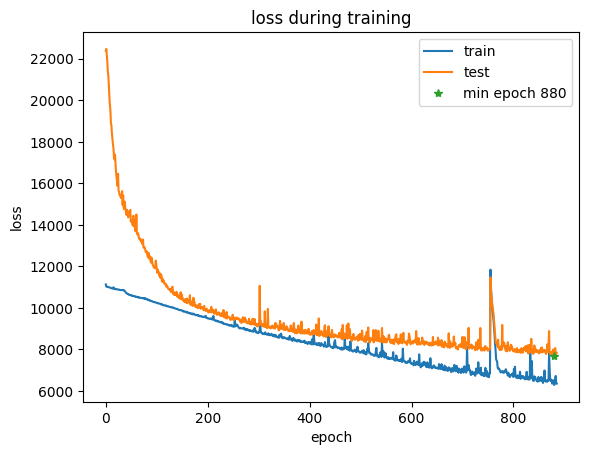

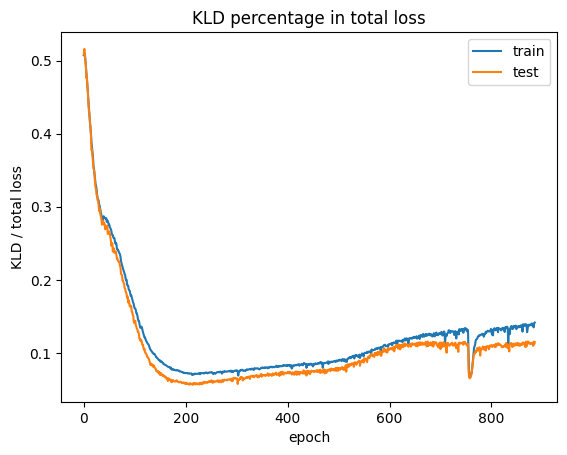

epoch 886: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6409.191, BCE: 5743.671, KLD: 929.329, KLD/(KLD+BCE): 13.927% beta:1.00
[valid] loss: 7889.567, BCE: 6984.626, KLD: 904.940, KLD/loss: 11.470%


epoch 887: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6488.805, BCE: 5824.378, KLD: 936.282, KLD/(KLD+BCE): 13.849% beta:1.00
[valid] loss: 7787.311, BCE: 6906.820, KLD: 880.491, KLD/loss: 11.307%


epoch 888: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6383.404, BCE: 5721.525, KLD: 930.026, KLD/(KLD+BCE): 13.982% beta:1.00
[valid] loss: 7868.967, BCE: 6985.205, KLD: 883.762, KLD/loss: 11.231%


epoch 889: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6411.032, BCE: 5745.314, KLD: 933.437, KLD/(KLD+BCE): 13.976% beta:1.00
[valid] loss: 7896.451, BCE: 7024.881, KLD: 871.570, KLD/loss: 11.037%


epoch 890: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6373.635, BCE: 5705.006, KLD: 933.139, KLD/(KLD+BCE): 14.057% beta:1.00
[valid] loss: 7928.181, BCE: 7043.862, KLD: 884.319, KLD/loss: 11.154%


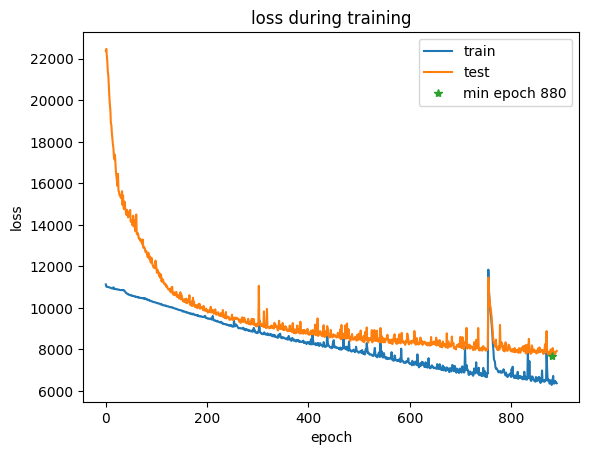

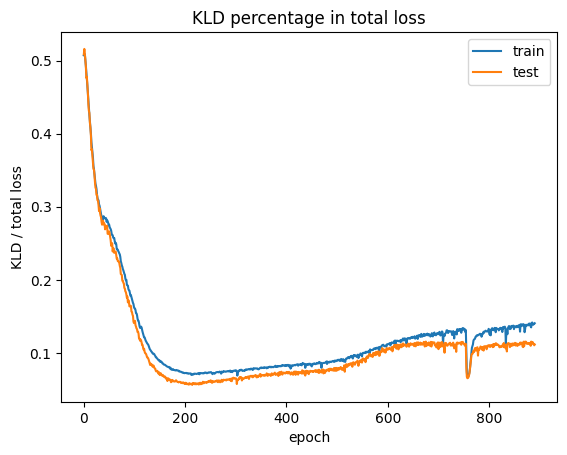

epoch 891: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6426.445, BCE: 5760.280, KLD: 935.478, KLD/(KLD+BCE): 13.971% beta:1.00
[valid] loss: 7850.156, BCE: 6955.913, KLD: 894.243, KLD/loss: 11.391%


epoch 892: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6335.797, BCE: 5666.508, KLD: 932.488, KLD/(KLD+BCE): 14.131% beta:1.00
[valid] loss: 7925.999, BCE: 7033.090, KLD: 892.909, KLD/loss: 11.266%


epoch 893: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6388.540, BCE: 5722.972, KLD: 935.174, KLD/(KLD+BCE): 14.046% beta:1.00
[valid] loss: 7970.078, BCE: 7075.971, KLD: 894.107, KLD/loss: 11.218%


epoch 894: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6396.339, BCE: 5725.163, KLD: 939.639, KLD/(KLD+BCE): 14.099% beta:1.00
[valid] loss: 7861.376, BCE: 6978.613, KLD: 882.763, KLD/loss: 11.229%


epoch 895: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6608.584, BCE: 5941.060, KLD: 935.273, KLD/(KLD+BCE): 13.601% beta:1.00
[valid] loss: 8043.416, BCE: 7145.903, KLD: 897.513, KLD/loss: 11.158%


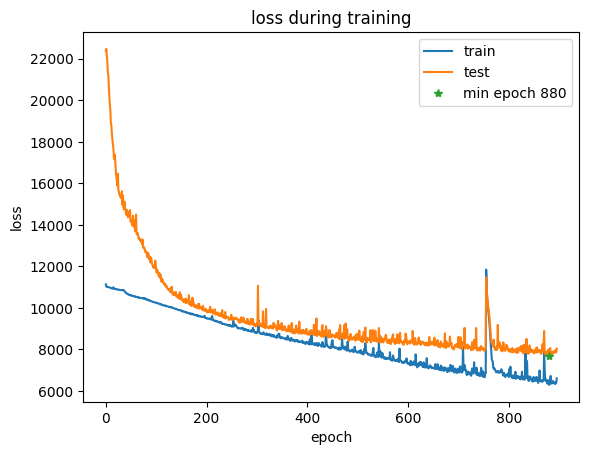

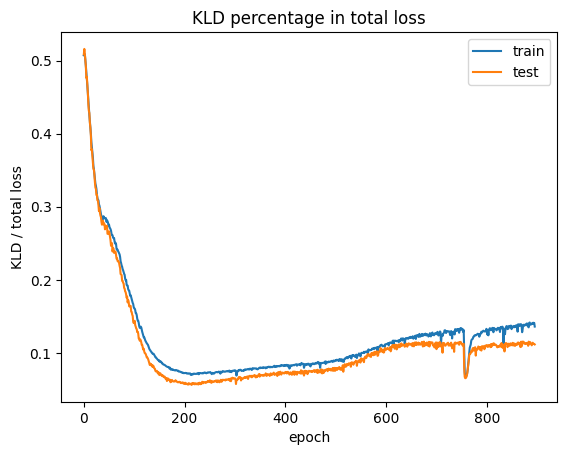

epoch 896: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6570.639, BCE: 5889.570, KLD: 953.413, KLD/(KLD+BCE): 13.933% beta:1.00
[valid] loss: 7885.598, BCE: 6993.357, KLD: 892.242, KLD/loss: 11.315%


epoch 897: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6388.366, BCE: 5717.018, KLD: 936.168, KLD/(KLD+BCE): 14.071% beta:1.00
[valid] loss: 7918.095, BCE: 7016.040, KLD: 902.055, KLD/loss: 11.392%


epoch 898: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6273.901, BCE: 5606.768, KLD: 927.339, KLD/(KLD+BCE): 14.192% beta:1.00
[valid] loss: 7857.224, BCE: 6972.950, KLD: 884.274, KLD/loss: 11.254%


epoch 899: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6736.465, BCE: 6049.485, KLD: 953.900, KLD/(KLD+BCE): 13.621% beta:1.00
[valid] loss: 8247.980, BCE: 7311.497, KLD: 936.483, KLD/loss: 11.354%


epoch 900: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6575.395, BCE: 5893.928, KLD: 950.716, KLD/(KLD+BCE): 13.890% beta:1.00
[valid] loss: 7884.076, BCE: 6970.656, KLD: 913.420, KLD/loss: 11.586%


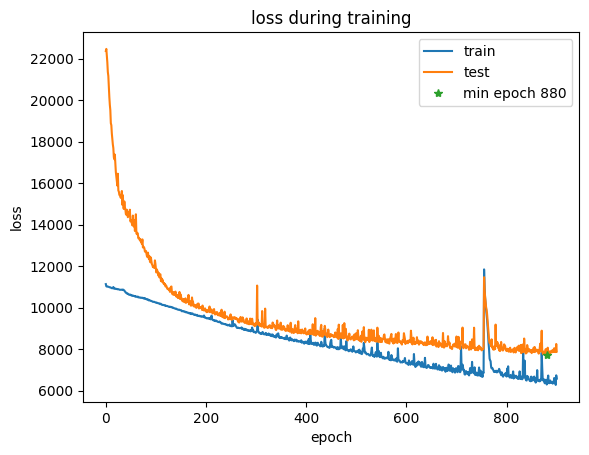

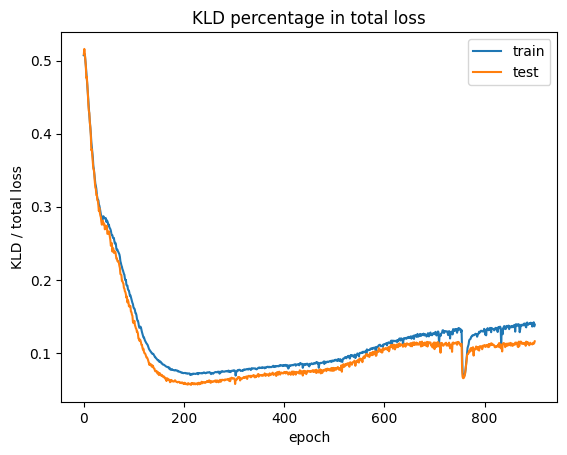

epoch 901: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6333.021, BCE: 5662.821, KLD: 934.152, KLD/(KLD+BCE): 14.160% beta:1.00
[valid] loss: 7651.720, BCE: 6766.837, KLD: 884.882, KLD/loss: 11.564%
model save at:  model_files_beta/ckpt_901.pt
remove  model_files_beta/ckpt_800.pt


epoch 902: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6370.364, BCE: 5695.237, KLD: 938.892, KLD/(KLD+BCE): 14.152% beta:1.00
[valid] loss: 7800.753, BCE: 6912.025, KLD: 888.729, KLD/loss: 11.393%


epoch 903: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6289.202, BCE: 5615.683, KLD: 935.667, KLD/(KLD+BCE): 14.282% beta:1.00
[valid] loss: 7697.407, BCE: 6801.035, KLD: 896.373, KLD/loss: 11.645%


epoch 904: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6354.277, BCE: 5682.194, KLD: 933.180, KLD/(KLD+BCE): 14.106% beta:1.00
[valid] loss: 7789.462, BCE: 6897.588, KLD: 891.875, KLD/loss: 11.450%


epoch 905: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6360.191, BCE: 5683.779, KLD: 938.112, KLD/(KLD+BCE): 14.167% beta:1.00
[valid] loss: 7917.953, BCE: 7020.911, KLD: 897.041, KLD/loss: 11.329%


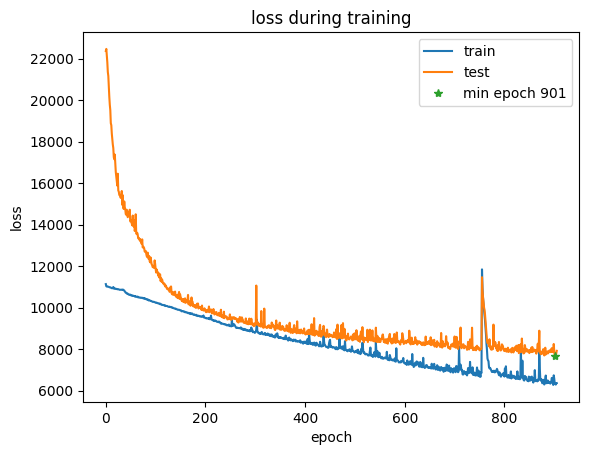

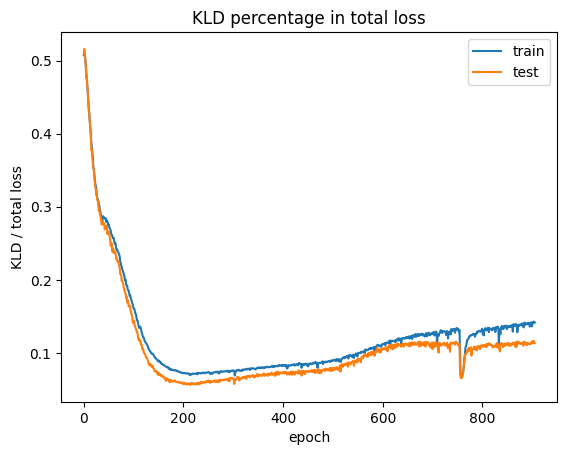

epoch 906: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6356.184, BCE: 5678.356, KLD: 943.185, KLD/(KLD+BCE): 14.244% beta:1.00
[valid] loss: 8723.118, BCE: 7816.219, KLD: 906.900, KLD/loss: 10.397%


epoch 907: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6428.296, BCE: 5754.581, KLD: 937.982, KLD/(KLD+BCE): 14.015% beta:1.00
[valid] loss: 7939.840, BCE: 7046.597, KLD: 893.243, KLD/loss: 11.250%


epoch 908: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6556.534, BCE: 5868.225, KLD: 955.426, KLD/(KLD+BCE): 14.002% beta:1.00
[valid] loss: 7846.447, BCE: 6939.135, KLD: 907.311, KLD/loss: 11.563%


epoch 909: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6390.713, BCE: 5704.928, KLD: 952.678, KLD/(KLD+BCE): 14.310% beta:1.00
[valid] loss: 7817.391, BCE: 6917.496, KLD: 899.895, KLD/loss: 11.511%


epoch 910: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6377.698, BCE: 5685.044, KLD: 955.232, KLD/(KLD+BCE): 14.385% beta:1.00
[valid] loss: 7901.105, BCE: 6991.564, KLD: 909.541, KLD/loss: 11.512%


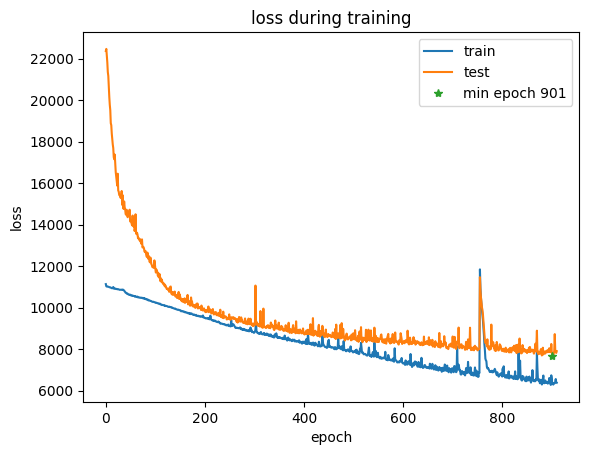

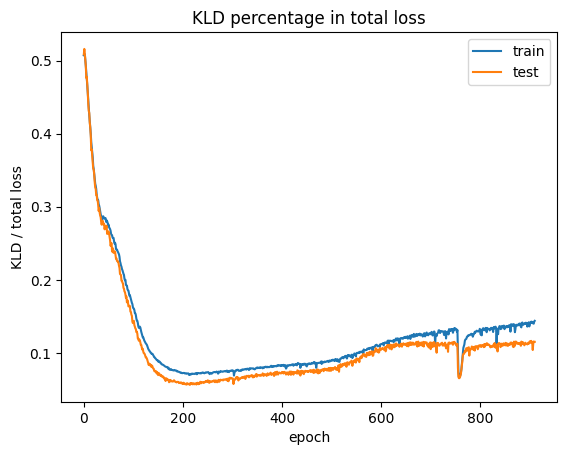

epoch 911: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6538.783, BCE: 5854.536, KLD: 955.796, KLD/(KLD+BCE): 14.034% beta:1.00
[valid] loss: 9382.062, BCE: 8542.989, KLD: 839.072, KLD/loss: 8.943%


epoch 912: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6730.030, BCE: 6053.888, KLD: 929.755, KLD/(KLD+BCE): 13.313% beta:1.00
[valid] loss: 7747.989, BCE: 6842.448, KLD: 905.541, KLD/loss: 11.687%


epoch 913: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6313.343, BCE: 5634.523, KLD: 942.927, KLD/(KLD+BCE): 14.336% beta:1.00
[valid] loss: 7704.821, BCE: 6796.611, KLD: 908.210, KLD/loss: 11.788%


epoch 914: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6271.364, BCE: 5586.751, KLD: 944.523, KLD/(KLD+BCE): 14.462% beta:1.00
[valid] loss: 7815.969, BCE: 6910.459, KLD: 905.510, KLD/loss: 11.585%


epoch 915: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6485.852, BCE: 5809.056, KLD: 935.106, KLD/(KLD+BCE): 13.865% beta:1.00
[valid] loss: 9653.186, BCE: 8735.423, KLD: 917.763, KLD/loss: 9.507%


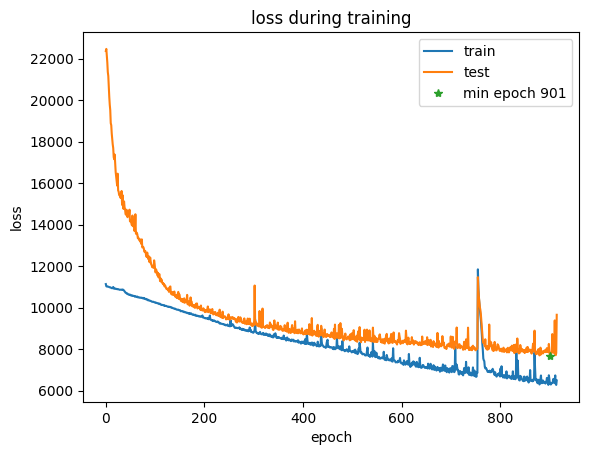

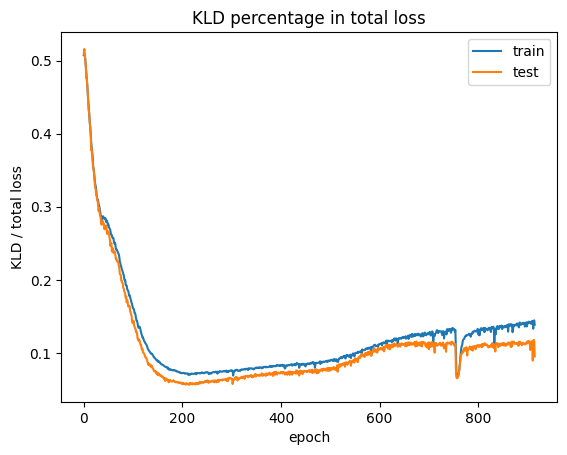

epoch 916: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6757.233, BCE: 6078.661, KLD: 939.155, KLD/(KLD+BCE): 13.382% beta:1.00
[valid] loss: 7802.490, BCE: 6923.781, KLD: 878.709, KLD/loss: 11.262%


epoch 917: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 7699.958, BCE: 6952.509, KLD: 1001.072, KLD/(KLD+BCE): 12.586% beta:1.00
[valid] loss: 10544.025, BCE: 9593.410, KLD: 950.615, KLD/loss: 9.016%


epoch 918: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 8153.041, BCE: 7488.721, KLD: 919.880, KLD/(KLD+BCE): 10.940% beta:1.00
[valid] loss: 8094.879, BCE: 7197.056, KLD: 897.823, KLD/loss: 11.091%


epoch 919: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6664.123, BCE: 5995.129, KLD: 923.605, KLD/(KLD+BCE): 13.349% beta:1.00
[valid] loss: 7770.602, BCE: 6877.157, KLD: 893.446, KLD/loss: 11.498%


epoch 920: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6523.180, BCE: 5848.736, KLD: 927.848, KLD/(KLD+BCE): 13.692% beta:1.00
[valid] loss: 7812.372, BCE: 6914.636, KLD: 897.736, KLD/loss: 11.491%


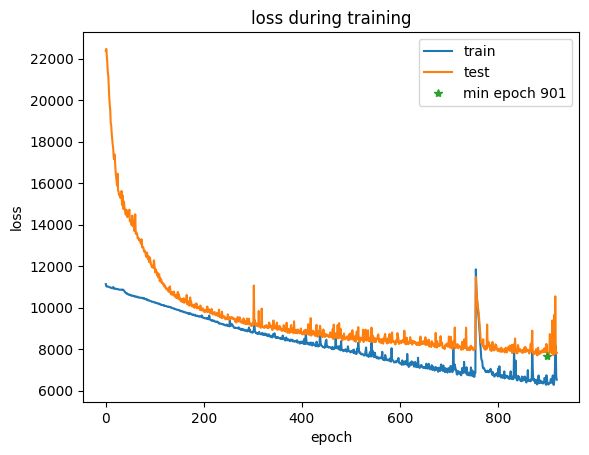

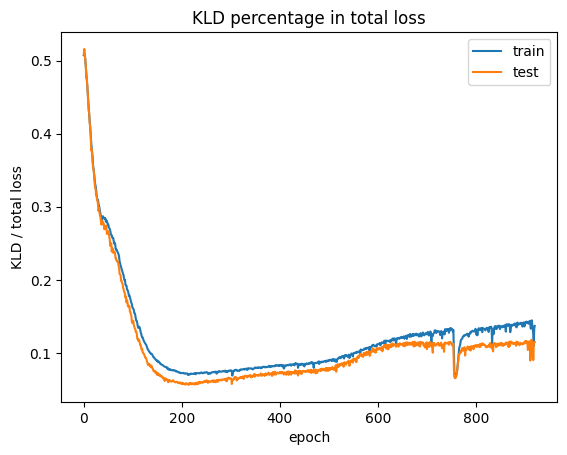

epoch 921: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6365.964, BCE: 5689.172, KLD: 932.103, KLD/(KLD+BCE): 14.077% beta:1.00
[valid] loss: 7701.250, BCE: 6810.488, KLD: 890.762, KLD/loss: 11.566%


epoch 922: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6410.162, BCE: 5743.664, KLD: 917.107, KLD/(KLD+BCE): 13.769% beta:1.00
[valid] loss: 7853.239, BCE: 6973.818, KLD: 879.422, KLD/loss: 11.198%


epoch 923: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6379.610, BCE: 5701.997, KLD: 929.558, KLD/(KLD+BCE): 14.017% beta:1.00
[valid] loss: 7870.384, BCE: 6983.289, KLD: 887.095, KLD/loss: 11.271%


epoch 924: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6563.789, BCE: 5888.455, KLD: 931.902, KLD/(KLD+BCE): 13.664% beta:1.00
[valid] loss: 7946.145, BCE: 7054.567, KLD: 891.577, KLD/loss: 11.220%


epoch 925: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6324.289, BCE: 5650.828, KLD: 930.376, KLD/(KLD+BCE): 14.137% beta:1.00
[valid] loss: 7696.774, BCE: 6808.919, KLD: 887.855, KLD/loss: 11.535%


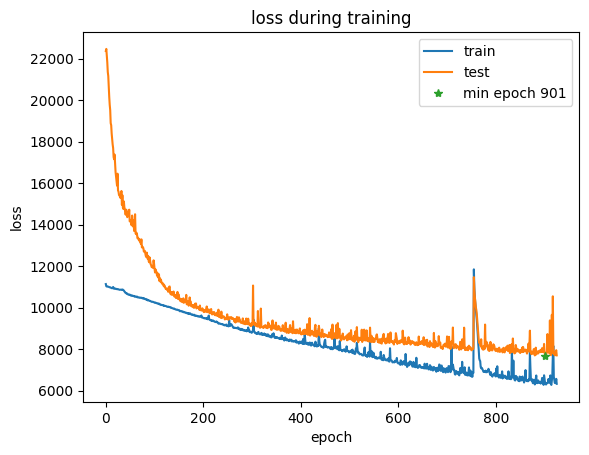

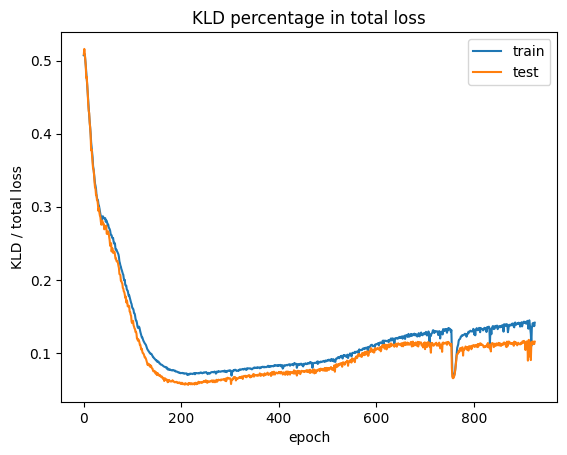

epoch 926: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6412.194, BCE: 5729.807, KLD: 938.516, KLD/(KLD+BCE): 14.074% beta:1.00
[valid] loss: 7776.180, BCE: 6879.738, KLD: 896.442, KLD/loss: 11.528%


epoch 927: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 6905.510, BCE: 6223.736, KLD: 938.173, KLD/(KLD+BCE): 13.099% beta:1.00
[valid] loss: 8098.540, BCE: 7216.822, KLD: 881.719, KLD/loss: 10.887%


epoch 928: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6568.914, BCE: 5879.003, KLD: 946.511, KLD/(KLD+BCE): 13.867% beta:1.00
[valid] loss: 8006.818, BCE: 7113.447, KLD: 893.372, KLD/loss: 11.158%


epoch 929: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6349.757, BCE: 5665.685, KLD: 938.265, KLD/(KLD+BCE): 14.208% beta:1.00
[valid] loss: 7694.866, BCE: 6817.110, KLD: 877.756, KLD/loss: 11.407%


epoch 930: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6191.275, BCE: 5513.501, KLD: 926.635, KLD/(KLD+BCE): 14.388% beta:1.00
[valid] loss: 7714.193, BCE: 6829.688, KLD: 884.505, KLD/loss: 11.466%


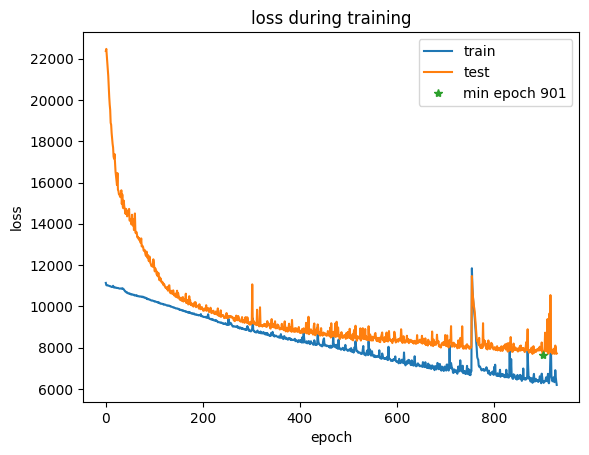

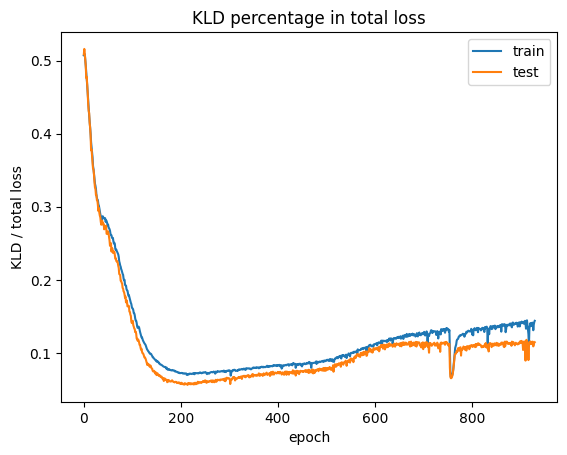

epoch 931: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6172.585, BCE: 5500.034, KLD: 923.865, KLD/(KLD+BCE): 14.382% beta:1.00
[valid] loss: 7766.759, BCE: 6860.614, KLD: 906.145, KLD/loss: 11.667%


epoch 932: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6275.300, BCE: 5599.822, KLD: 928.840, KLD/(KLD+BCE): 14.227% beta:1.00
[valid] loss: 8096.180, BCE: 7181.539, KLD: 914.640, KLD/loss: 11.297%


epoch 933: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6455.351, BCE: 5760.943, KLD: 959.581, KLD/(KLD+BCE): 14.278% beta:1.00
[valid] loss: 7967.468, BCE: 7051.492, KLD: 915.977, KLD/loss: 11.496%


epoch 934: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6536.297, BCE: 5839.102, KLD: 956.133, KLD/(KLD+BCE): 14.071% beta:1.00
[valid] loss: 7766.102, BCE: 6858.700, KLD: 907.402, KLD/loss: 11.684%


epoch 935: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6255.671, BCE: 5565.264, KLD: 948.064, KLD/(KLD+BCE): 14.556% beta:1.00
[valid] loss: 7764.526, BCE: 6877.224, KLD: 887.302, KLD/loss: 11.428%


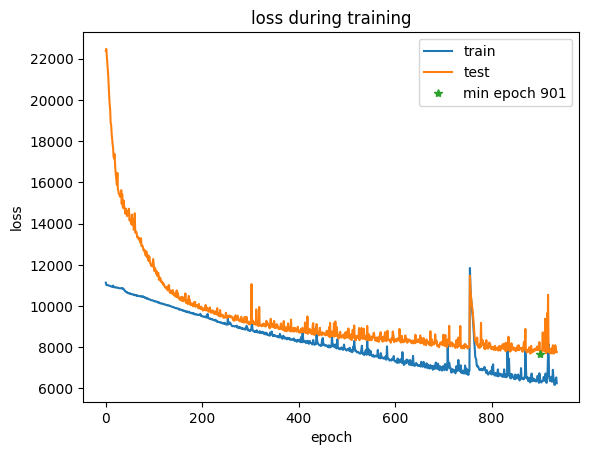

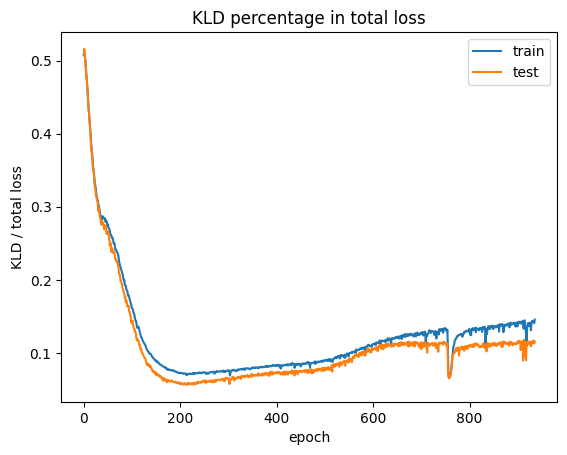

epoch 936: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6226.417, BCE: 5540.953, KLD: 938.101, KLD/(KLD+BCE): 14.479% beta:1.00
[valid] loss: 7773.468, BCE: 6882.914, KLD: 890.553, KLD/loss: 11.456%


epoch 937: 100%|██████████| 266/266 [00:26<00:00,  9.88it/s]


[train] loss: 6185.637, BCE: 5512.058, KLD: 931.816, KLD/(KLD+BCE): 14.460% beta:1.00
[valid] loss: 7715.277, BCE: 6843.165, KLD: 872.112, KLD/loss: 11.304%


epoch 938: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6198.518, BCE: 5516.595, KLD: 934.366, KLD/(KLD+BCE): 14.484% beta:1.00
[valid] loss: 7654.705, BCE: 6781.998, KLD: 872.707, KLD/loss: 11.401%


epoch 939: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6237.706, BCE: 5553.890, KLD: 933.869, KLD/(KLD+BCE): 14.394% beta:1.00
[valid] loss: 7802.295, BCE: 6932.458, KLD: 869.837, KLD/loss: 11.148%


epoch 940: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6200.016, BCE: 5520.928, KLD: 929.968, KLD/(KLD+BCE): 14.416% beta:1.00
[valid] loss: 7767.536, BCE: 6877.148, KLD: 890.388, KLD/loss: 11.463%


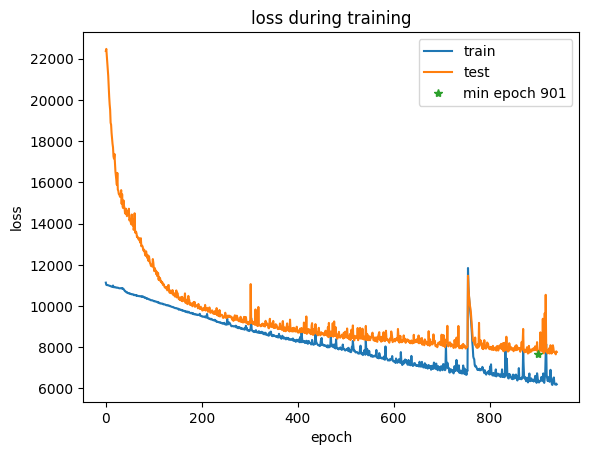

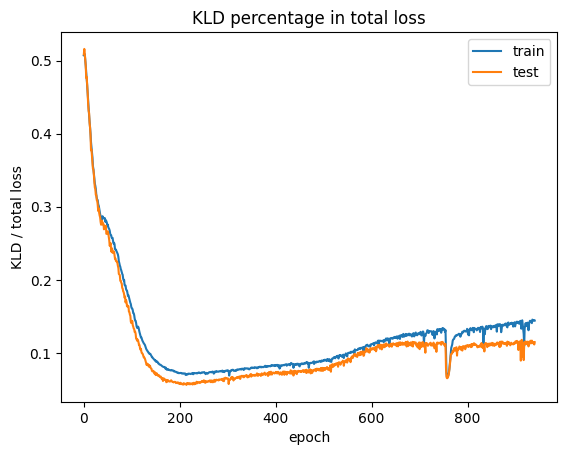

epoch 941: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6282.002, BCE: 5594.456, KLD: 940.700, KLD/(KLD+BCE): 14.394% beta:1.00
[valid] loss: 7982.234, BCE: 7090.313, KLD: 891.921, KLD/loss: 11.174%


epoch 942: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6292.058, BCE: 5603.832, KLD: 943.040, KLD/(KLD+BCE): 14.404% beta:1.00
[valid] loss: 7794.940, BCE: 6917.441, KLD: 877.499, KLD/loss: 11.257%


epoch 943: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6269.991, BCE: 5583.111, KLD: 935.111, KLD/(KLD+BCE): 14.346% beta:1.00
[valid] loss: 7851.822, BCE: 6964.631, KLD: 887.192, KLD/loss: 11.299%


epoch 944: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6273.335, BCE: 5586.102, KLD: 939.440, KLD/(KLD+BCE): 14.396% beta:1.00
[valid] loss: 8066.889, BCE: 7170.119, KLD: 896.770, KLD/loss: 11.117%


epoch 945: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6304.819, BCE: 5609.003, KLD: 953.962, KLD/(KLD+BCE): 14.536% beta:1.00
[valid] loss: 7700.092, BCE: 6791.519, KLD: 908.573, KLD/loss: 11.800%


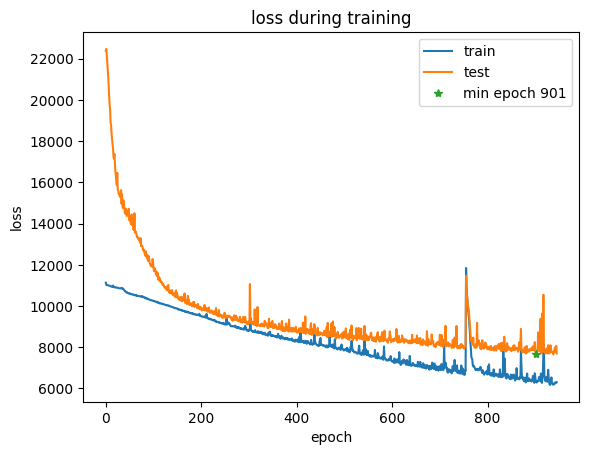

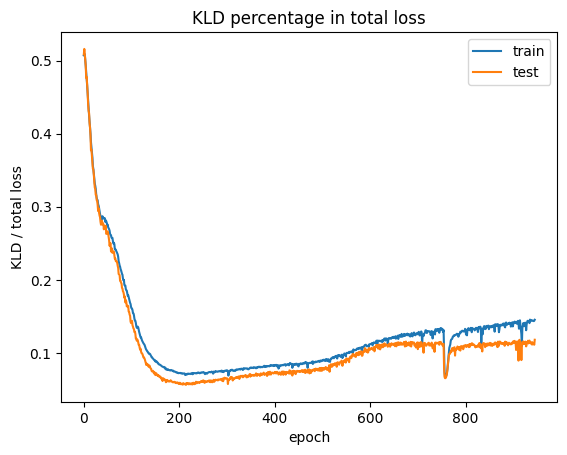

epoch 946: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6173.560, BCE: 5483.668, KLD: 944.330, KLD/(KLD+BCE): 14.691% beta:1.00
[valid] loss: 7987.463, BCE: 7086.695, KLD: 900.767, KLD/loss: 11.277%


epoch 947: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6225.446, BCE: 5537.133, KLD: 942.459, KLD/(KLD+BCE): 14.545% beta:1.00
[valid] loss: 7877.179, BCE: 6985.657, KLD: 891.522, KLD/loss: 11.318%


epoch 948: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6294.364, BCE: 5608.015, KLD: 937.395, KLD/(KLD+BCE): 14.321% beta:1.00
[valid] loss: 7898.855, BCE: 6986.361, KLD: 912.494, KLD/loss: 11.552%


epoch 949: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6206.302, BCE: 5515.670, KLD: 943.324, KLD/(KLD+BCE): 14.605% beta:1.00
[valid] loss: 7732.827, BCE: 6828.604, KLD: 904.222, KLD/loss: 11.693%


epoch 950: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6223.416, BCE: 5528.988, KLD: 949.081, KLD/(KLD+BCE): 14.651% beta:1.00
[valid] loss: 7915.548, BCE: 7024.442, KLD: 891.106, KLD/loss: 11.258%


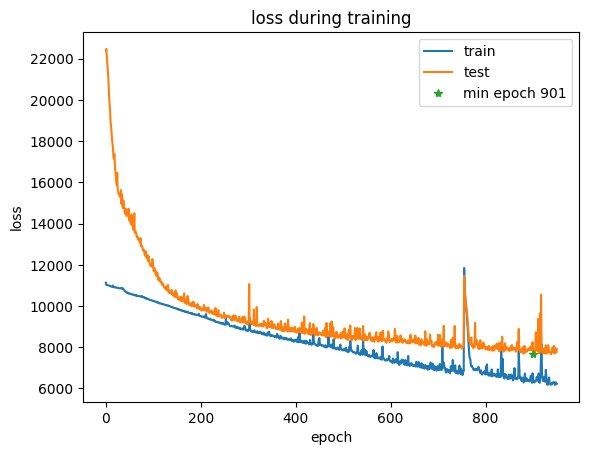

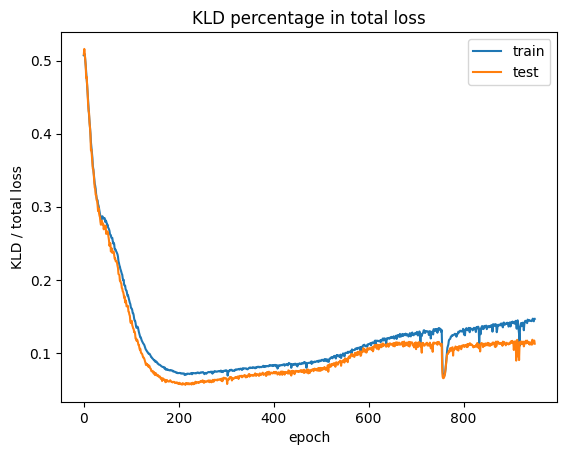

epoch 951: 100%|██████████| 266/266 [00:26<00:00,  9.89it/s]


[train] loss: 6134.074, BCE: 5445.709, KLD: 941.237, KLD/(KLD+BCE): 14.737% beta:1.00
[valid] loss: 7937.987, BCE: 7039.719, KLD: 898.268, KLD/loss: 11.316%


epoch 952: 100%|██████████| 266/266 [00:26<00:00,  9.90it/s]


[train] loss: 6426.387, BCE: 5727.971, KLD: 947.505, KLD/(KLD+BCE): 14.194% beta:1.00
[valid] loss: 7849.586, BCE: 6964.213, KLD: 885.373, KLD/loss: 11.279%
early stop, loss no decrease


In [44]:

if argmin_epoch != -1:
    model.load_state_dict(torch.load(model_saved_names[-1],
                                    map_location=device))
start_epoch = argmin_epoch+1

for epoch in range(start_epoch, start_epoch + epochs):
    train_dict[epoch], _, _, train_kld[epoch] = train(
                            epoch, beta_kl=beta_np_cyc)

    valid_dict[epoch], _, _, valid_kld[epoch] = test(
                            epoch, test_loader=valid_loader)

    if epoch != 0 and epoch % 5 == 0:
        plot_loss(train_dict, valid_dict)
        plot_kld(train_kld, valid_kld)

    argmin_epoch, min_loss = get_min(valid_dict)

    if epoch == argmin_epoch and epoch > 10:
        model_name = model_path+f'ckpt_{str(argmin_epoch)}.pt'
        torch.save(model.state_dict(), model_name)
        print('model save at: ',  model_name)
        model_saved_names.append(model_name)
        while len(model_saved_names) > 10:  # only reserve 10 models
            try:
                remove_model_name = model_saved_names.pop(0)
                print('remove ', remove_model_name)
                os.remove(remove_model_name)
            except:
                print(f'error when delete {model_saved_names[0]}')
    else:
        if epoch - argmin_epoch > 50:
            print('early stop, loss no decrease')
            break
        if valid_dict[epoch] / min_loss > 3:
            print(f'early stop, loss increase')
            break

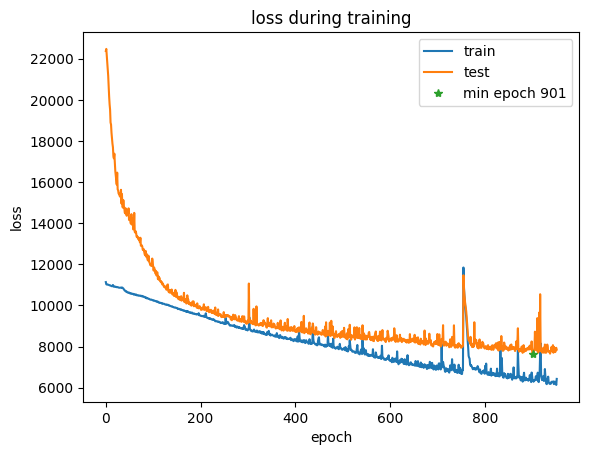

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
import pickle
from google.colab import files

# plot_loss(train_dict, valid_dict)
#         plot_kld(train_kld, valid_kld)
dict_all = {'train_loss': train_dict,
            'valid_loss': valid_dict,
            'model_in_dim': in_dim,
            'model_name': model_name}

with open('train_info_with_sigmoid.pkl', 'wb') as f:
    pickle.dump(dict_all, f)

plot_loss(dict_all['train_loss'], dict_all['valid_loss'])

files.download('train_info_with_sigmoid.pkl')
files.download(model_name)

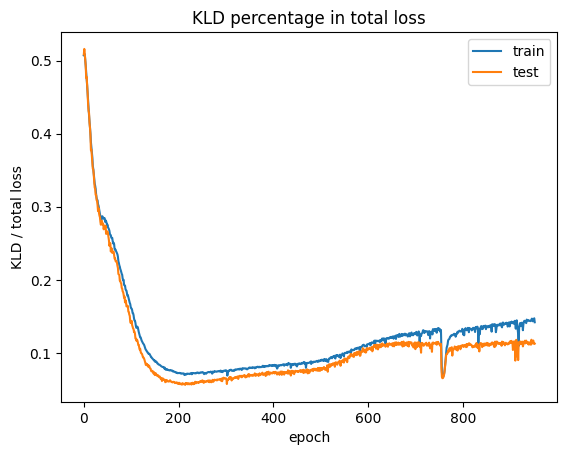

In [46]:
plot_kld(train_kld, valid_kld)

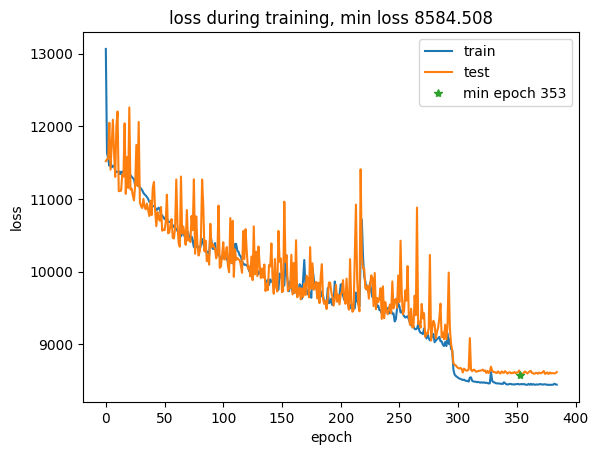

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('/content/a_inhibitor_design/data/test.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
train_info_dict.keys()

dict_keys(['train_loss', 'valid_loss', 'model_in_dim', 'model_name'])

training without beta


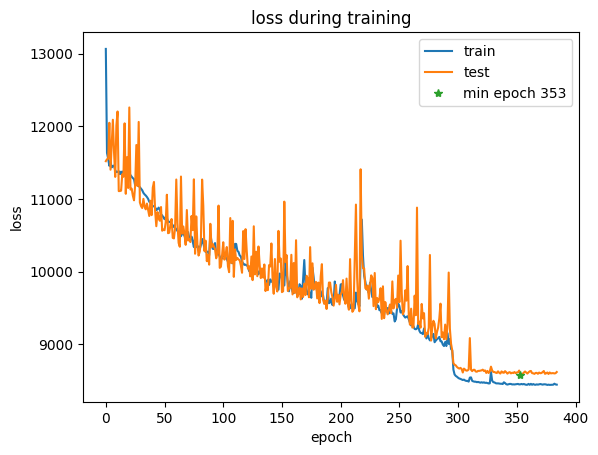

training with beta


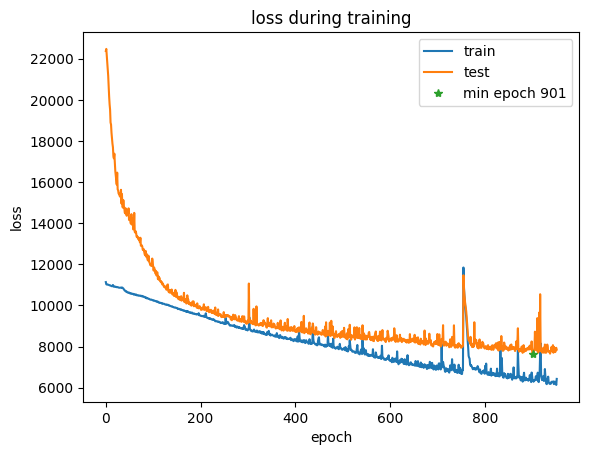

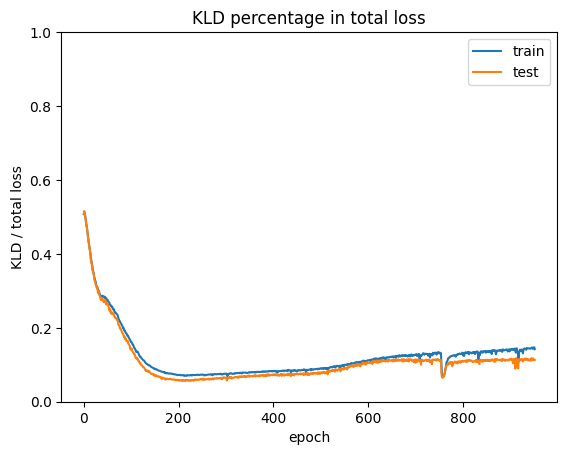

In [56]:
print('training without beta')
saved_path = '/content/drive/MyDrive/A_MODEL/chemVAE_M1/'
with open(saved_path +'train_info.pkl', 'rb') as f:
    dict_all = pickle.load(f)
plot_loss(dict_all['train_loss'], dict_all['valid_loss'])

print('training with beta')
train_info_dir = '/content/drive/MyDrive/A_MODEL/chemVAE_M1_8_20/train_info_with_sigmoid.pkl'
with open(train_info_dir, 'rb') as f:
    train_info_dict = pickle.load(f)
plot_loss(train_info_dict['train_loss'], train_info_dict['valid_loss'])
plot_kld(train_kld, valid_kld, range=1)

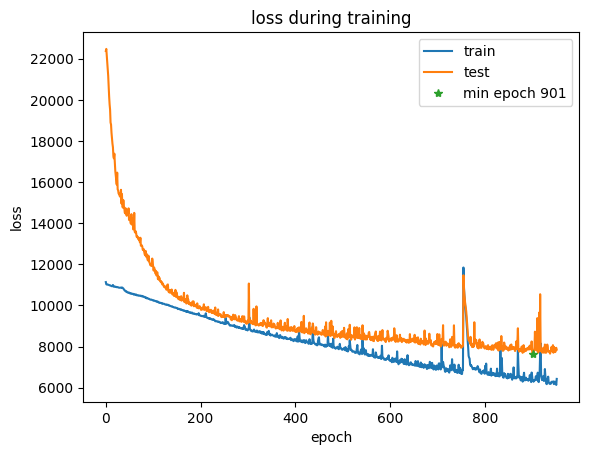

In [52]:
# plot_kld(train_kld, valid_kld)

def plot_kld(train_kld, valid_kld, range=None):
    fig = plt.figure()
    plt.plot(list(train_kld.keys()), list(train_kld.values()), label='train')
    plt.plot(list(valid_kld.keys()), list(valid_kld.values()), label='test')
    if range!=None:
        plt.ylim([0,1])
    plt.xlabel('epoch')
    plt.ylabel('KLD / total loss')
    plt.title('KLD percentage in total loss')
    plt.legend()
    plt.show()

66
[C][C][=C][N][=C][Branch2][Ring1][S][N][=C][Ring1][=Branch1][N][C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][S][=Branch1][C][=O][=Branch1][C][=O][N][C][Branch1][C][C][Branch1][C][C][C][N][C][=C][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][O][C][C][N][C][C][C][C][Ring1][Branch1]


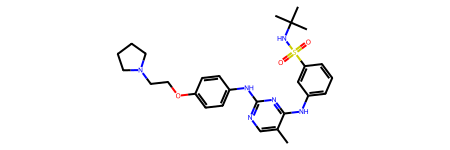

[C][C][=C][N][=C][Branch2][Ring1][=N][N][=C][Ring1][=Branch1][C][=C][=Branch1][=C][Branch1][C][=C][C][N][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][nop]


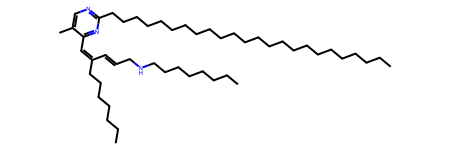

In [77]:
model_beta_path = '/content/drive/MyDrive/A_MODEL/chemVAE_M1_8_20/ckpt_901.pt'
in_dim = train_info_dict['model_in_dim']
model_beta = MolecularVAE(in_dim)
model_beta.load_state_dict(torch.load(model_beta_path,
                                    map_location=device))
alphabet_path = '/content/drive/MyDrive/A_MODEL/chemVAE_M1_8_20/alphabet,pkl'
with open(alphabet_path, 'rb') as f:
    alphabet_beta = pickle.load(f)
print(len(alphabet_beta))
token2index = {s: i for i, s in enumerate(alphabet_beta)}

max_len = 120
fed = 'Cc1cnc(nc1Nc1cccc(c1)S(=O)(=O)NC(C)(C)C)Nc1ccc(cc1)OCCN1CCCC1'
selfi = sf.encoder(fed)
label, one_hot = sf.selfies_to_encoding(
                selfies = selfi, vocab_stoi = token2index,
                pad_to_len = max_len, enc_type='both')
one_hot = torch.Tensor(one_hot).float()
input = one_hot.view(1,one_hot.shape[0], one_hot.shape[1])
output = model_beta(input)
pos = torch.argmax(output, dim=2)
assert pos.view(-1).shape[0] == max_len

cur_selfie = ''
end_token = '[nop]'
assert end_token in alphabet_re
end_num = __t2i_sf[end_token]
for i in pos.view(-1).detach().numpy():
    cur_selfie+= alphabet_re[i]
    if i == end_num:
        break
from IPython.display import display
from rdkit import Chem
M = Chem.MolFromSmiles
print(selfi)
display(M(sf.decoder(selfi)))
print(cur_selfie)
display(M(sf.decoder(cur_selfie)))

In [74]:
token2index == __t2i_sf

True

<All keys matched successfully>

dict_keys(['labels', 'one_hots', 'alphabet'])

[C][C][=C][N][=C][Branch2][Ring1][S][N][=C][Ring1][=Branch1][N][C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][S][=Branch1][C][=O][=Branch1][C][=O][N][C][Branch1][C][C][Branch1][C][C][C][N][C][=C][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][O][C][C][N][C][C][C][C][Ring1][Branch1]


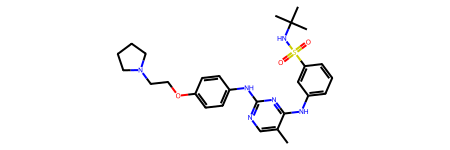

[C][C][=C][N][=C][Branch2][Ring1][=Branch1][C][=C][Ring1][=Branch1][C][=C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][nop]


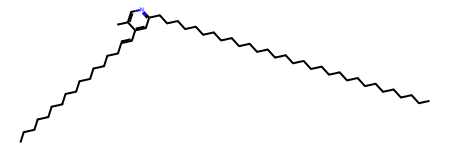

In [76]:
# /content/drive/MyDrive/A_MODEL/chemVAE_M1/test.pt
dict_re = torch.load('/content/a_inhibitor_design/data/test.pt')
alphabet_re = dict_re['alphabet']
print(dict_re.keys())
__t2i_sf = {s: i for i, s in enumerate(alphabet_re)}
max_len = 120
fed = 'Cc1cnc(nc1Nc1cccc(c1)S(=O)(=O)NC(C)(C)C)Nc1ccc(cc1)OCCN1CCCC1'
selfi = sf.encoder(fed)
label, one_hot = sf.selfies_to_encoding(
                selfies = selfi, vocab_stoi = __t2i_sf,
                pad_to_len = max_len, enc_type='both')
one_hot = torch.Tensor(one_hot).float()
input = one_hot.view(1,one_hot.shape[0], one_hot.shape[1])

model_reload_path = '/content/drive/MyDrive/A_MODEL/chemVAE_M1/ckpt_353.pt'
in_dim = dict_all['model_in_dim']
model_re = MolecularVAE(in_dim)
model_re.load_state_dict(torch.load(model_reload_path,
                                     map_location=device))
output = model_re(input)

pos = torch.argmax(output, dim=2)
assert pos.view(-1).shape[0] == max_len

cur_selfie = ''
end_token = '[nop]'
assert end_token in alphabet_re
end_num = __t2i_sf[end_token]
for i in pos.view(-1).detach().numpy():
    cur_selfie+= alphabet_re[i]
    if i == end_num:
        break
from IPython.display import display
from rdkit import Chem
M = Chem.MolFromSmiles
print(selfi)
display(M(sf.decoder(selfi)))
print(cur_selfie)
display(M(sf.decoder(cur_selfie)))

'[C][C][=C][N][=C][Branch2][Ring1][Ring1][N][=C][Ring1][=Branch1][C][=C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][nop]'

In [ ]:
print('fedratinib true selfie')
print(selfi)
print('model output')
print(cur_selfie)

fedratinib true selfie
[C][C][=C][N][=C][Branch2][Ring1][S][N][=C][Ring1][=Branch1][N][C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][S][=Branch1][C][=O][=Branch1][C][=O][N][C][Branch1][C][C][Branch1][C][C][C][N][C][=C][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][O][C][C][N][C][C][C][C][Ring1][Branch1]
model output
[C][C][=C][N][=C][Branch2][Ring1][Ring1][N][=C][Ring1][=Branch1][C][=C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][nop]


In [ ]:
with open('/content/drive/MyDrive/A_MODEL/chemVAE_M1/alphabet.pkl', 'wb') as f:
    pickle.dump(alphabet, f)

In [ ]:
end_token = '[nop]'
end_token in alphabet_re

True

'CC1=CN=C(N=C1NC2=CC=CC(=C2)S(=O)(=O)NC(C)(C)C)NC3=CC=C(C=C3)OCCN4CCCC4'

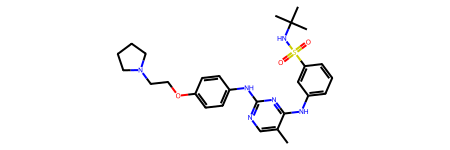

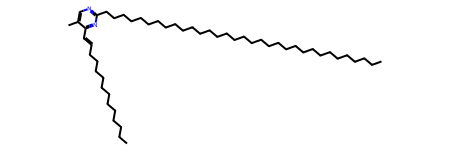